In [25]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
import torch
import numpy as np
from data import DataLoader, get_sampled_data
from model import NNModel
from model import MLPModelTest
from trainer import ModelTrainer
from sklearn.model_selection import train_test_split
from utils import plot_loss
from utils import write_results_to_file
from utils import save_and_plot_redshifts
from evaluation import ModelEvaluator
from sklearn.linear_model import LinearRegression
import os

In [27]:
parameter = "logM"  
modality = "VIS_NISP" # set "VIS" or "VIS_NISP"

In [28]:
# Paths and files
if modality == 'VIS':
    folder_path = "/home/msiudek/myspace/projects/EUCLID/Q1/astropt/VIS"  
elif modality == 'VIS_NISP':
    folder_path = "/home/msiudek/myspace/projects/EUCLID/Q1/astropt/VIS_NISP" 
else:
    print("The modality is not defined")

In [29]:
train_embedding_file = "zss_64t_mean.npy"
train_idx_file = "idxs_64t_mean.npy"
test_embedding_file = "zss_64t_mean_test.npy"
test_idx_file = "idxs_64t_mean_test.npy"

catalog_path = "/home/msiudek/myspace/projects/EUCLID/Q1/Q1_data/EuclidMorphPhysPropSpecZ.fits" 

train_txt_file = os.path.join(folder_path, "train.txt")
test_txt_file = os.path.join(folder_path, "test.txt")

In [30]:
# Load training data
training_loader = DataLoader(folder_path, train_embedding_file, train_idx_file, catalog_path, "train.txt")
train_embeddings, train_redshifts = training_loader.load_data(parameter)

In [31]:
# Load test data
test_loader = DataLoader(folder_path, test_embedding_file, test_idx_file, catalog_path, "test.txt")
test_embeddings, test_redshifts = test_loader.load_data(parameter)

In [32]:
# Combine train and test for easier sampling
embeddings = np.concatenate([train_embeddings,test_embeddings])
redshifts = np.concatenate([train_redshifts, test_redshifts])
print(embeddings.shape)

(14129, 768)


Training model for 100% of the data...
Training run 1/1 for 100% of the data...
Sample size for 100%: 14129


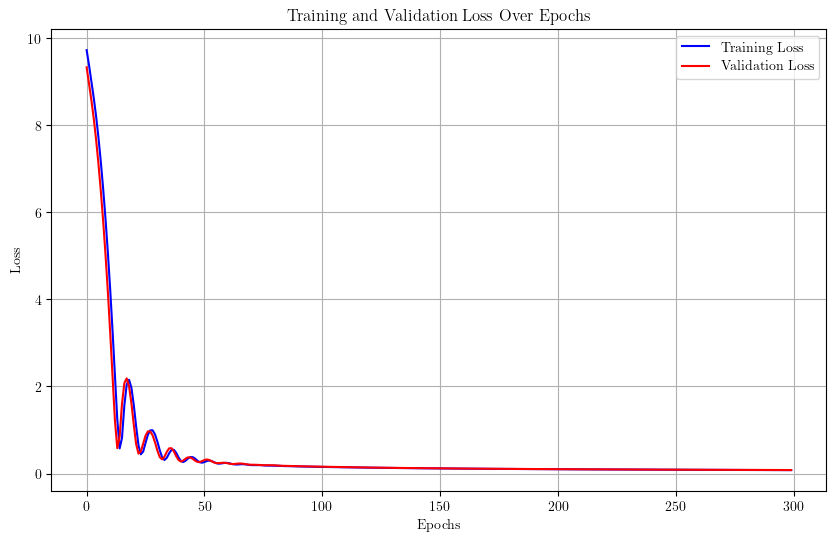

Metrics for 100% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(0.17070253), 'mae': np.float32(0.29773927), 'r2': np.float64(0.768947184085846), 'bias': np.float32(0.0041289865), 'nmad': np.float32(0.02899898), 'sigma_68': np.float32(0.031467274), 'outlier_fraction': np.float64(0.9200283085633404)}
Metrics Across Runs:
mse: 0.1707 ± 0.0000
mae: 0.2977 ± 0.0000
r2: 0.7689 ± 0.0000
bias: 0.0041 ± 0.0000
nmad: 0.0290 ± 0.0000
sigma_68: 0.0315 ± 0.0000
outlier_fraction: 0.9200 ± 0.0000


In [33]:
# Set the number of Monte Carlo runs
n_mc_runs = 1
percentages = [100]  
results = {}
epochs = 300
lr = 0.001
task_type = "regression"  # or "classification"
model_name = "MLP"
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        
        # Standardize inputs
        #scaler = StandardScaler()
        #X_train = scaler.fit_transform(X_train)
        #X_val = scaler.transform(X_val)
        
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)
        
        # Re-initialize the model for each run
        model = MLPModelTest(input_dim=X_train.shape[1], task_type=task_type)
        
        # Train model
        trainer = ModelTrainer(model, lr=lr, epochs=epochs, task_type=task_type)
        train_losses, val_losses = trainer.train(X_train, y_train, X_val, y_val)
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
        
        plot_loss(train_losses, val_losses, epochs=epochs)
        
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        if i == 0:
            # Save and plot the redshifts
            save_and_plot_redshifts(
            true_redshifts=y_val.numpy(),
            predicted_redshifts=predictions,  
            percentage=percentage,
            modality=modality,
            parameter=parameter,
            model_name=model_name
            )
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    


In [34]:
# Set the number of Monte Carlo runs
n_mc_runs = 50
percentages = [1,5,10,20,50,80,100]  
results = {}
epochs = 300
lr = 0.001
task_type = "regression"  # or "classification"

## MLP model 
~a la fine-tuning

In [35]:
model_name = "MLP"

In [36]:
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        
        # Standardize inputs
        #scaler = StandardScaler()
        #X_train = scaler.fit_transform(X_train)
        #X_val = scaler.transform(X_val)
        
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)
        
        # Re-initialize the model for each run
        model = MLPModelTest(input_dim=X_train.shape[1], task_type=task_type)
        
        # Train model
        trainer = ModelTrainer(model, lr=lr, epochs=epochs, task_type=task_type)
        train_losses, val_losses = trainer.train(X_train, y_train, X_val, y_val)
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
        
        #plot_loss(train_losses, val_losses, epochs=epochs)
        
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        if i == 0:
            # Save and plot the redshifts
            save_and_plot_redshifts(
            true_redshifts=y_val.numpy(),
            predicted_redshifts=predictions,  
            percentage=percentage,
            modality=modality,
            parameter=parameter,
            model_name=model_name
            )
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    
    # Write results to file
    write_results_to_file(model_name,percentage, modality, parameter, final_metrics_aggregated, metrics_mean_aggregated, metrics_std_aggregated)

Training model for 1% of the data...
Training run 1/50 for 1% of the data...
Sample size for 1%: 141
Training run 2/50 for 1% of the data...
Sample size for 1%: 141
Training run 3/50 for 1% of the data...
Sample size for 1%: 141
Training run 4/50 for 1% of the data...
Sample size for 1%: 141
Training run 5/50 for 1% of the data...
Sample size for 1%: 141
Training run 6/50 for 1% of the data...
Sample size for 1%: 141
Training run 7/50 for 1% of the data...
Sample size for 1%: 141
Training run 8/50 for 1% of the data...
Sample size for 1%: 141
Training run 9/50 for 1% of the data...
Sample size for 1%: 141
Training run 10/50 for 1% of the data...
Sample size for 1%: 141
Training run 11/50 for 1% of the data...
Sample size for 1%: 141
Training run 12/50 for 1% of the data...
Sample size for 1%: 141
Training run 13/50 for 1% of the data...
Sample size for 1%: 141
Training run 14/50 for 1% of the data...
Sample size for 1%: 141
Training run 15/50 for 1% of the data...
Sample size for 1%: 1

Training run 10/50 for 10% of the data...
Sample size for 10%: 1412
Training run 11/50 for 10% of the data...
Sample size for 10%: 1412
Training run 12/50 for 10% of the data...
Sample size for 10%: 1412
Training run 13/50 for 10% of the data...
Sample size for 10%: 1412
Training run 14/50 for 10% of the data...
Sample size for 10%: 1412
Training run 15/50 for 10% of the data...
Sample size for 10%: 1412
Training run 16/50 for 10% of the data...
Sample size for 10%: 1412
Training run 17/50 for 10% of the data...
Sample size for 10%: 1412
Training run 18/50 for 10% of the data...
Sample size for 10%: 1412
Training run 19/50 for 10% of the data...
Sample size for 10%: 1412
Training run 20/50 for 10% of the data...
Sample size for 10%: 1412
Training run 21/50 for 10% of the data...
Sample size for 10%: 1412
Training run 22/50 for 10% of the data...
Sample size for 10%: 1412
Training run 23/50 for 10% of the data...
Sample size for 10%: 1412
Training run 24/50 for 10% of the data...
Sample

Training run 15/50 for 50% of the data...
Sample size for 50%: 7064
Training run 16/50 for 50% of the data...
Sample size for 50%: 7064
Training run 17/50 for 50% of the data...
Sample size for 50%: 7064
Training run 18/50 for 50% of the data...
Sample size for 50%: 7064
Training run 19/50 for 50% of the data...
Sample size for 50%: 7064
Training run 20/50 for 50% of the data...
Sample size for 50%: 7064
Training run 21/50 for 50% of the data...
Sample size for 50%: 7064
Training run 22/50 for 50% of the data...
Sample size for 50%: 7064
Training run 23/50 for 50% of the data...
Sample size for 50%: 7064
Training run 24/50 for 50% of the data...
Sample size for 50%: 7064
Training run 25/50 for 50% of the data...
Sample size for 50%: 7064
Training run 26/50 for 50% of the data...
Sample size for 50%: 7064
Training run 27/50 for 50% of the data...
Sample size for 50%: 7064
Training run 28/50 for 50% of the data...
Sample size for 50%: 7064
Training run 29/50 for 50% of the data...
Sample

Training run 19/50 for 100% of the data...
Sample size for 100%: 14129
Training run 20/50 for 100% of the data...
Sample size for 100%: 14129
Training run 21/50 for 100% of the data...
Sample size for 100%: 14129
Training run 22/50 for 100% of the data...
Sample size for 100%: 14129
Training run 23/50 for 100% of the data...
Sample size for 100%: 14129
Training run 24/50 for 100% of the data...
Sample size for 100%: 14129
Training run 25/50 for 100% of the data...
Sample size for 100%: 14129
Training run 26/50 for 100% of the data...
Sample size for 100%: 14129
Training run 27/50 for 100% of the data...
Sample size for 100%: 14129
Training run 28/50 for 100% of the data...
Sample size for 100%: 14129
Training run 29/50 for 100% of the data...
Sample size for 100%: 14129
Training run 30/50 for 100% of the data...
Sample size for 100%: 14129
Training run 31/50 for 100% of the data...
Sample size for 100%: 14129
Training run 32/50 for 100% of the data...
Sample size for 100%: 14129
Traini

## Simple linear regression
just straight lines

In [38]:
model_name = "LR"

In [39]:
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)
        
        # Re-initialize the model for each run
        #model = RandomForestRegressor(random_state=42)
        #model.fit(X_train, y_train)

        # Fit linear regression model
        model = LinearRegression()
        model.fit(X_train, y_train)  
        
        # Train model
        #trainer = ModelTrainer(model, lr=lr, epochs=epochs, task_type=task_type)
        #train_losses, val_losses = trainer.train(X_train, y_train, X_val, y_val)
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
                
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        if i == 0:
            # Save and plot the redshifts
            save_and_plot_redshifts(
            true_redshifts=y_val.numpy(),
            predicted_redshifts=predictions,  
            percentage=percentage,
            modality=modality,
            parameter=parameter,
            model_name=model_name
            )
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    
    # Write results to file
    write_results_to_file(model_name,percentage, modality, parameter, final_metrics_aggregated, metrics_mean_aggregated, metrics_std_aggregated)

Training model for 1% of the data...
Training run 1/50 for 1% of the data...
Sample size for 1%: 141
Training run 2/50 for 1% of the data...
Sample size for 1%: 141
Training run 3/50 for 1% of the data...
Sample size for 1%: 141
Training run 4/50 for 1% of the data...
Sample size for 1%: 141
Training run 5/50 for 1% of the data...
Sample size for 1%: 141
Training run 6/50 for 1% of the data...
Sample size for 1%: 141
Training run 7/50 for 1% of the data...
Sample size for 1%: 141
Training run 8/50 for 1% of the data...
Sample size for 1%: 141
Training run 9/50 for 1% of the data...
Sample size for 1%: 141
Training run 10/50 for 1% of the data...
Sample size for 1%: 141
Training run 11/50 for 1% of the data...
Sample size for 1%: 141
Training run 12/50 for 1% of the data...
Sample size for 1%: 141
Training run 13/50 for 1% of the data...
Sample size for 1%: 141
Training run 14/50 for 1% of the data...
Sample size for 1%: 141
Training run 15/50 for 1% of the data...
Sample size for 1%: 1

Training run 10/50 for 10% of the data...
Sample size for 10%: 1412
Training run 11/50 for 10% of the data...
Sample size for 10%: 1412
Training run 12/50 for 10% of the data...
Sample size for 10%: 1412
Training run 13/50 for 10% of the data...
Sample size for 10%: 1412
Training run 14/50 for 10% of the data...
Sample size for 10%: 1412
Training run 15/50 for 10% of the data...
Sample size for 10%: 1412
Training run 16/50 for 10% of the data...
Sample size for 10%: 1412
Training run 17/50 for 10% of the data...
Sample size for 10%: 1412
Training run 18/50 for 10% of the data...
Sample size for 10%: 1412
Training run 19/50 for 10% of the data...
Sample size for 10%: 1412
Training run 20/50 for 10% of the data...
Sample size for 10%: 1412
Training run 21/50 for 10% of the data...
Sample size for 10%: 1412
Training run 22/50 for 10% of the data...
Sample size for 10%: 1412
Training run 23/50 for 10% of the data...
Sample size for 10%: 1412
Training run 24/50 for 10% of the data...
Sample

Training run 15/50 for 50% of the data...
Sample size for 50%: 7064
Training run 16/50 for 50% of the data...
Sample size for 50%: 7064
Training run 17/50 for 50% of the data...
Sample size for 50%: 7064
Training run 18/50 for 50% of the data...
Sample size for 50%: 7064
Training run 19/50 for 50% of the data...
Sample size for 50%: 7064
Training run 20/50 for 50% of the data...
Sample size for 50%: 7064
Training run 21/50 for 50% of the data...
Sample size for 50%: 7064
Training run 22/50 for 50% of the data...
Sample size for 50%: 7064
Training run 23/50 for 50% of the data...
Sample size for 50%: 7064
Training run 24/50 for 50% of the data...
Sample size for 50%: 7064
Training run 25/50 for 50% of the data...
Sample size for 50%: 7064
Training run 26/50 for 50% of the data...
Sample size for 50%: 7064
Training run 27/50 for 50% of the data...
Sample size for 50%: 7064
Training run 28/50 for 50% of the data...
Sample size for 50%: 7064
Training run 29/50 for 50% of the data...
Sample

Training run 19/50 for 100% of the data...
Sample size for 100%: 14129
Training run 20/50 for 100% of the data...
Sample size for 100%: 14129
Training run 21/50 for 100% of the data...
Sample size for 100%: 14129
Training run 22/50 for 100% of the data...
Sample size for 100%: 14129
Training run 23/50 for 100% of the data...
Sample size for 100%: 14129
Training run 24/50 for 100% of the data...
Sample size for 100%: 14129
Training run 25/50 for 100% of the data...
Sample size for 100%: 14129
Training run 26/50 for 100% of the data...
Sample size for 100%: 14129
Training run 27/50 for 100% of the data...
Sample size for 100%: 14129
Training run 28/50 for 100% of the data...
Sample size for 100%: 14129
Training run 29/50 for 100% of the data...
Sample size for 100%: 14129
Training run 30/50 for 100% of the data...
Sample size for 100%: 14129
Training run 31/50 for 100% of the data...
Sample size for 100%: 14129
Training run 32/50 for 100% of the data...
Sample size for 100%: 14129
Traini

## Simple NN model
It can capture complex, non-linear relationships in the data than a simple linear model that fits a straight line to the data. 
This model was not used in the paper. 

In [12]:
model_name = "NNM"

Training model for 1% of the data...
Training run 1/50 for 1% of the data...
Sample size for 1%: 149


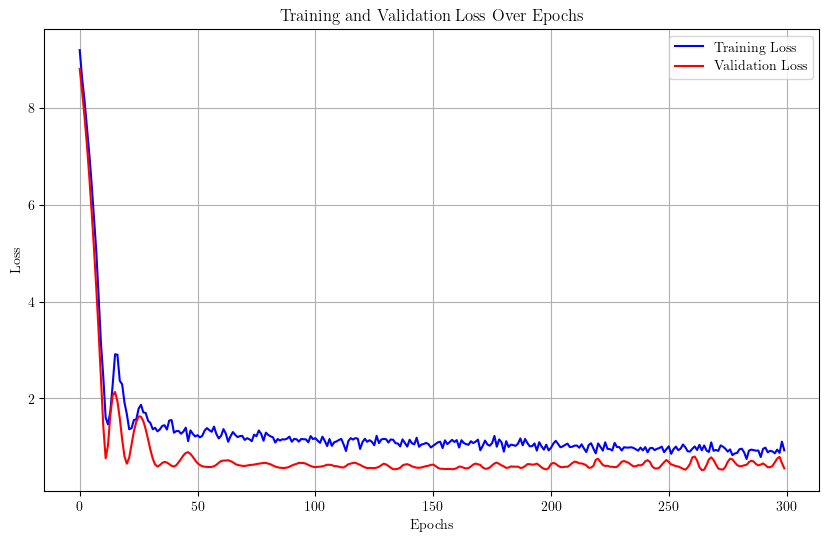

Training run 2/50 for 1% of the data...
Sample size for 1%: 149


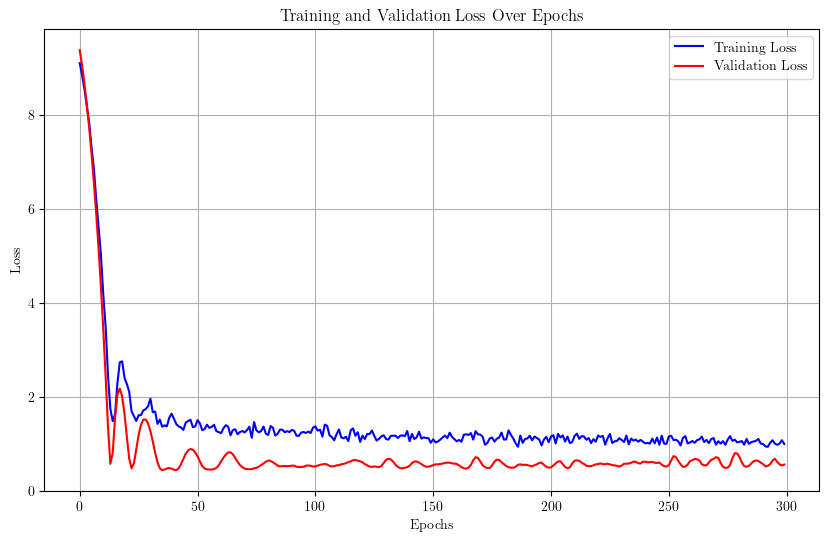

Training run 3/50 for 1% of the data...
Sample size for 1%: 149


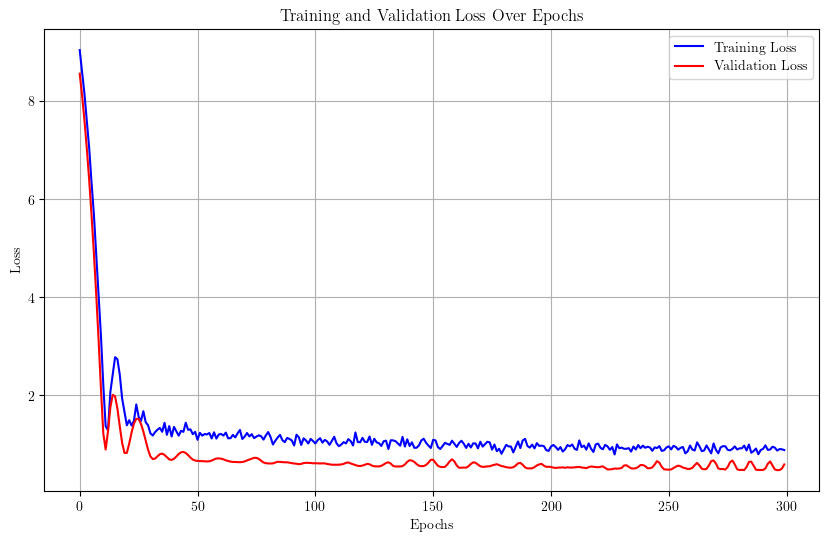

Training run 4/50 for 1% of the data...
Sample size for 1%: 149


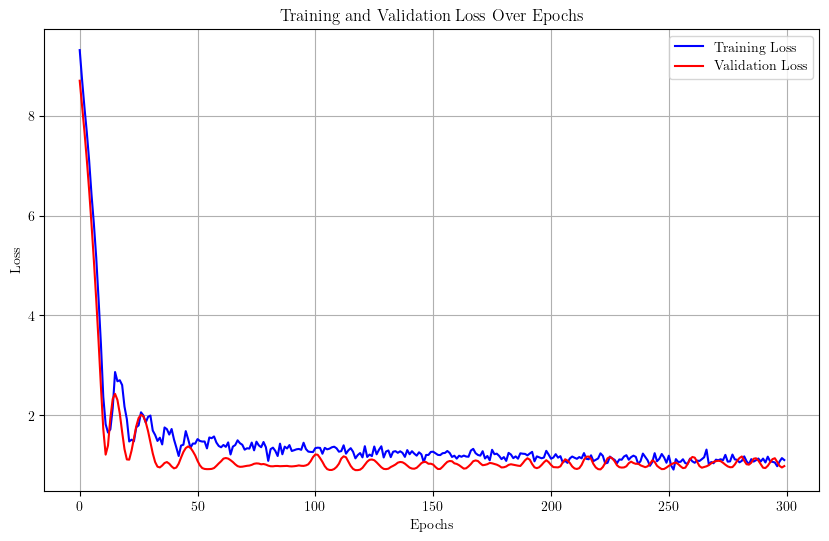

Training run 5/50 for 1% of the data...
Sample size for 1%: 149


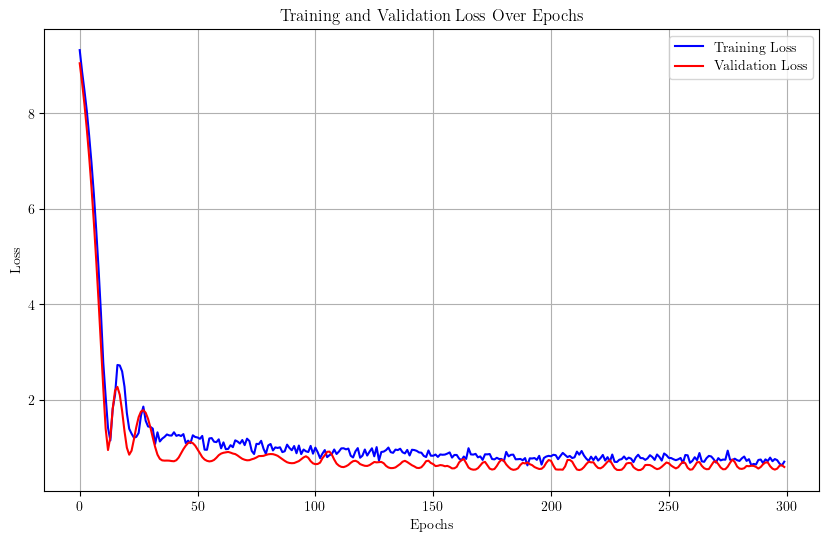

Training run 6/50 for 1% of the data...
Sample size for 1%: 149


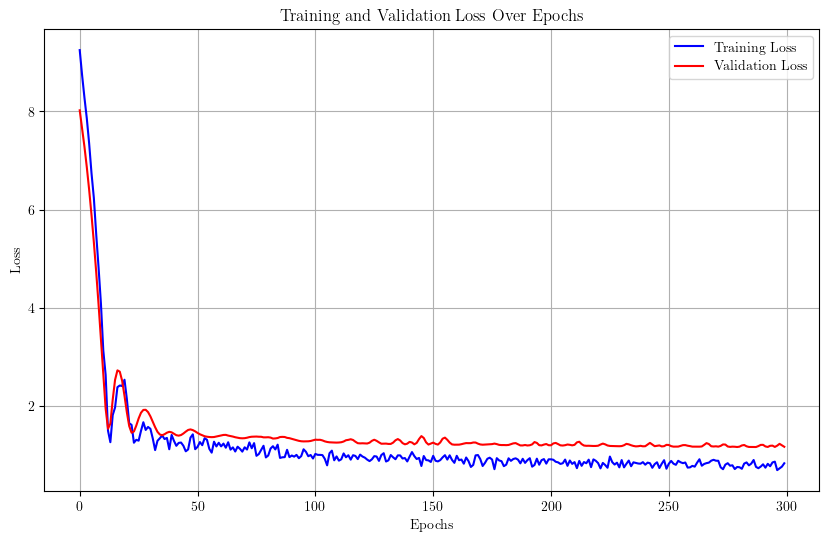

Training run 7/50 for 1% of the data...
Sample size for 1%: 149


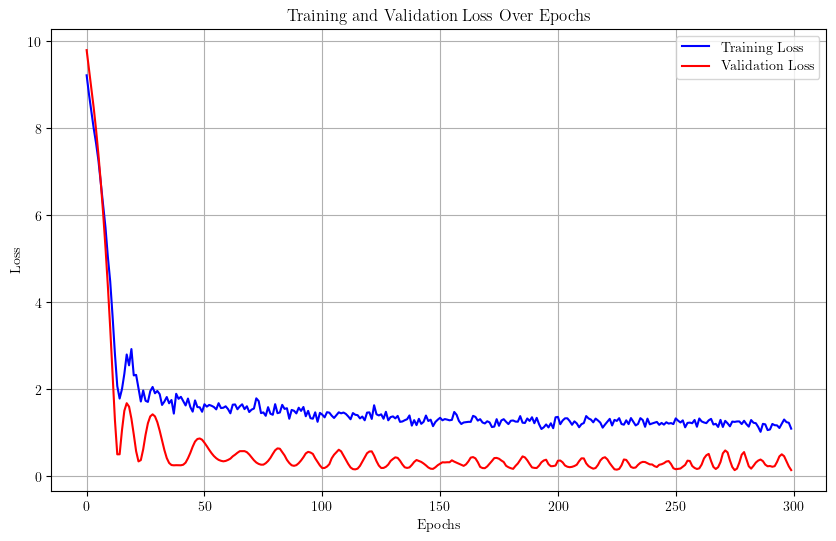

Training run 8/50 for 1% of the data...
Sample size for 1%: 149


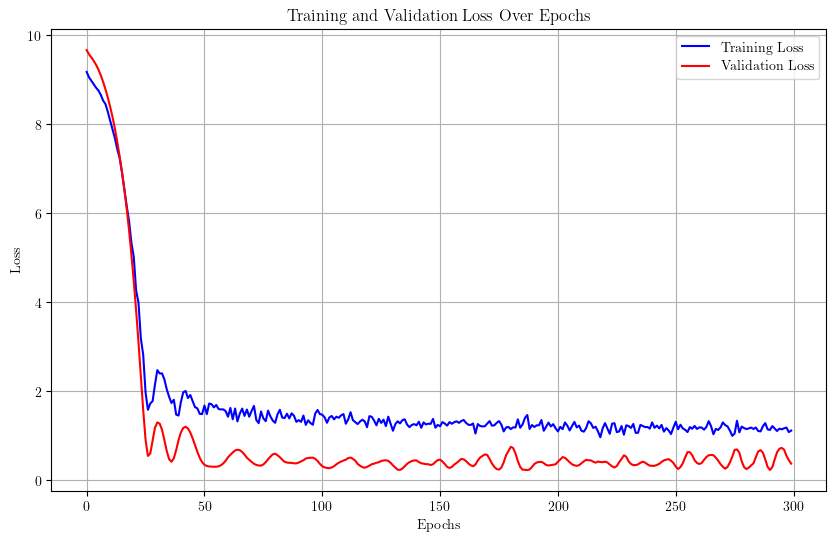

Training run 9/50 for 1% of the data...
Sample size for 1%: 149


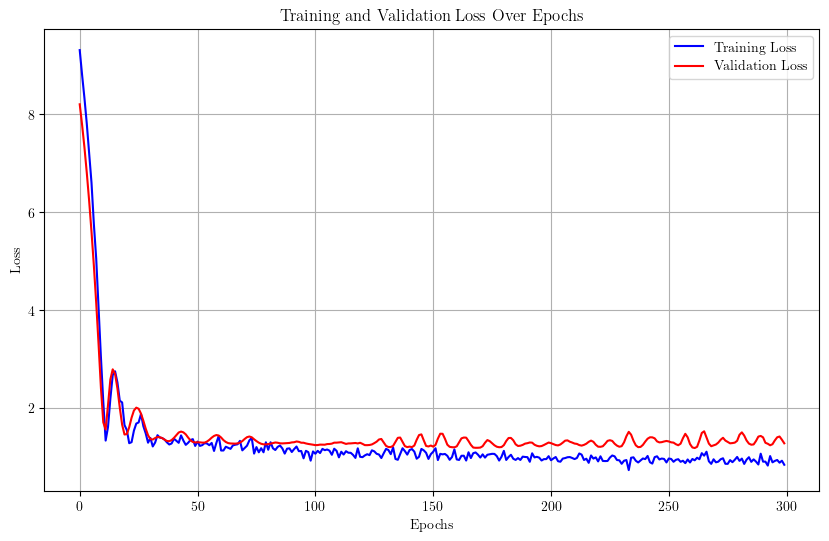

Training run 10/50 for 1% of the data...
Sample size for 1%: 149


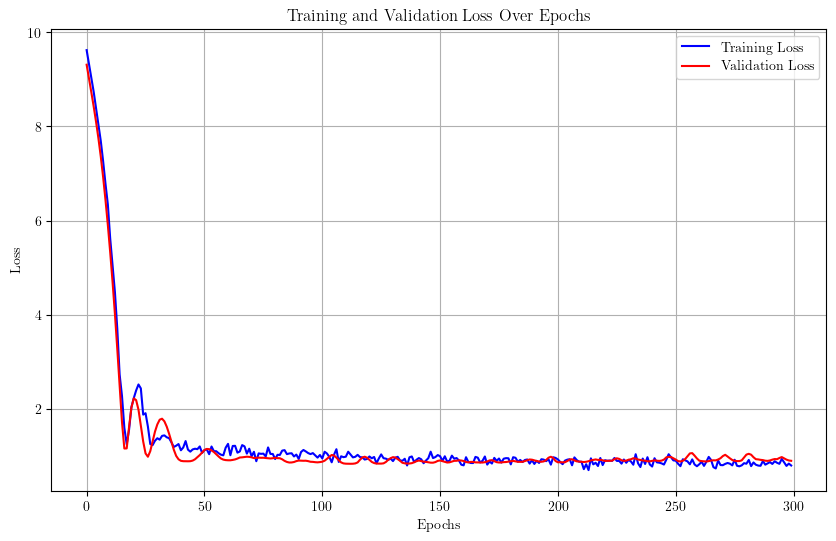

Training run 11/50 for 1% of the data...
Sample size for 1%: 149


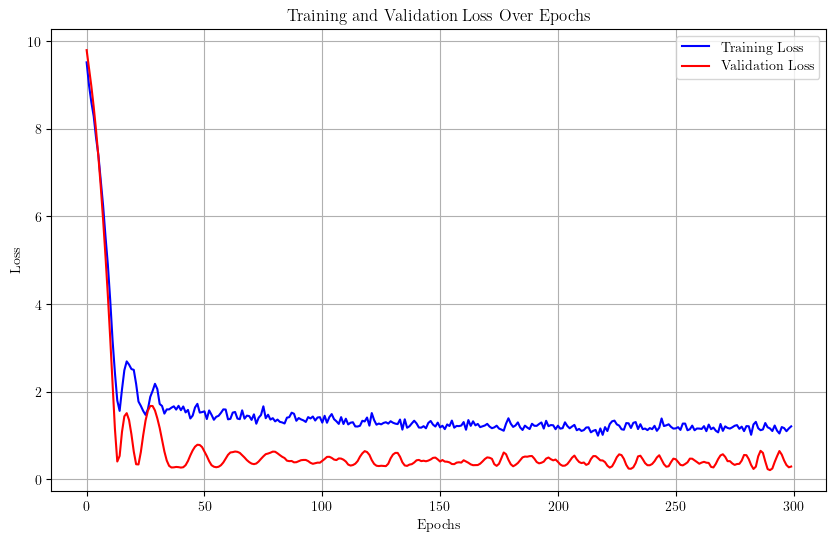

Training run 12/50 for 1% of the data...
Sample size for 1%: 149


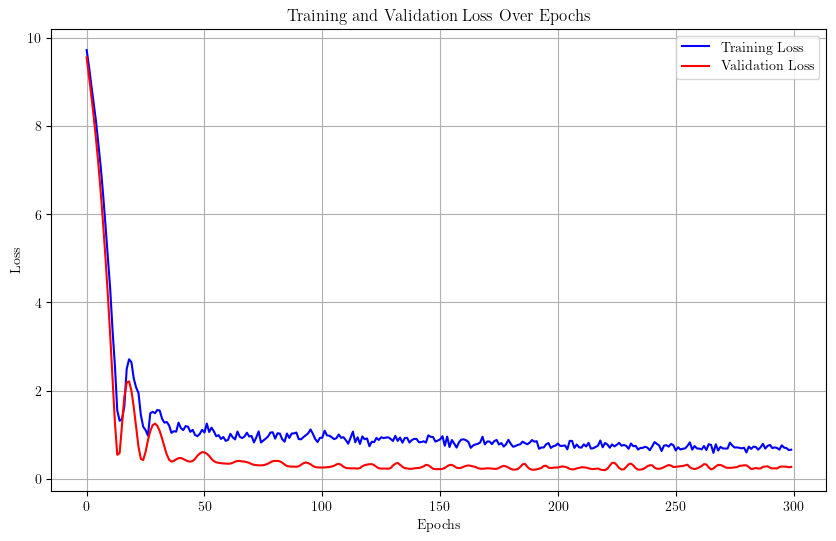

Training run 13/50 for 1% of the data...
Sample size for 1%: 149


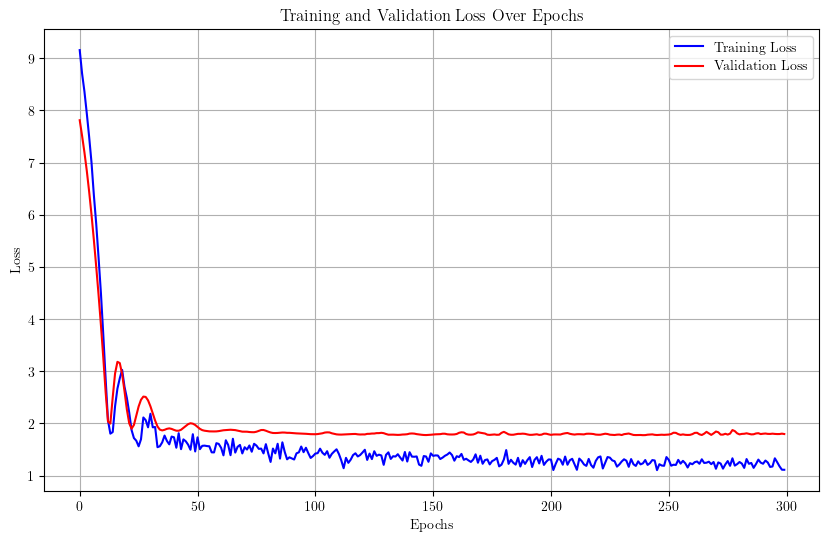

Training run 14/50 for 1% of the data...
Sample size for 1%: 149


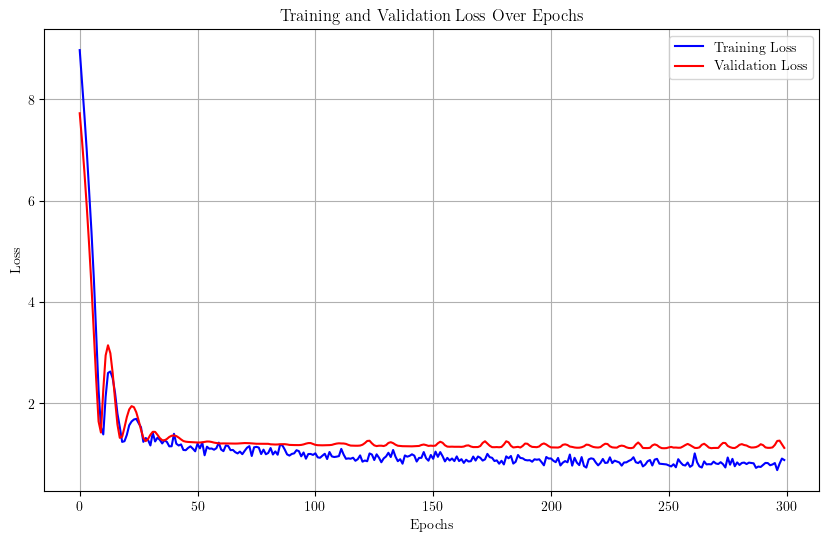

Training run 15/50 for 1% of the data...
Sample size for 1%: 149


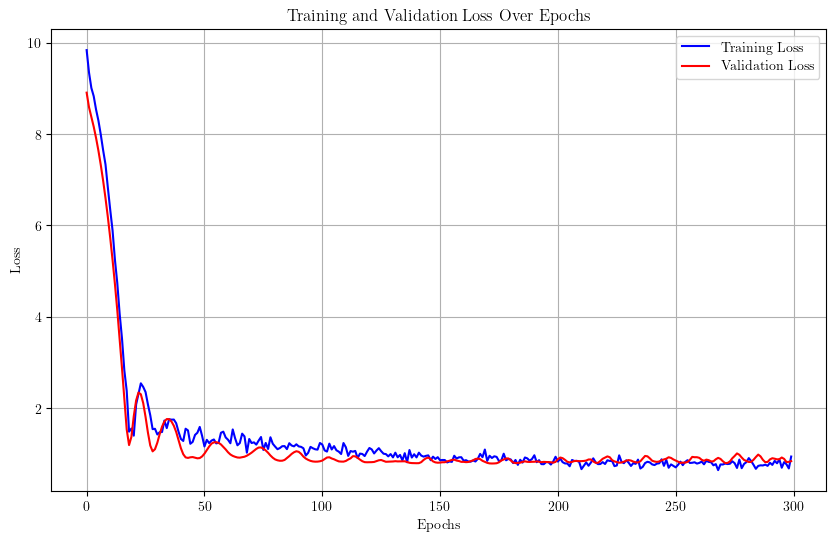

Training run 16/50 for 1% of the data...
Sample size for 1%: 149


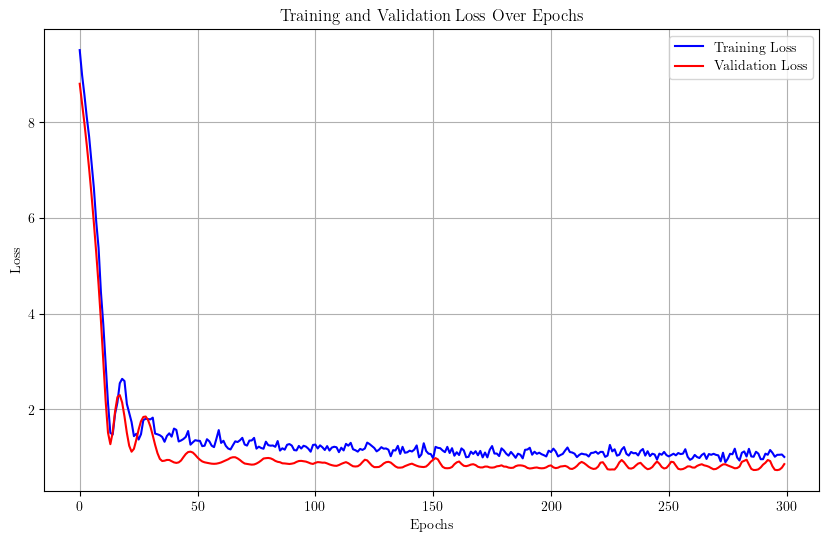

Training run 17/50 for 1% of the data...
Sample size for 1%: 149


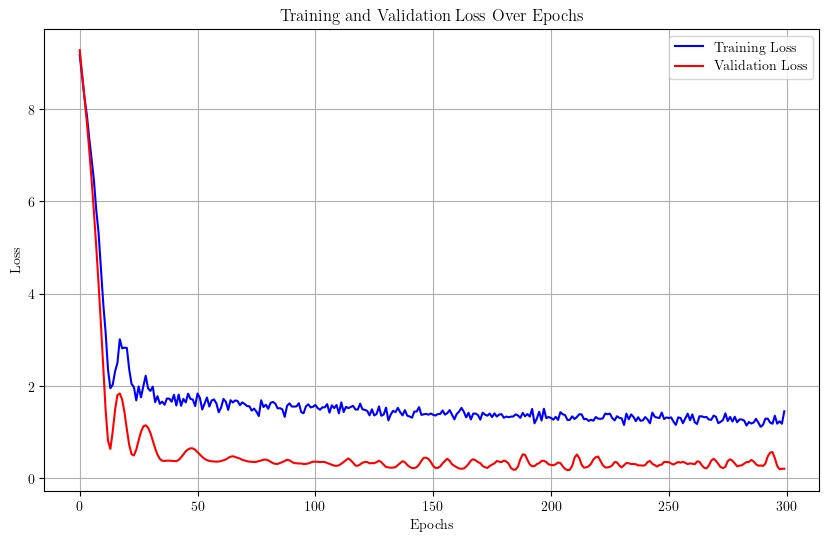

Training run 18/50 for 1% of the data...
Sample size for 1%: 149


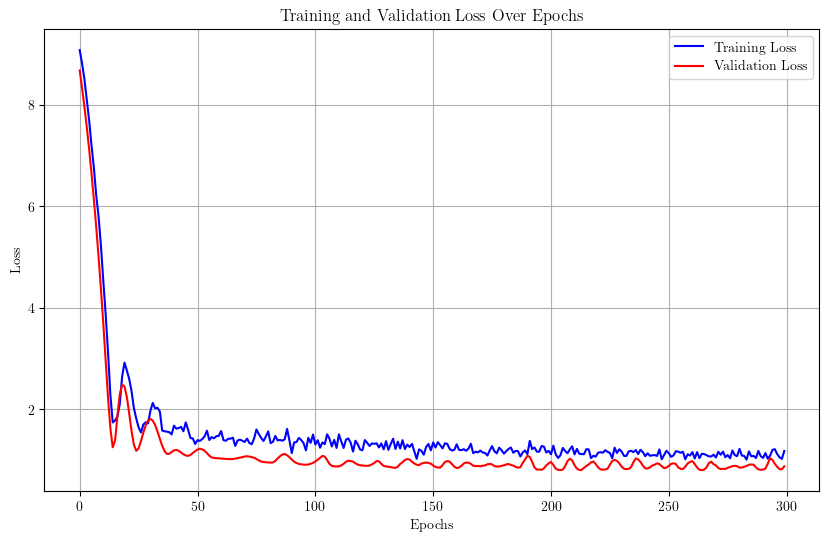

Training run 19/50 for 1% of the data...
Sample size for 1%: 149


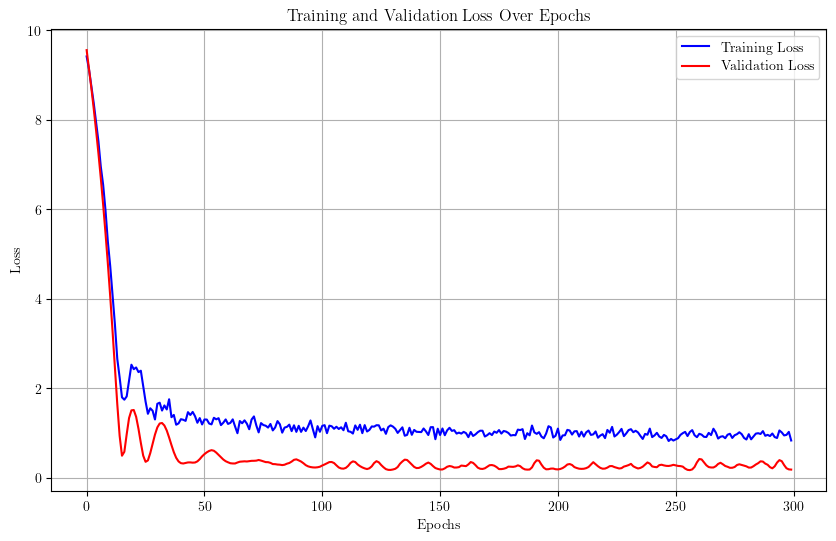

Training run 20/50 for 1% of the data...
Sample size for 1%: 149


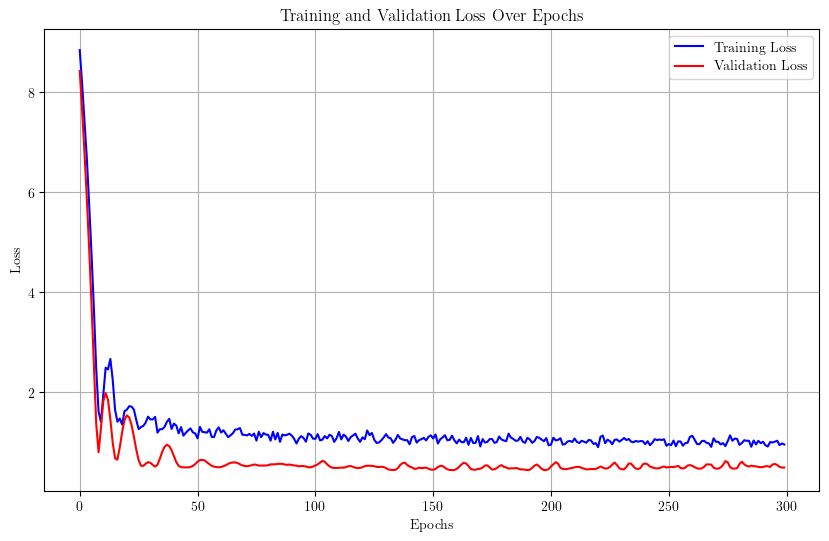

Training run 21/50 for 1% of the data...
Sample size for 1%: 149


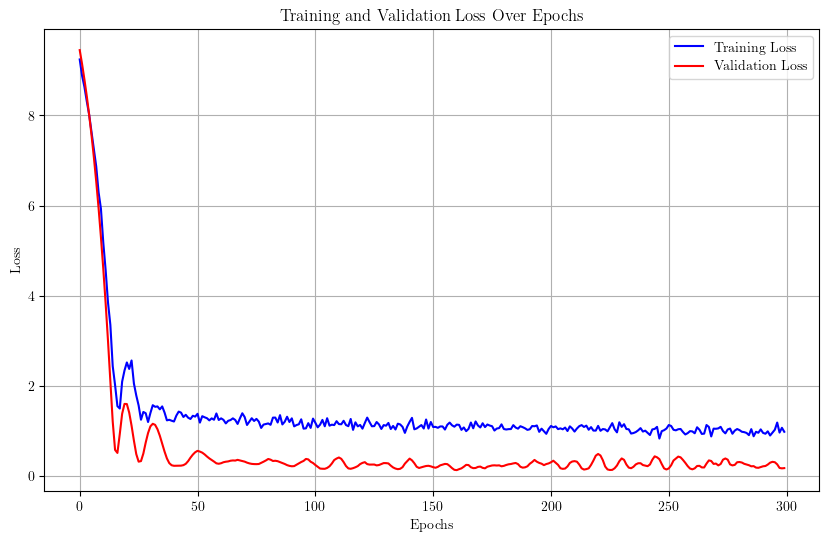

Training run 22/50 for 1% of the data...
Sample size for 1%: 149


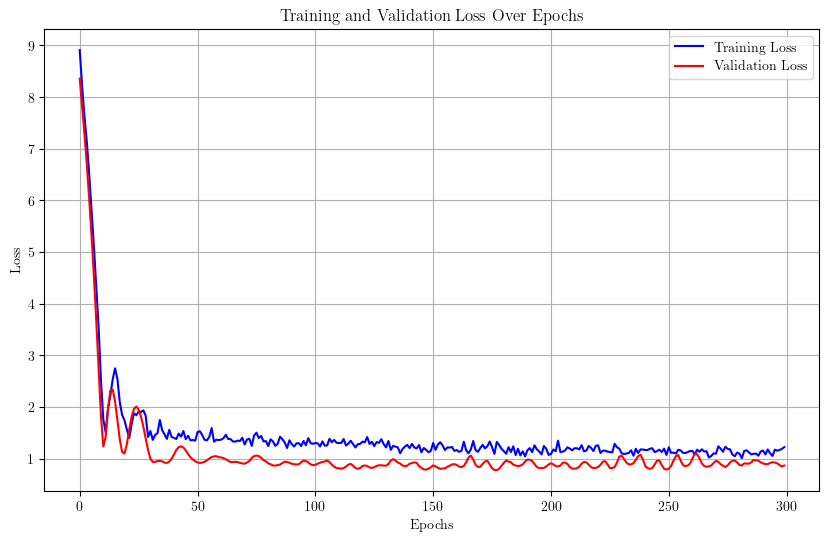

Training run 23/50 for 1% of the data...
Sample size for 1%: 149


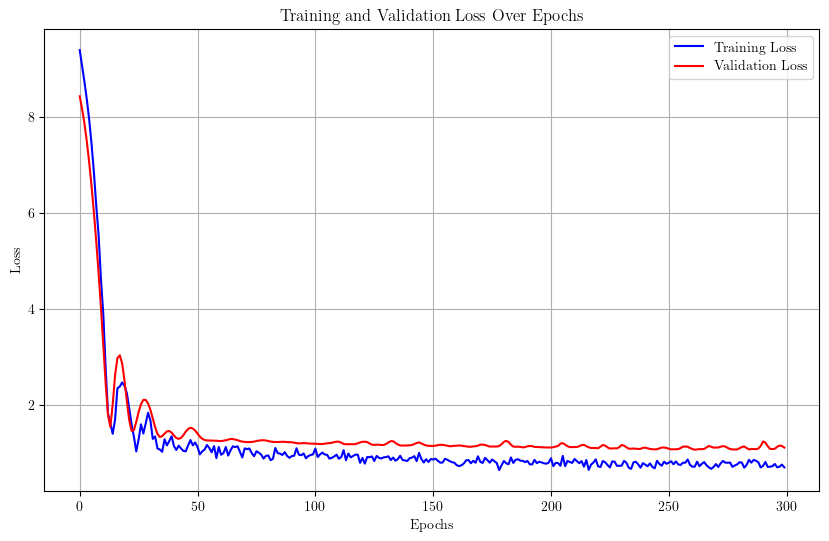

Training run 24/50 for 1% of the data...
Sample size for 1%: 149


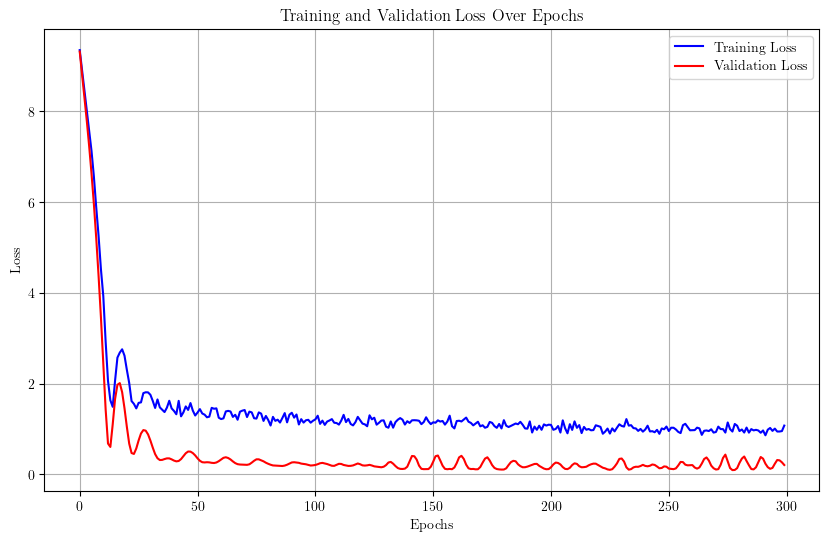

Training run 25/50 for 1% of the data...
Sample size for 1%: 149


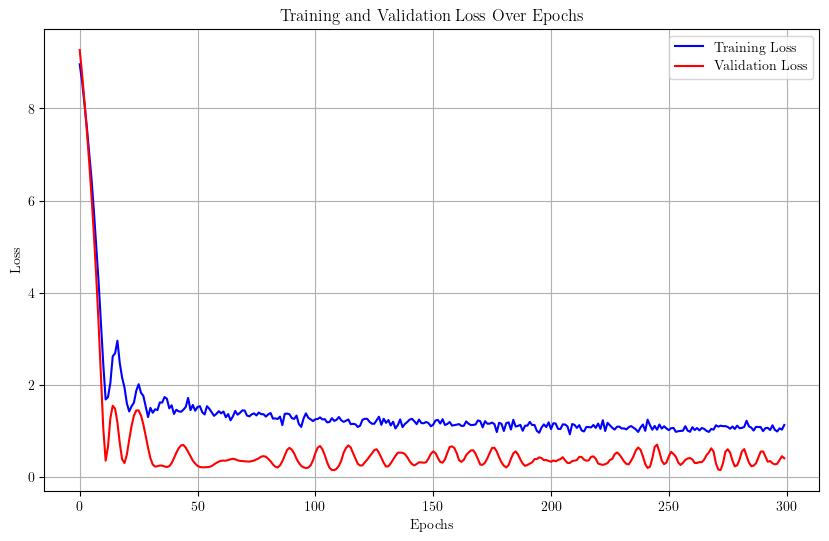

Training run 26/50 for 1% of the data...
Sample size for 1%: 149


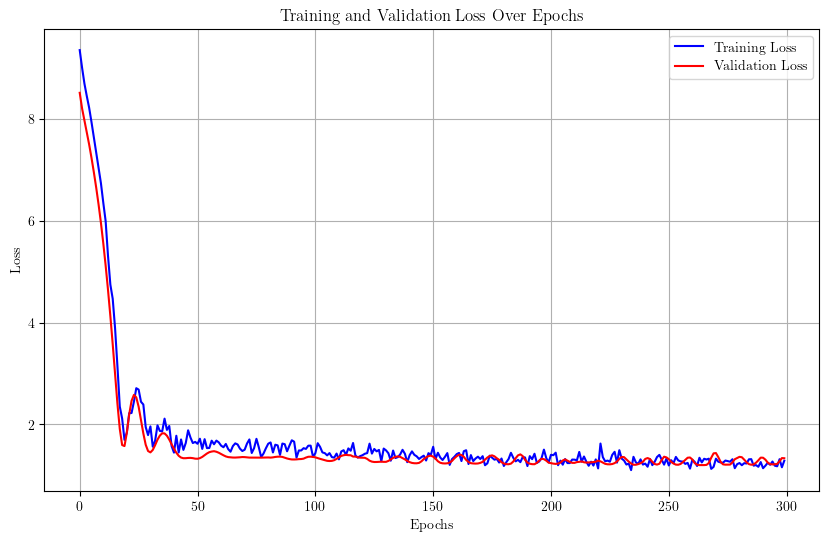

Training run 27/50 for 1% of the data...
Sample size for 1%: 149


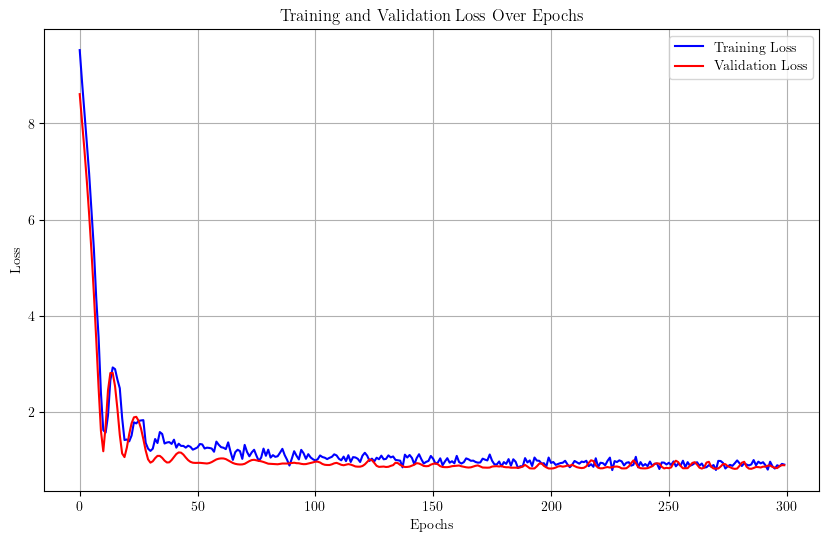

Training run 28/50 for 1% of the data...
Sample size for 1%: 149


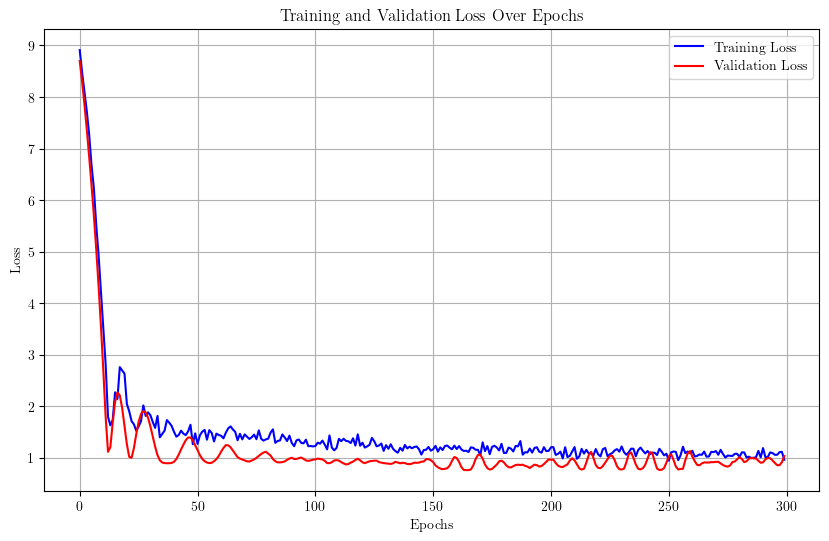

Training run 29/50 for 1% of the data...
Sample size for 1%: 149


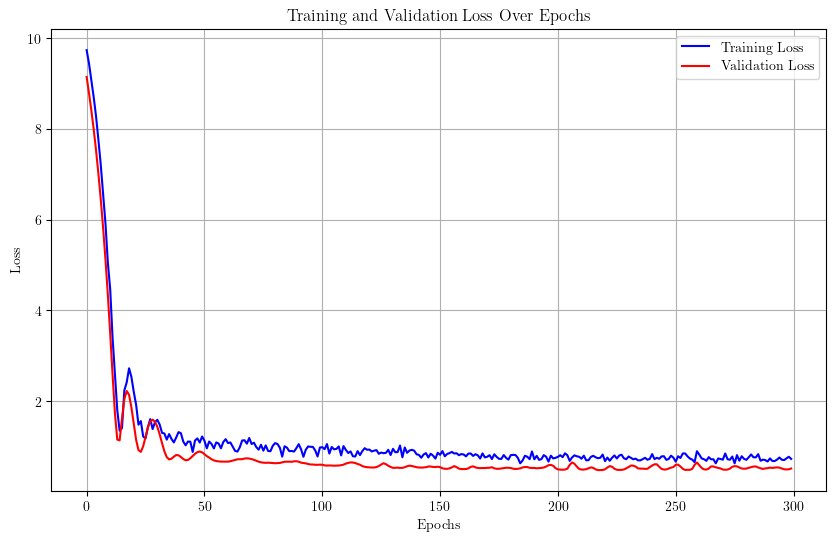

Training run 30/50 for 1% of the data...
Sample size for 1%: 149


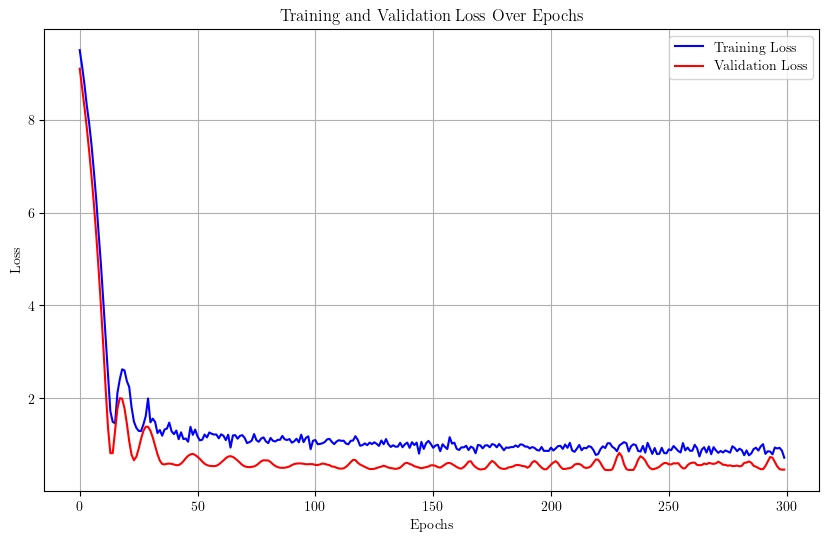

Training run 31/50 for 1% of the data...
Sample size for 1%: 149


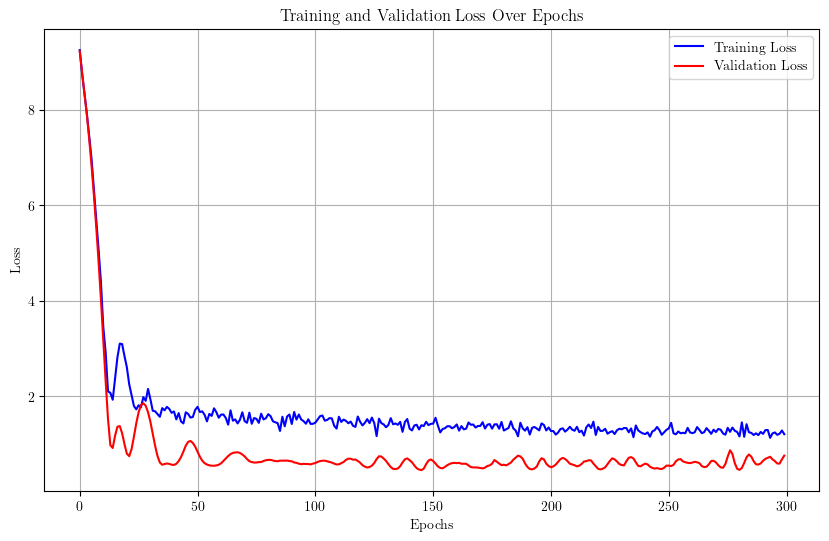

Training run 32/50 for 1% of the data...
Sample size for 1%: 149


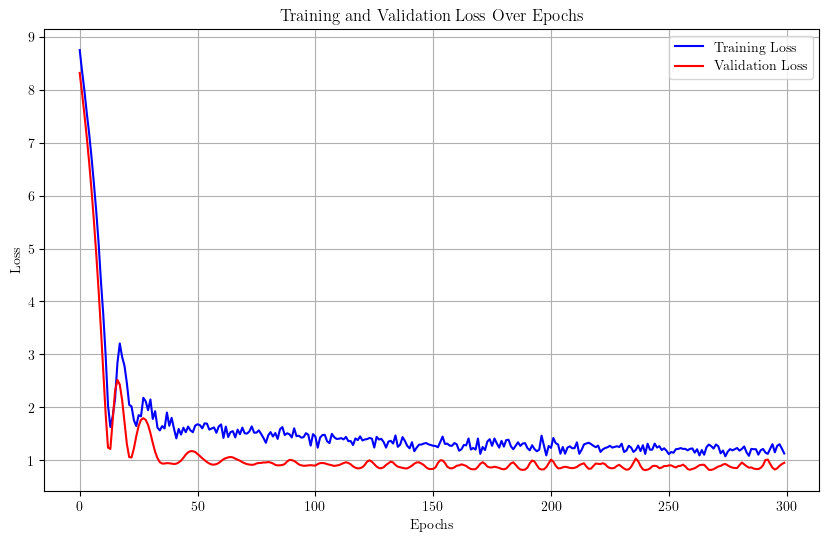

Training run 33/50 for 1% of the data...
Sample size for 1%: 149


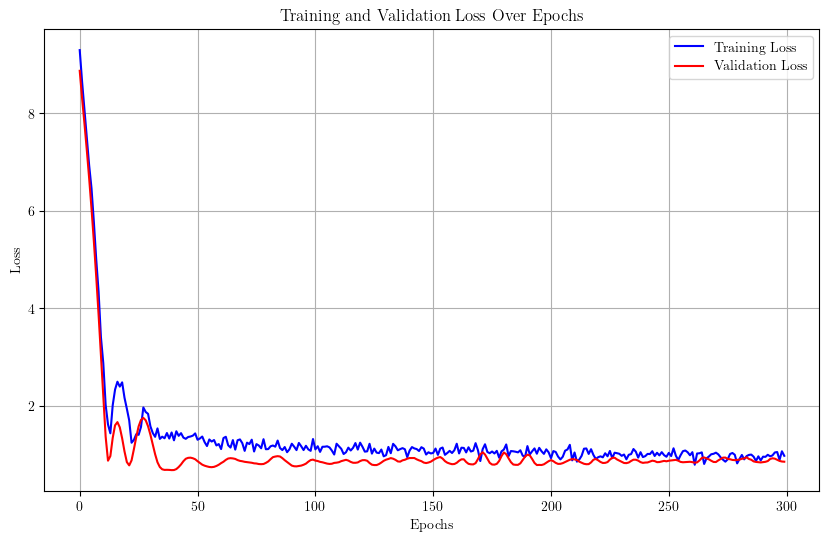

Training run 34/50 for 1% of the data...
Sample size for 1%: 149


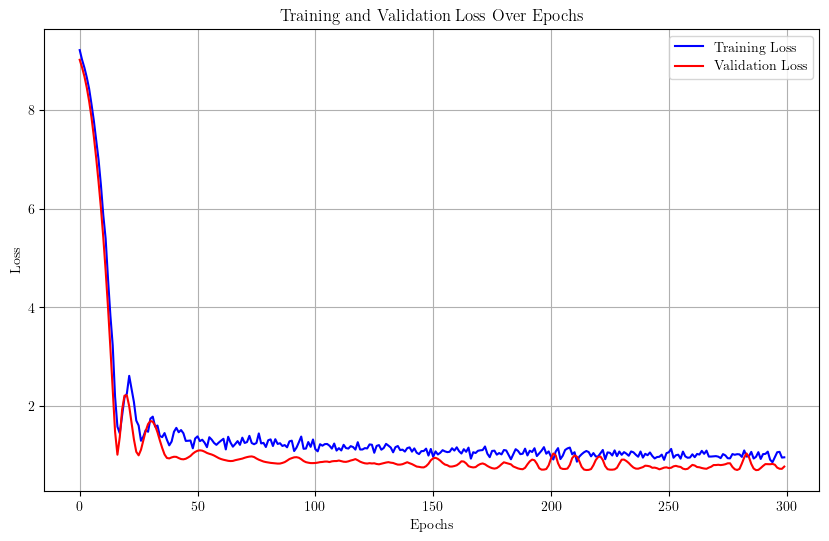

Training run 35/50 for 1% of the data...
Sample size for 1%: 149


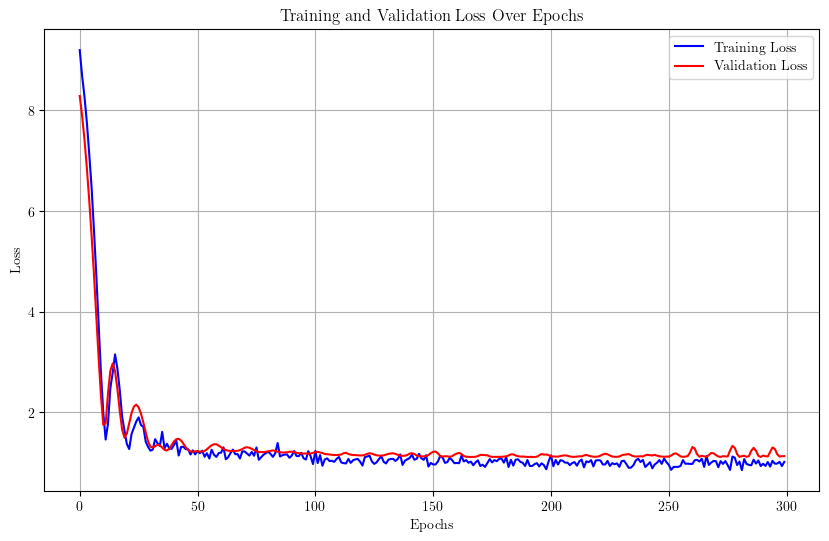

Training run 36/50 for 1% of the data...
Sample size for 1%: 149


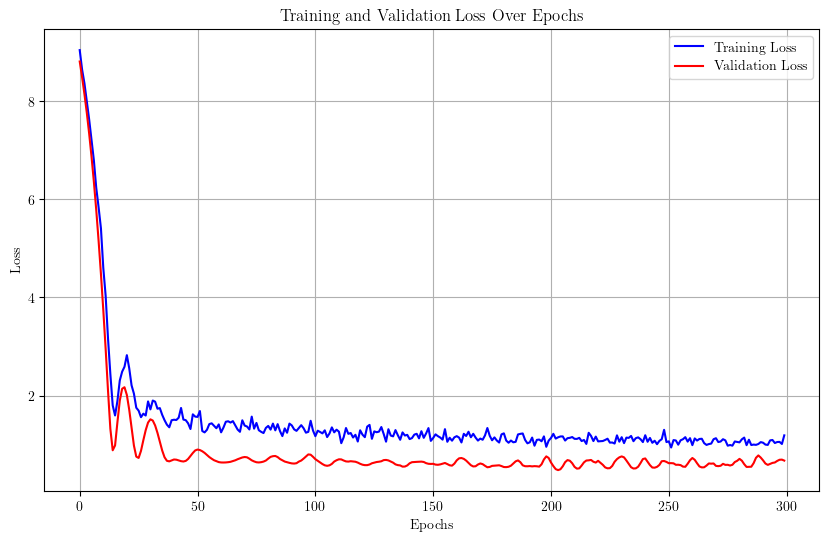

Training run 37/50 for 1% of the data...
Sample size for 1%: 149


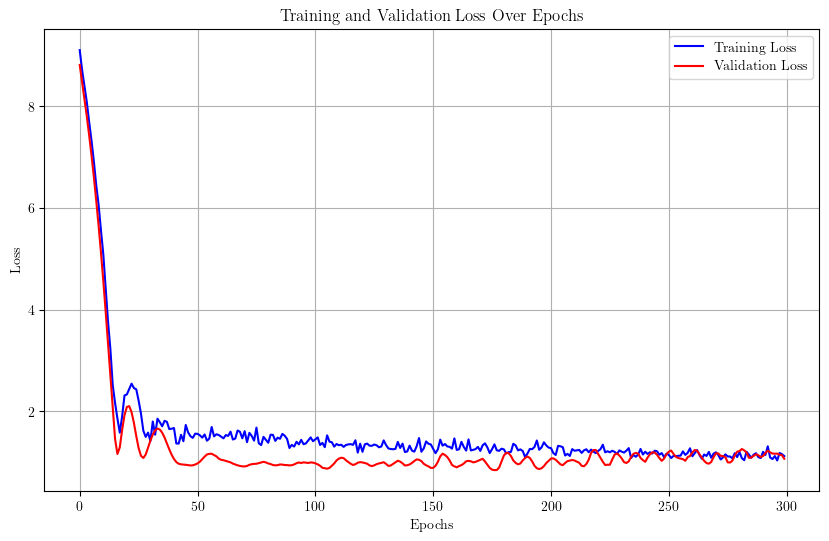

Training run 38/50 for 1% of the data...
Sample size for 1%: 149


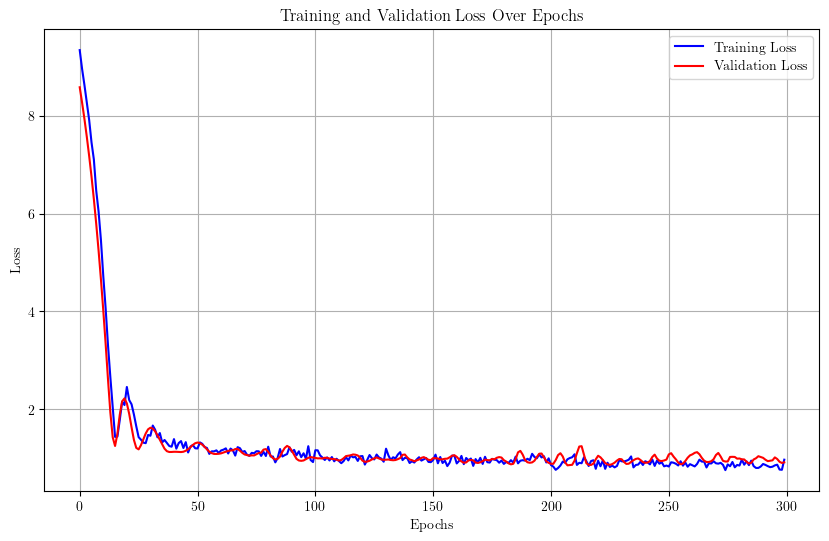

Training run 39/50 for 1% of the data...
Sample size for 1%: 149


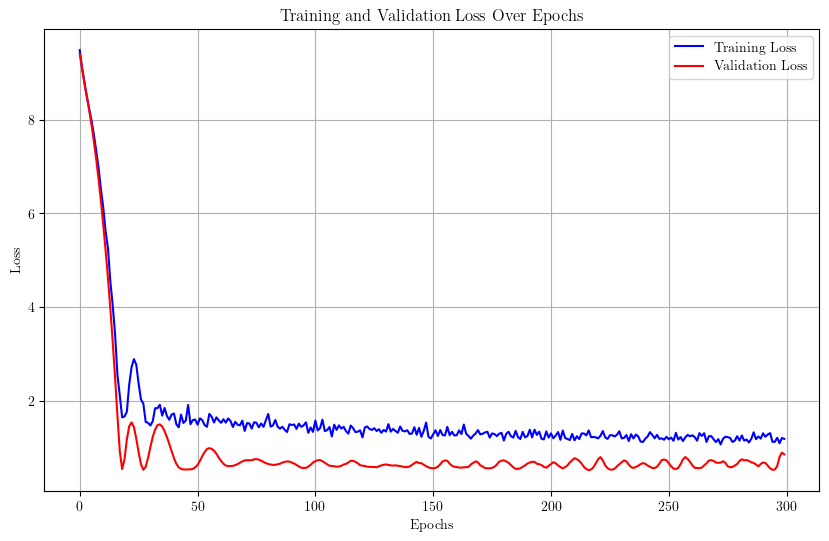

Training run 40/50 for 1% of the data...
Sample size for 1%: 149


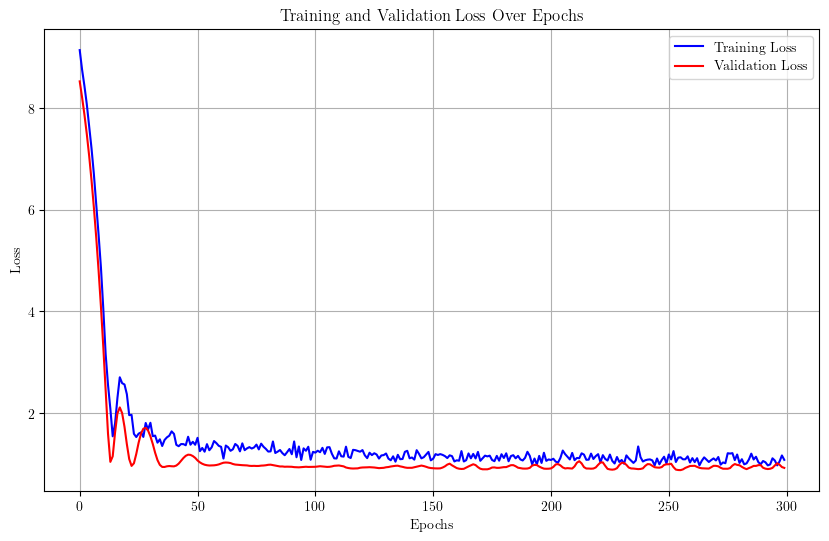

Training run 41/50 for 1% of the data...
Sample size for 1%: 149


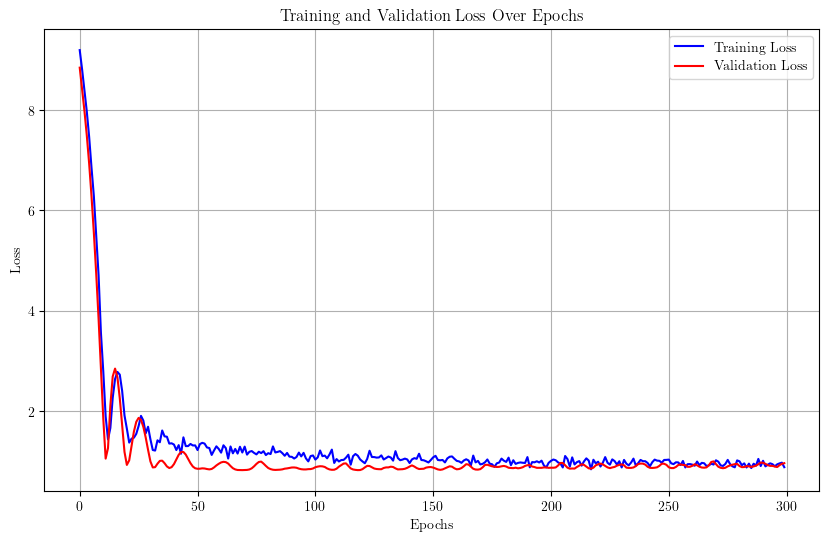

Training run 42/50 for 1% of the data...
Sample size for 1%: 149


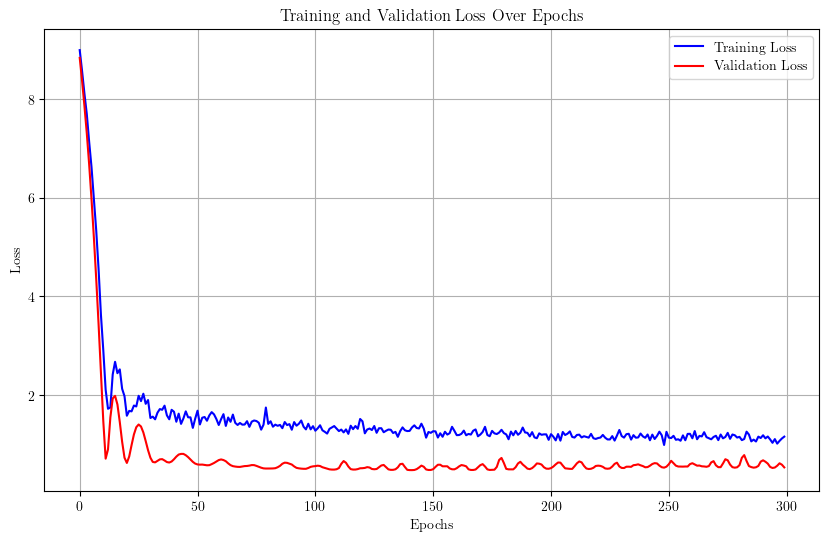

Training run 43/50 for 1% of the data...
Sample size for 1%: 149


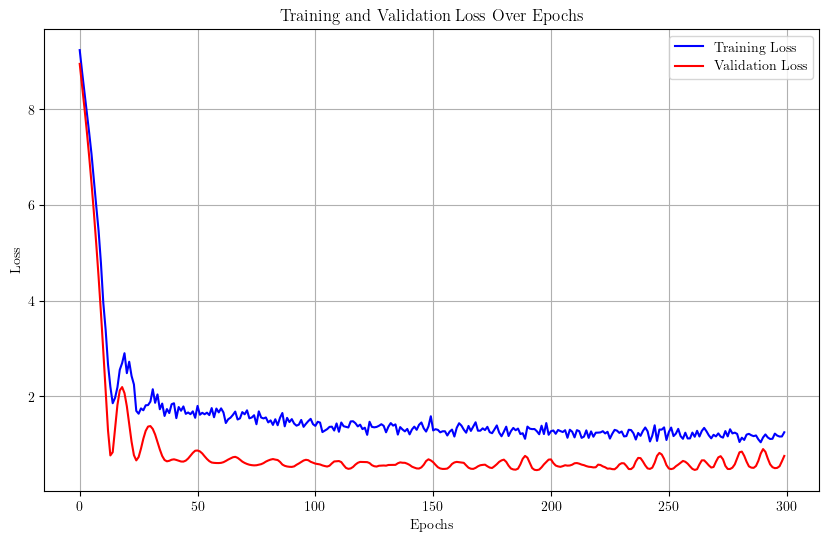

Training run 44/50 for 1% of the data...
Sample size for 1%: 149


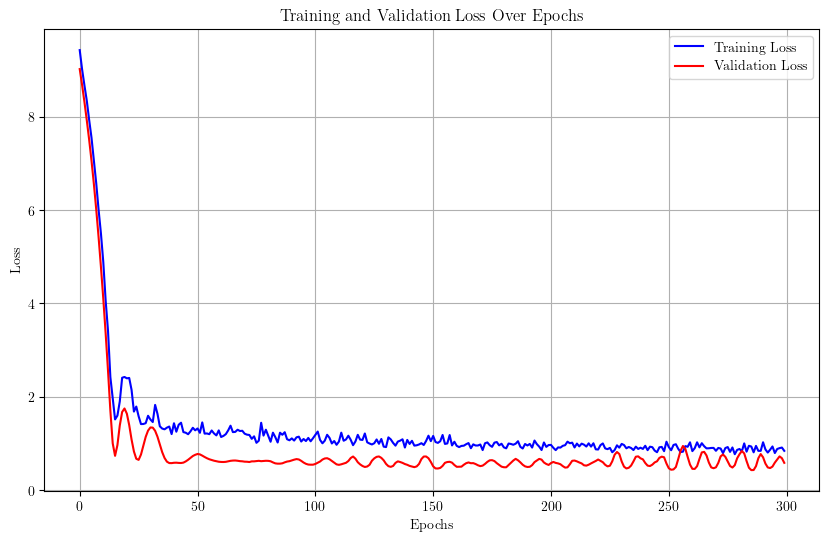

Training run 45/50 for 1% of the data...
Sample size for 1%: 149


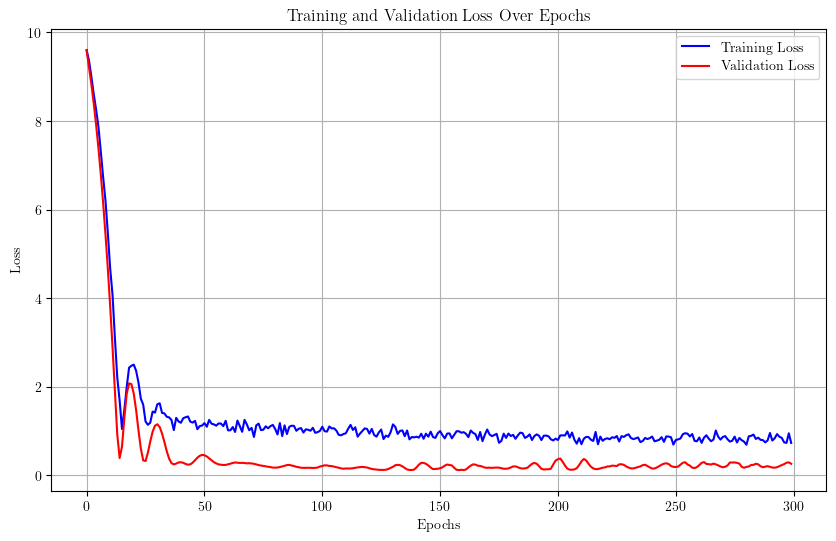

Training run 46/50 for 1% of the data...
Sample size for 1%: 149


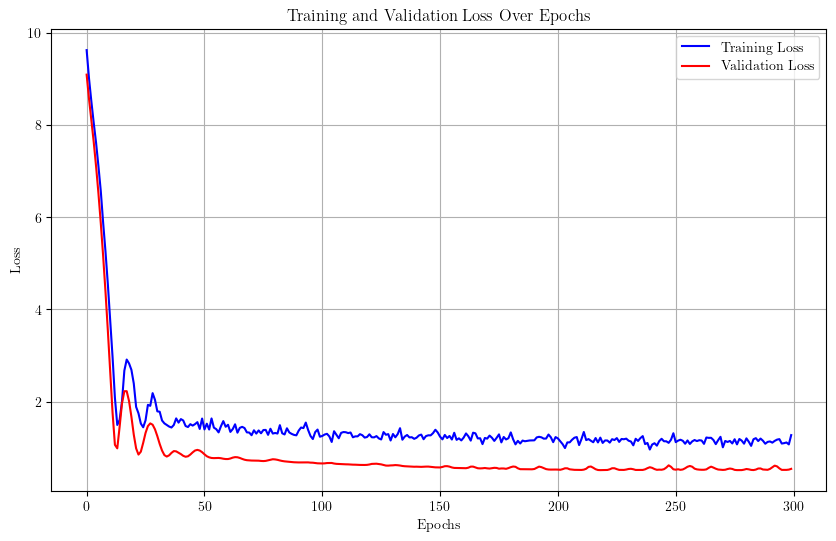

Training run 47/50 for 1% of the data...
Sample size for 1%: 149


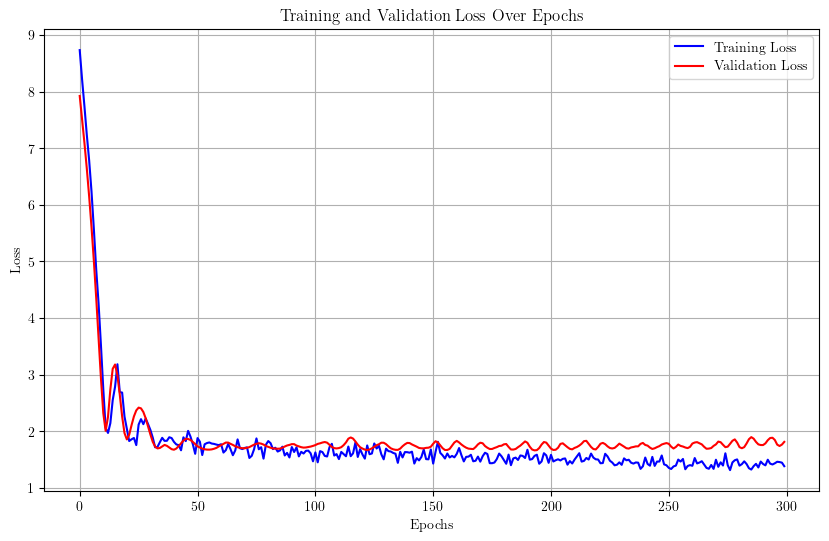

Training run 48/50 for 1% of the data...
Sample size for 1%: 149


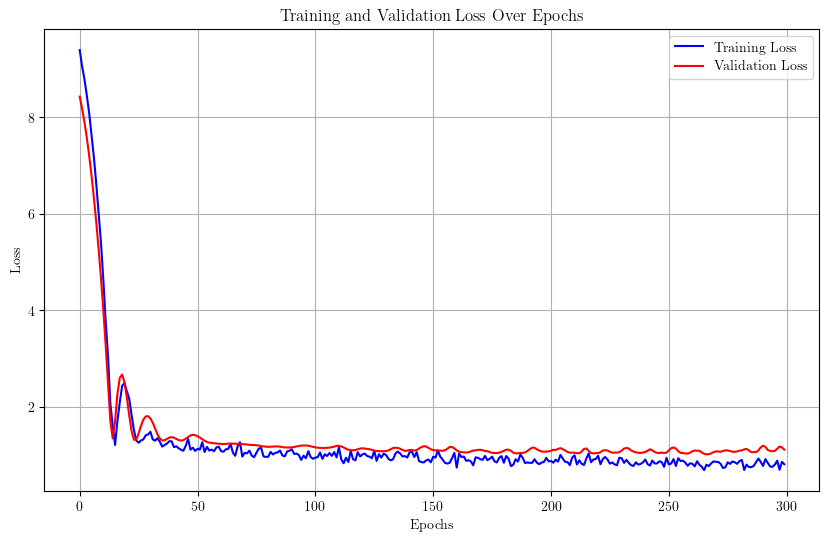

Training run 49/50 for 1% of the data...
Sample size for 1%: 149


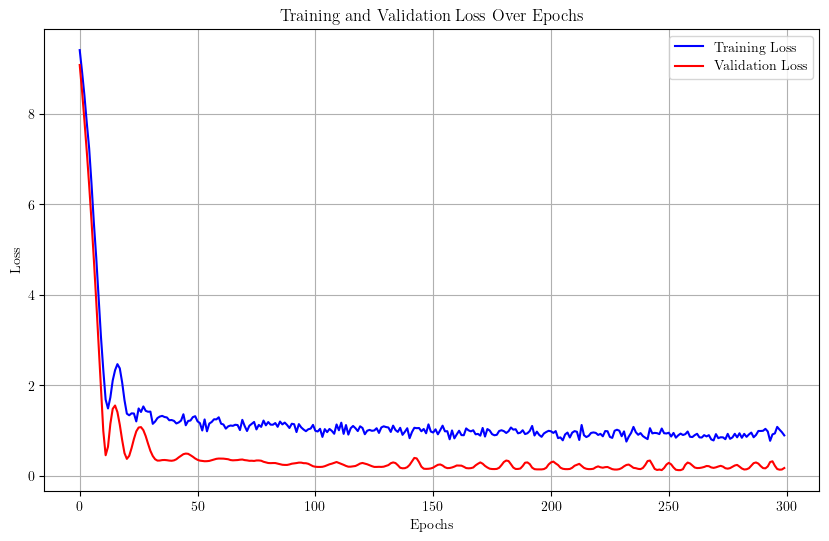

Training run 50/50 for 1% of the data...
Sample size for 1%: 149


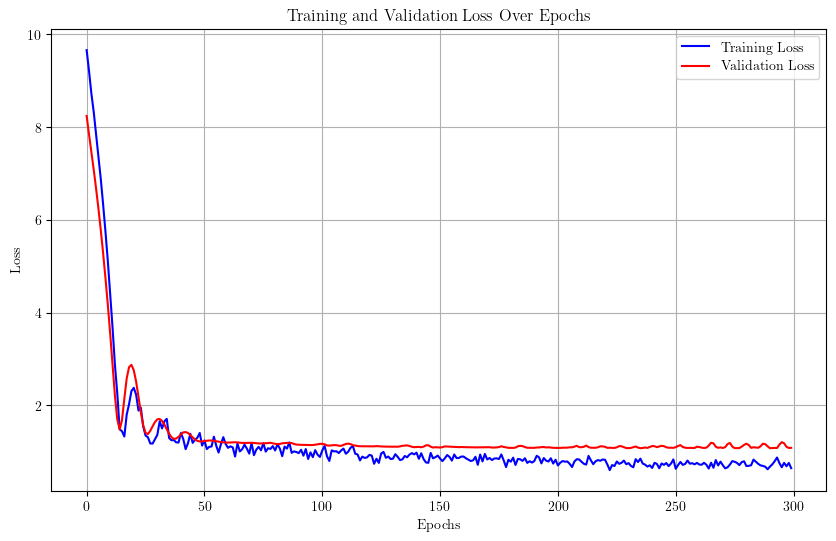

Metrics for 1% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(5.813693), 'mae': np.float32(1.1154389), 'r2': np.float64(0.032152806520462034), 'bias': np.float32(0.47483227), 'nmad': np.float32(0.04661434), 'sigma_68': np.float32(0.090897486), 'outlier_fraction': np.float64(7.4)}
Metrics Across Runs:
mse: 5.8137 ± 4.0932
mae: 1.1154 ± 0.4044
r2: 0.0322 ± 0.2484
bias: 0.4748 ± 0.4004
nmad: 0.0466 ± 0.0118
sigma_68: 0.0909 ± 0.2759
outlier_fraction: 7.4000 ± 5.6289
Training model for 5% of the data...
Training run 1/50 for 5% of the data...
Sample size for 5%: 746


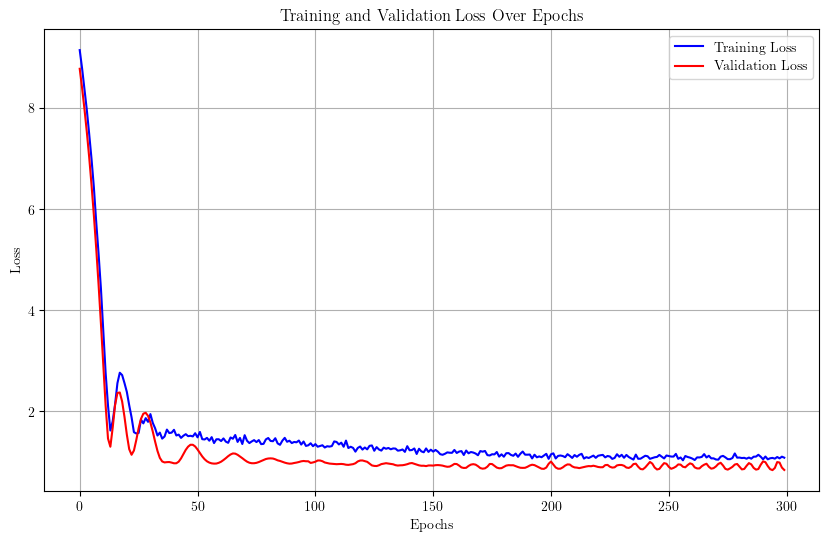

Training run 2/50 for 5% of the data...
Sample size for 5%: 746


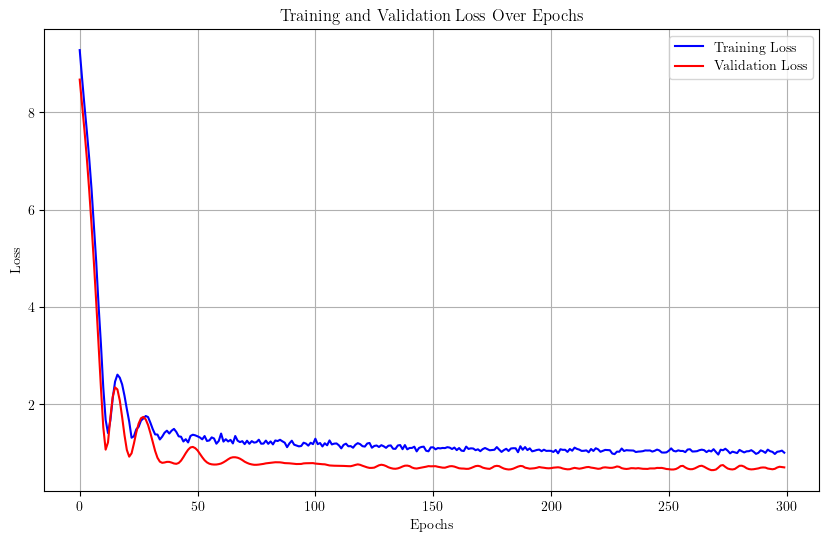

Training run 3/50 for 5% of the data...
Sample size for 5%: 746


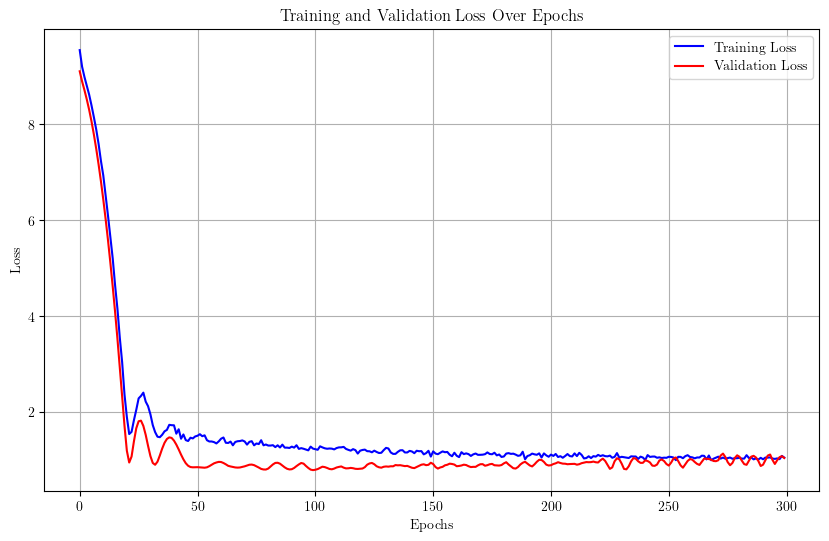

Training run 4/50 for 5% of the data...
Sample size for 5%: 746


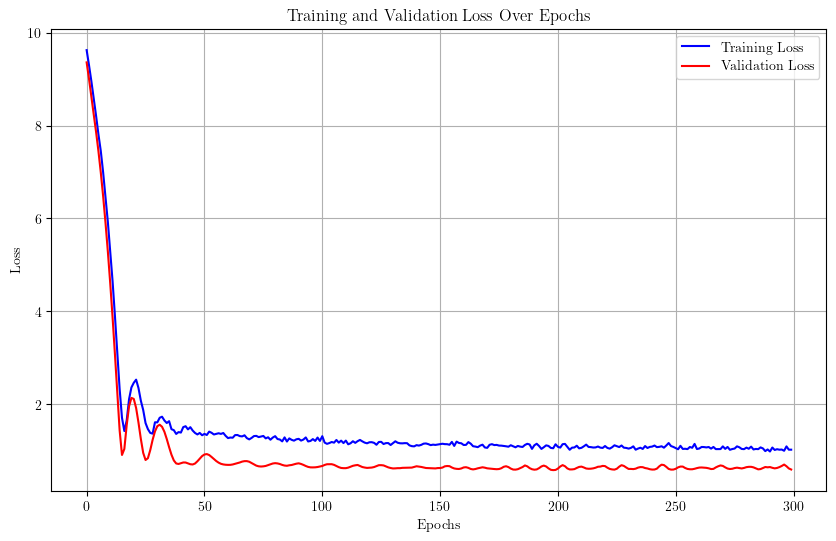

Training run 5/50 for 5% of the data...
Sample size for 5%: 746


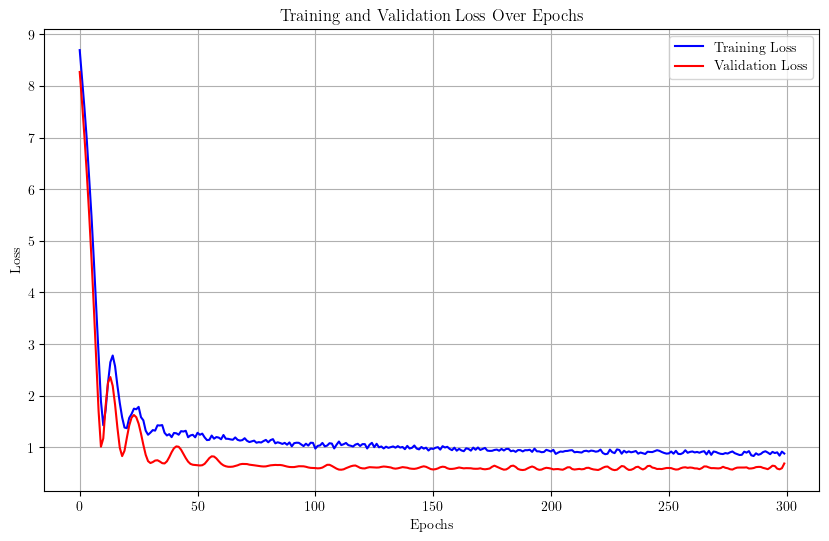

Training run 6/50 for 5% of the data...
Sample size for 5%: 746


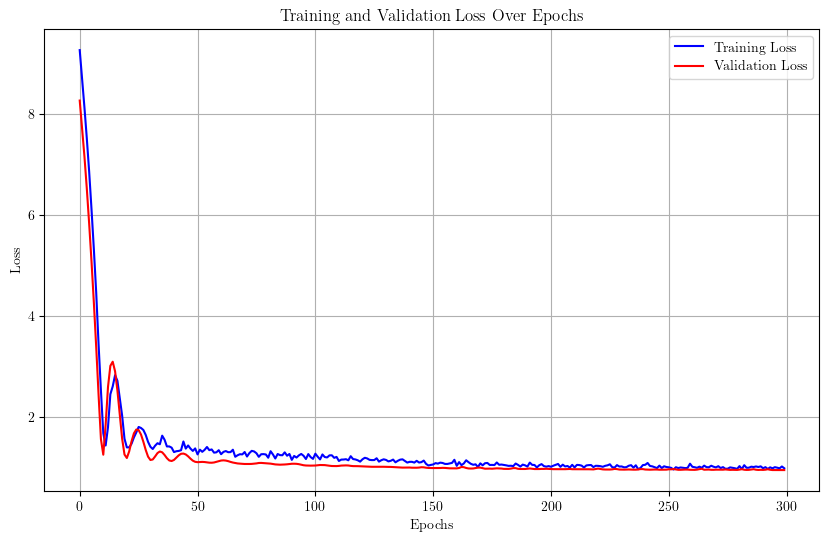

Training run 7/50 for 5% of the data...
Sample size for 5%: 746


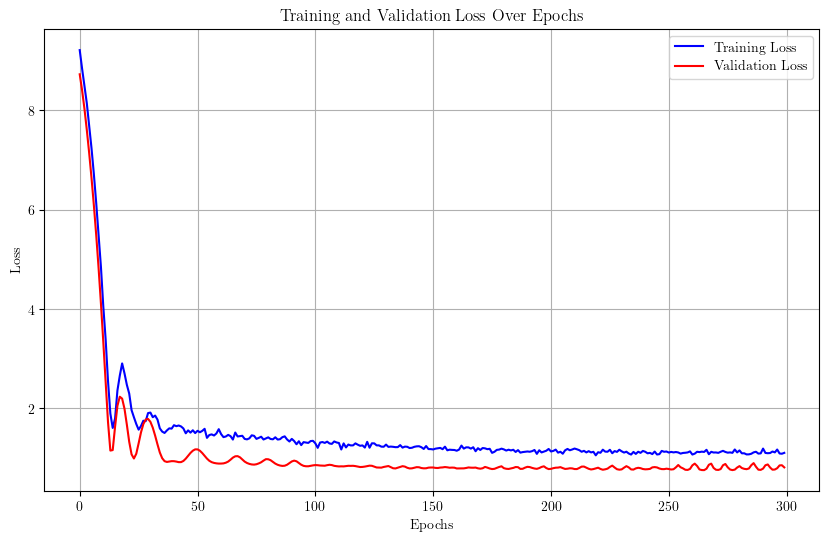

Training run 8/50 for 5% of the data...
Sample size for 5%: 746


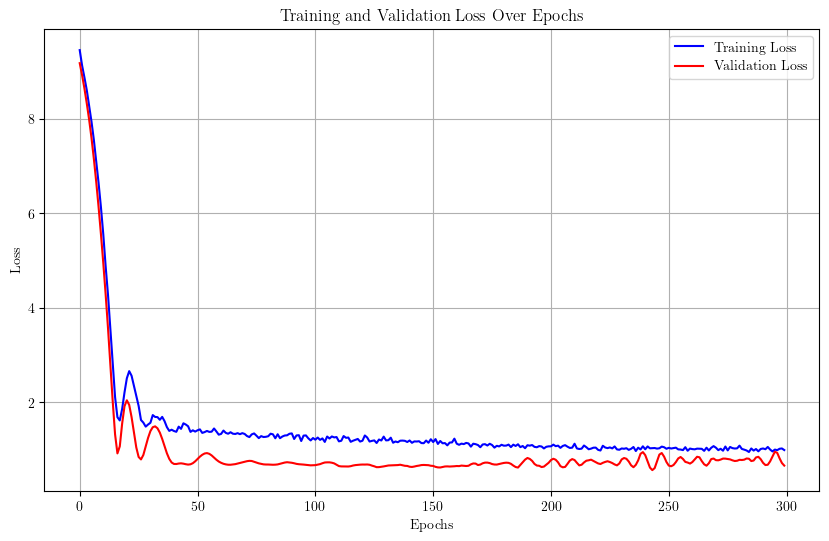

Training run 9/50 for 5% of the data...
Sample size for 5%: 746


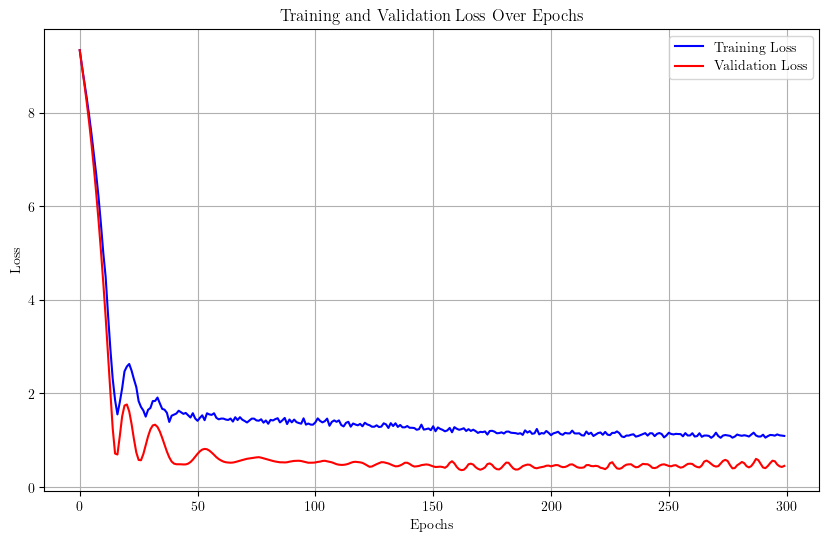

Training run 10/50 for 5% of the data...
Sample size for 5%: 746


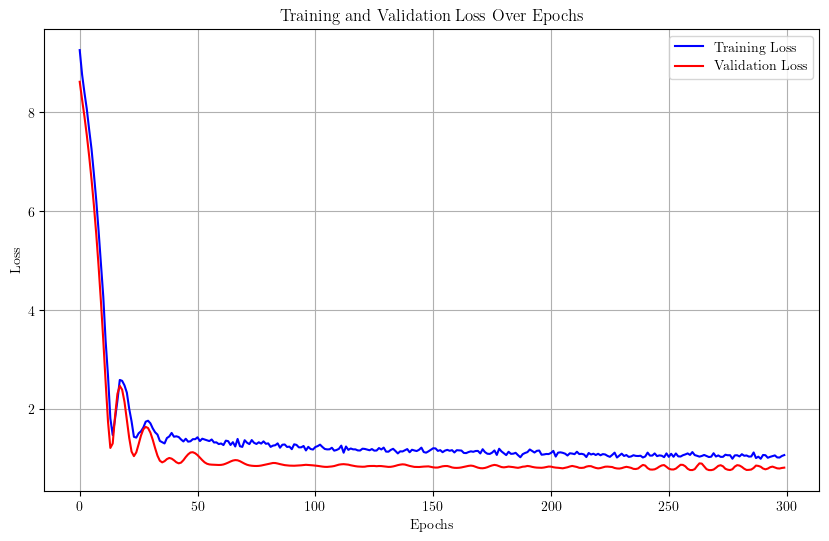

Training run 11/50 for 5% of the data...
Sample size for 5%: 746


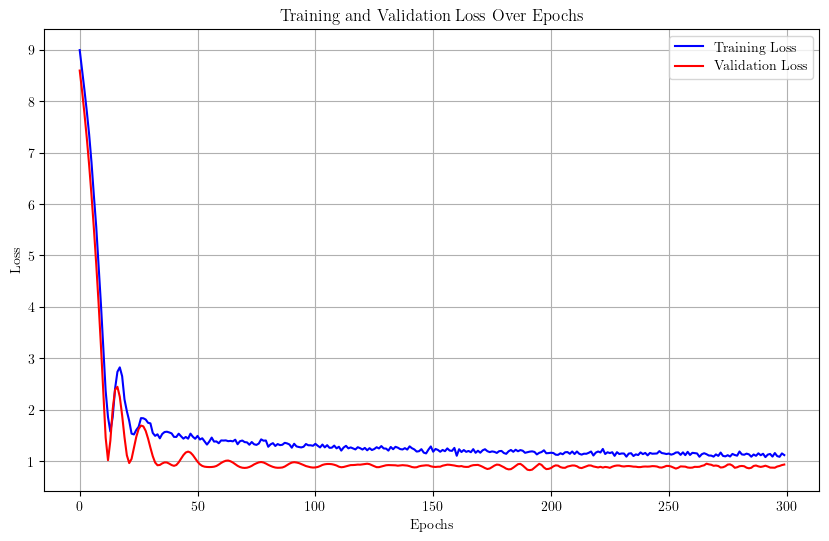

Training run 12/50 for 5% of the data...
Sample size for 5%: 746


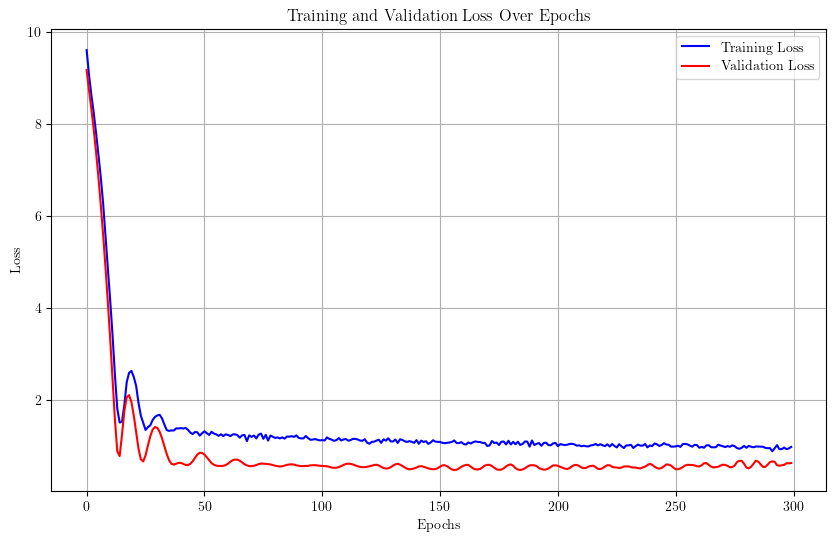

Training run 13/50 for 5% of the data...
Sample size for 5%: 746


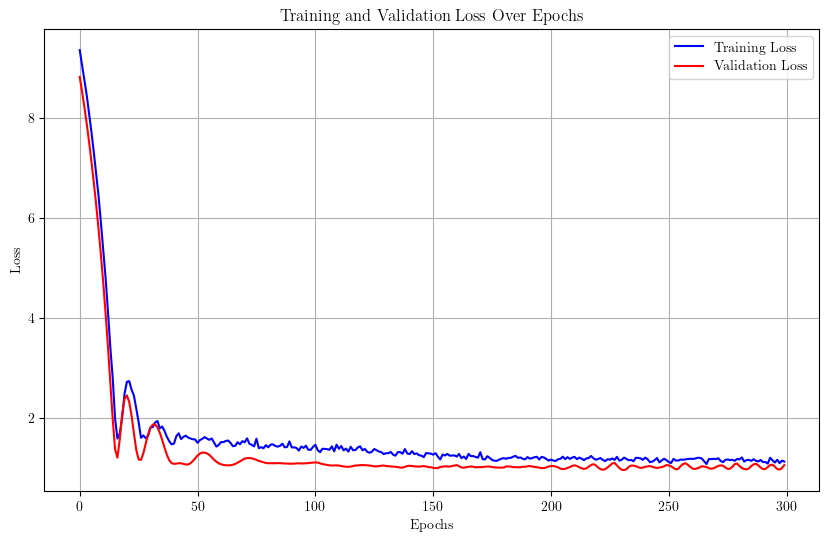

Training run 14/50 for 5% of the data...
Sample size for 5%: 746


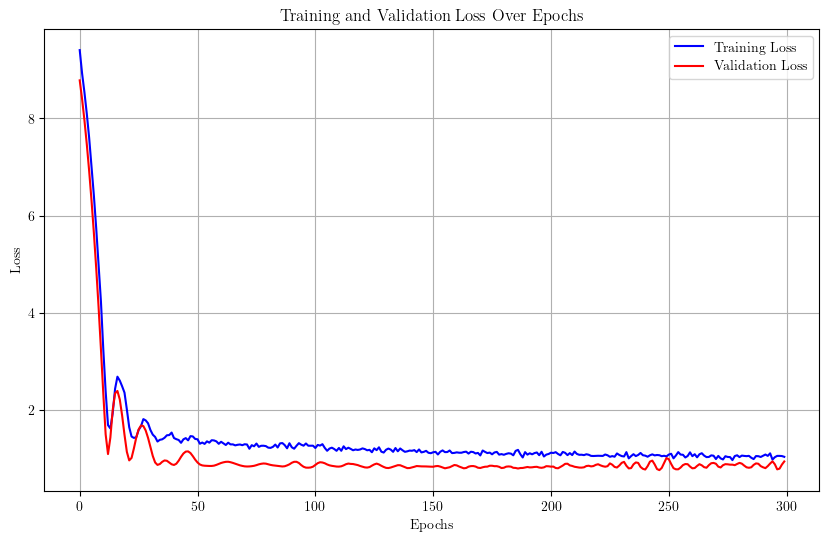

Training run 15/50 for 5% of the data...
Sample size for 5%: 746


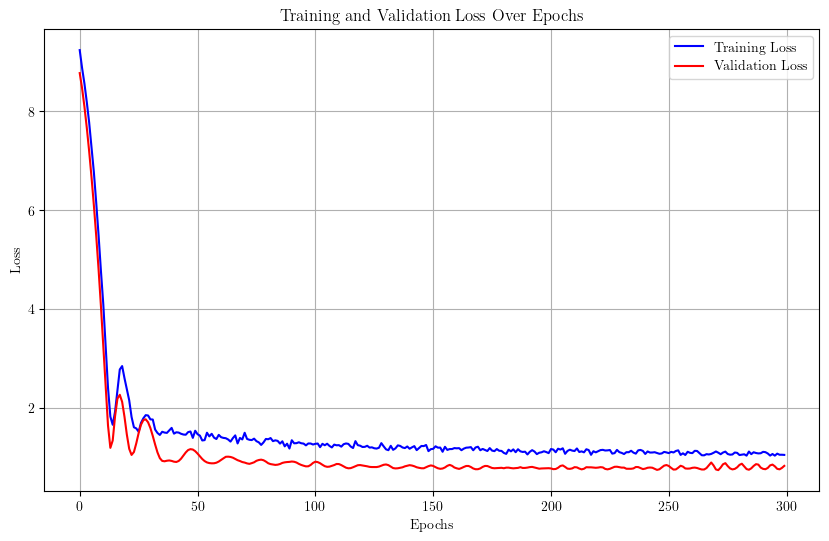

Training run 16/50 for 5% of the data...
Sample size for 5%: 746


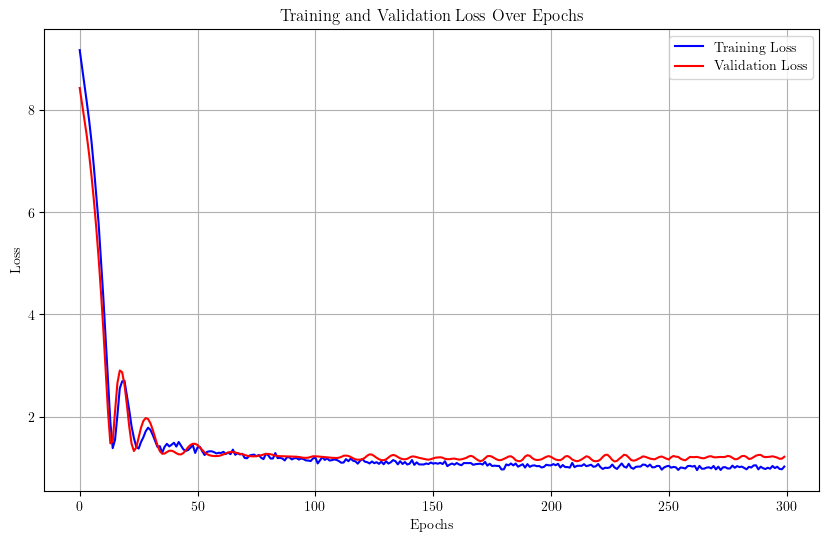

Training run 17/50 for 5% of the data...
Sample size for 5%: 746


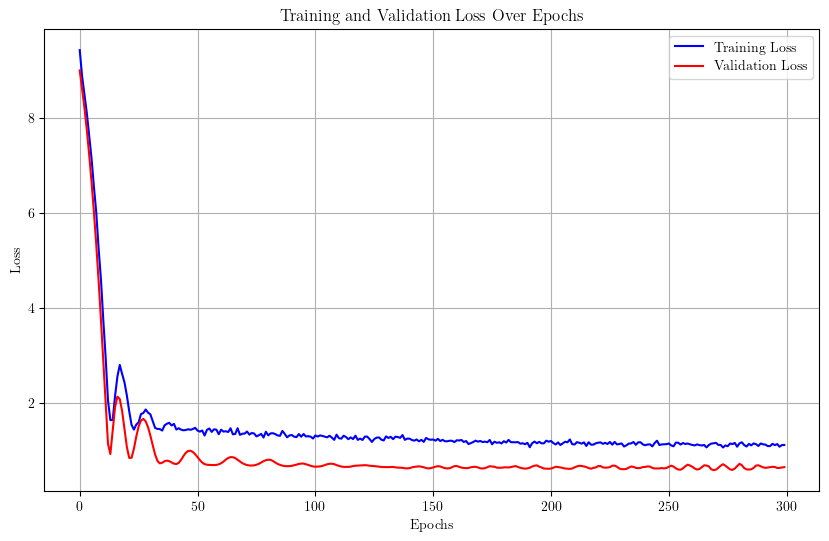

Training run 18/50 for 5% of the data...
Sample size for 5%: 746


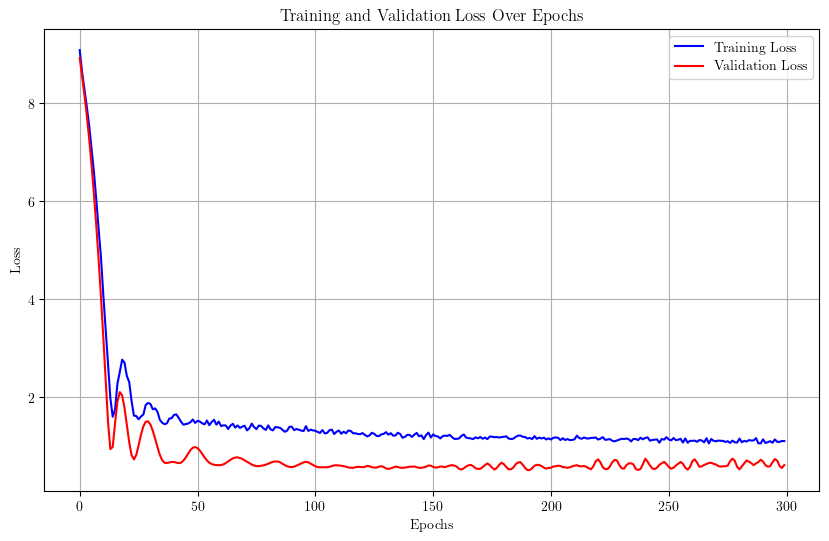

Training run 19/50 for 5% of the data...
Sample size for 5%: 746


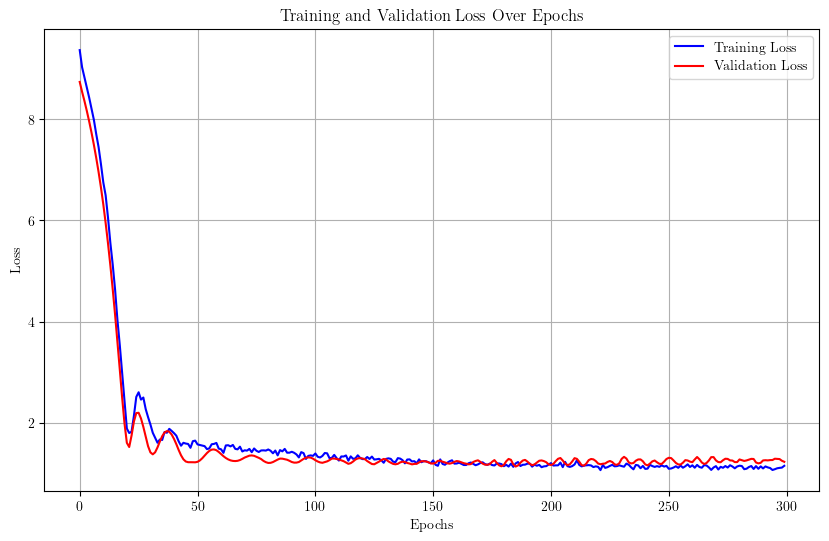

Training run 20/50 for 5% of the data...
Sample size for 5%: 746


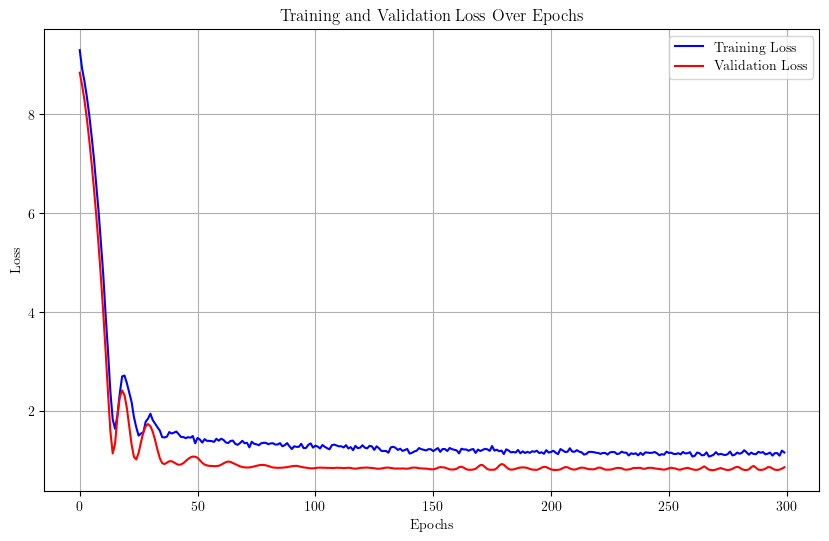

Training run 21/50 for 5% of the data...
Sample size for 5%: 746


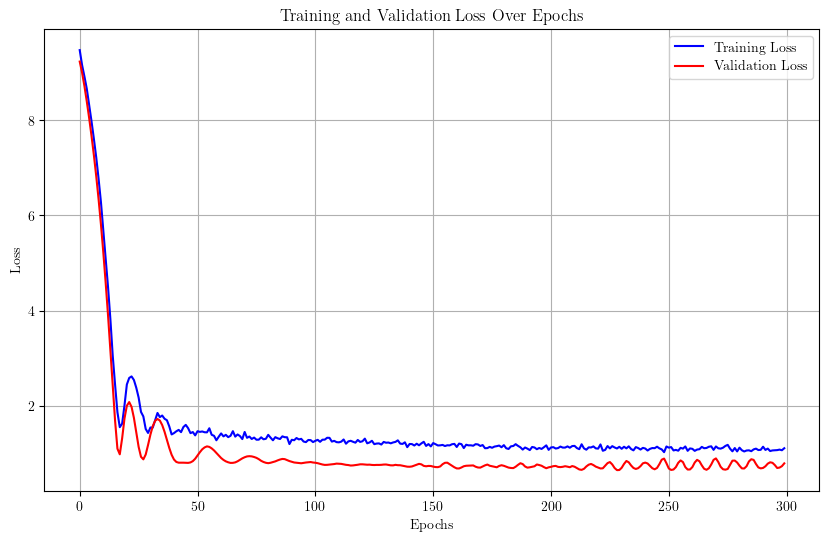

Training run 22/50 for 5% of the data...
Sample size for 5%: 746


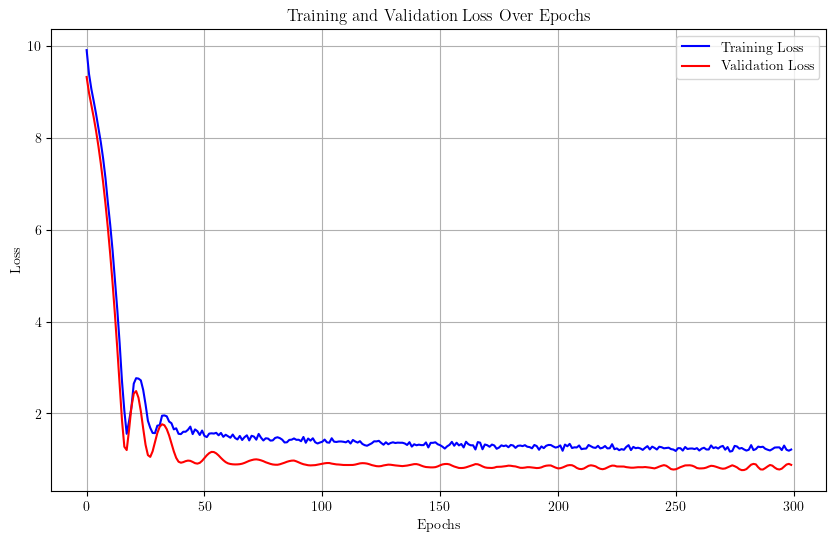

Training run 23/50 for 5% of the data...
Sample size for 5%: 746


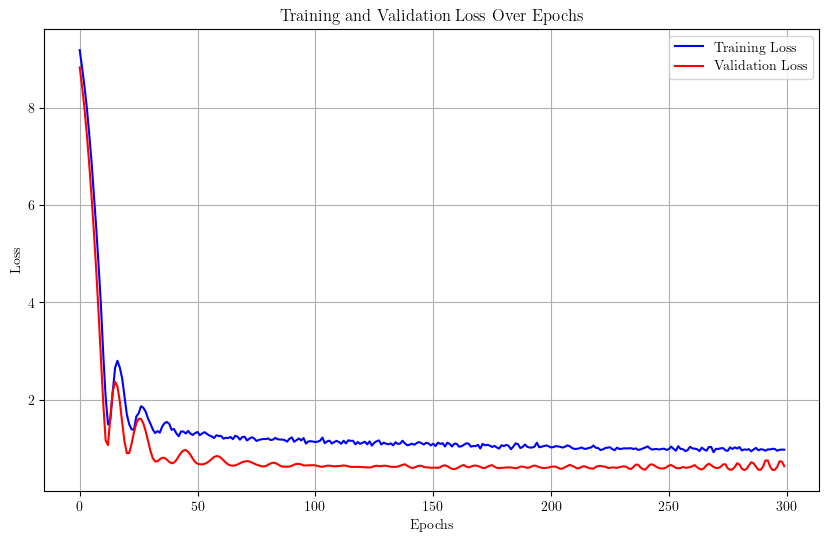

Training run 24/50 for 5% of the data...
Sample size for 5%: 746


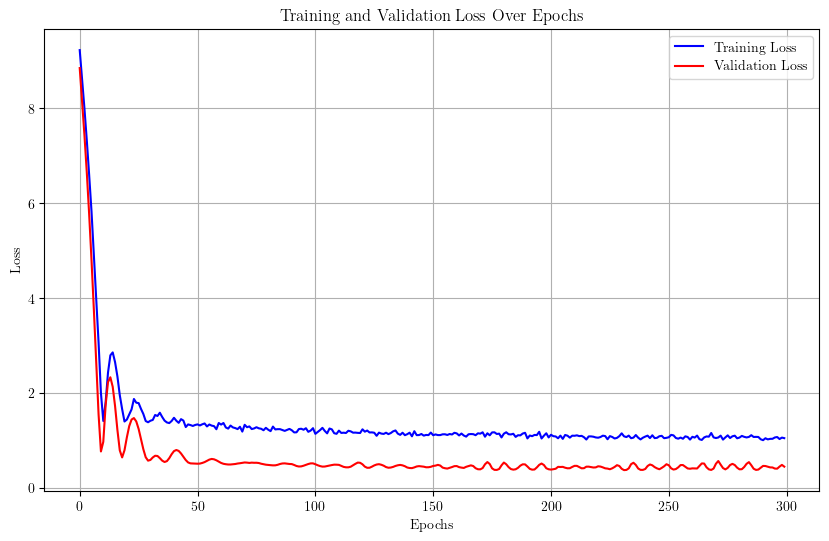

Training run 25/50 for 5% of the data...
Sample size for 5%: 746


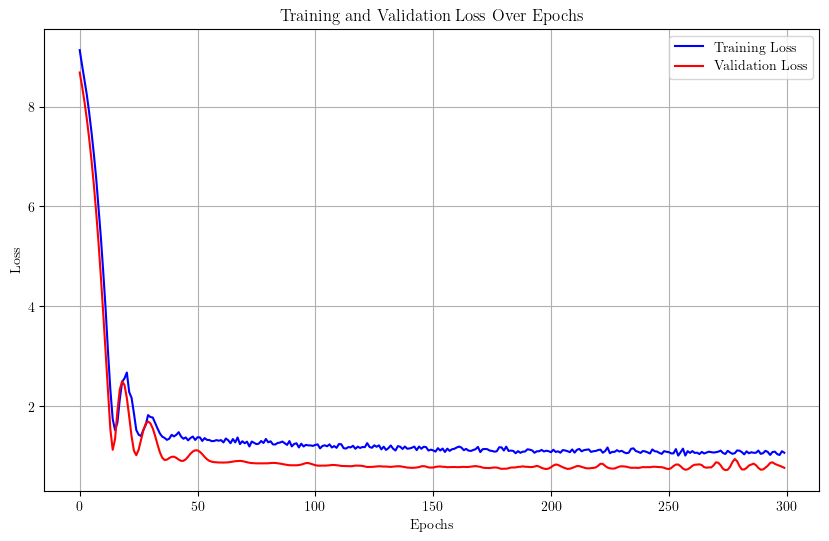

Training run 26/50 for 5% of the data...
Sample size for 5%: 746


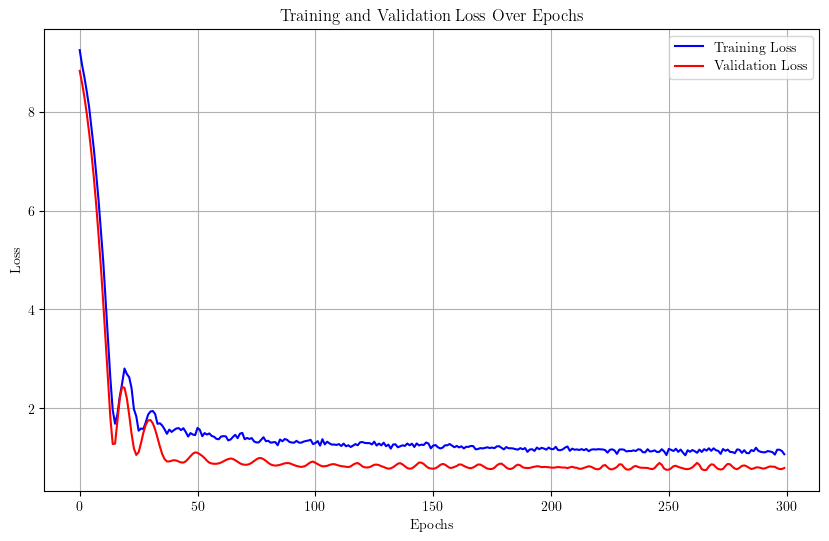

Training run 27/50 for 5% of the data...
Sample size for 5%: 746


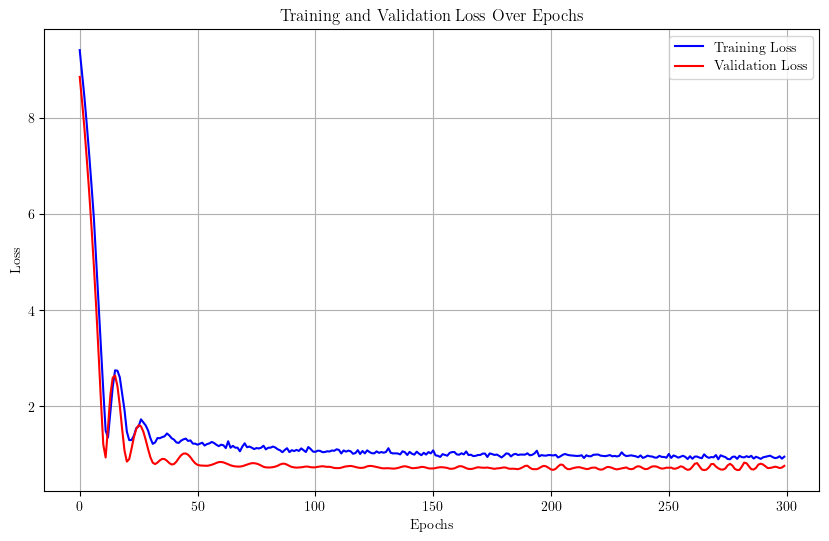

Training run 28/50 for 5% of the data...
Sample size for 5%: 746


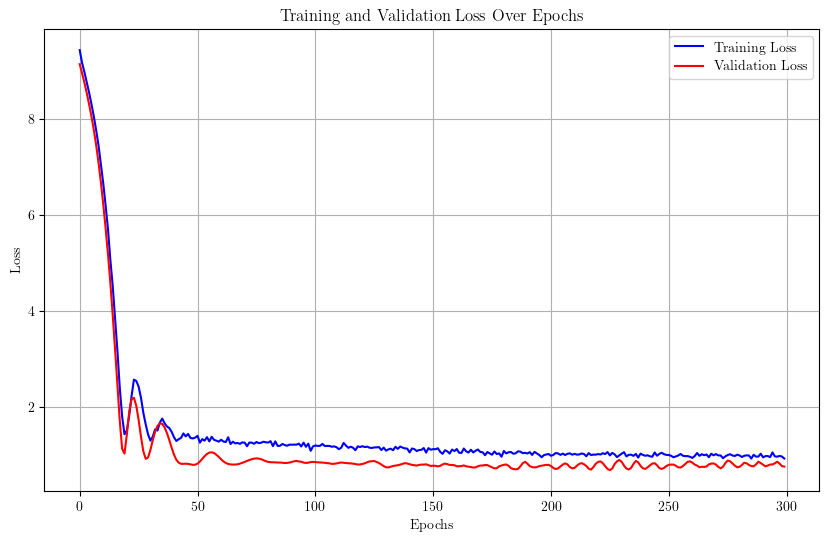

Training run 29/50 for 5% of the data...
Sample size for 5%: 746


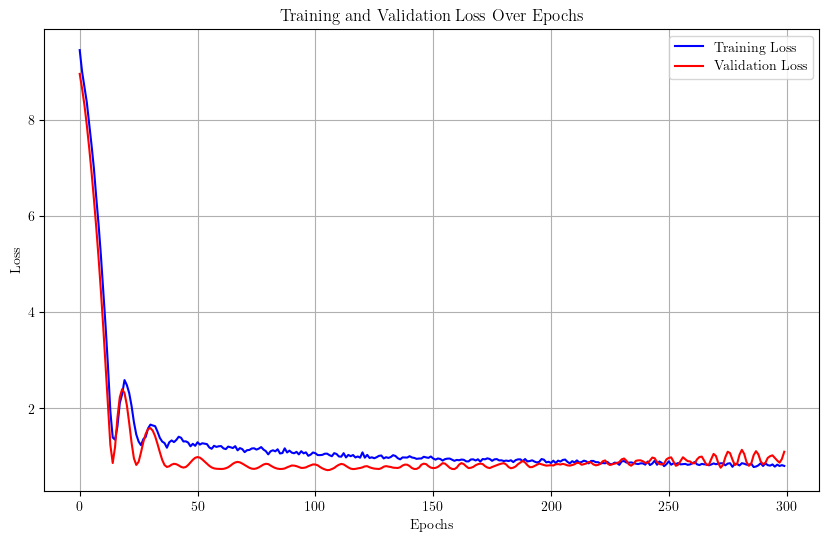

Training run 30/50 for 5% of the data...
Sample size for 5%: 746


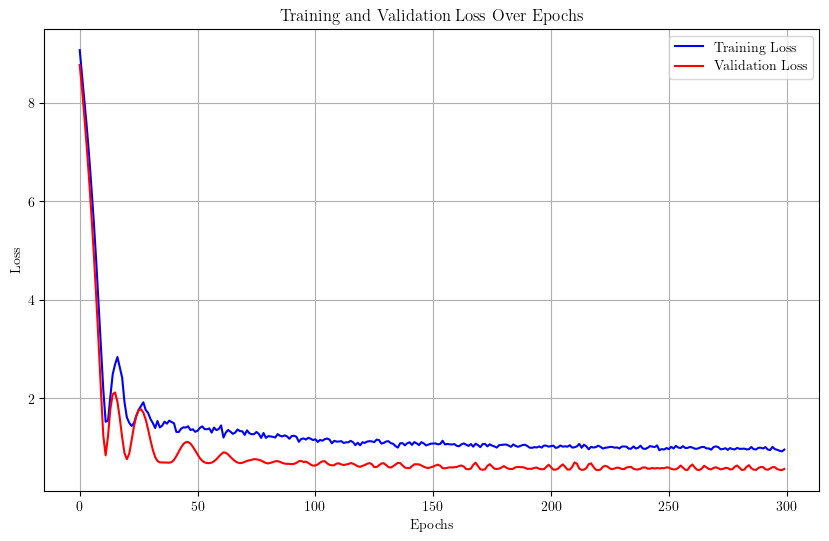

Training run 31/50 for 5% of the data...
Sample size for 5%: 746


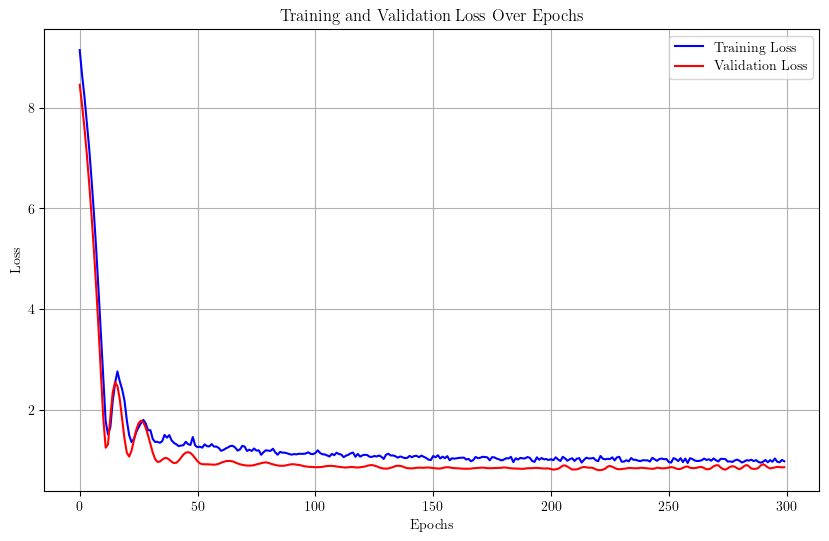

Training run 32/50 for 5% of the data...
Sample size for 5%: 746


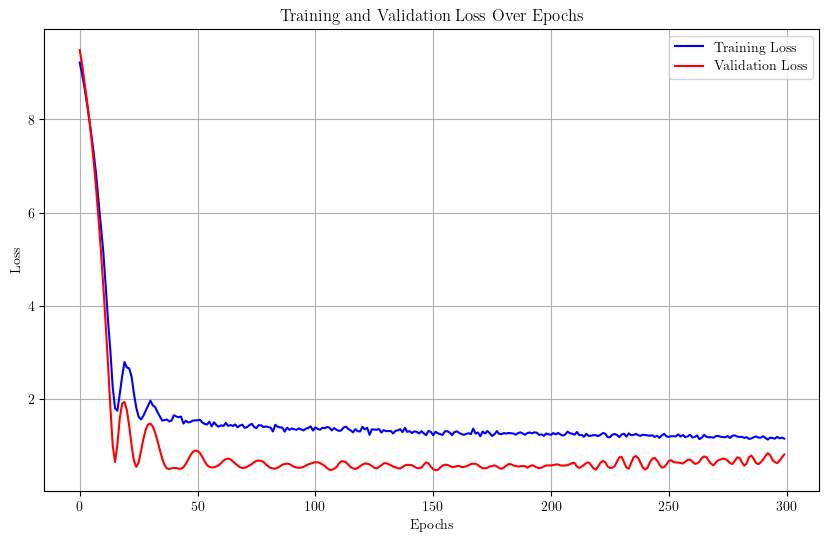

Training run 33/50 for 5% of the data...
Sample size for 5%: 746


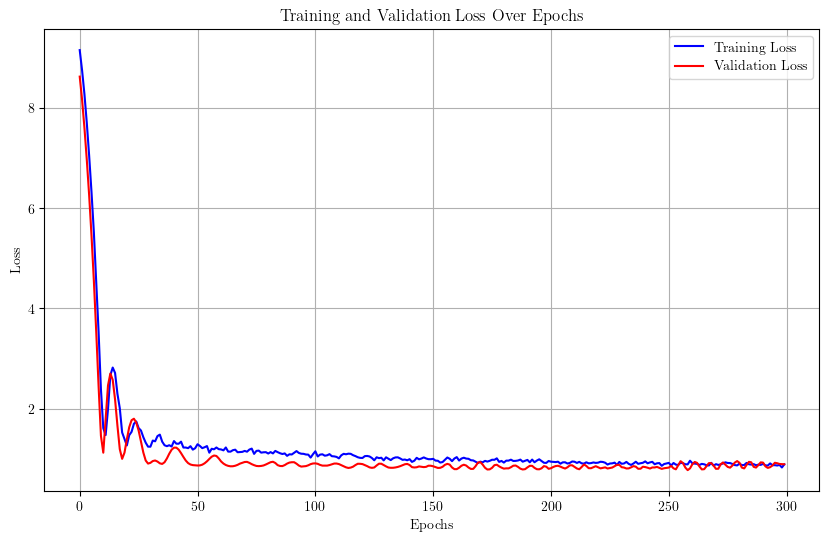

Training run 34/50 for 5% of the data...
Sample size for 5%: 746


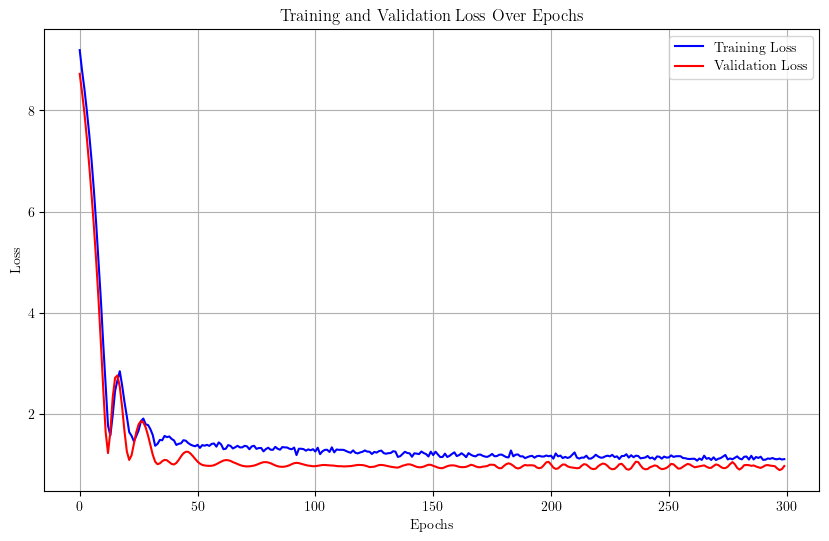

Training run 35/50 for 5% of the data...
Sample size for 5%: 746


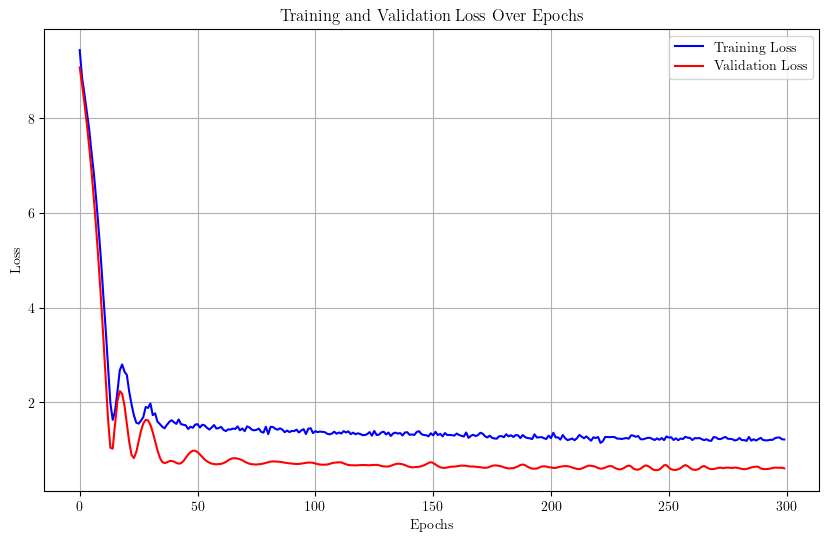

Training run 36/50 for 5% of the data...
Sample size for 5%: 746


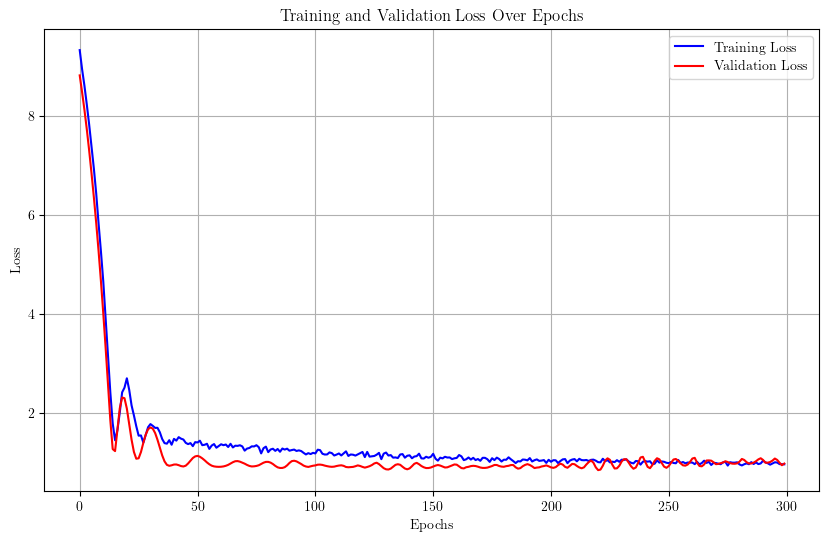

Training run 37/50 for 5% of the data...
Sample size for 5%: 746


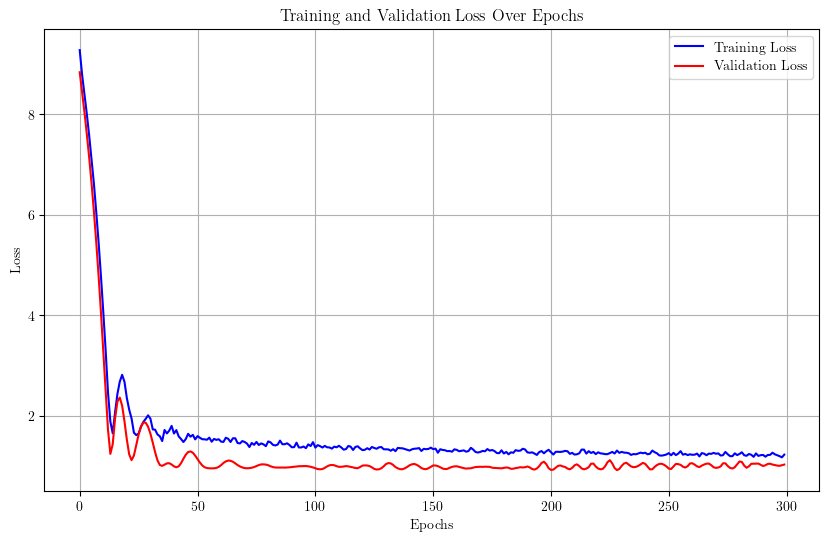

Training run 38/50 for 5% of the data...
Sample size for 5%: 746


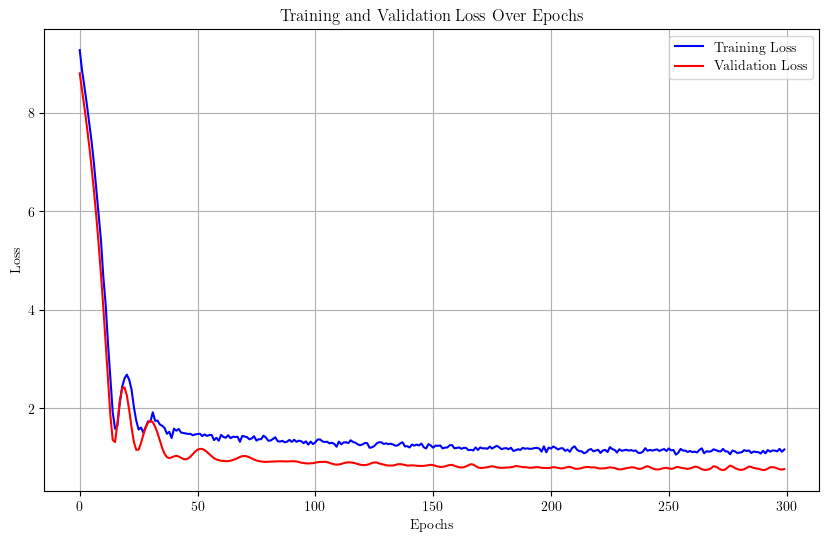

Training run 39/50 for 5% of the data...
Sample size for 5%: 746


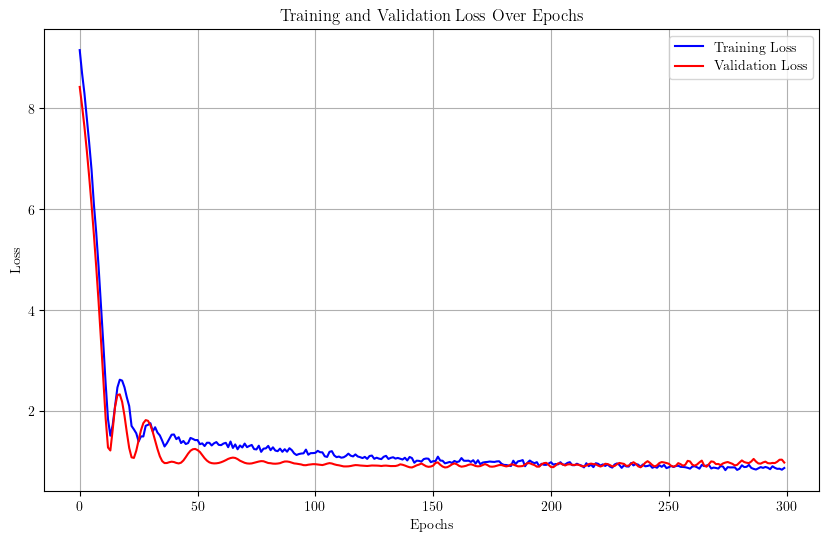

Training run 40/50 for 5% of the data...
Sample size for 5%: 746


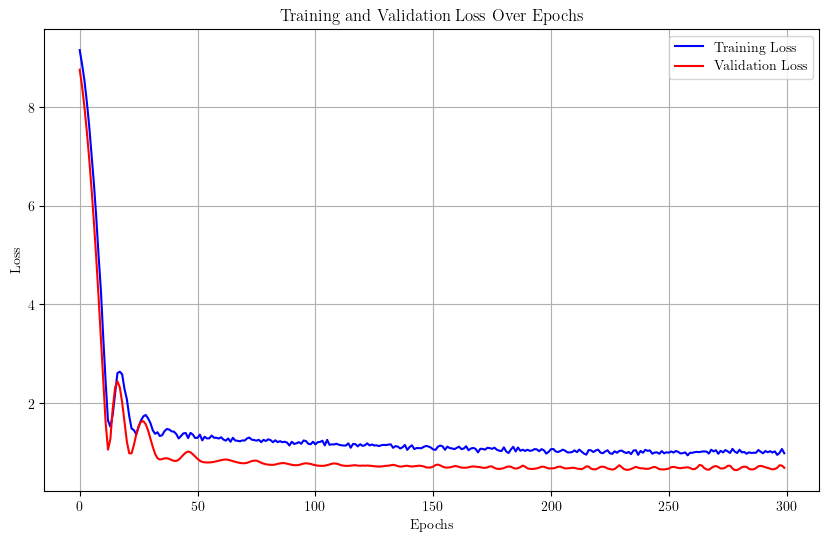

Training run 41/50 for 5% of the data...
Sample size for 5%: 746


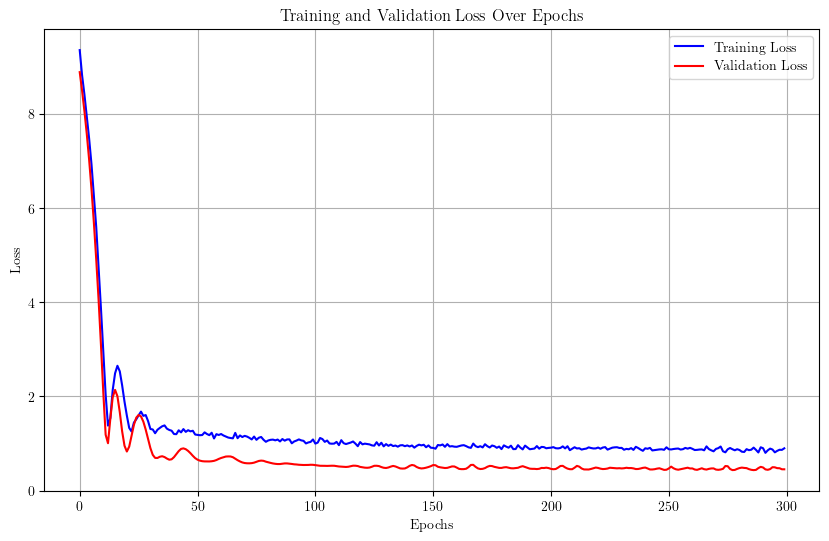

Training run 42/50 for 5% of the data...
Sample size for 5%: 746


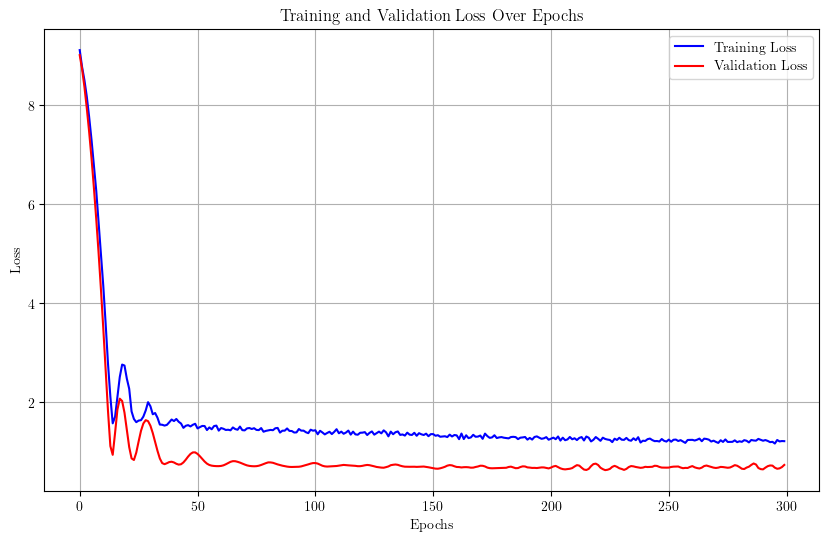

Training run 43/50 for 5% of the data...
Sample size for 5%: 746


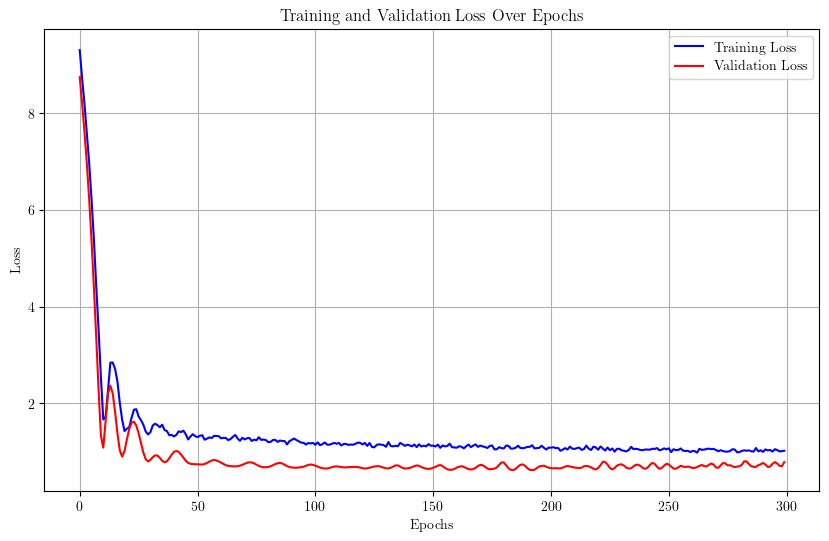

Training run 44/50 for 5% of the data...
Sample size for 5%: 746


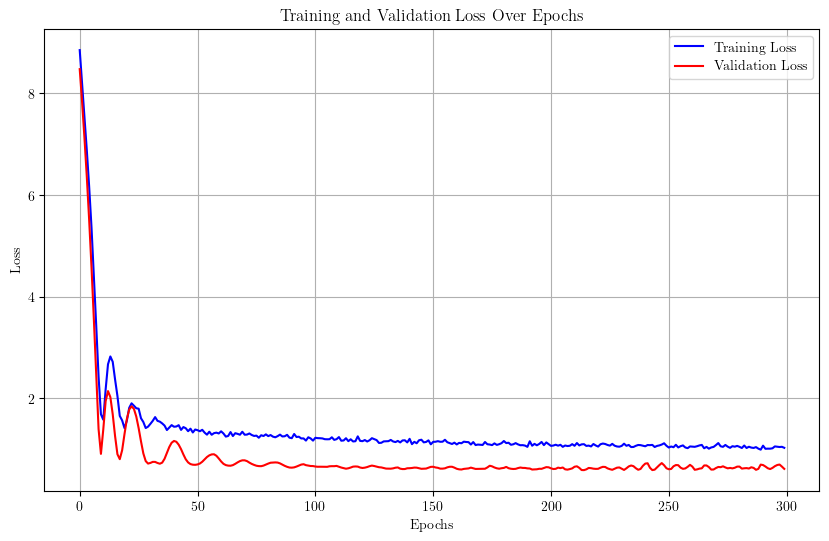

Training run 45/50 for 5% of the data...
Sample size for 5%: 746


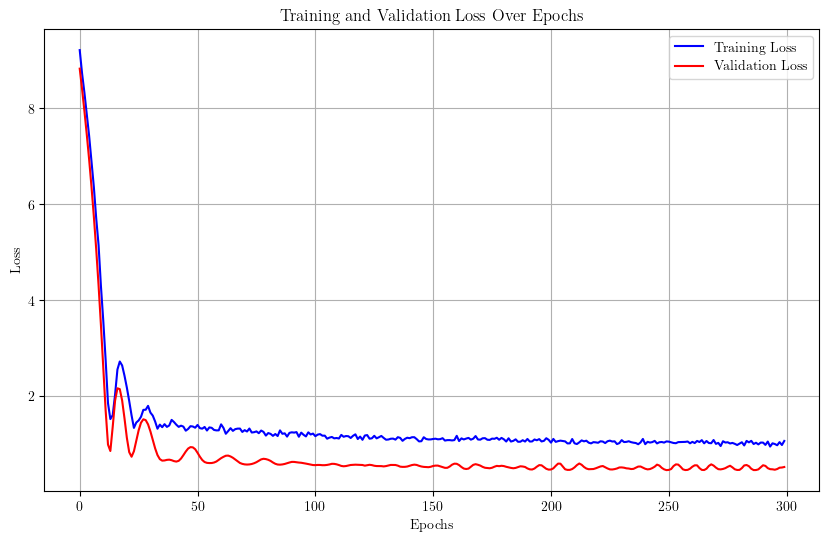

Training run 46/50 for 5% of the data...
Sample size for 5%: 746


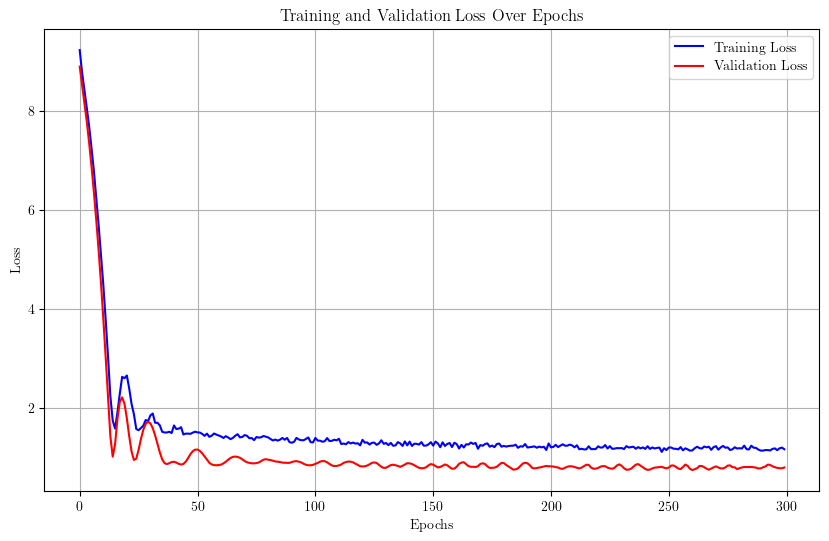

Training run 47/50 for 5% of the data...
Sample size for 5%: 746


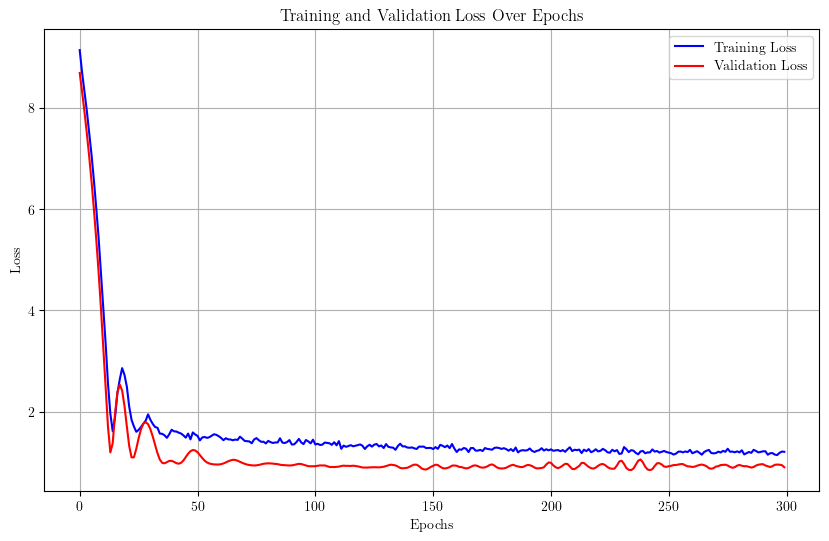

Training run 48/50 for 5% of the data...
Sample size for 5%: 746


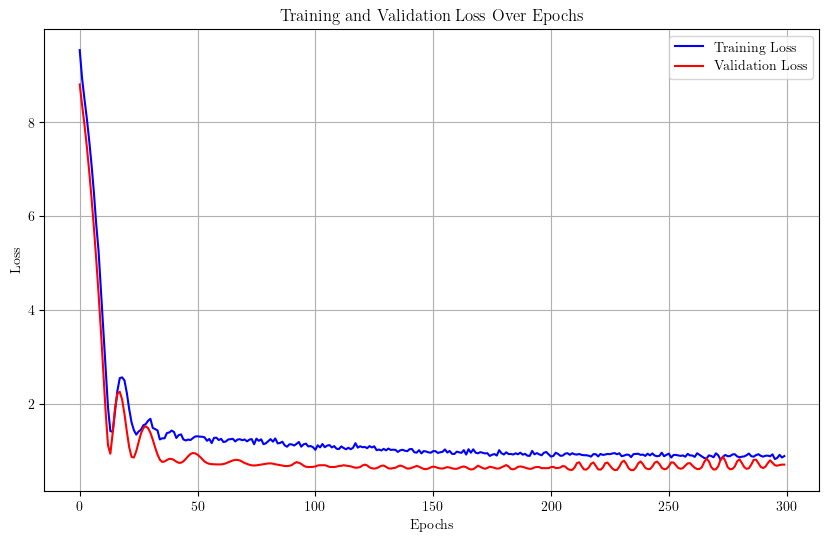

Training run 49/50 for 5% of the data...
Sample size for 5%: 746


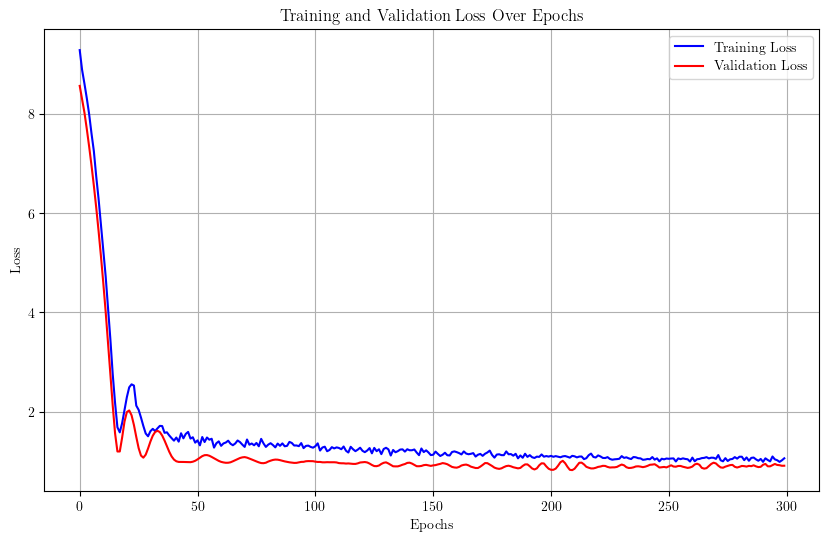

Training run 50/50 for 5% of the data...
Sample size for 5%: 746


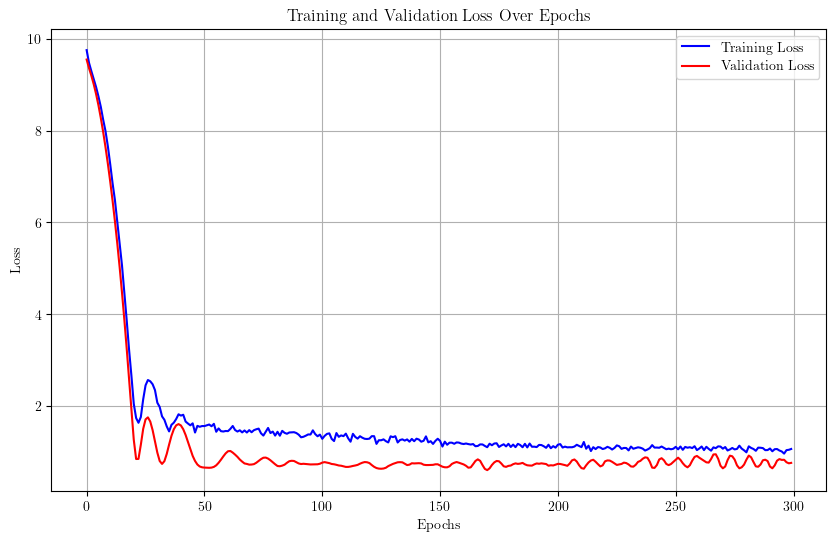

Metrics for 5% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(6.4070764), 'mae': np.float32(1.1659993), 'r2': np.float64(-0.020248790979385378), 'bias': np.float32(0.5271891), 'nmad': np.float32(0.035815634), 'sigma_68': np.float32(0.038252488), 'outlier_fraction': np.float64(6.253333333333333)}
Metrics Across Runs:
mse: 6.4071 ± 1.7401
mae: 1.1660 ± 0.2080
r2: -0.0202 ± 0.0442
bias: 0.5272 ± 0.1785
nmad: 0.0358 ± 0.0041
sigma_68: 0.0383 ± 0.0048
outlier_fraction: 6.2533 ± 1.7733
Training model for 10% of the data...
Training run 1/50 for 10% of the data...
Sample size for 10%: 1493


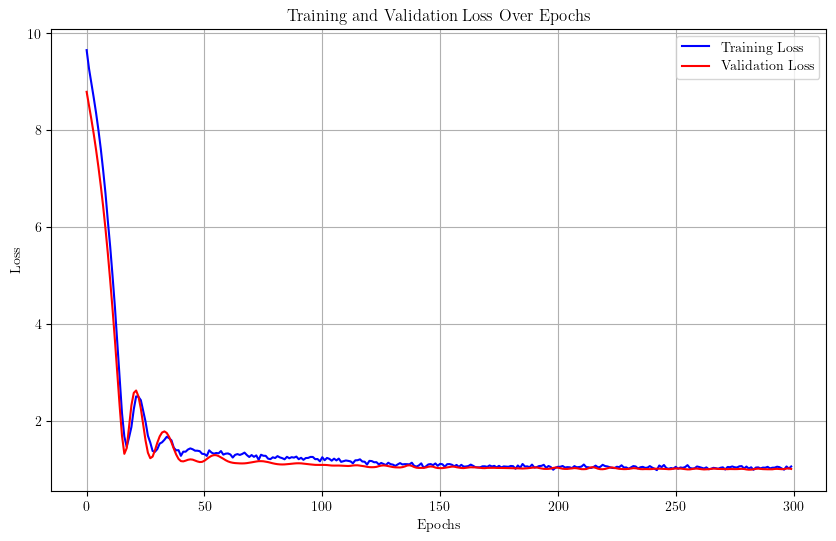

Training run 2/50 for 10% of the data...
Sample size for 10%: 1493


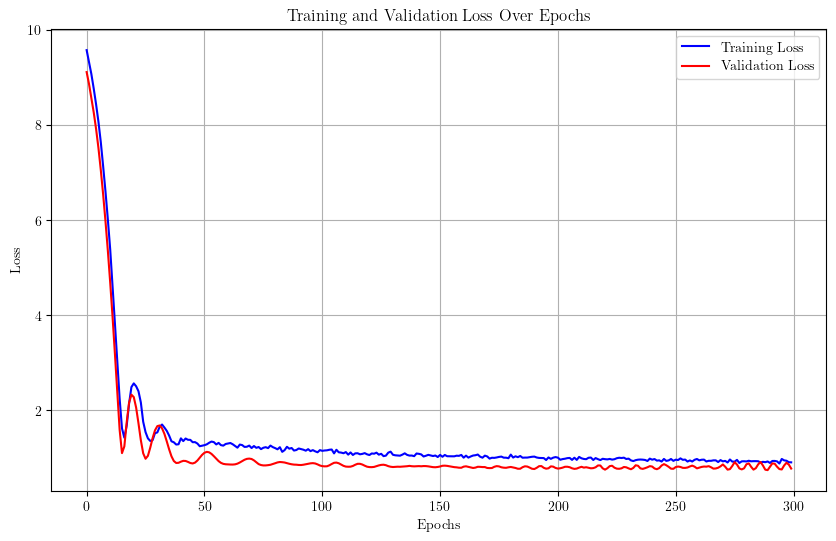

Training run 3/50 for 10% of the data...
Sample size for 10%: 1493


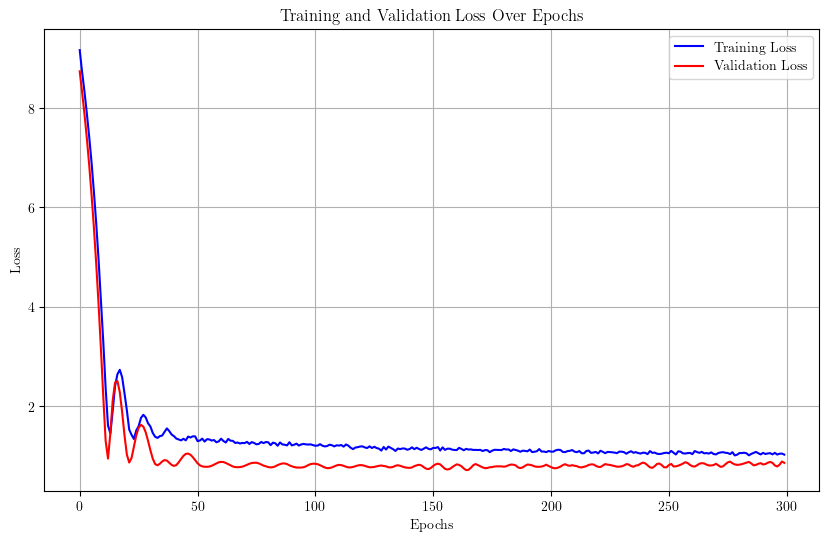

Training run 4/50 for 10% of the data...
Sample size for 10%: 1493


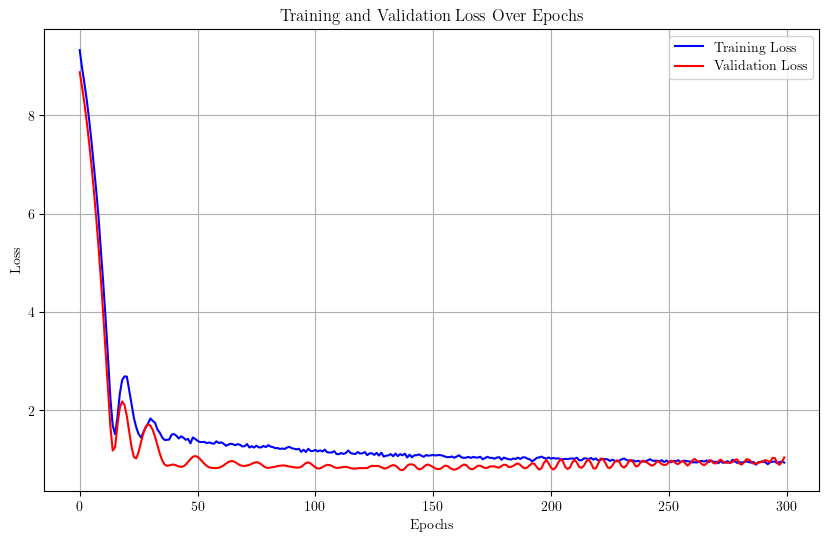

Training run 5/50 for 10% of the data...
Sample size for 10%: 1493


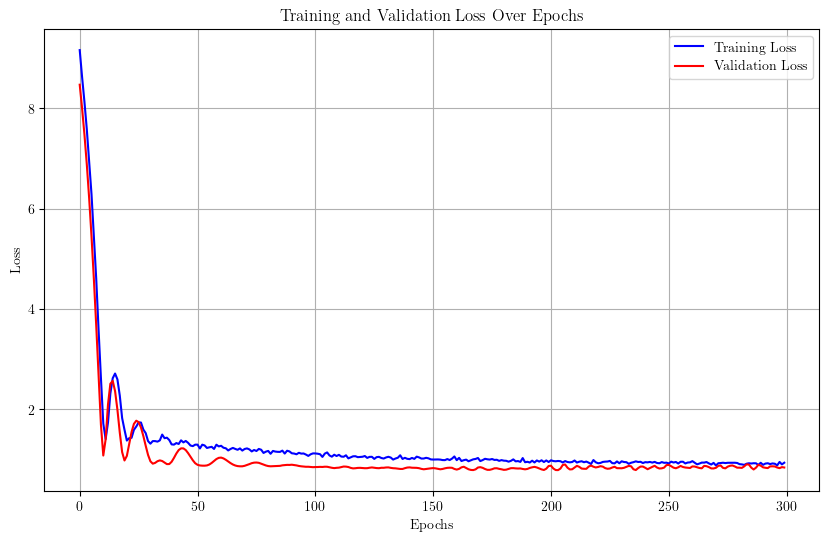

Training run 6/50 for 10% of the data...
Sample size for 10%: 1493


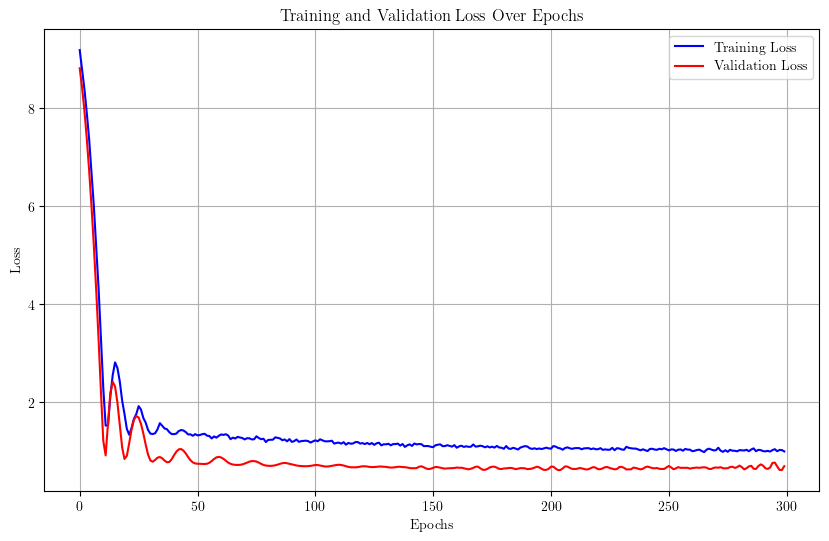

Training run 7/50 for 10% of the data...
Sample size for 10%: 1493


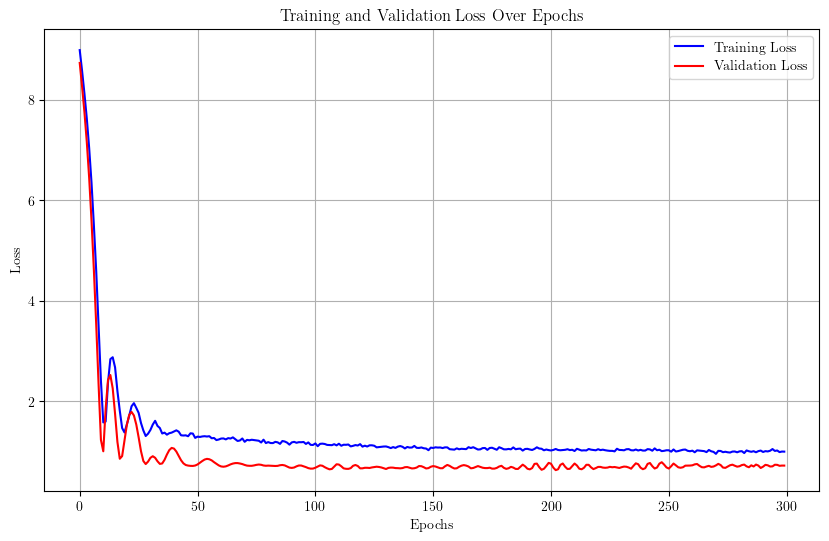

Training run 8/50 for 10% of the data...
Sample size for 10%: 1493


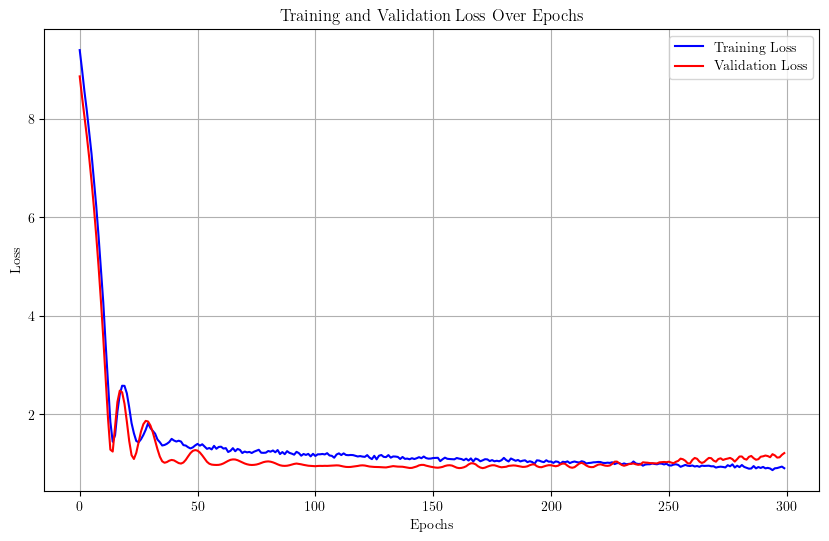

Training run 9/50 for 10% of the data...
Sample size for 10%: 1493


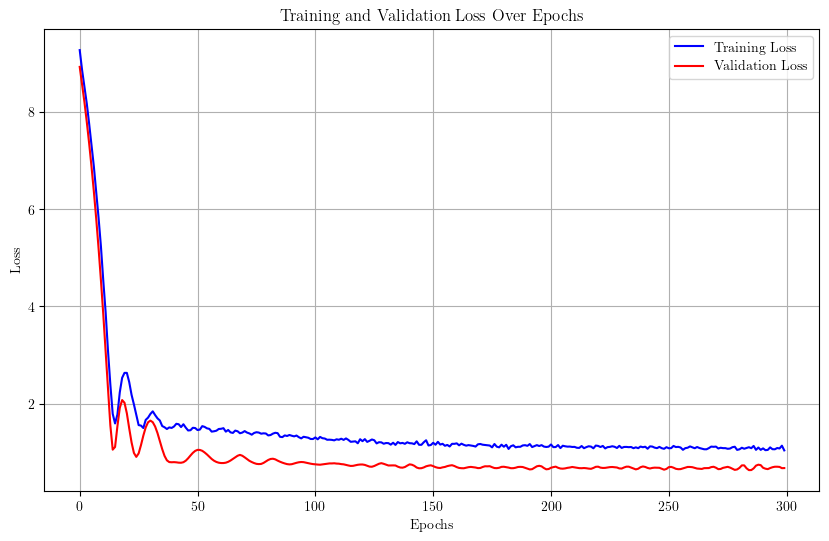

Training run 10/50 for 10% of the data...
Sample size for 10%: 1493


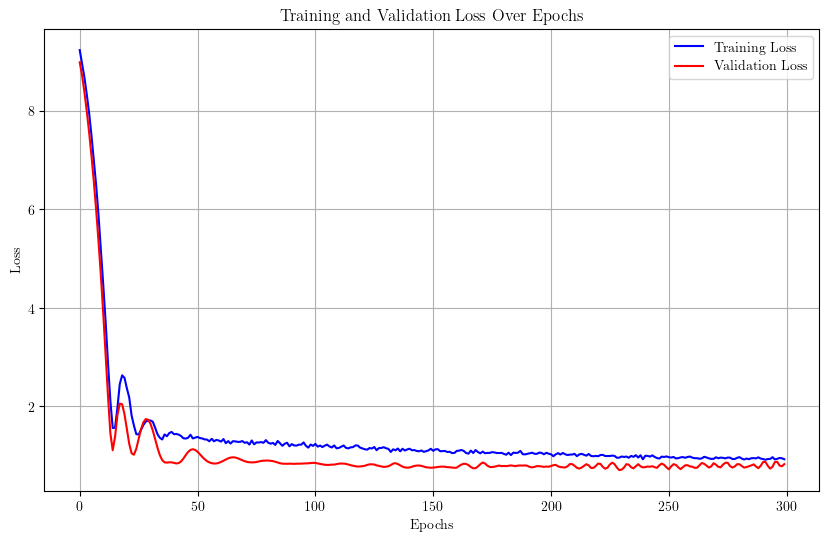

Training run 11/50 for 10% of the data...
Sample size for 10%: 1493


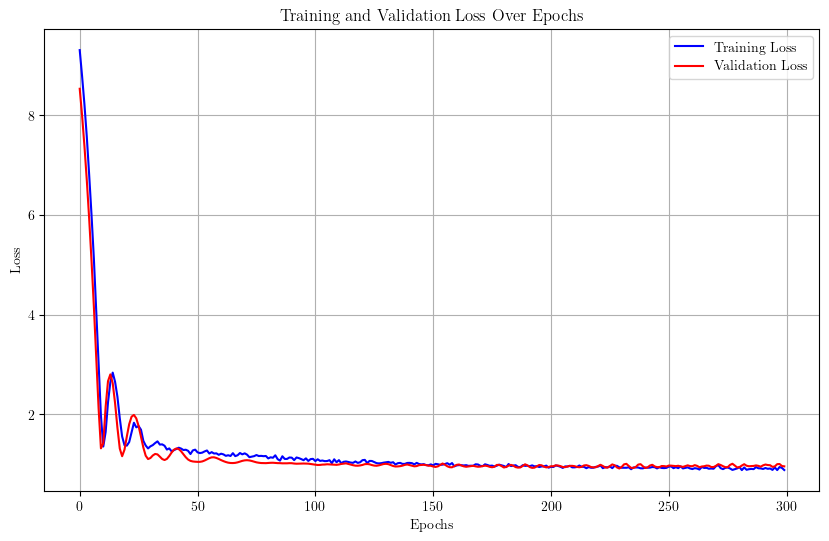

Training run 12/50 for 10% of the data...
Sample size for 10%: 1493


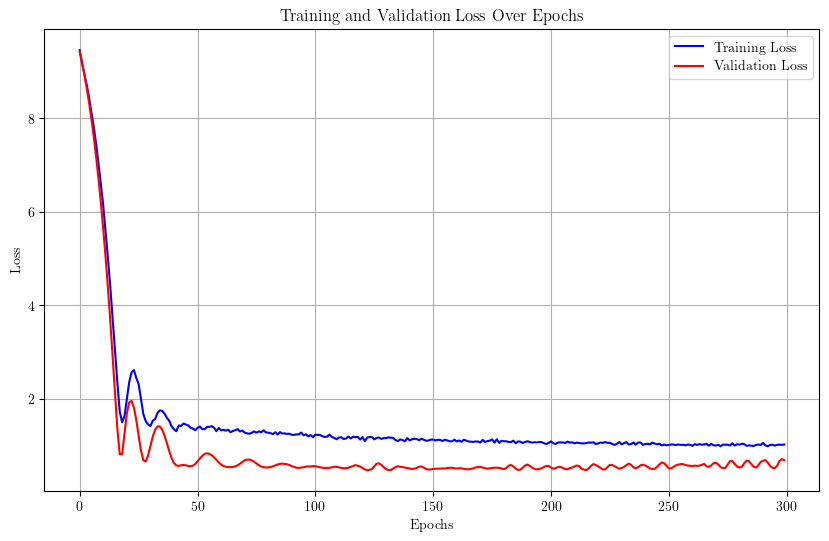

Training run 13/50 for 10% of the data...
Sample size for 10%: 1493


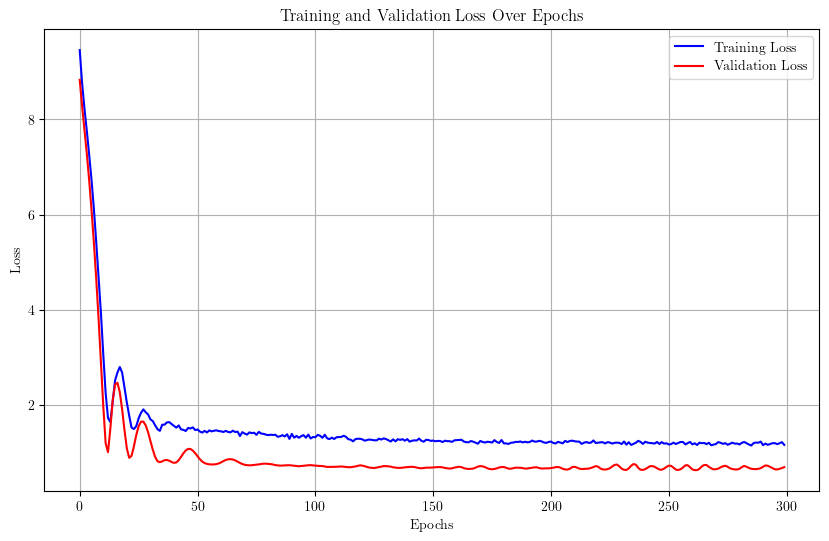

Training run 14/50 for 10% of the data...
Sample size for 10%: 1493


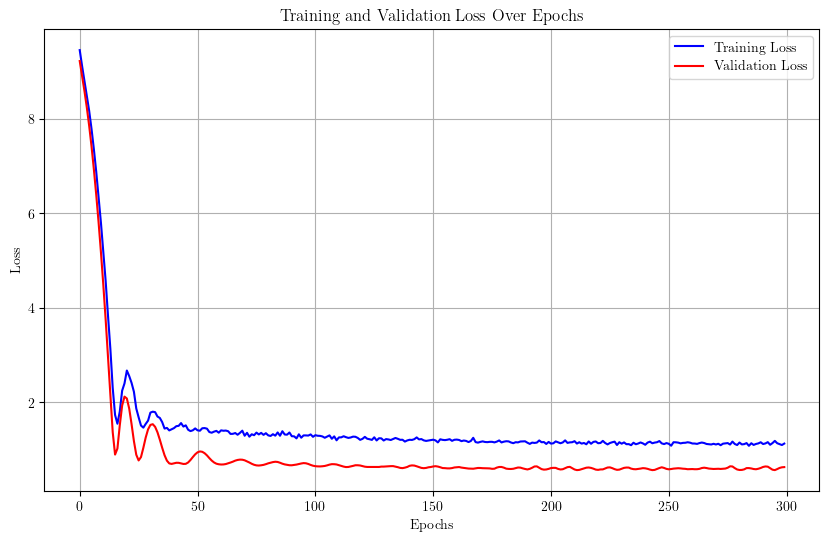

Training run 15/50 for 10% of the data...
Sample size for 10%: 1493


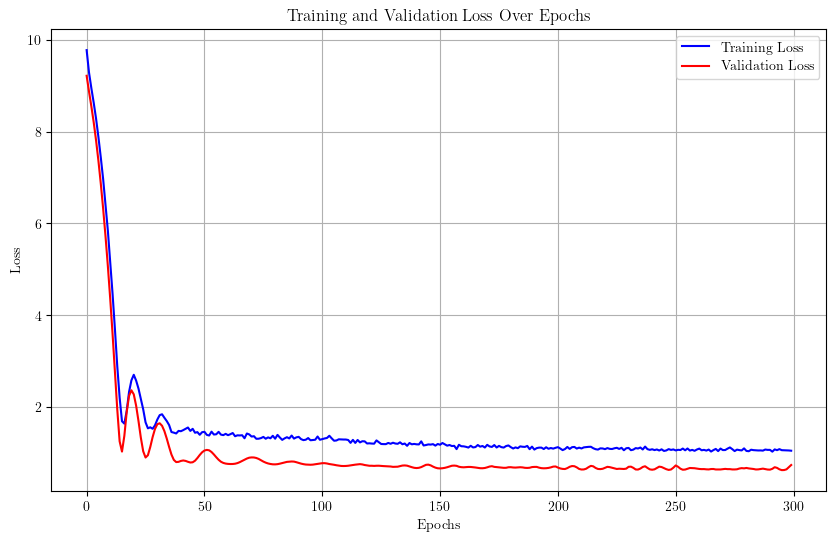

Training run 16/50 for 10% of the data...
Sample size for 10%: 1493


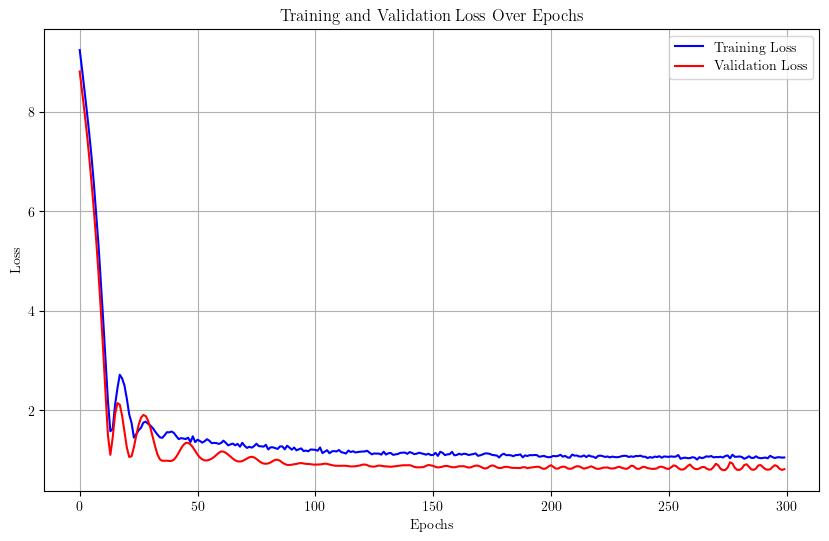

Training run 17/50 for 10% of the data...
Sample size for 10%: 1493


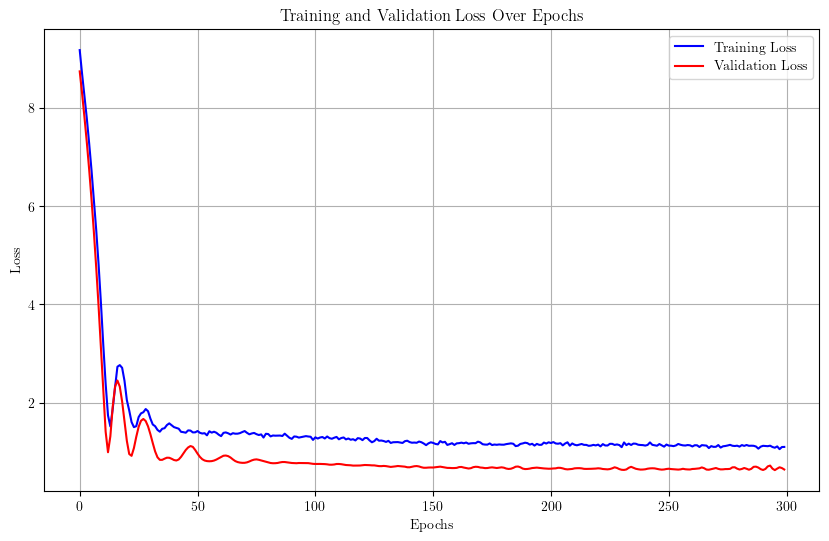

Training run 18/50 for 10% of the data...
Sample size for 10%: 1493


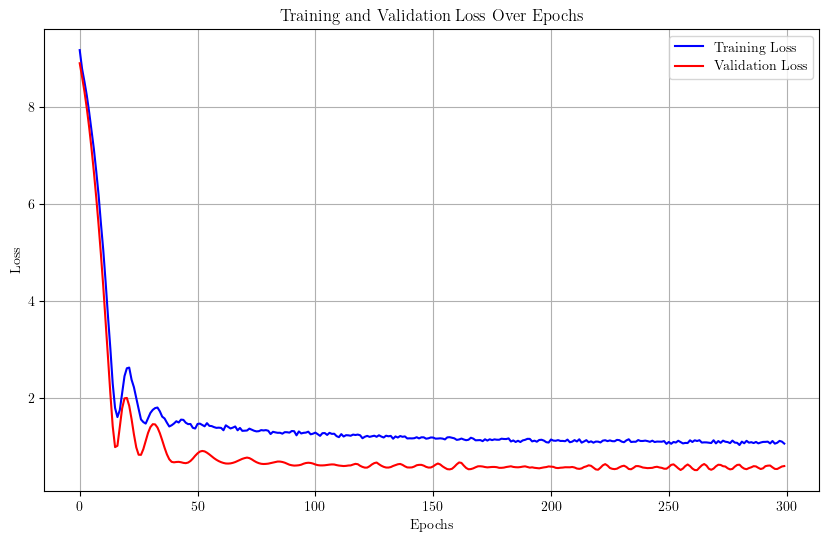

Training run 19/50 for 10% of the data...
Sample size for 10%: 1493


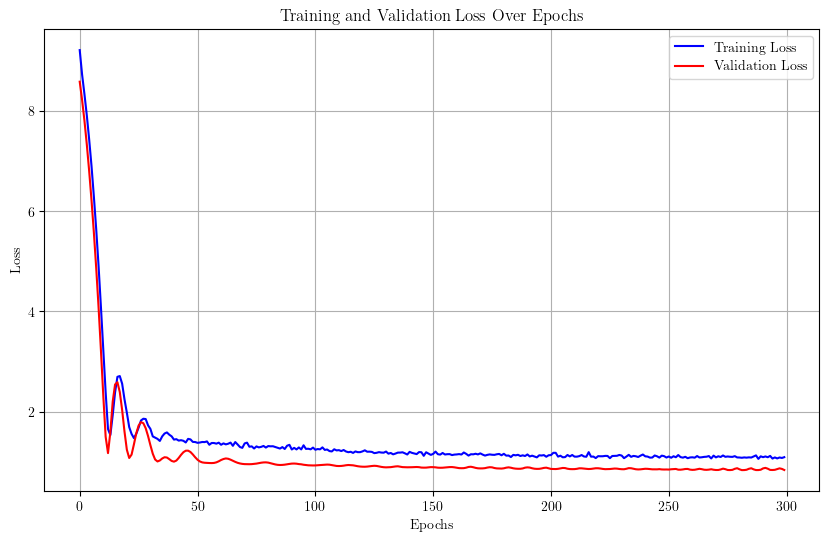

Training run 20/50 for 10% of the data...
Sample size for 10%: 1493


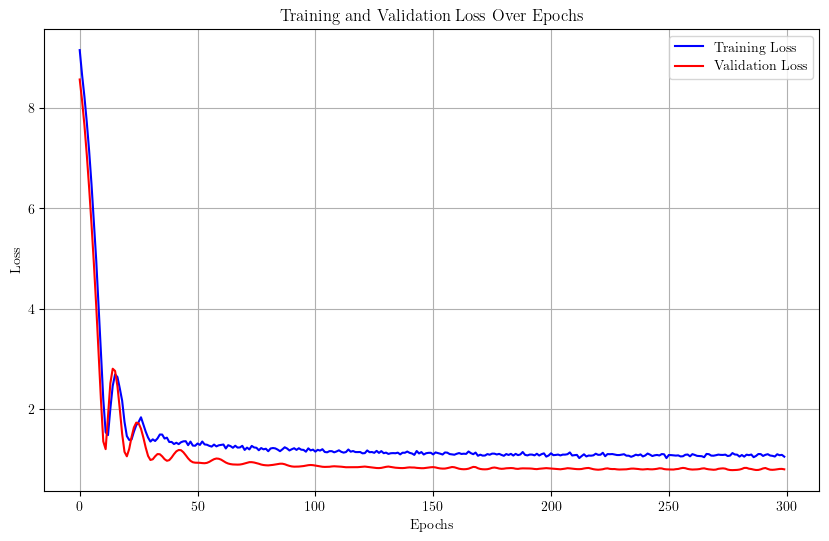

Training run 21/50 for 10% of the data...
Sample size for 10%: 1493


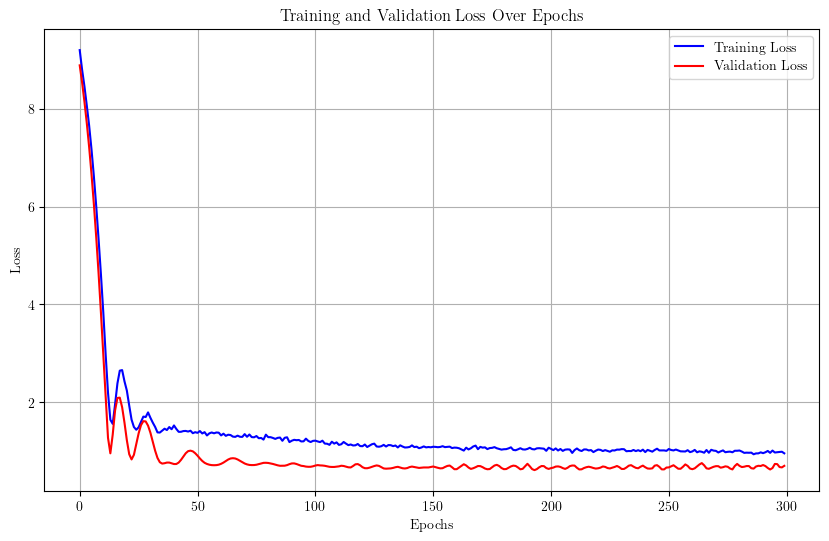

Training run 22/50 for 10% of the data...
Sample size for 10%: 1493


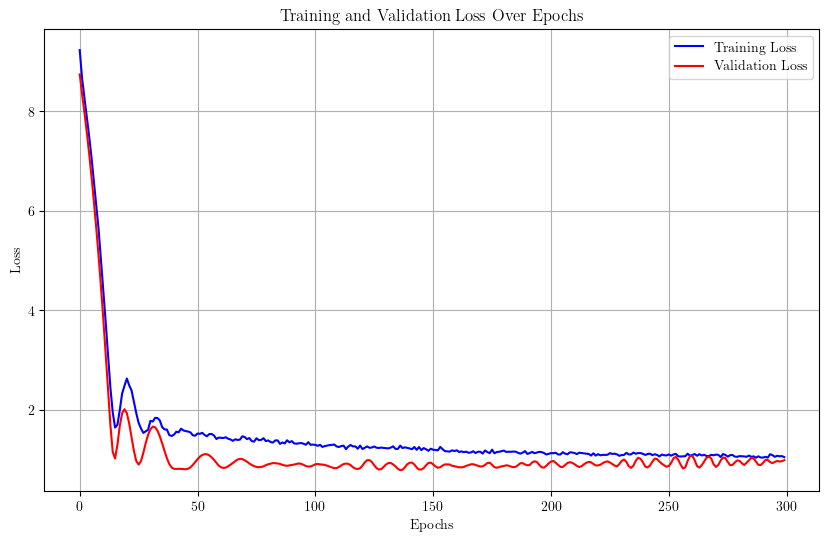

Training run 23/50 for 10% of the data...
Sample size for 10%: 1493


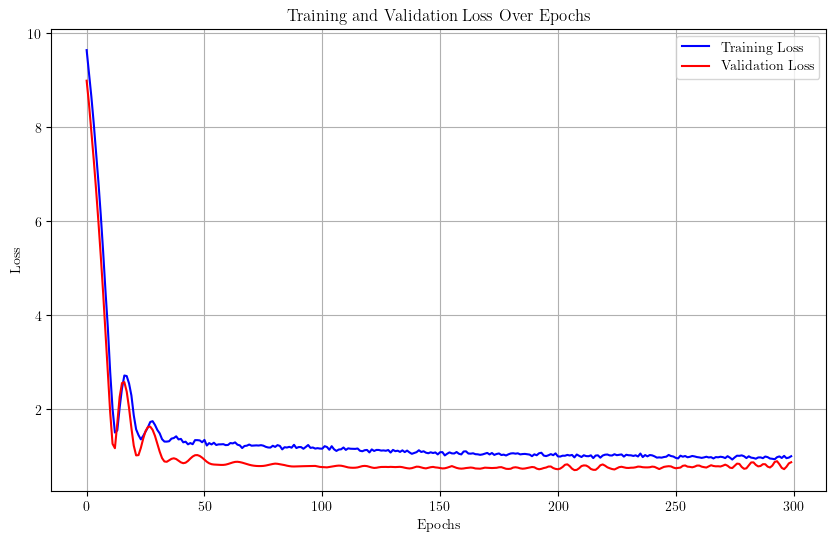

Training run 24/50 for 10% of the data...
Sample size for 10%: 1493


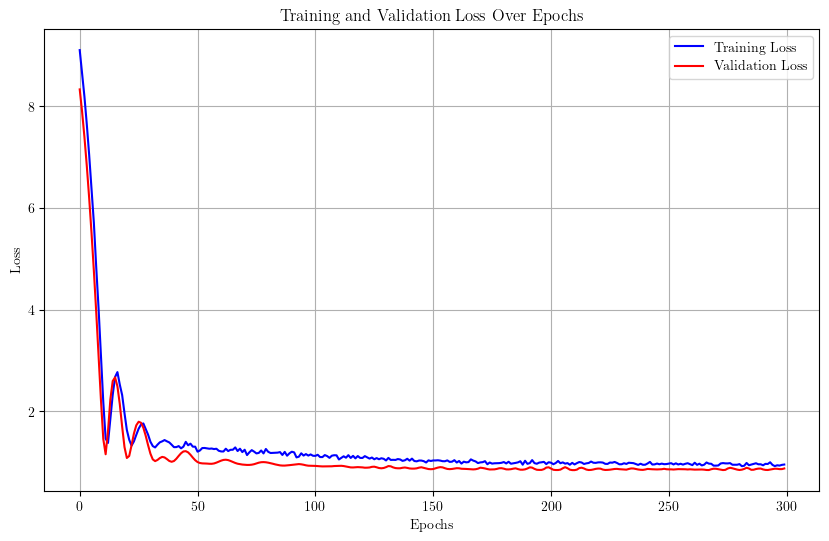

Training run 25/50 for 10% of the data...
Sample size for 10%: 1493


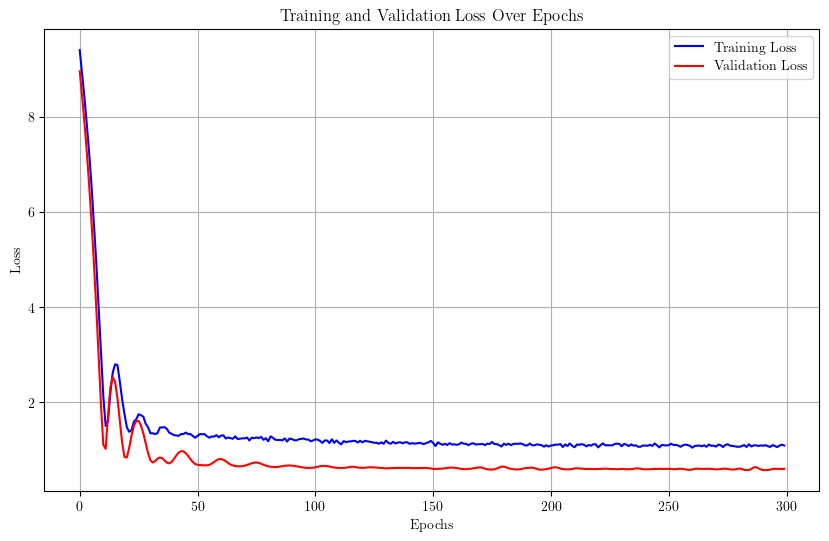

Training run 26/50 for 10% of the data...
Sample size for 10%: 1493


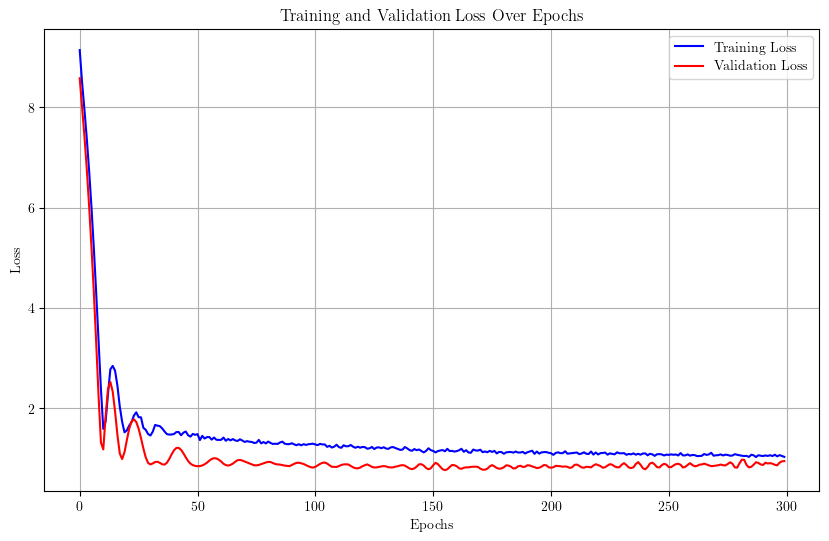

Training run 27/50 for 10% of the data...
Sample size for 10%: 1493


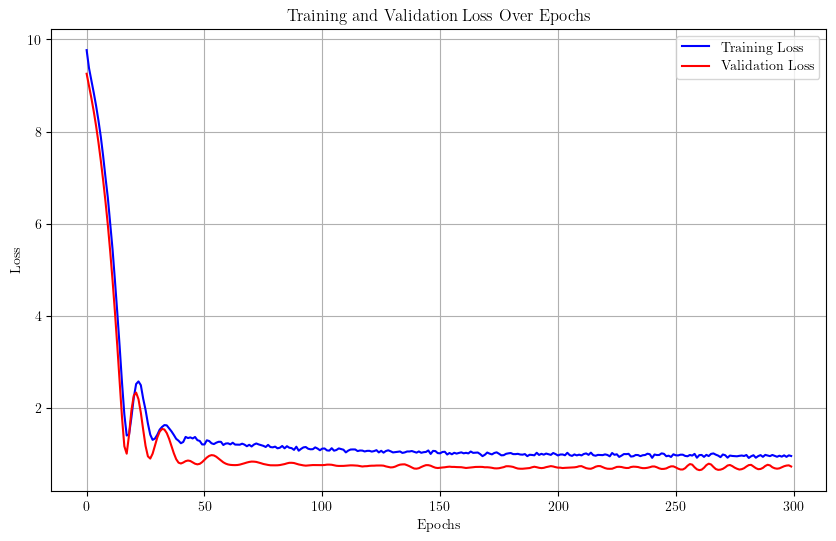

Training run 28/50 for 10% of the data...
Sample size for 10%: 1493


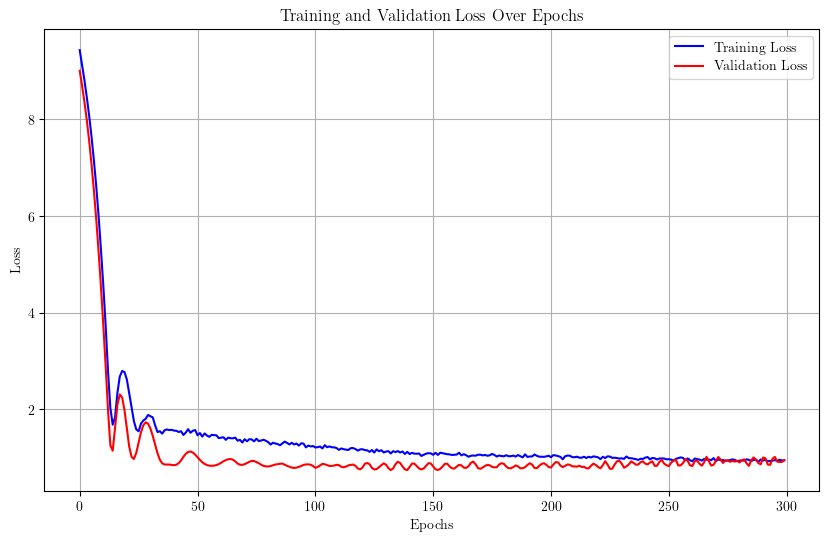

Training run 29/50 for 10% of the data...
Sample size for 10%: 1493


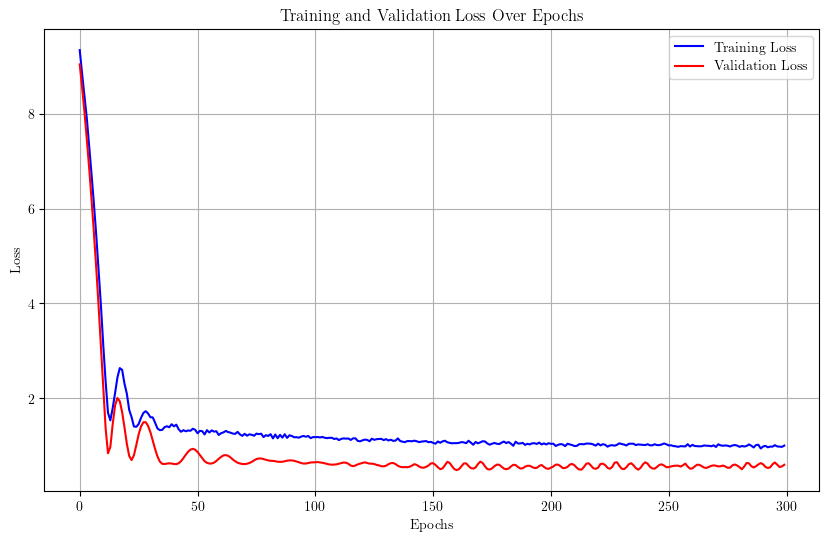

Training run 30/50 for 10% of the data...
Sample size for 10%: 1493


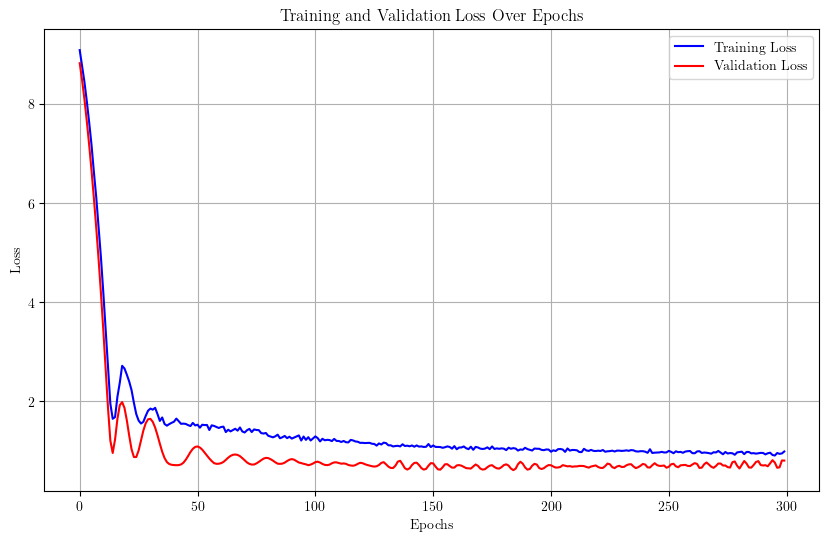

Training run 31/50 for 10% of the data...
Sample size for 10%: 1493


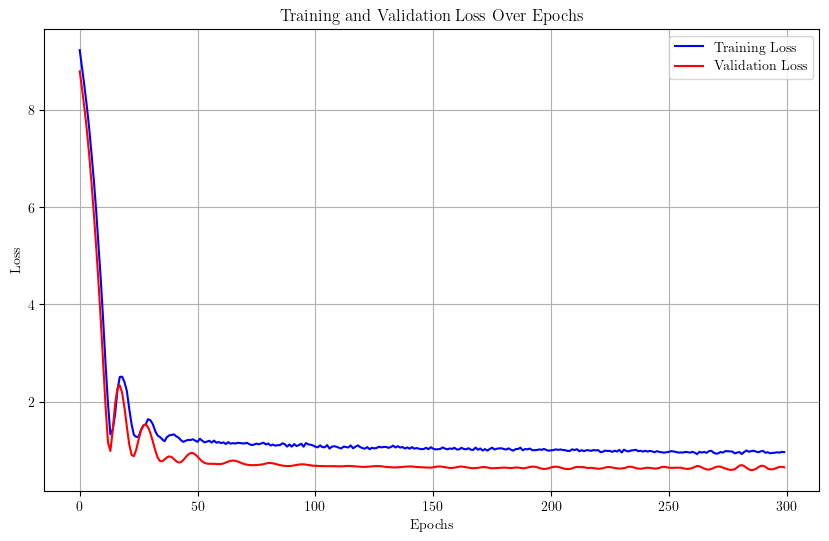

Training run 32/50 for 10% of the data...
Sample size for 10%: 1493


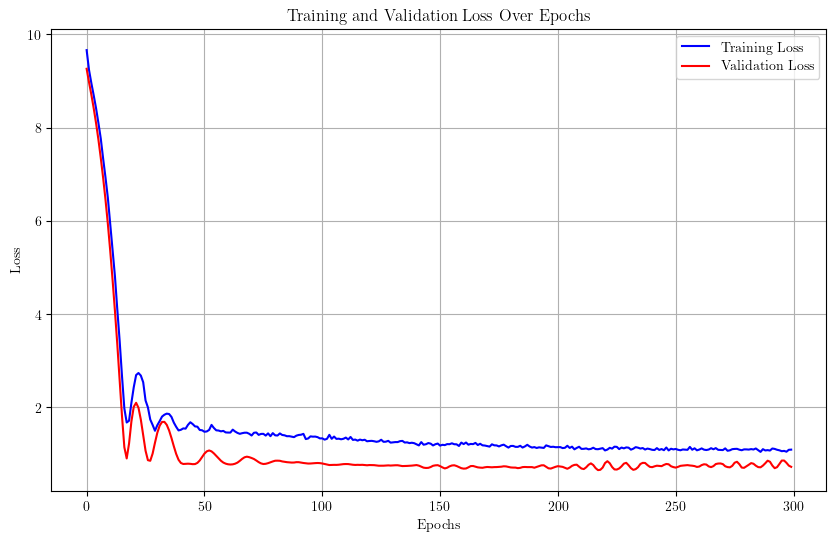

Training run 33/50 for 10% of the data...
Sample size for 10%: 1493


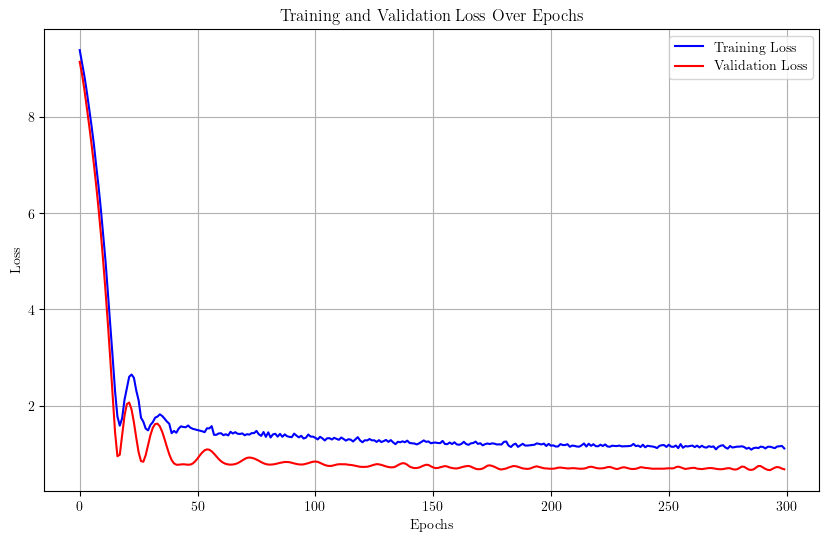

Training run 34/50 for 10% of the data...
Sample size for 10%: 1493


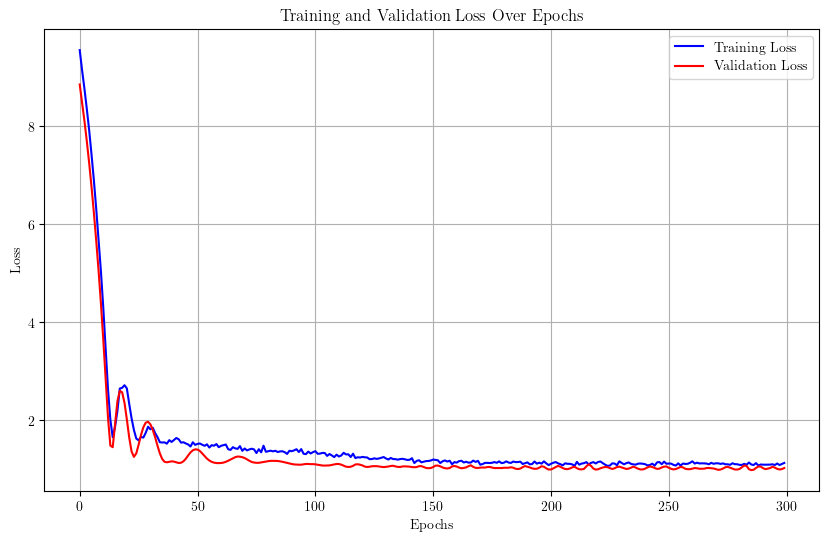

Training run 35/50 for 10% of the data...
Sample size for 10%: 1493


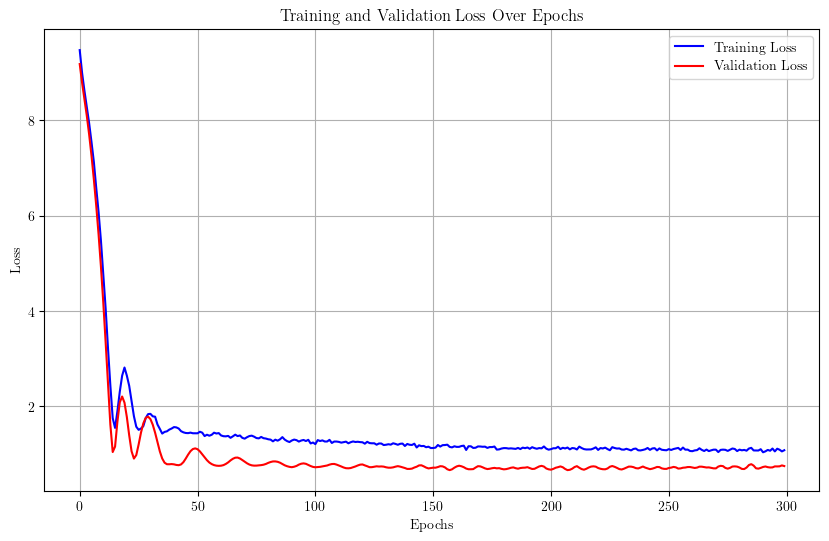

Training run 36/50 for 10% of the data...
Sample size for 10%: 1493


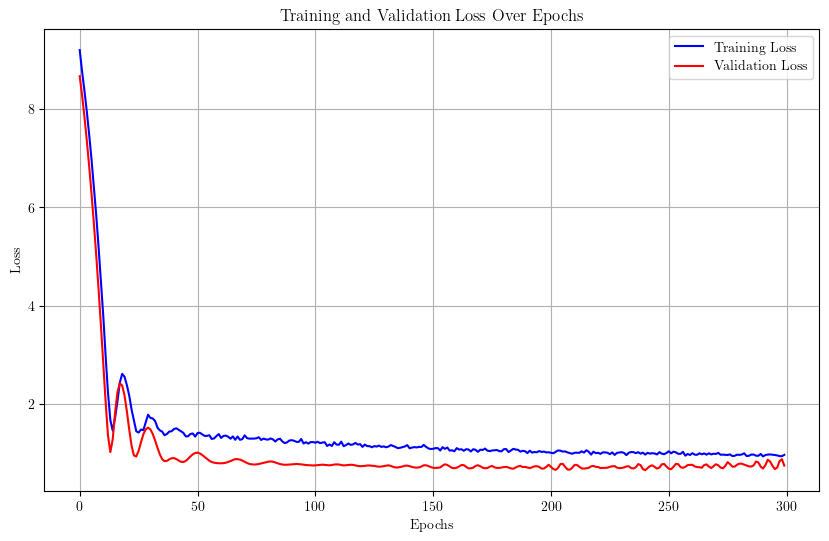

Training run 37/50 for 10% of the data...
Sample size for 10%: 1493


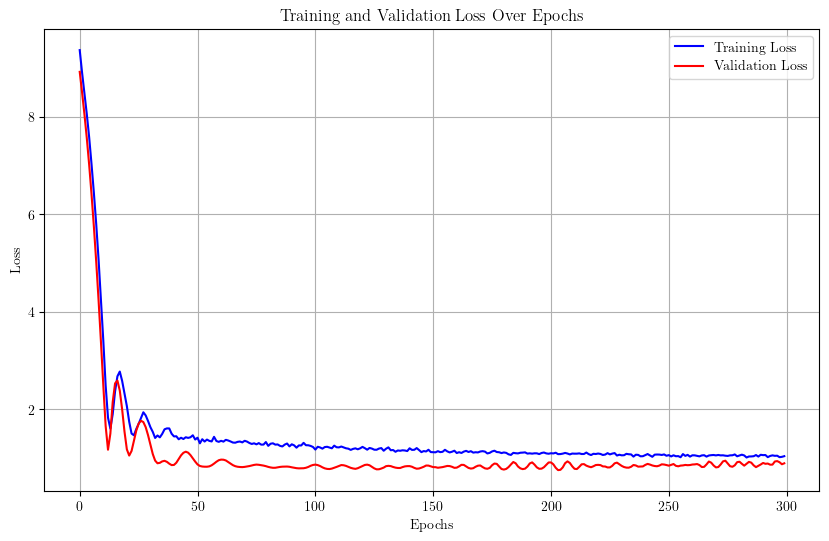

Training run 38/50 for 10% of the data...
Sample size for 10%: 1493


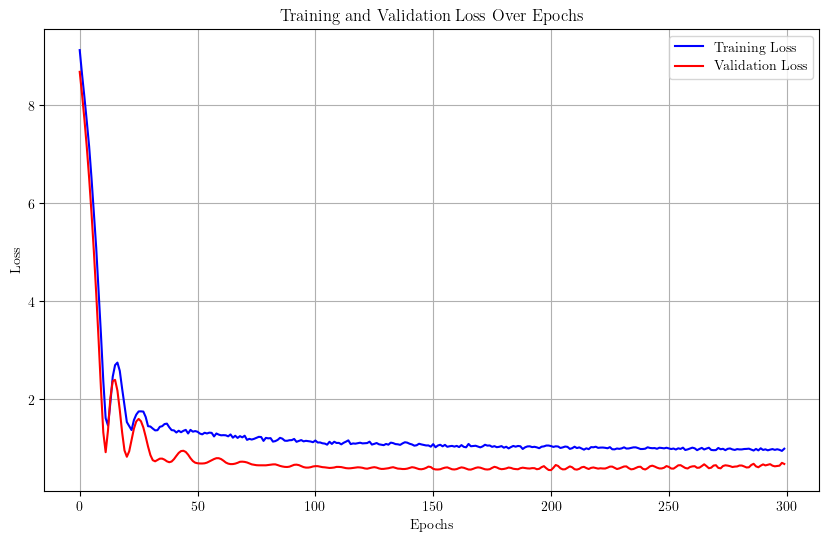

Training run 39/50 for 10% of the data...
Sample size for 10%: 1493


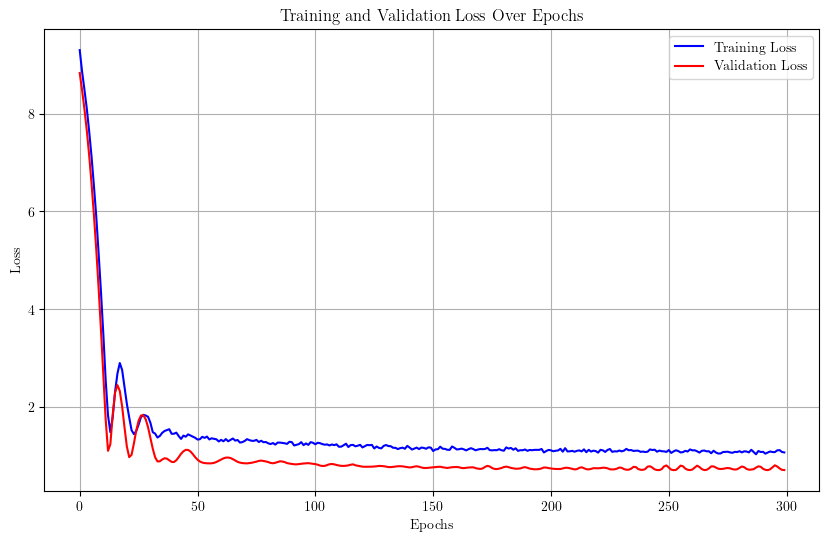

Training run 40/50 for 10% of the data...
Sample size for 10%: 1493


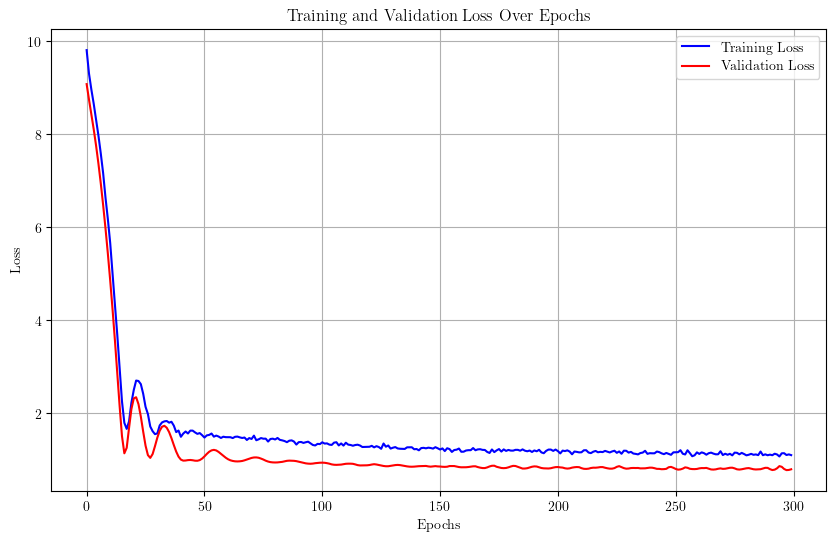

Training run 41/50 for 10% of the data...
Sample size for 10%: 1493


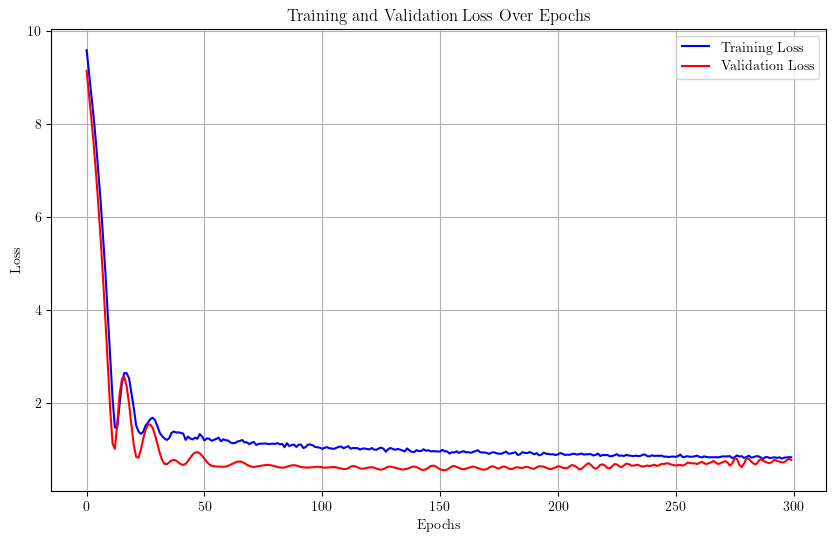

Training run 42/50 for 10% of the data...
Sample size for 10%: 1493


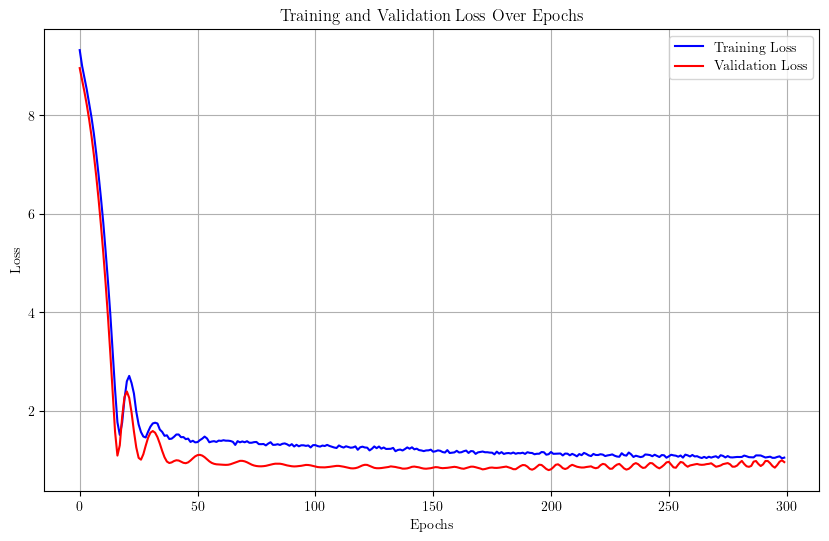

Training run 43/50 for 10% of the data...
Sample size for 10%: 1493


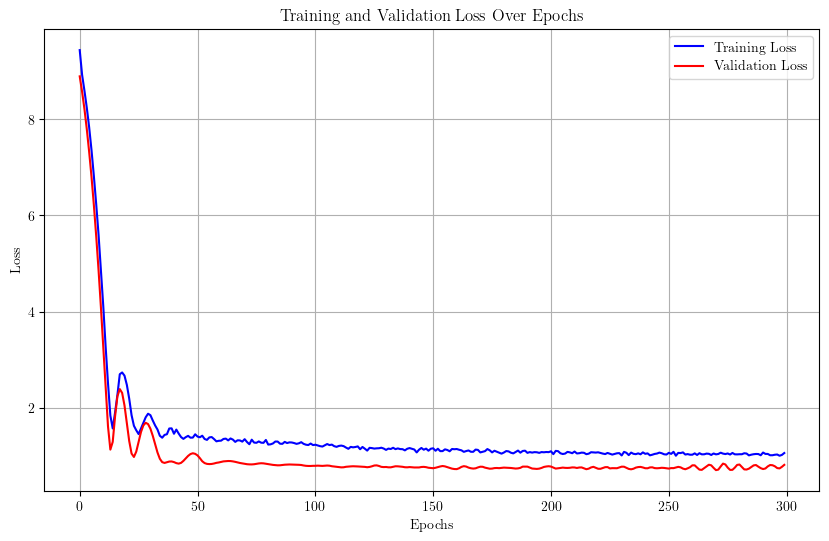

Training run 44/50 for 10% of the data...
Sample size for 10%: 1493


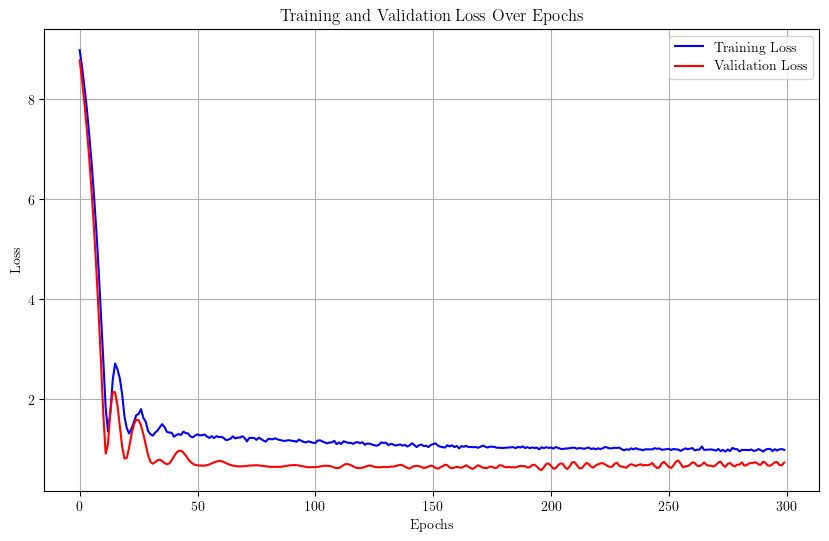

Training run 45/50 for 10% of the data...
Sample size for 10%: 1493


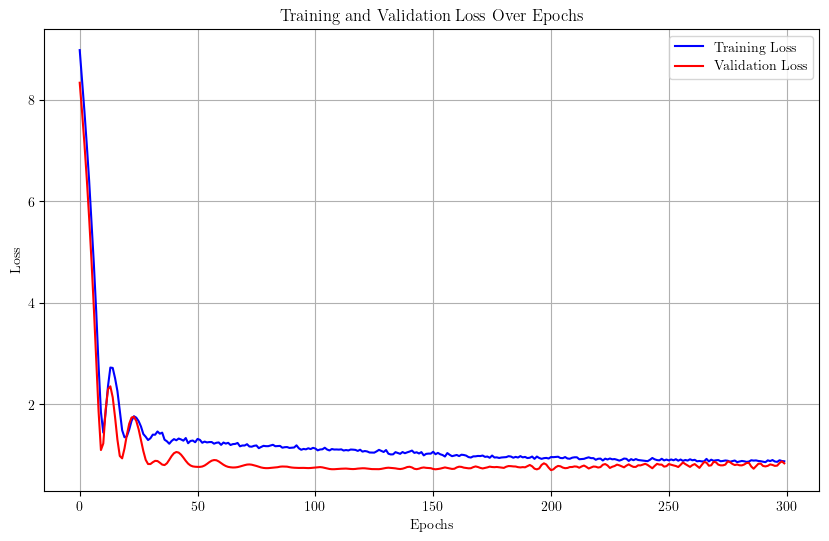

Training run 46/50 for 10% of the data...
Sample size for 10%: 1493


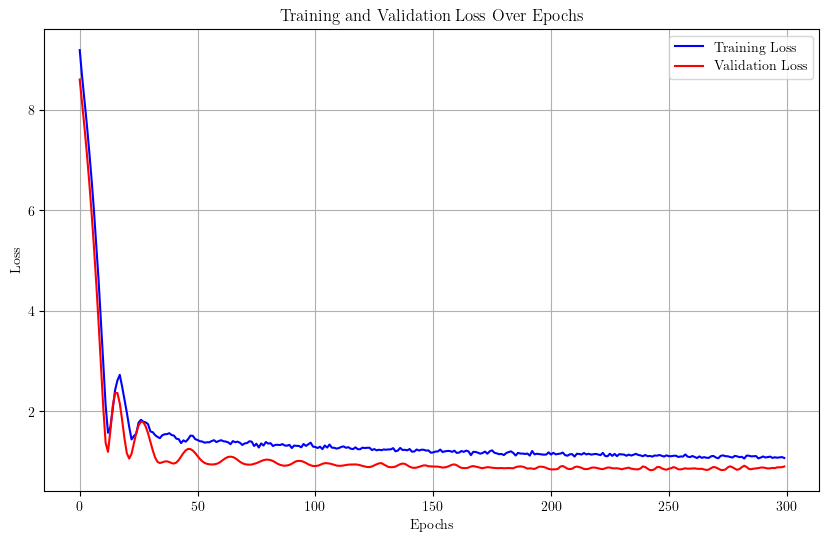

Training run 47/50 for 10% of the data...
Sample size for 10%: 1493


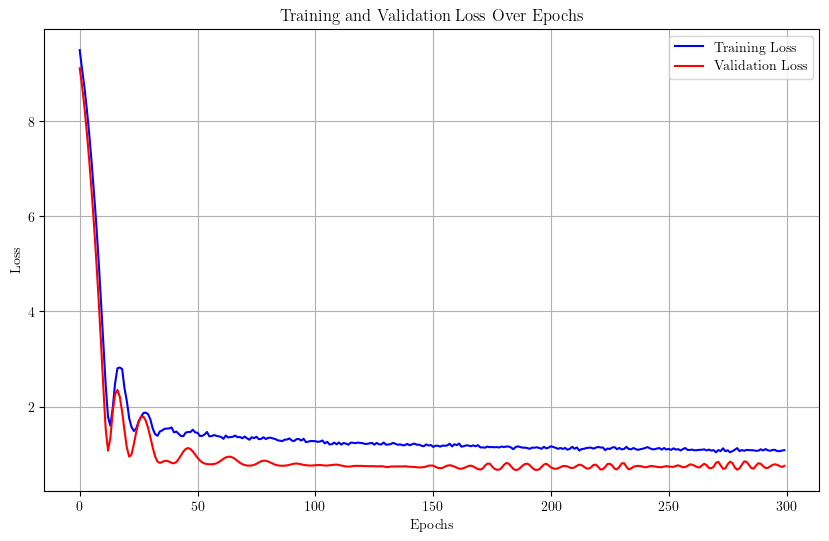

Training run 48/50 for 10% of the data...
Sample size for 10%: 1493


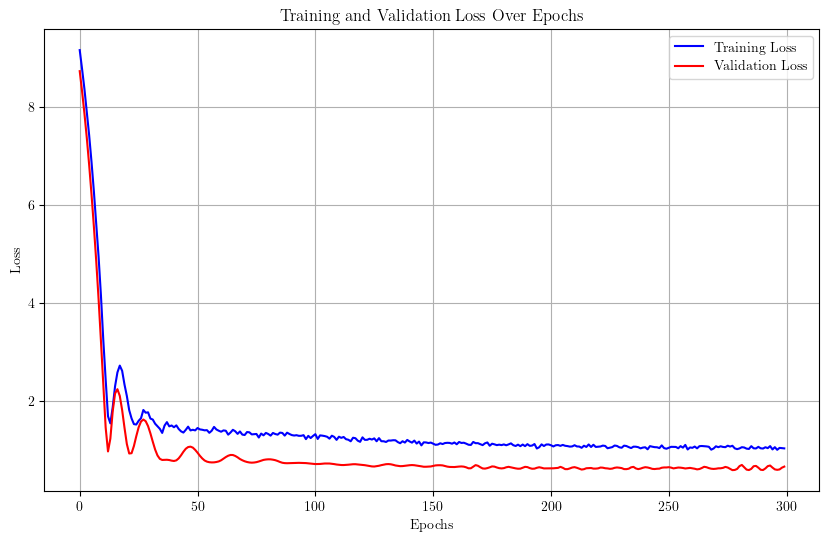

Training run 49/50 for 10% of the data...
Sample size for 10%: 1493


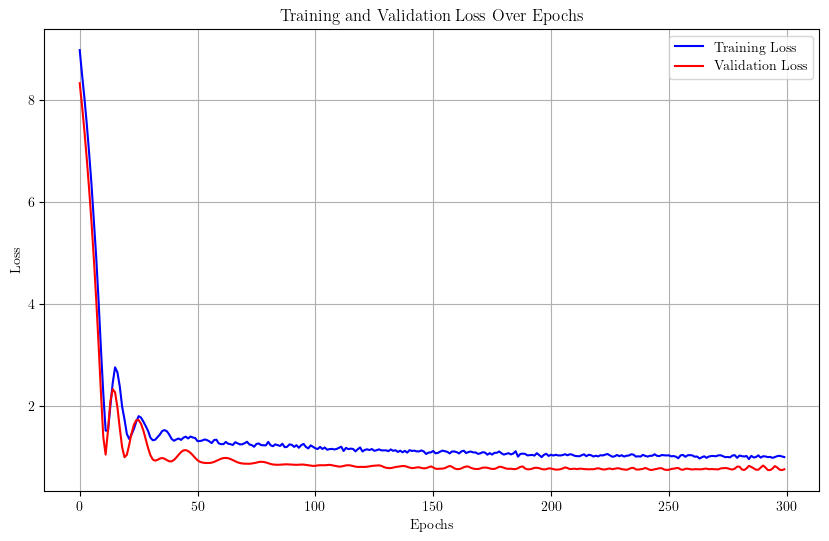

Training run 50/50 for 10% of the data...
Sample size for 10%: 1493


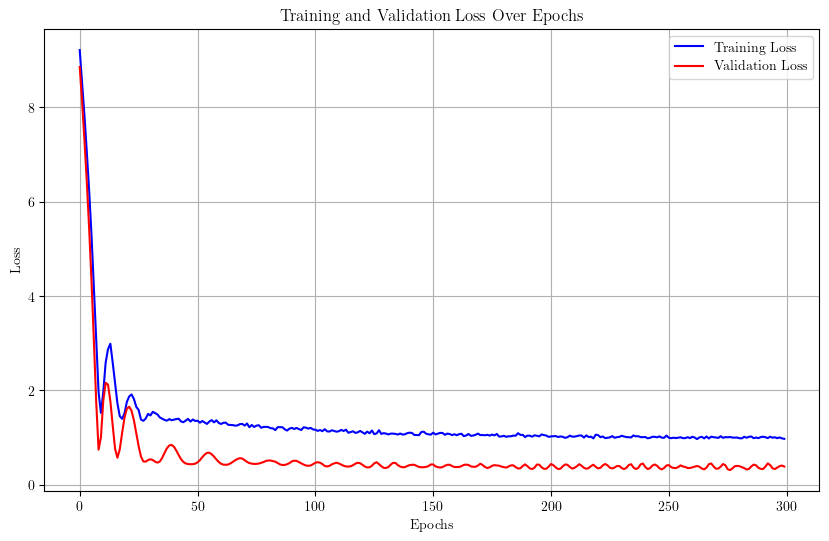

Metrics for 10% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(6.2744226), 'mae': np.float32(1.160357), 'r2': np.float64(0.006063177585601807), 'bias': np.float32(0.5209827), 'nmad': np.float32(0.033089604), 'sigma_68': np.float32(0.036934584), 'outlier_fraction': np.float64(6.113712374581939)}
Metrics Across Runs:
mse: 6.2744 ± 1.3706
mae: 1.1604 ± 0.1692
r2: 0.0061 ± 0.0396
bias: 0.5210 ± 0.1417
nmad: 0.0331 ± 0.0033
sigma_68: 0.0369 ± 0.0040
outlier_fraction: 6.1137 ± 1.4747
Training model for 20% of the data...
Training run 1/50 for 20% of the data...
Sample size for 20%: 2987


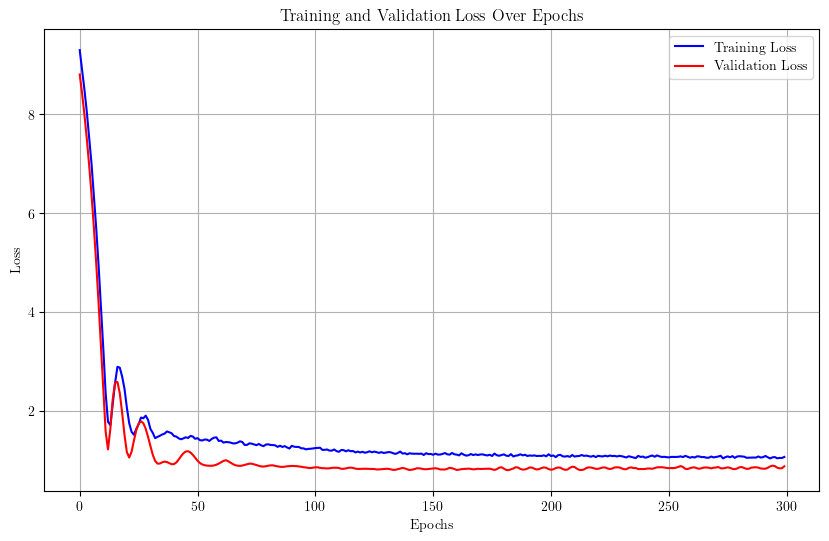

Training run 2/50 for 20% of the data...
Sample size for 20%: 2987


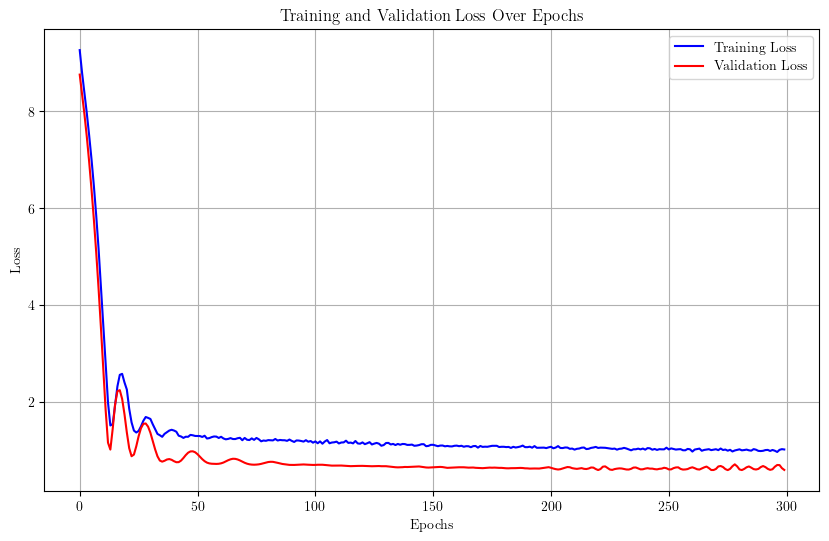

Training run 3/50 for 20% of the data...
Sample size for 20%: 2987


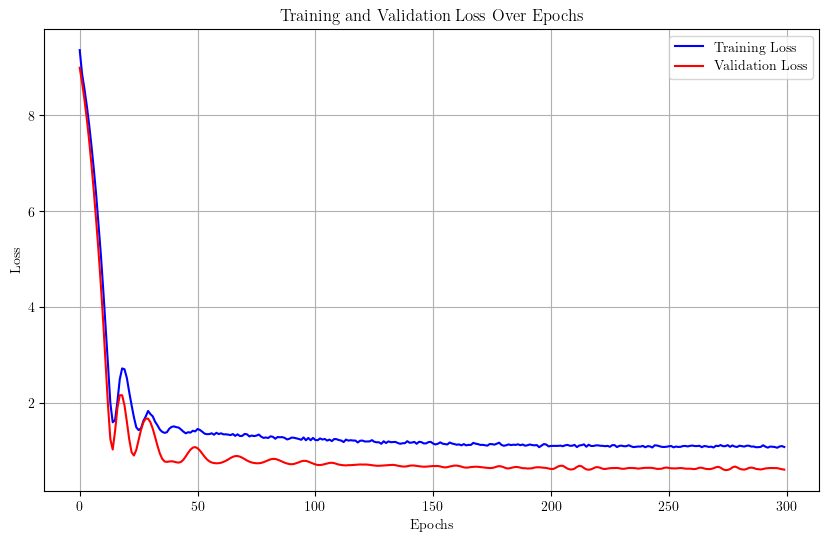

Training run 4/50 for 20% of the data...
Sample size for 20%: 2987


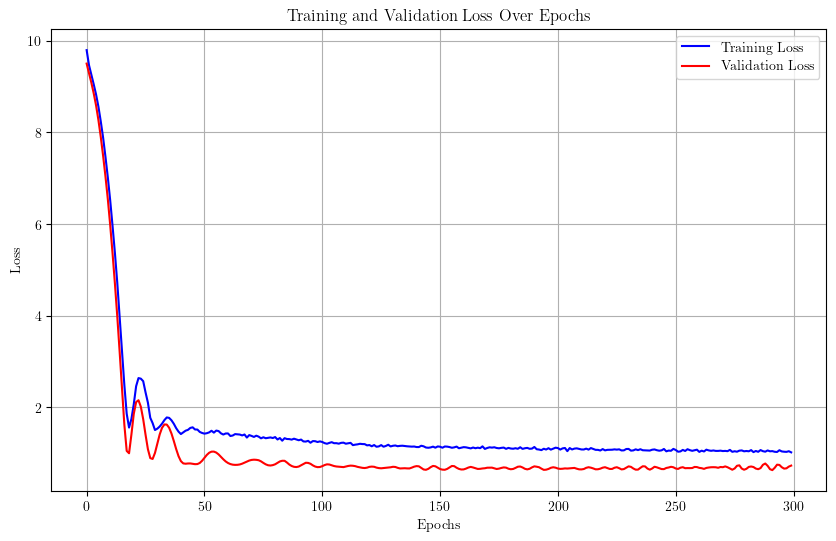

Training run 5/50 for 20% of the data...
Sample size for 20%: 2987


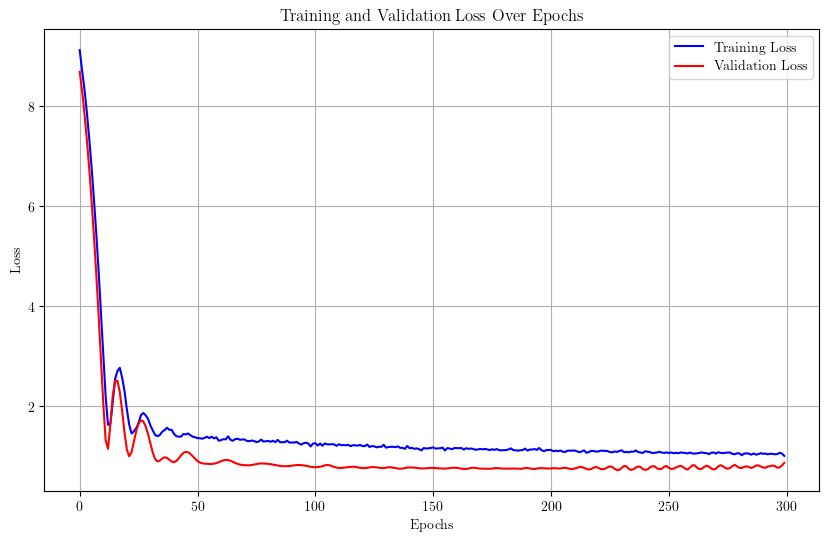

Training run 6/50 for 20% of the data...
Sample size for 20%: 2987


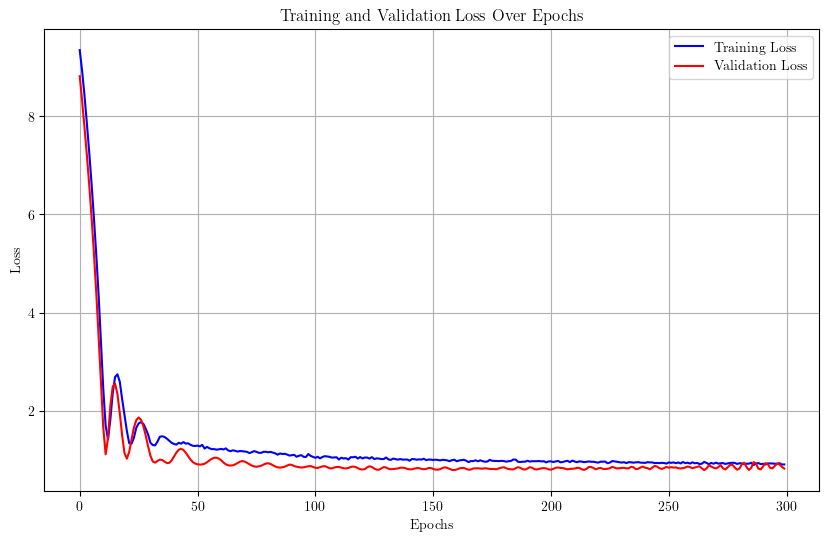

Training run 7/50 for 20% of the data...
Sample size for 20%: 2987


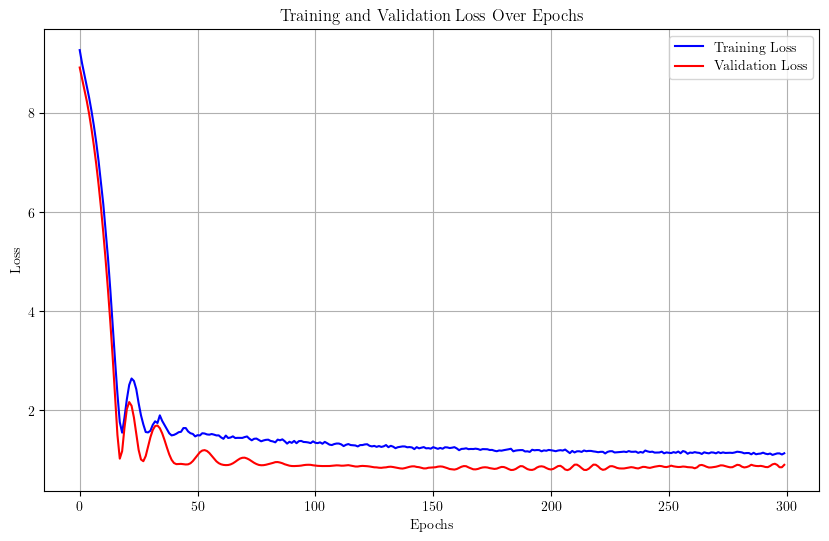

Training run 8/50 for 20% of the data...
Sample size for 20%: 2987


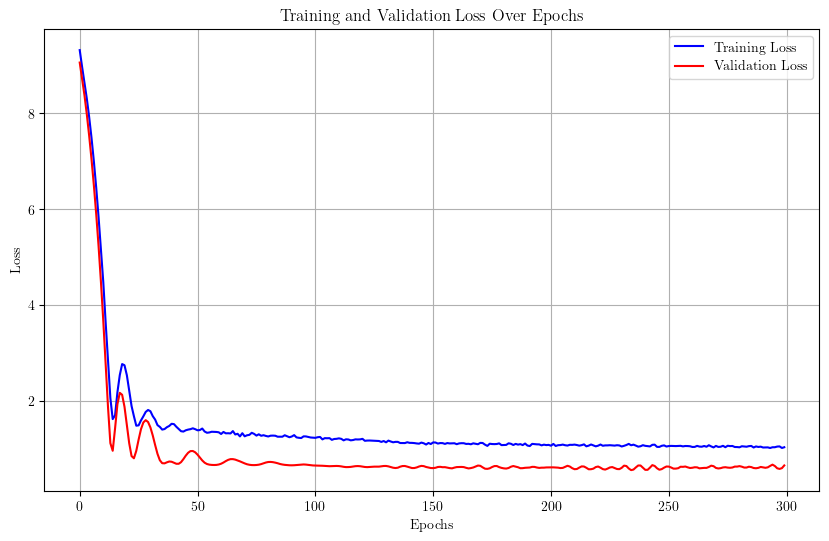

Training run 9/50 for 20% of the data...
Sample size for 20%: 2987


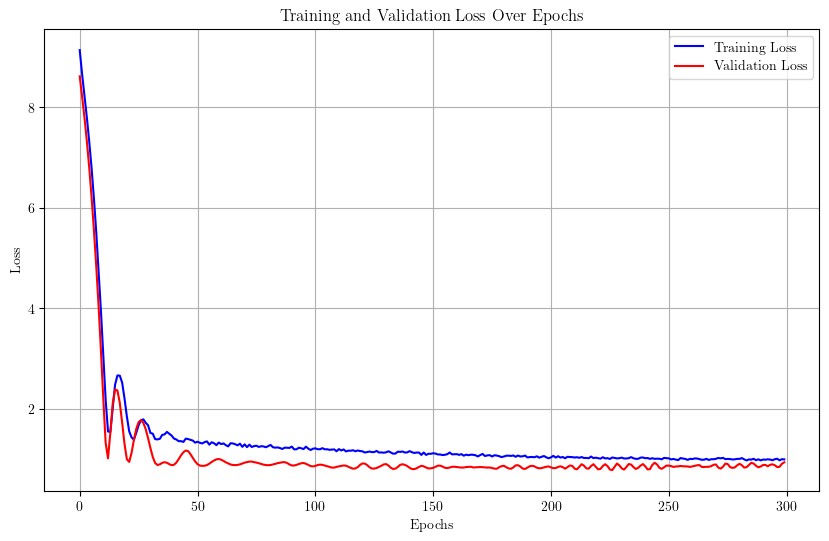

Training run 10/50 for 20% of the data...
Sample size for 20%: 2987


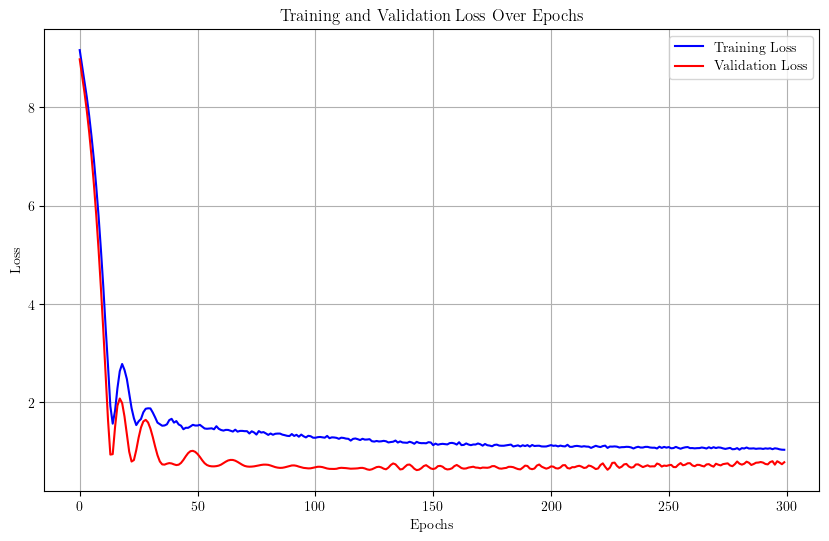

Training run 11/50 for 20% of the data...
Sample size for 20%: 2987


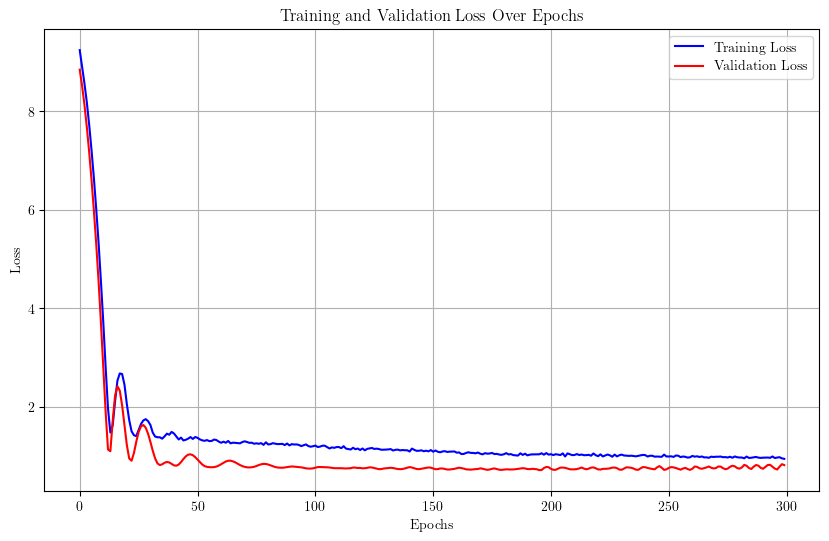

Training run 12/50 for 20% of the data...
Sample size for 20%: 2987


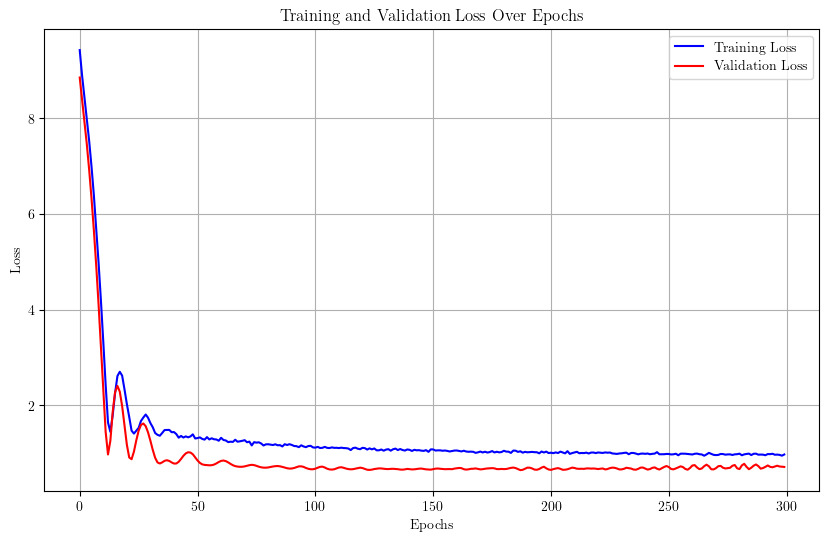

Training run 13/50 for 20% of the data...
Sample size for 20%: 2987


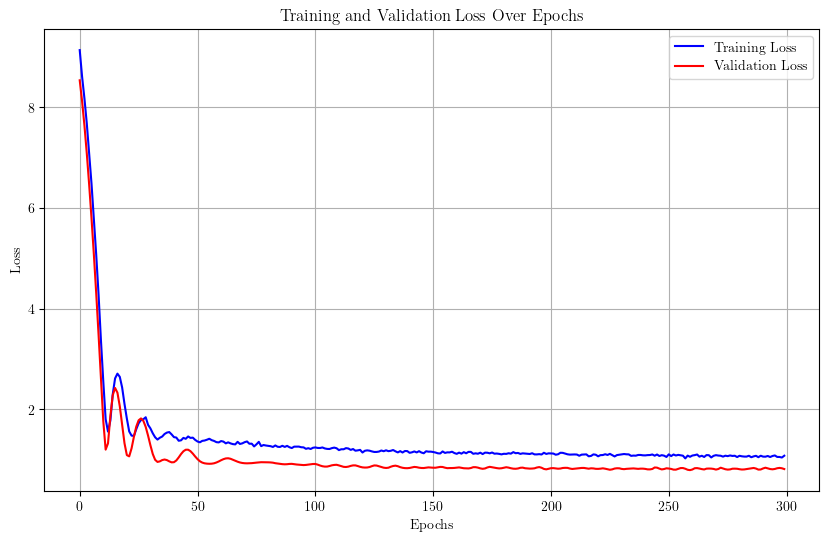

Training run 14/50 for 20% of the data...
Sample size for 20%: 2987


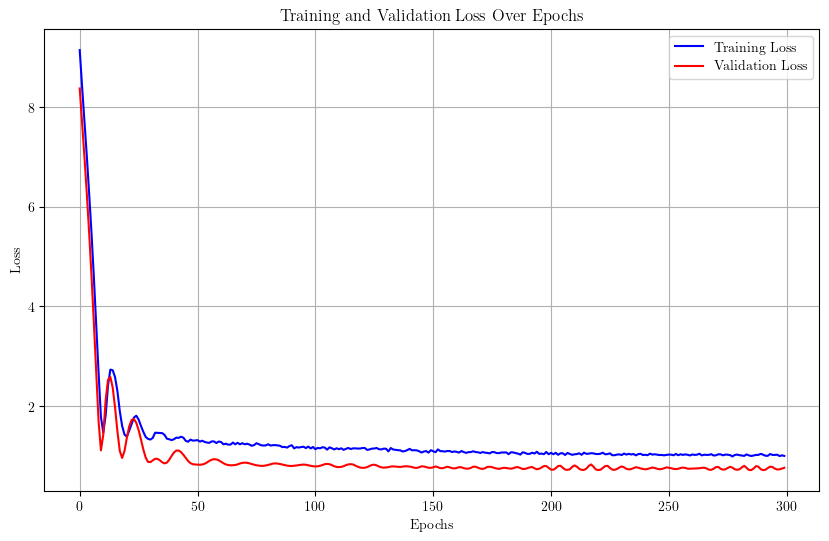

Training run 15/50 for 20% of the data...
Sample size for 20%: 2987


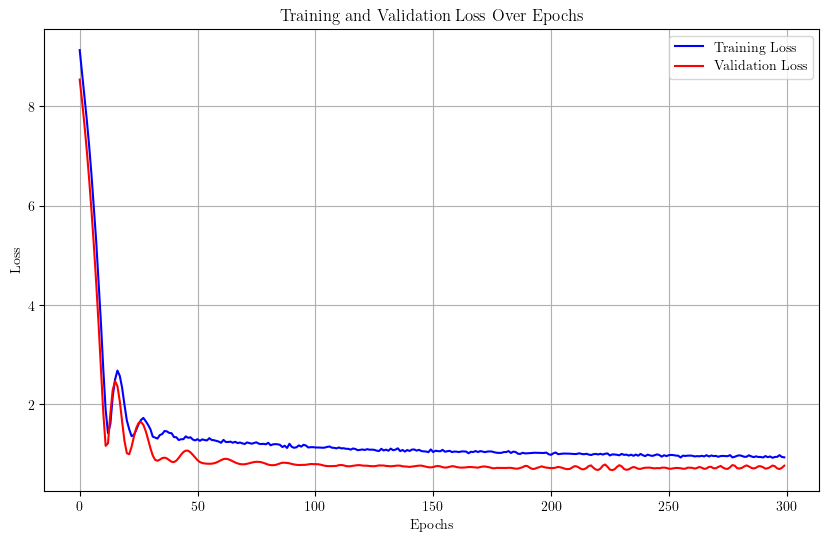

Training run 16/50 for 20% of the data...
Sample size for 20%: 2987


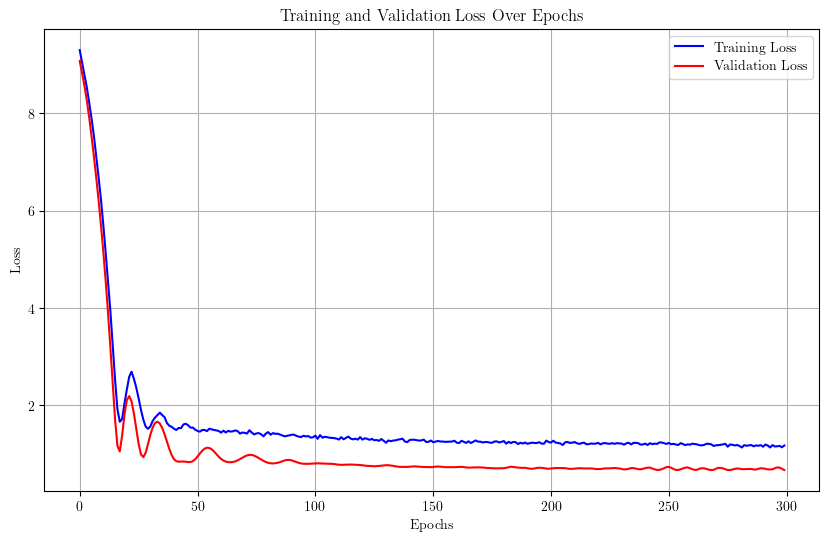

Training run 17/50 for 20% of the data...
Sample size for 20%: 2987


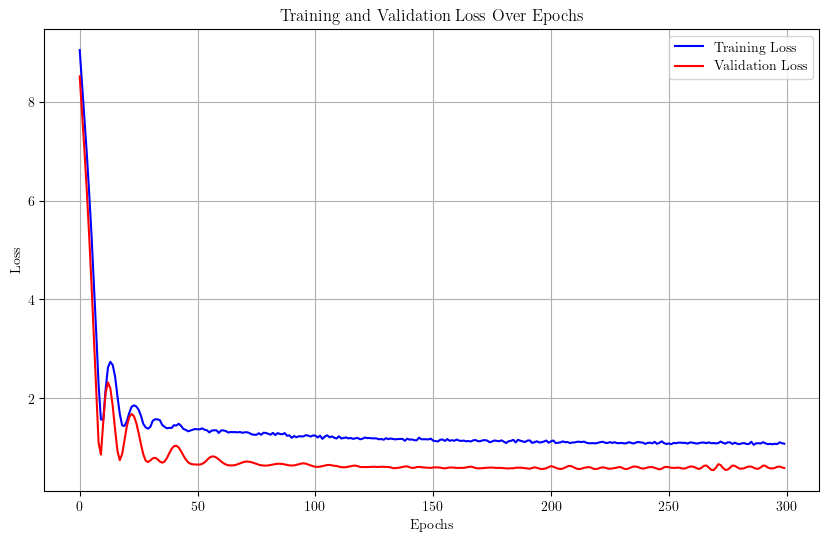

Training run 18/50 for 20% of the data...
Sample size for 20%: 2987


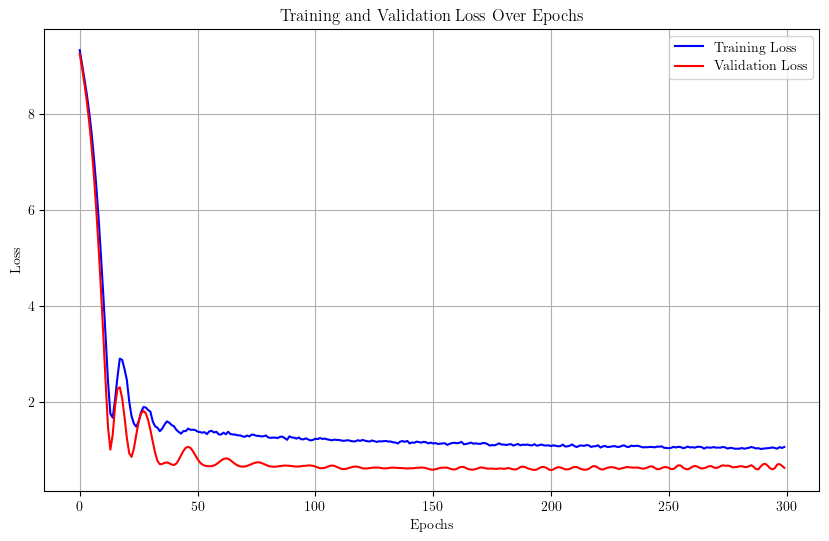

Training run 19/50 for 20% of the data...
Sample size for 20%: 2987


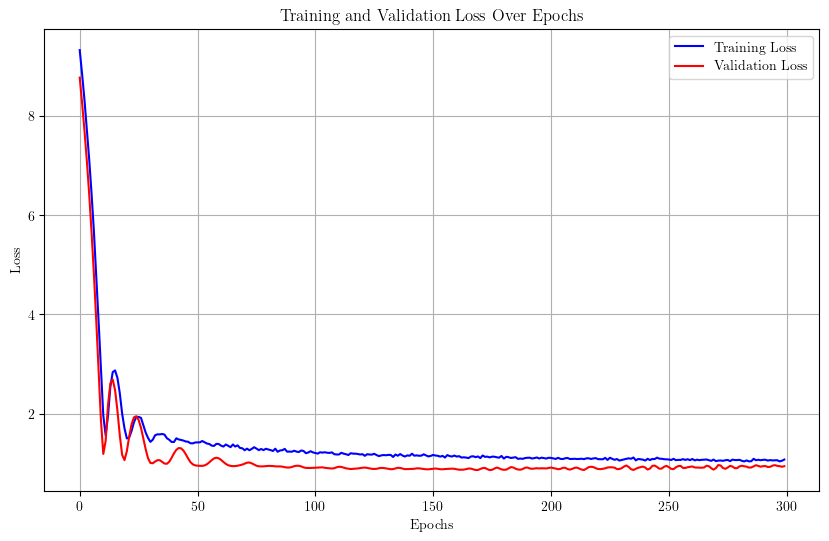

Training run 20/50 for 20% of the data...
Sample size for 20%: 2987


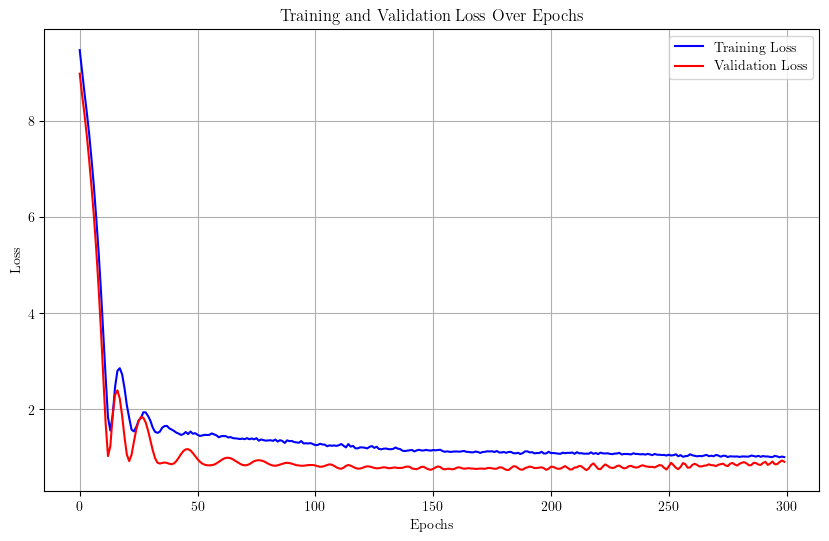

Training run 21/50 for 20% of the data...
Sample size for 20%: 2987


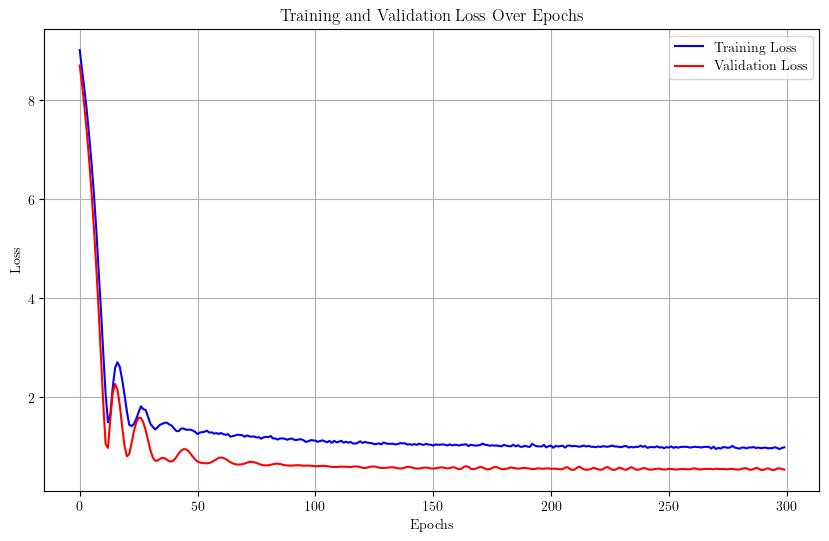

Training run 22/50 for 20% of the data...
Sample size for 20%: 2987


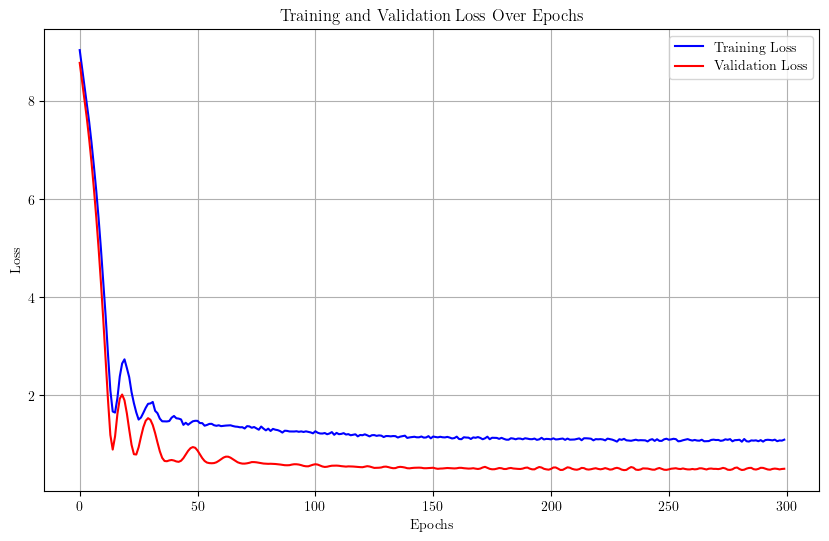

Training run 23/50 for 20% of the data...
Sample size for 20%: 2987


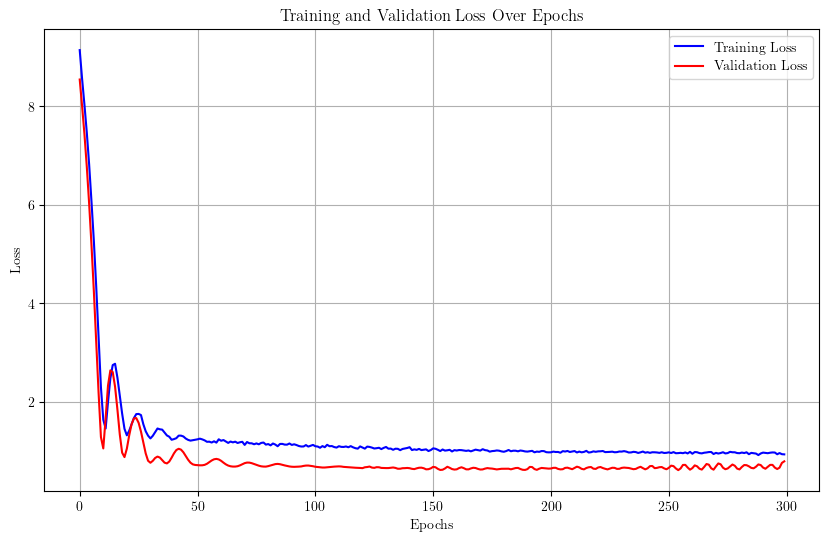

Training run 24/50 for 20% of the data...
Sample size for 20%: 2987


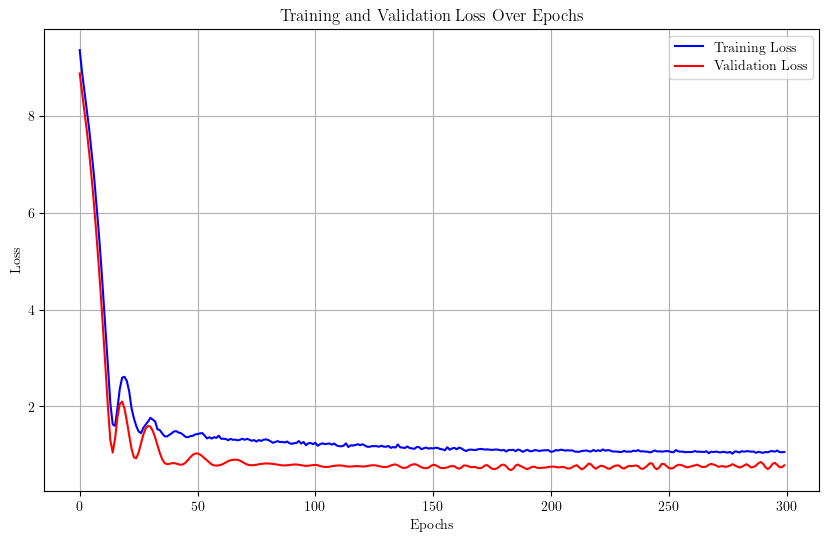

Training run 25/50 for 20% of the data...
Sample size for 20%: 2987


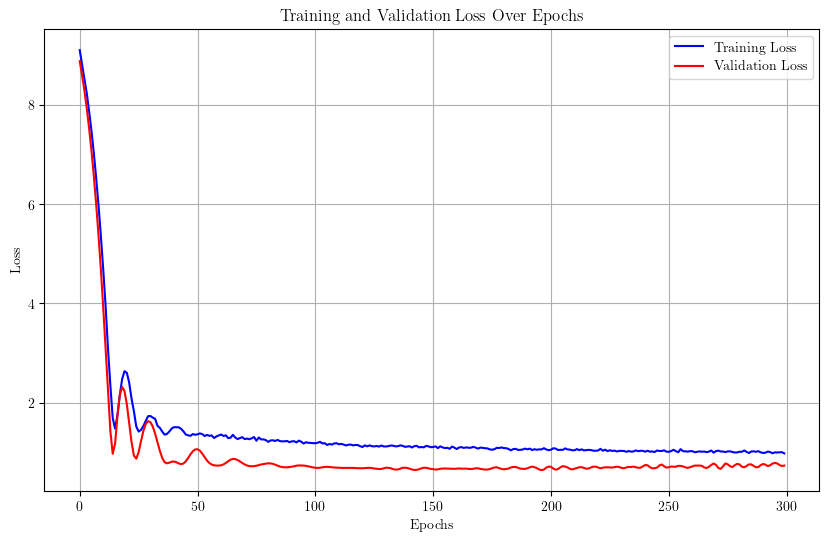

Training run 26/50 for 20% of the data...
Sample size for 20%: 2987


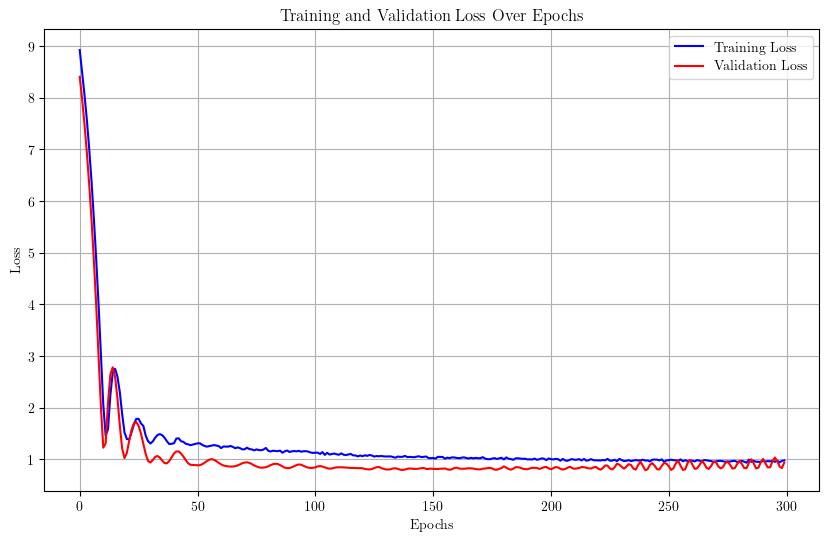

Training run 27/50 for 20% of the data...
Sample size for 20%: 2987


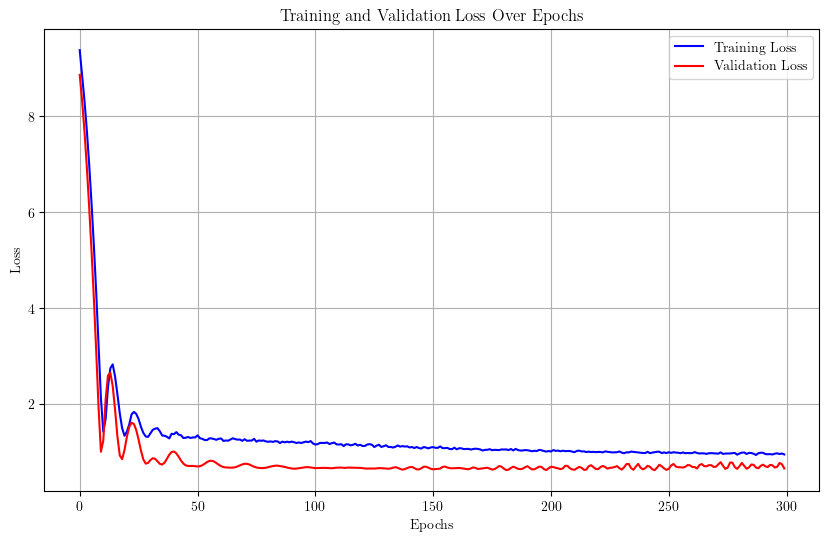

Training run 28/50 for 20% of the data...
Sample size for 20%: 2987


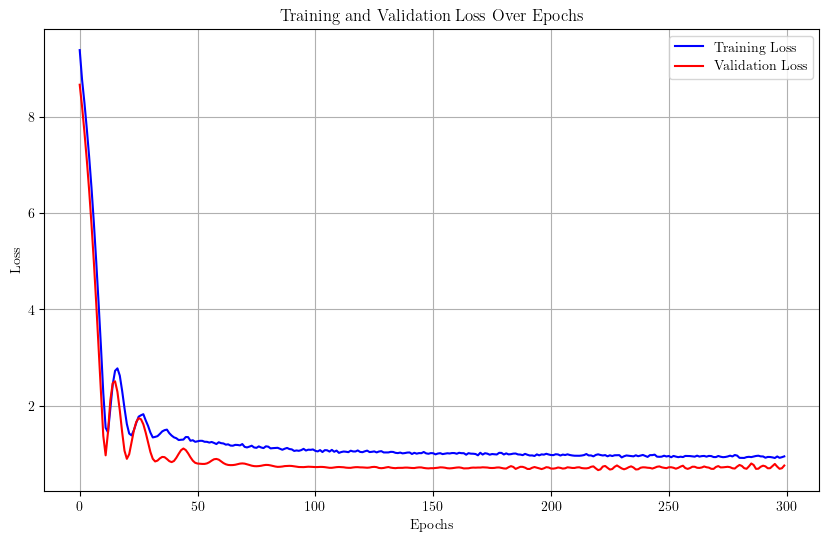

Training run 29/50 for 20% of the data...
Sample size for 20%: 2987


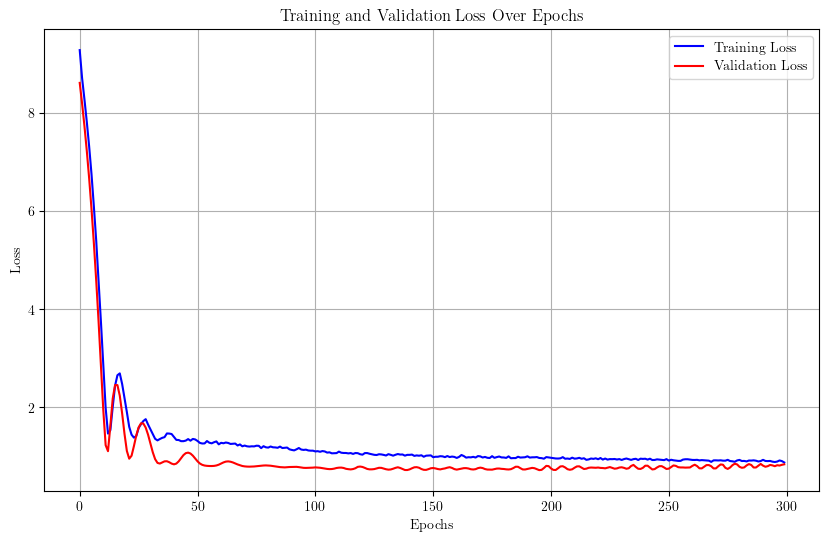

Training run 30/50 for 20% of the data...
Sample size for 20%: 2987


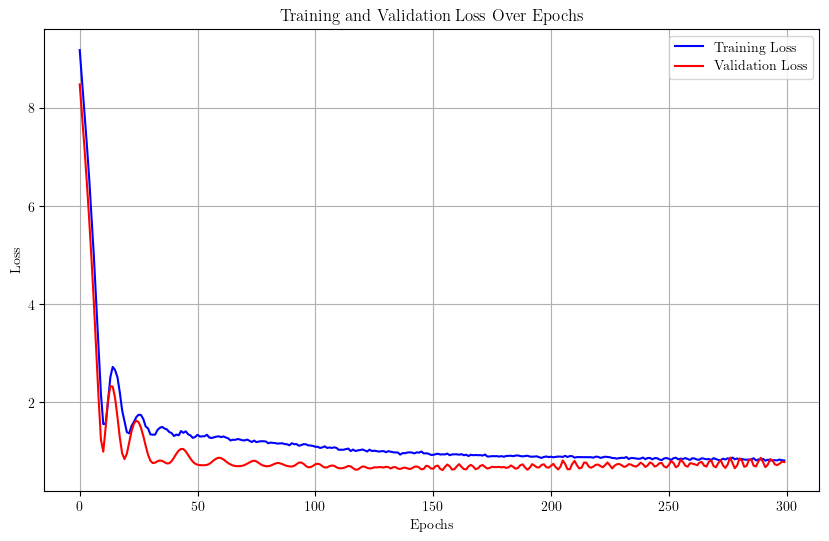

Training run 31/50 for 20% of the data...
Sample size for 20%: 2987


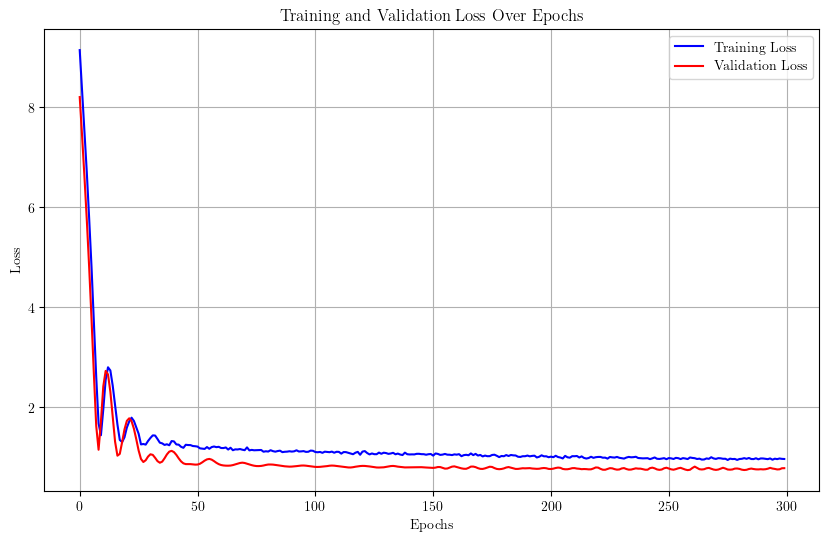

Training run 32/50 for 20% of the data...
Sample size for 20%: 2987


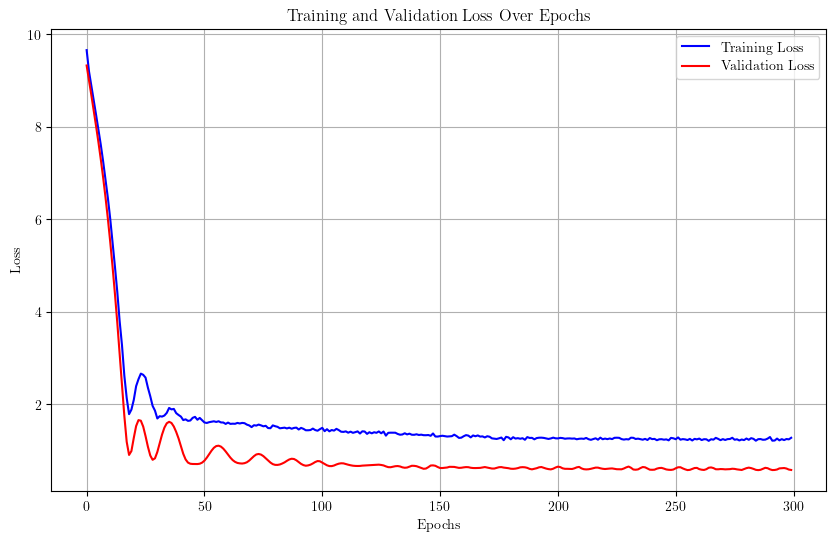

Training run 33/50 for 20% of the data...
Sample size for 20%: 2987


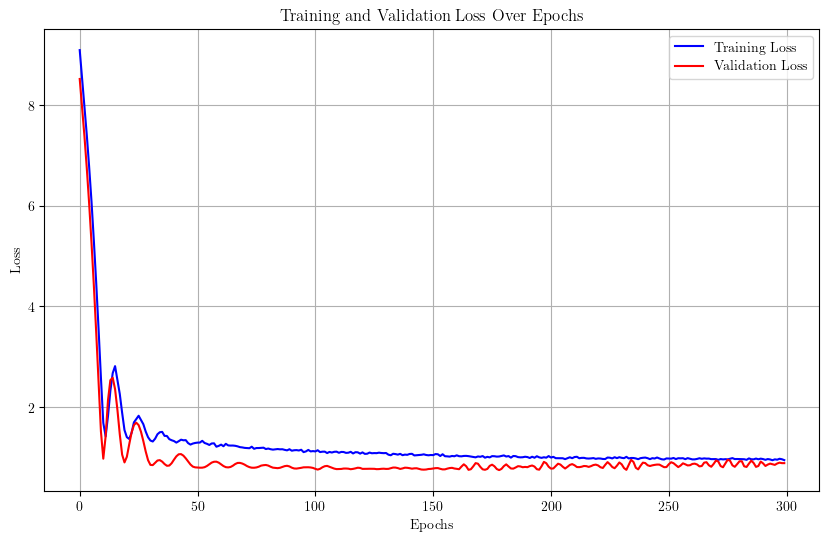

Training run 34/50 for 20% of the data...
Sample size for 20%: 2987


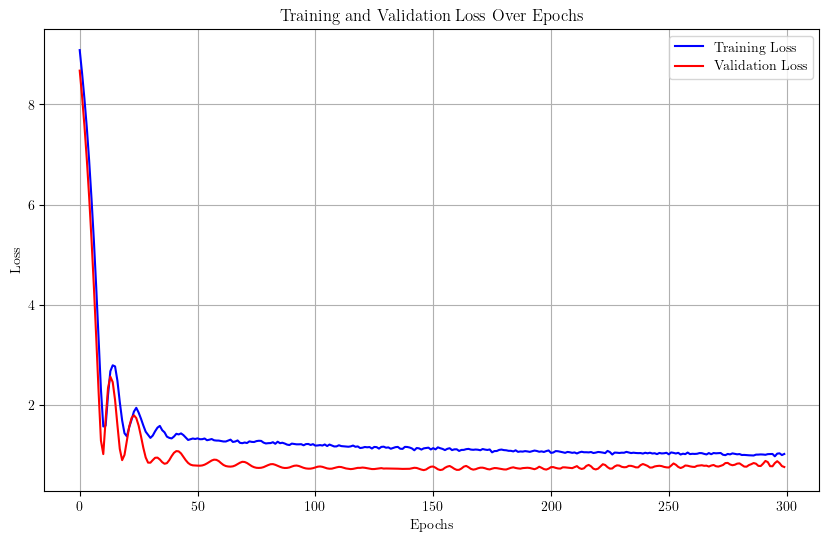

Training run 35/50 for 20% of the data...
Sample size for 20%: 2987


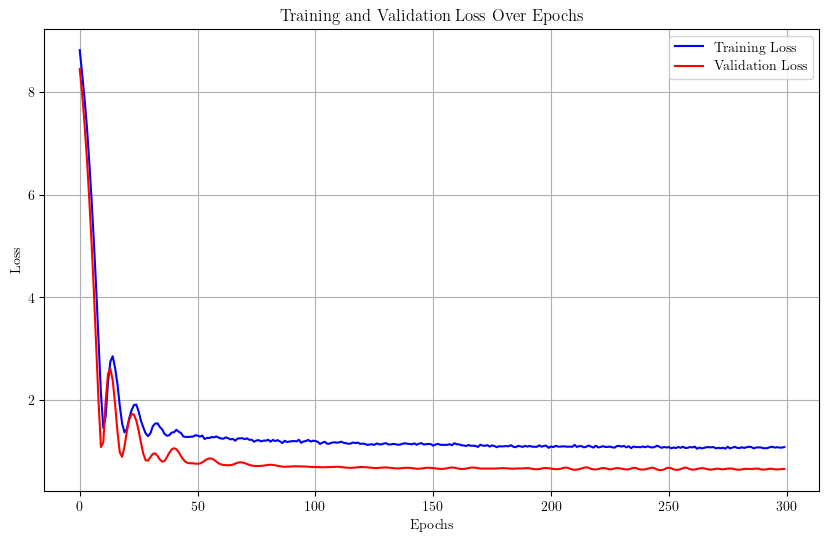

Training run 36/50 for 20% of the data...
Sample size for 20%: 2987


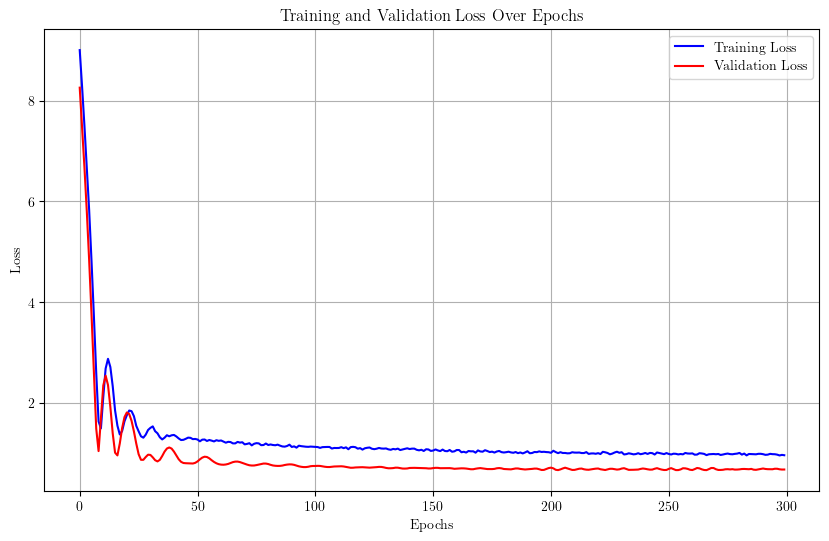

Training run 37/50 for 20% of the data...
Sample size for 20%: 2987


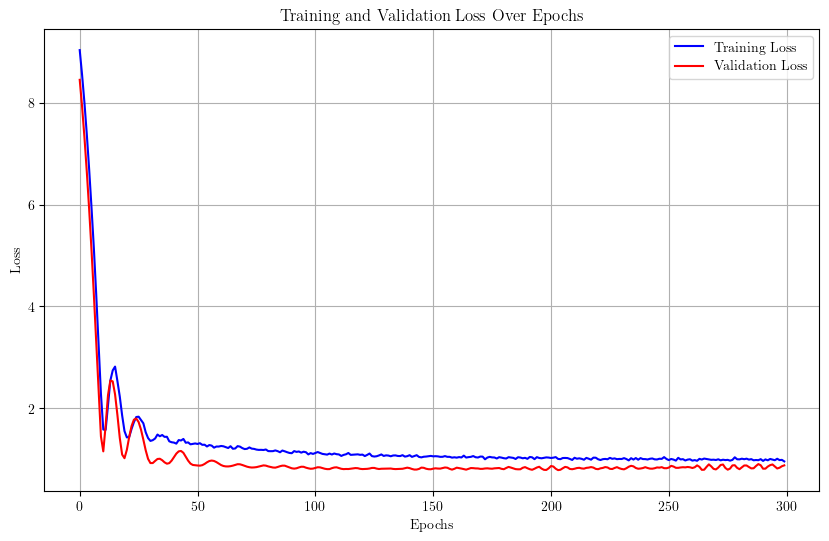

Training run 38/50 for 20% of the data...
Sample size for 20%: 2987


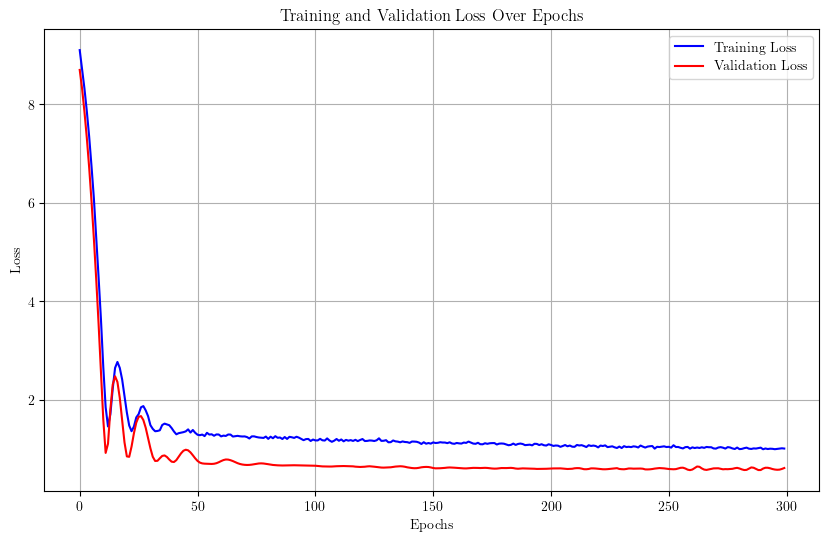

Training run 39/50 for 20% of the data...
Sample size for 20%: 2987


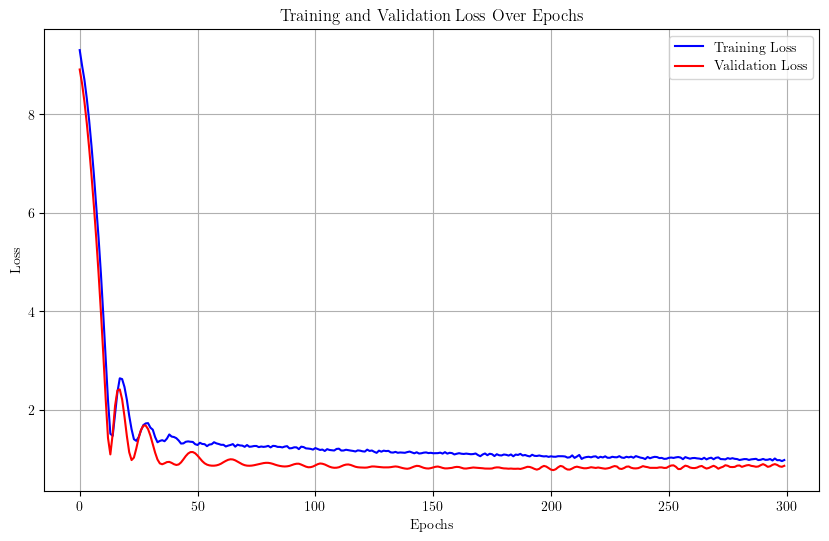

Training run 40/50 for 20% of the data...
Sample size for 20%: 2987


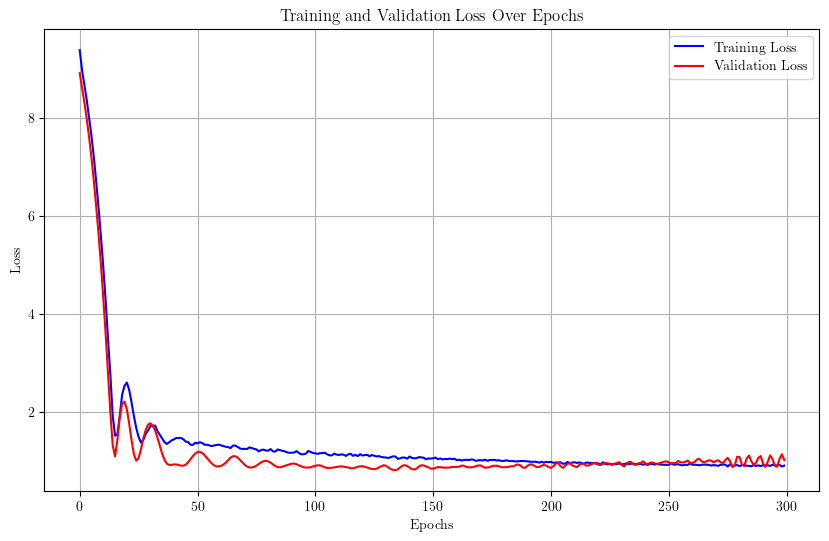

Training run 41/50 for 20% of the data...
Sample size for 20%: 2987


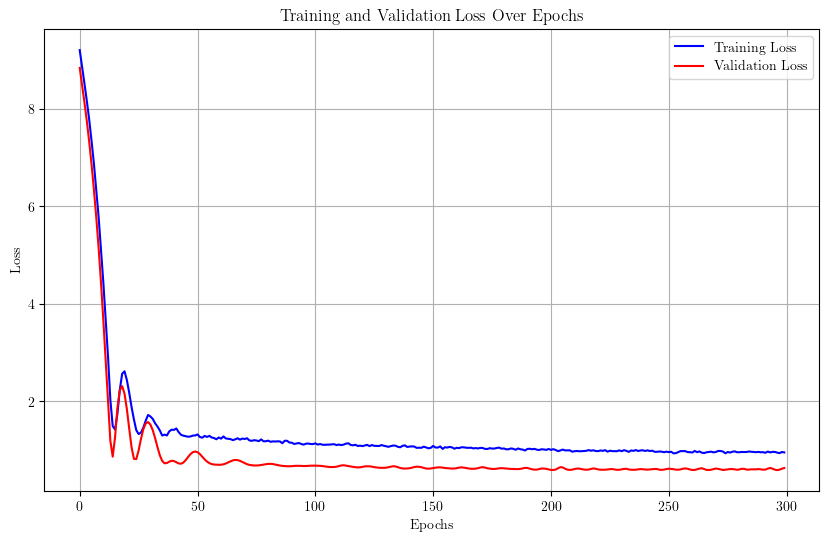

Training run 42/50 for 20% of the data...
Sample size for 20%: 2987


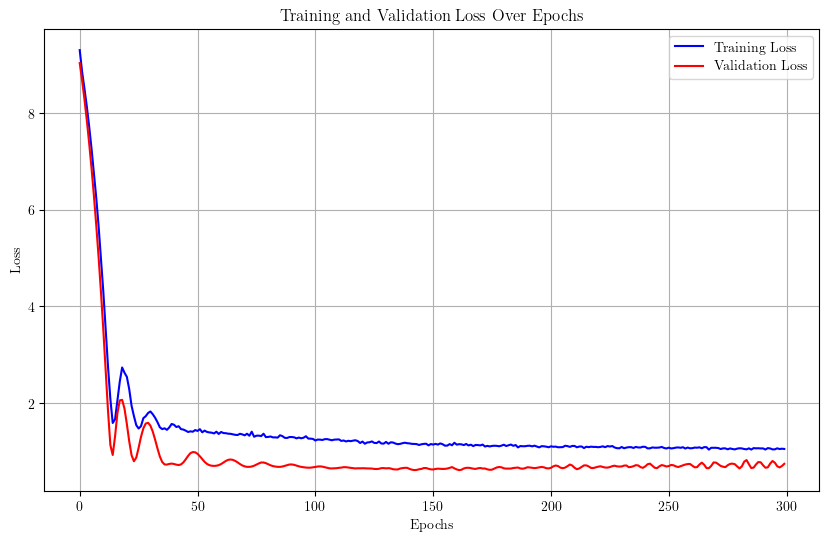

Training run 43/50 for 20% of the data...
Sample size for 20%: 2987


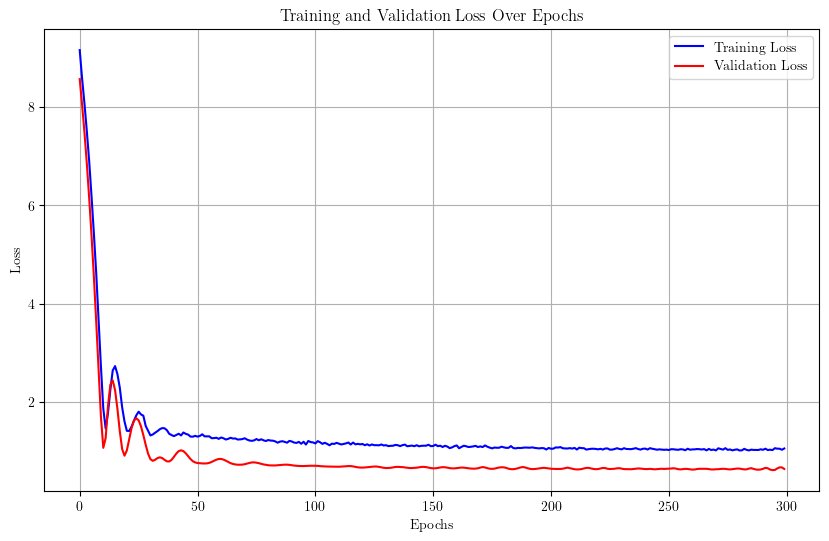

Training run 44/50 for 20% of the data...
Sample size for 20%: 2987


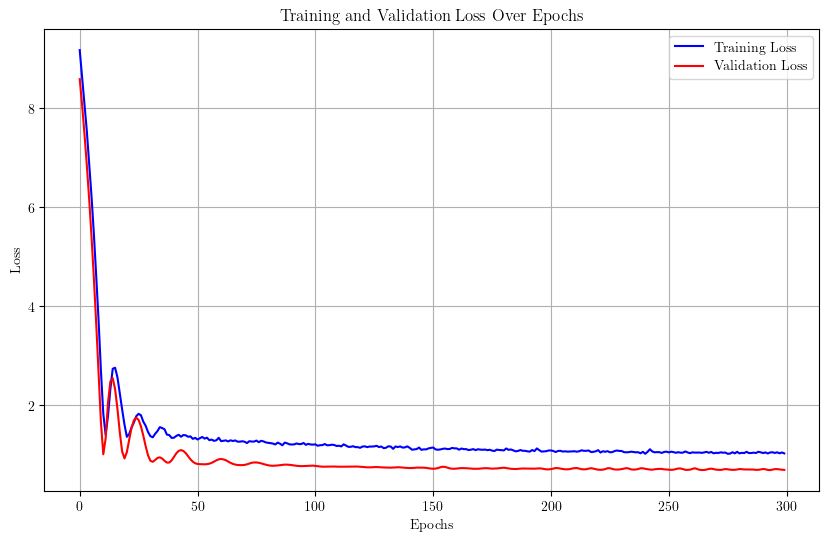

Training run 45/50 for 20% of the data...
Sample size for 20%: 2987


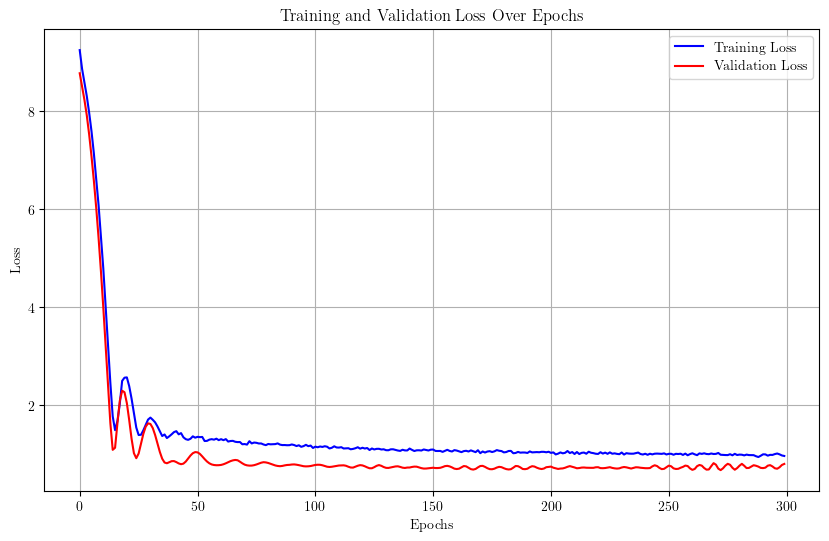

Training run 46/50 for 20% of the data...
Sample size for 20%: 2987


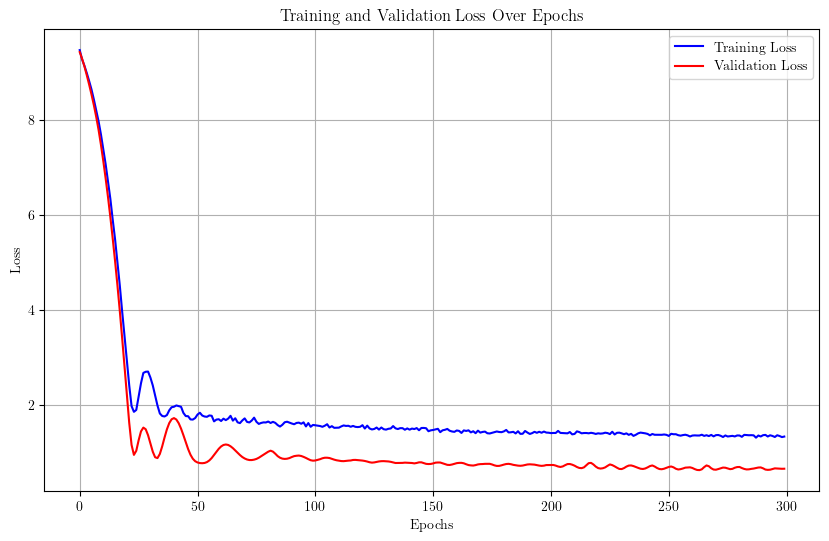

Training run 47/50 for 20% of the data...
Sample size for 20%: 2987


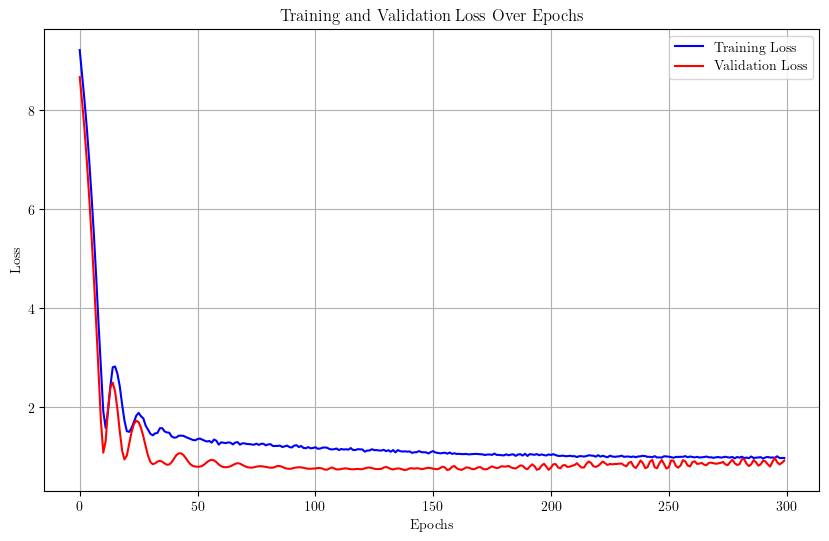

Training run 48/50 for 20% of the data...
Sample size for 20%: 2987


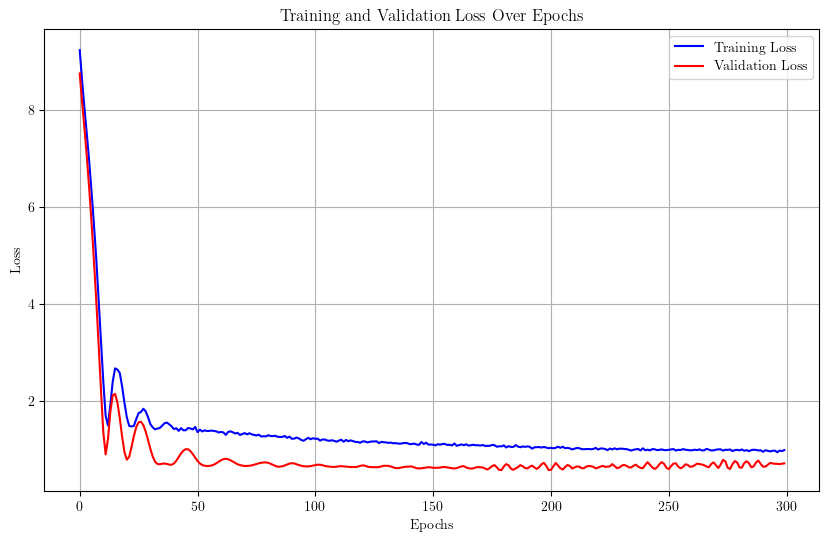

Training run 49/50 for 20% of the data...
Sample size for 20%: 2987


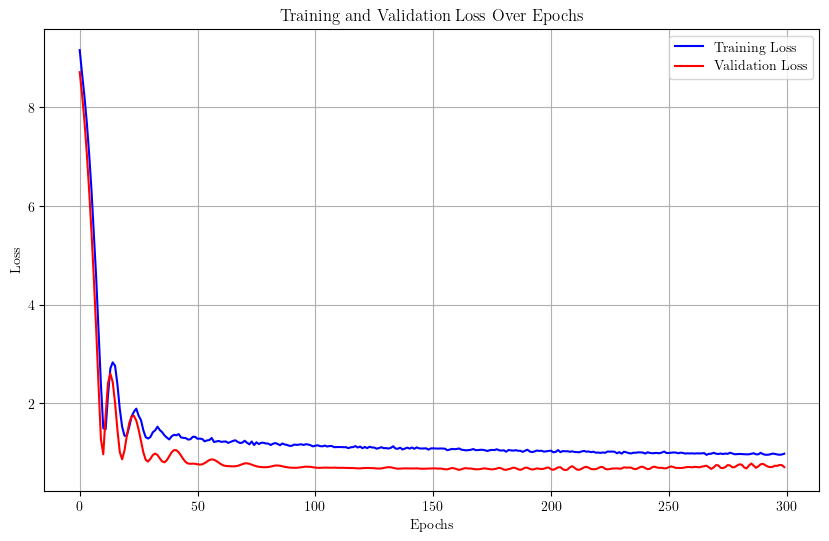

Training run 50/50 for 20% of the data...
Sample size for 20%: 2987


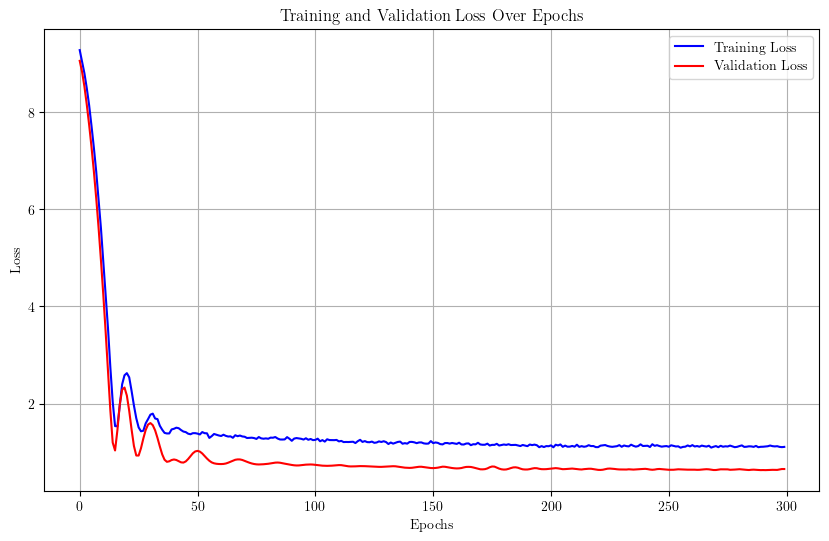

Metrics for 20% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(6.0343723), 'mae': np.float32(1.1266627), 'r2': np.float64(0.014506065845489502), 'bias': np.float32(0.50221306), 'nmad': np.float32(0.0312816), 'sigma_68': np.float32(0.03482957), 'outlier_fraction': np.float64(5.80267558528428)}
Metrics Across Runs:
mse: 6.0344 ± 0.8474
mae: 1.1267 ± 0.1583
r2: 0.0145 ± 0.0228
bias: 0.5022 ± 0.0831
nmad: 0.0313 ± 0.0019
sigma_68: 0.0348 ± 0.0021
outlier_fraction: 5.8027 ± 0.8208
Training model for 50% of the data...
Training run 1/50 for 50% of the data...
Sample size for 50%: 7469


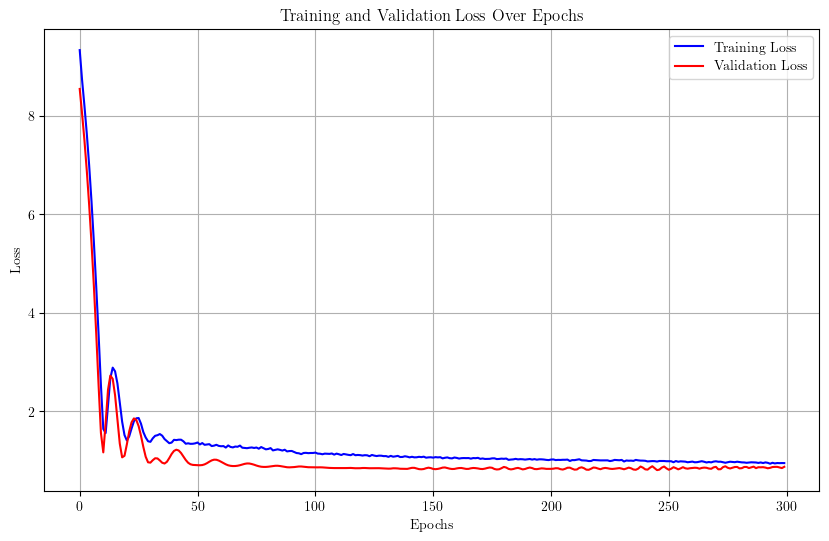

Training run 2/50 for 50% of the data...
Sample size for 50%: 7469


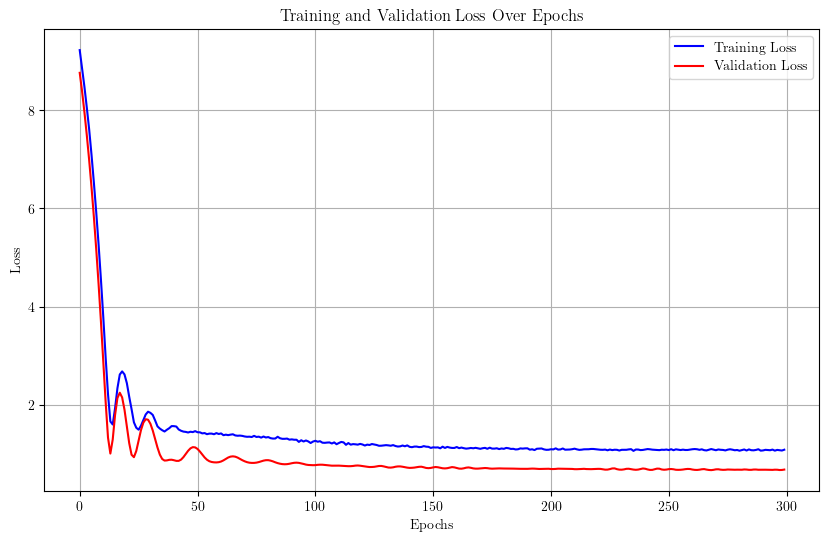

Training run 3/50 for 50% of the data...
Sample size for 50%: 7469


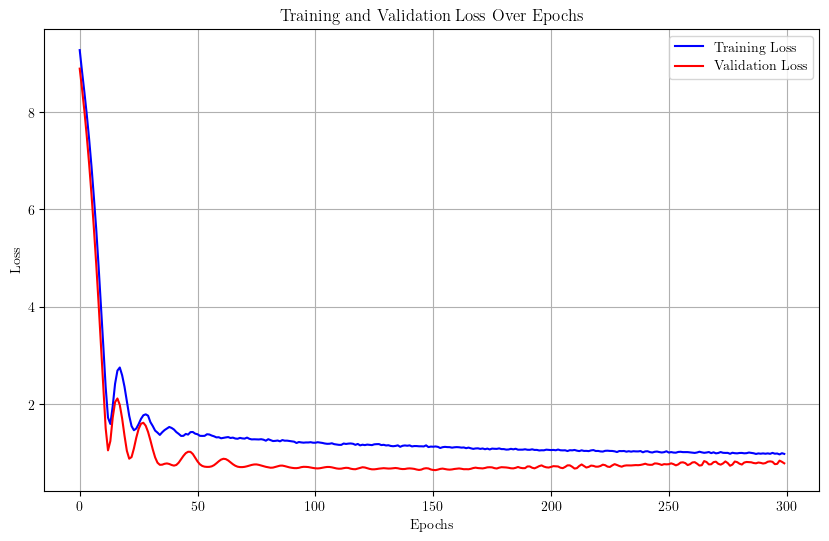

Training run 4/50 for 50% of the data...
Sample size for 50%: 7469


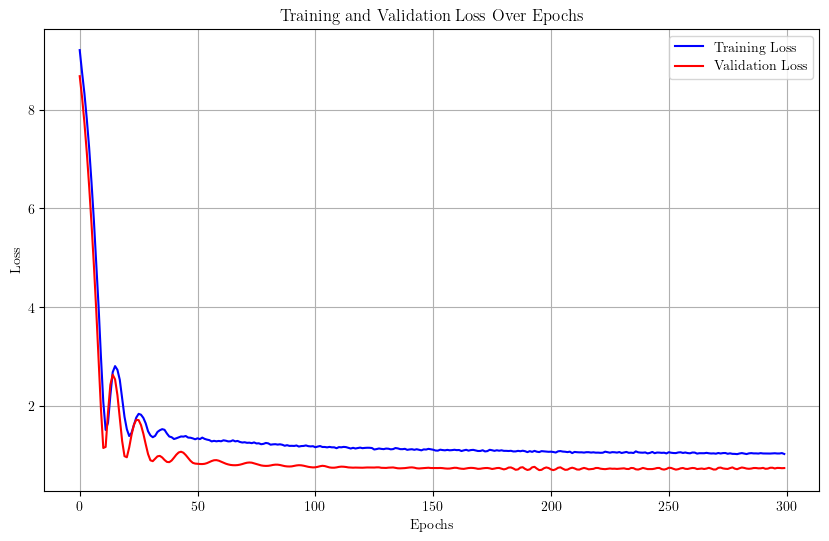

Training run 5/50 for 50% of the data...
Sample size for 50%: 7469


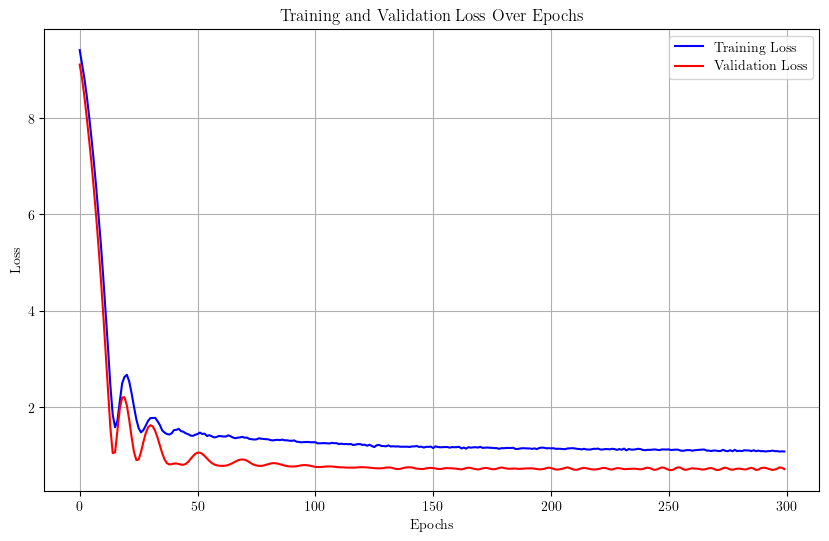

Training run 6/50 for 50% of the data...
Sample size for 50%: 7469


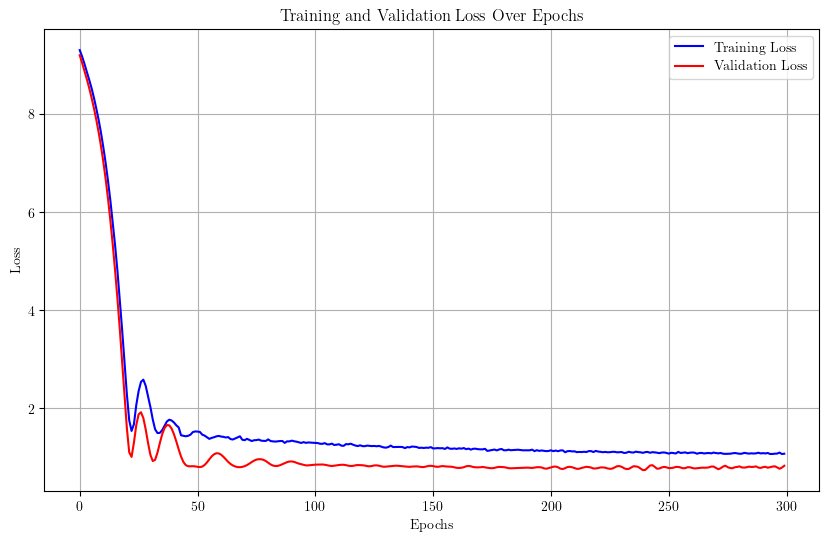

Training run 7/50 for 50% of the data...
Sample size for 50%: 7469


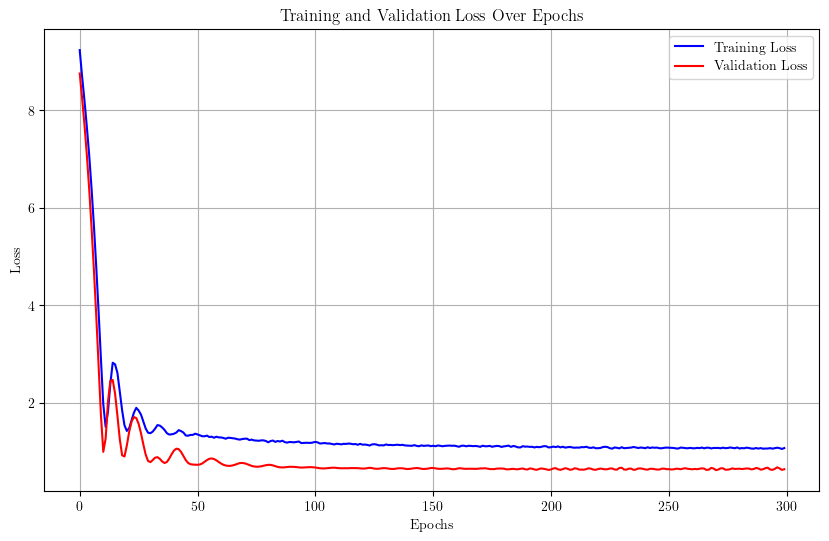

Training run 8/50 for 50% of the data...
Sample size for 50%: 7469


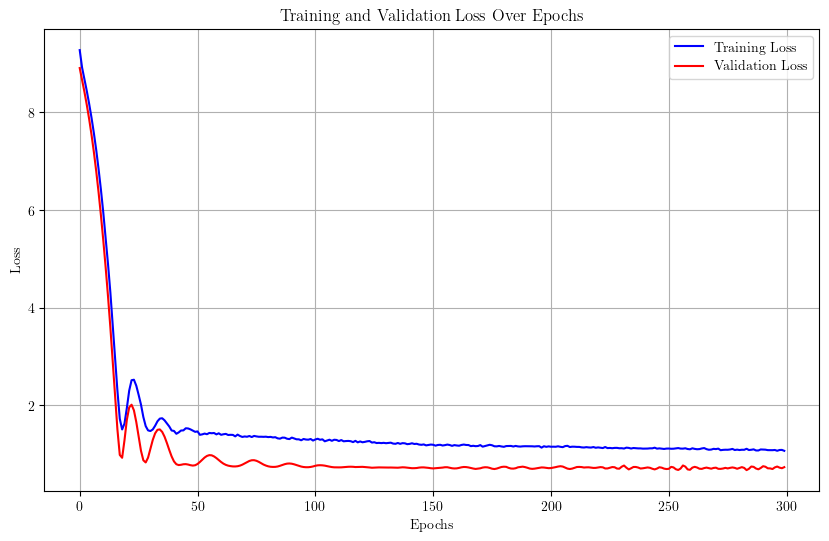

Training run 9/50 for 50% of the data...
Sample size for 50%: 7469


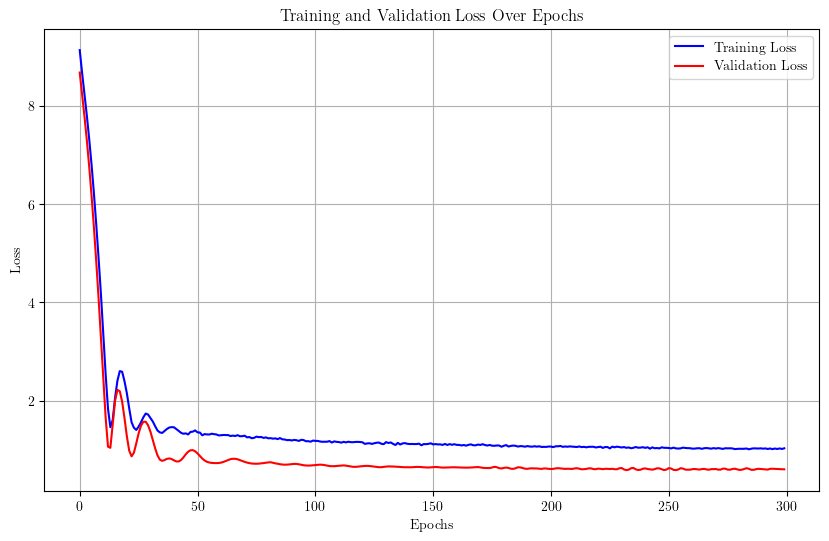

Training run 10/50 for 50% of the data...
Sample size for 50%: 7469


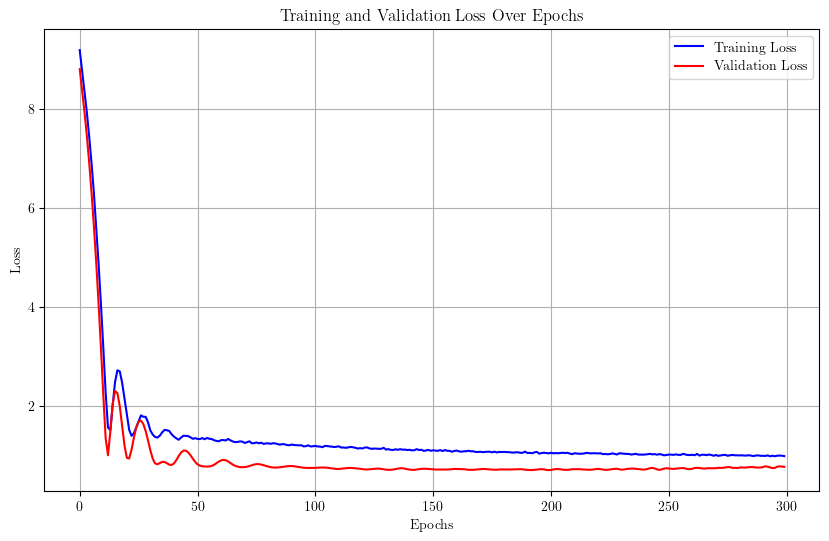

Training run 11/50 for 50% of the data...
Sample size for 50%: 7469


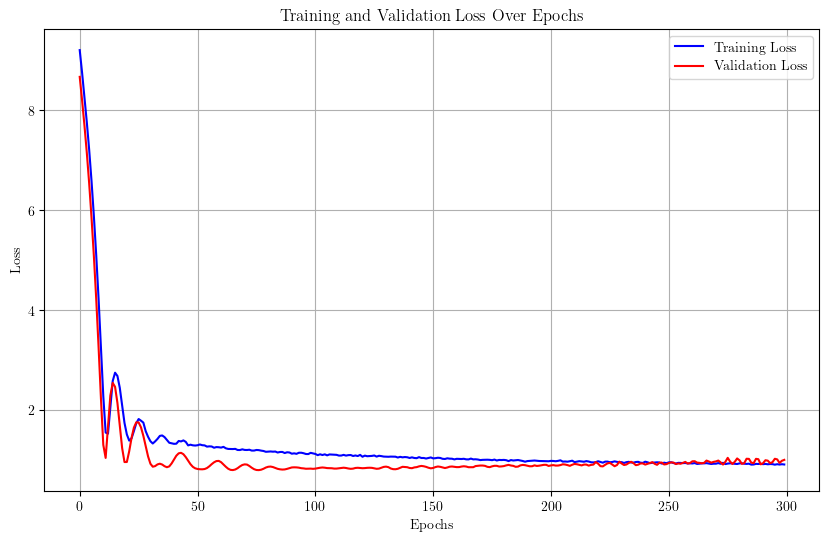

Training run 12/50 for 50% of the data...
Sample size for 50%: 7469


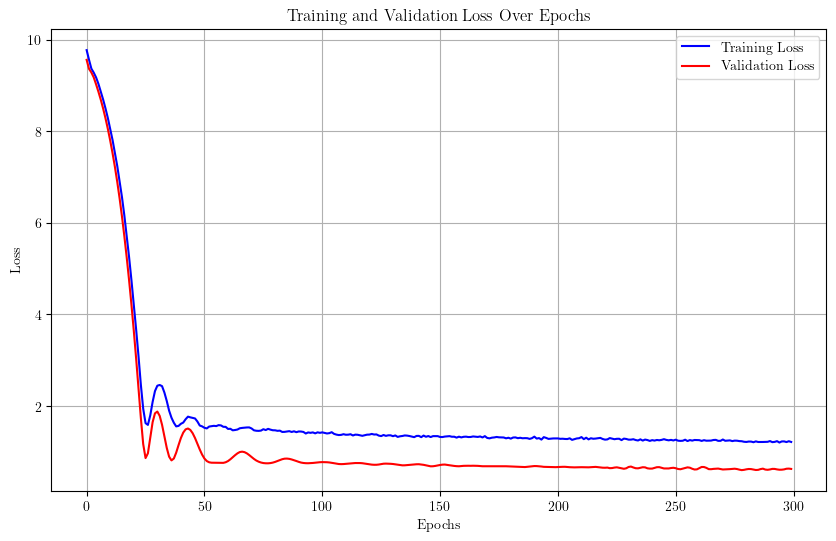

Training run 13/50 for 50% of the data...
Sample size for 50%: 7469


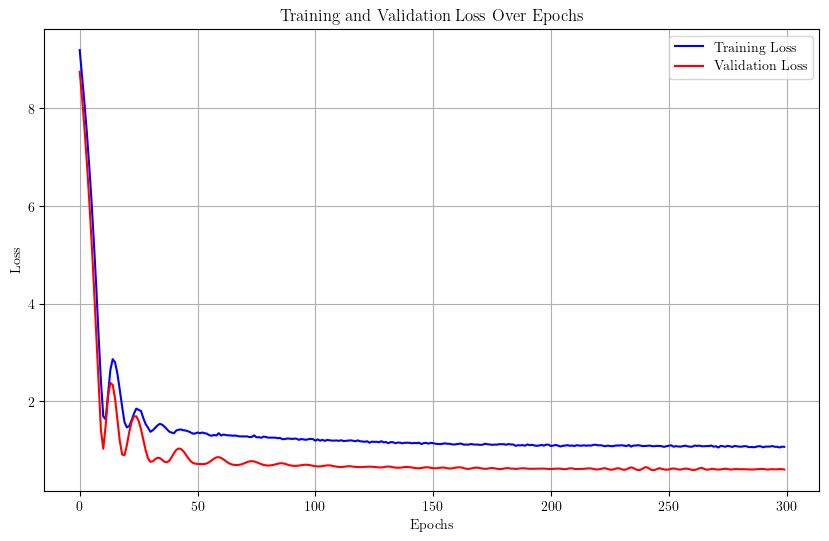

Training run 14/50 for 50% of the data...
Sample size for 50%: 7469


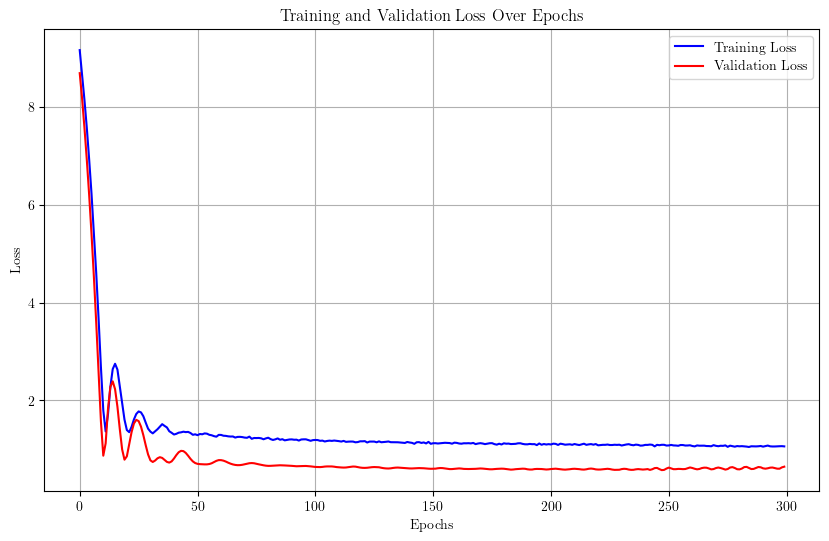

Training run 15/50 for 50% of the data...
Sample size for 50%: 7469


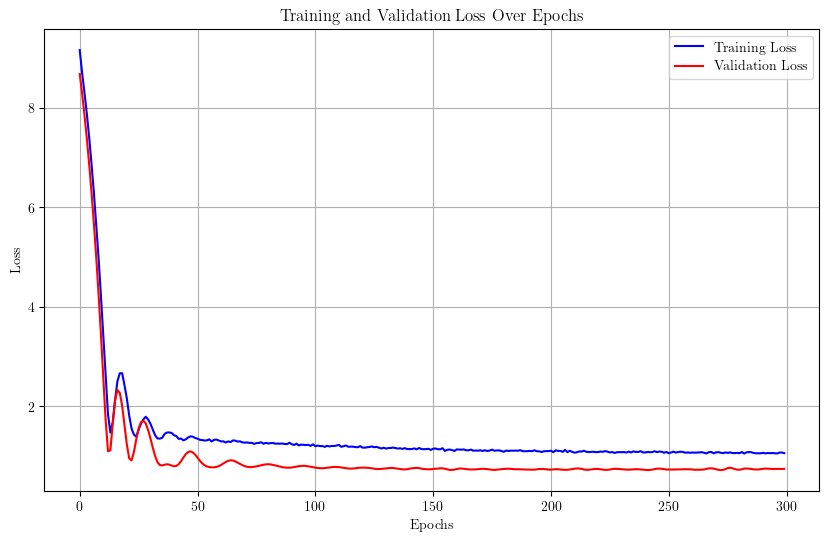

Training run 16/50 for 50% of the data...
Sample size for 50%: 7469


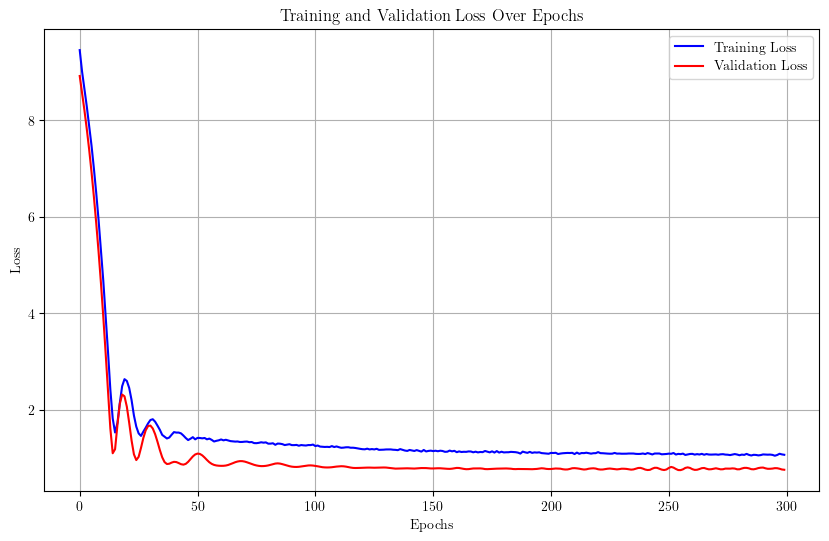

Training run 17/50 for 50% of the data...
Sample size for 50%: 7469


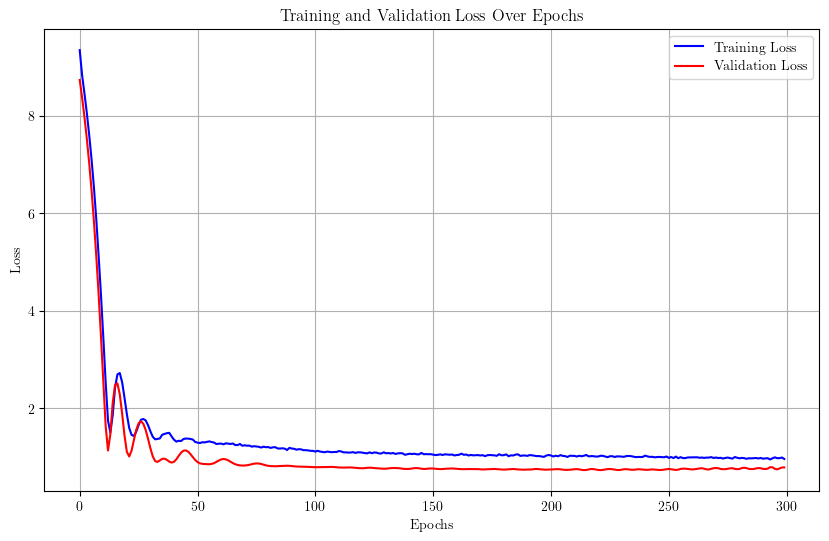

Training run 18/50 for 50% of the data...
Sample size for 50%: 7469


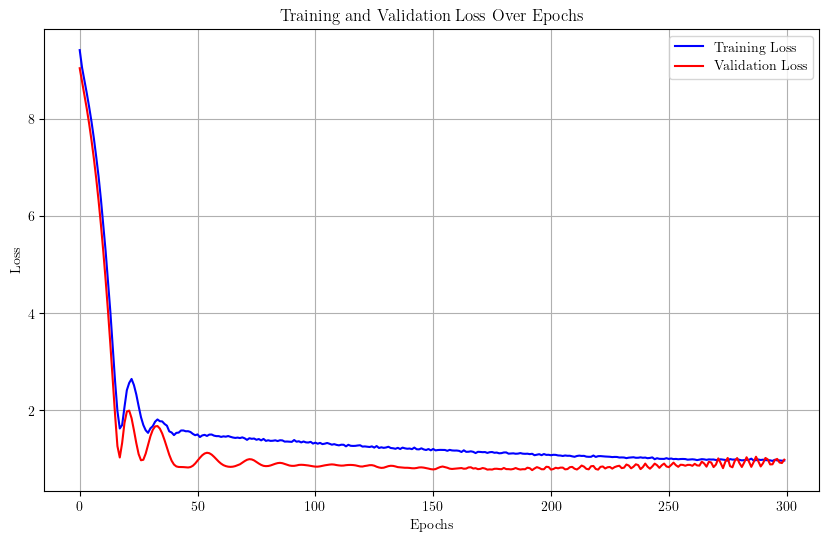

Training run 19/50 for 50% of the data...
Sample size for 50%: 7469


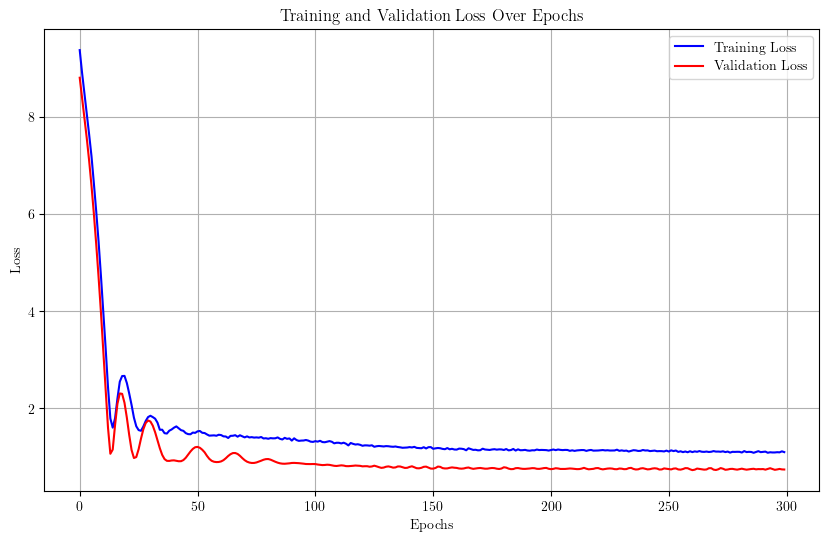

Training run 20/50 for 50% of the data...
Sample size for 50%: 7469


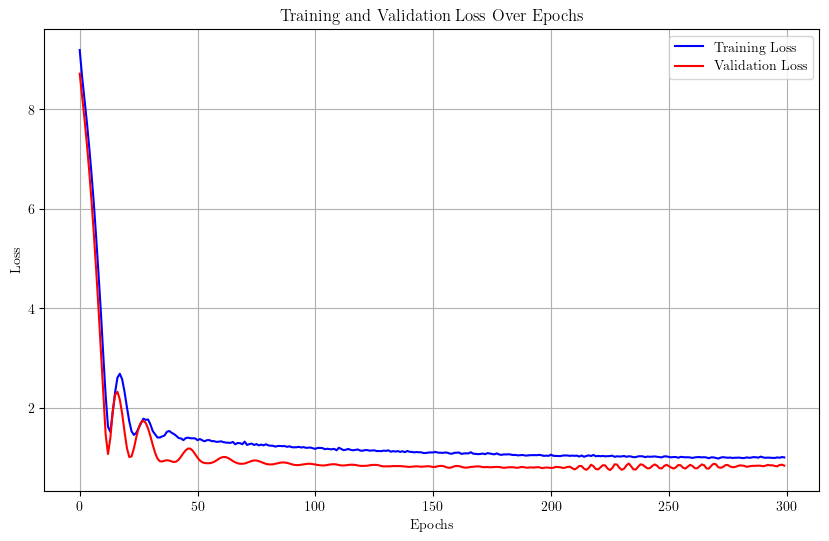

Training run 21/50 for 50% of the data...
Sample size for 50%: 7469


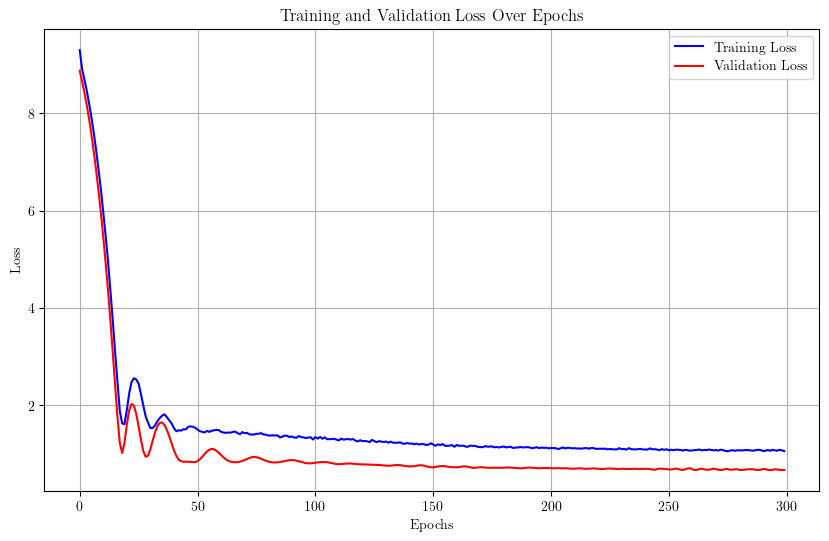

Training run 22/50 for 50% of the data...
Sample size for 50%: 7469


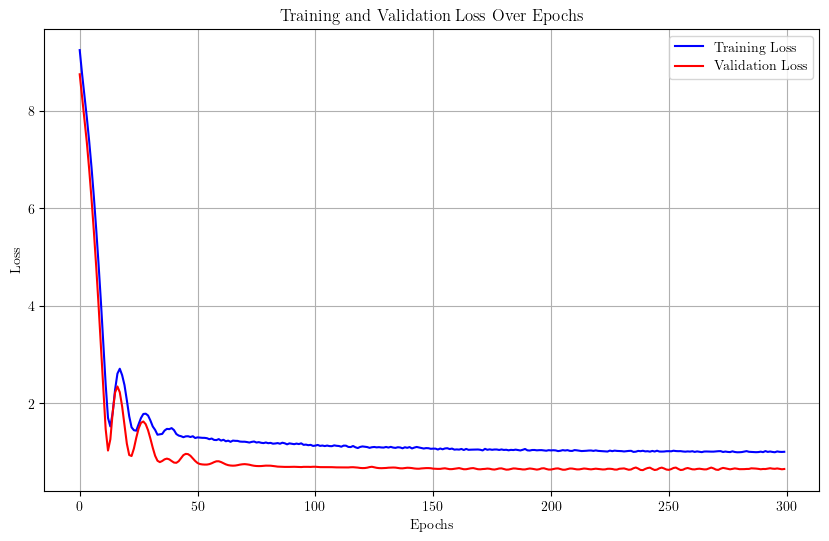

Training run 23/50 for 50% of the data...
Sample size for 50%: 7469


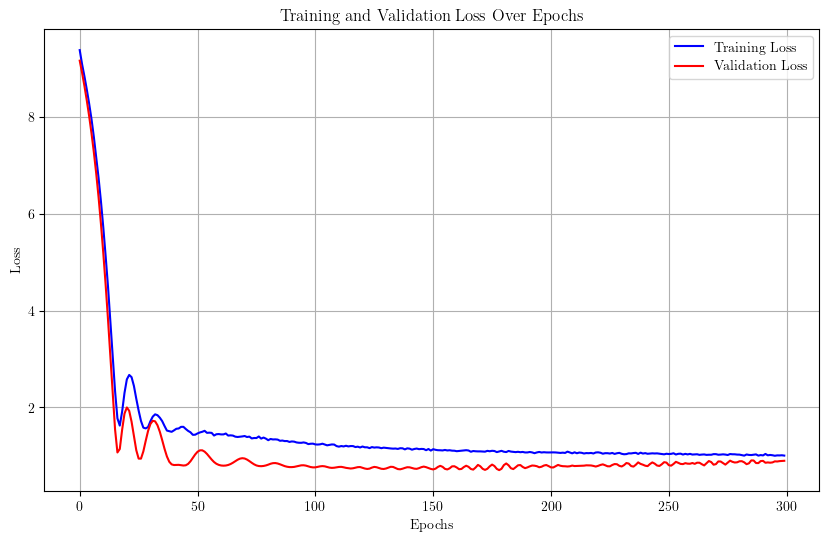

Training run 24/50 for 50% of the data...
Sample size for 50%: 7469


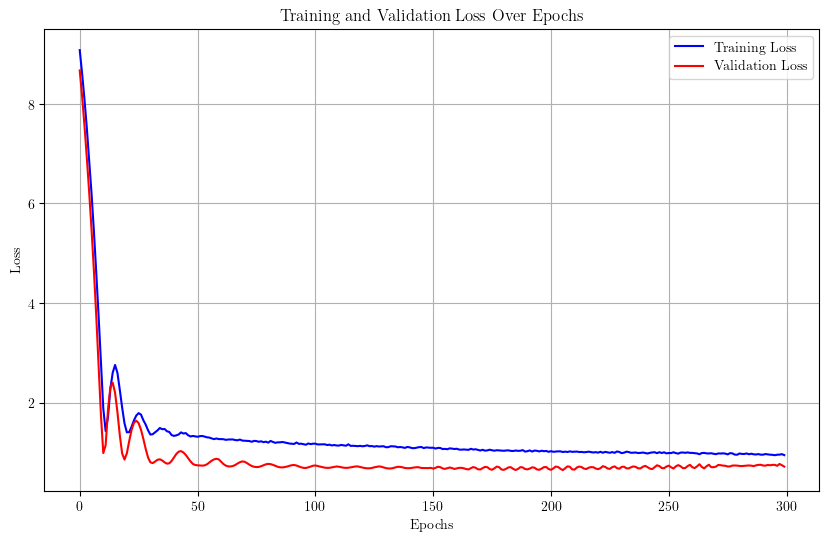

Training run 25/50 for 50% of the data...
Sample size for 50%: 7469


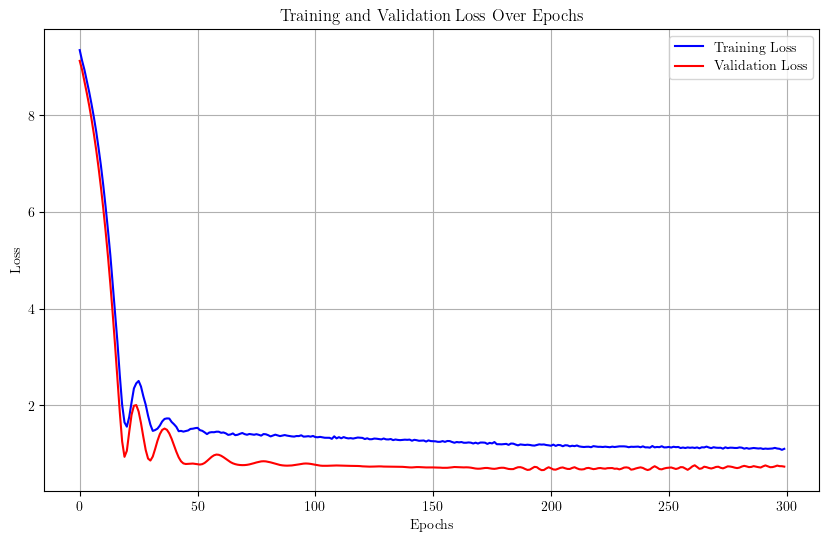

Training run 26/50 for 50% of the data...
Sample size for 50%: 7469


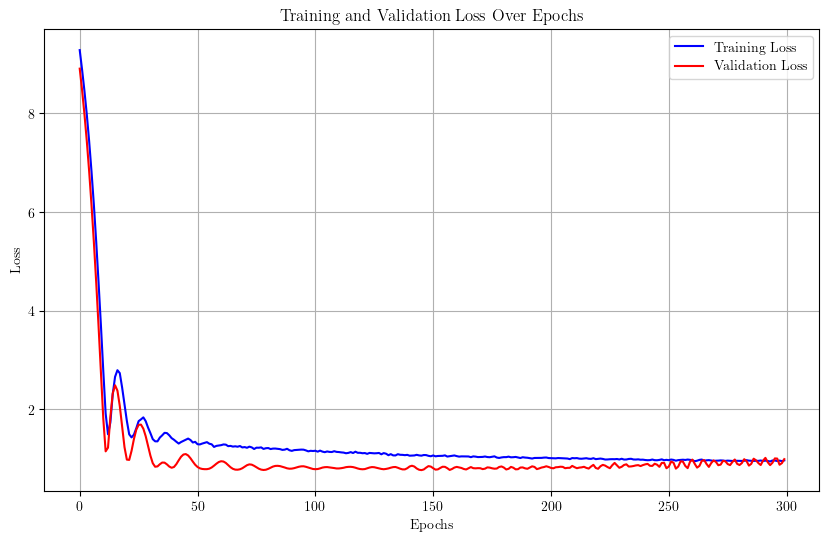

Training run 27/50 for 50% of the data...
Sample size for 50%: 7469


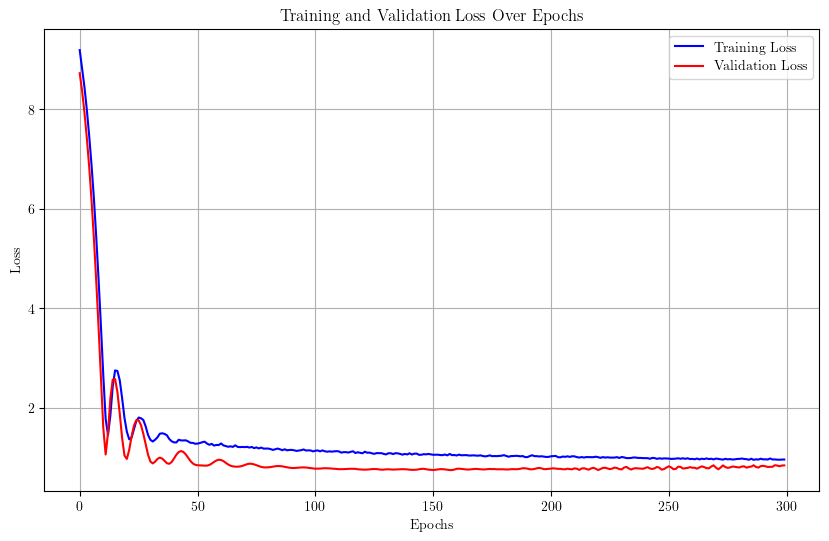

Training run 28/50 for 50% of the data...
Sample size for 50%: 7469


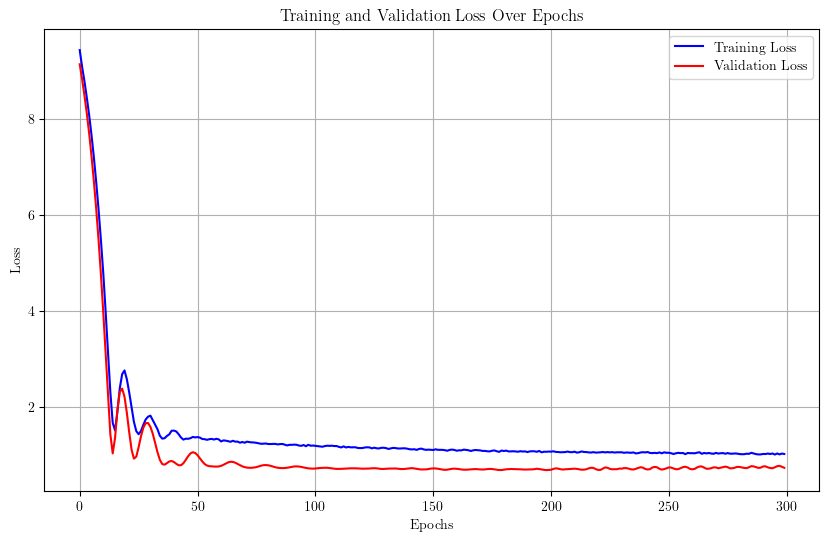

Training run 29/50 for 50% of the data...
Sample size for 50%: 7469


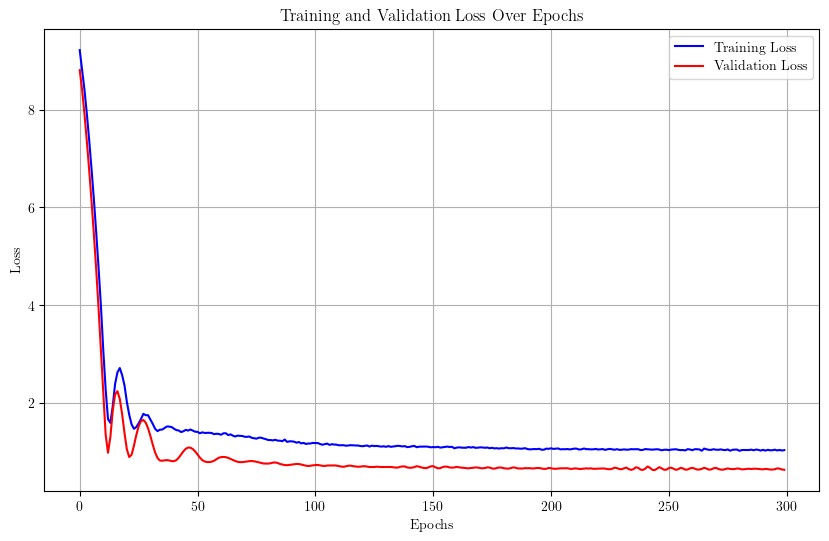

Training run 30/50 for 50% of the data...
Sample size for 50%: 7469


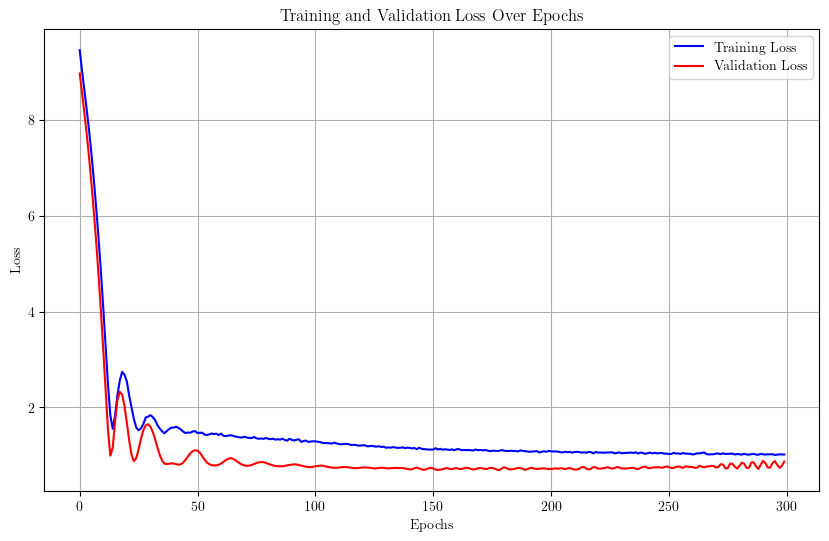

Training run 31/50 for 50% of the data...
Sample size for 50%: 7469


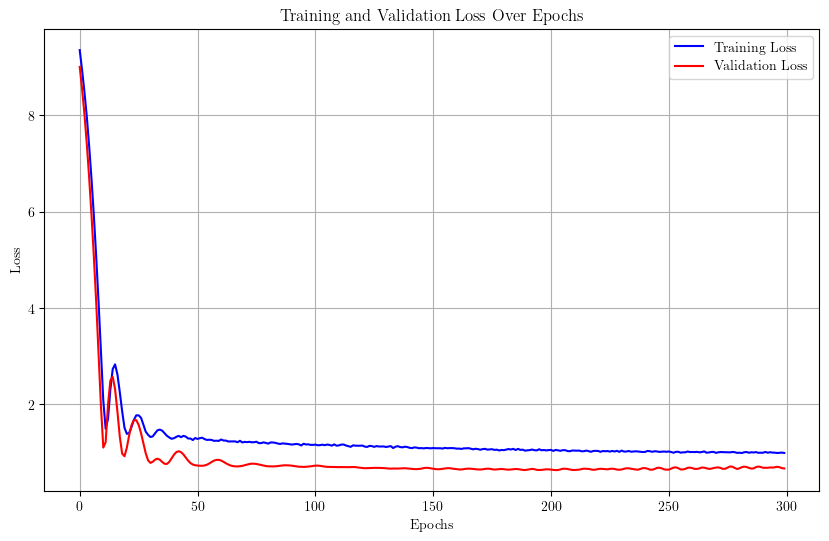

Training run 32/50 for 50% of the data...
Sample size for 50%: 7469


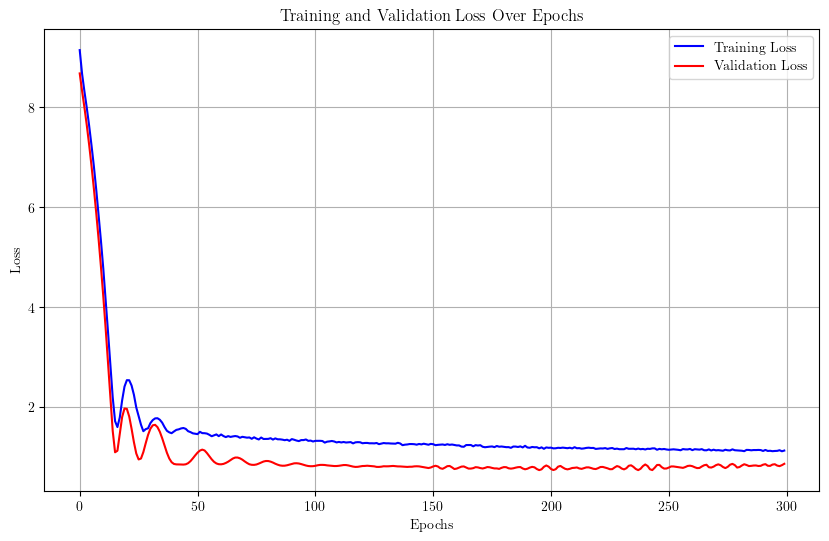

Training run 33/50 for 50% of the data...
Sample size for 50%: 7469


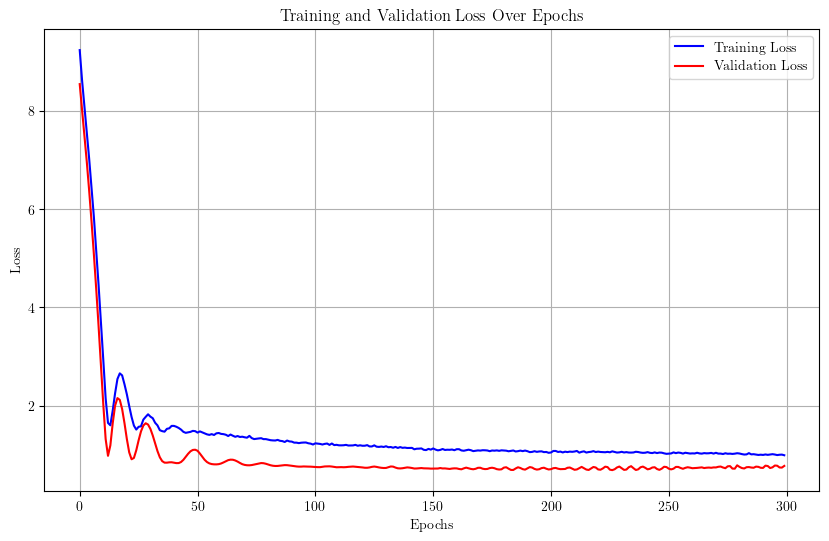

Training run 34/50 for 50% of the data...
Sample size for 50%: 7469


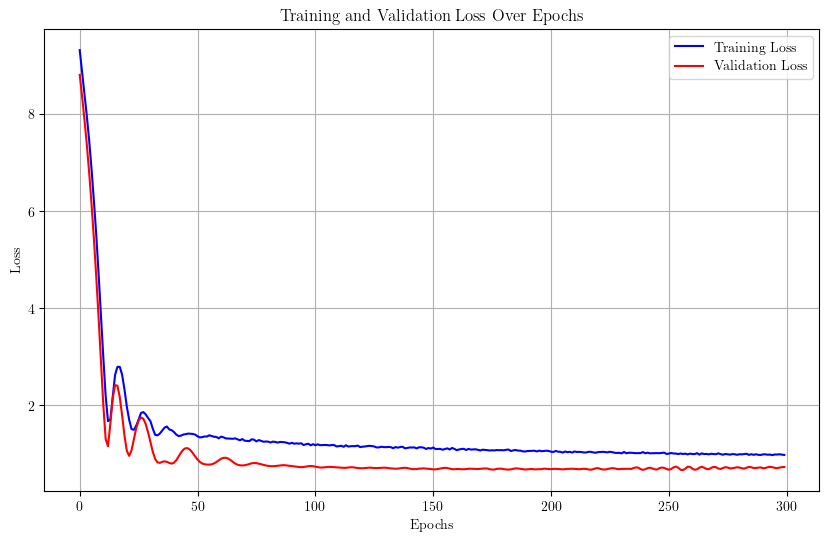

Training run 35/50 for 50% of the data...
Sample size for 50%: 7469


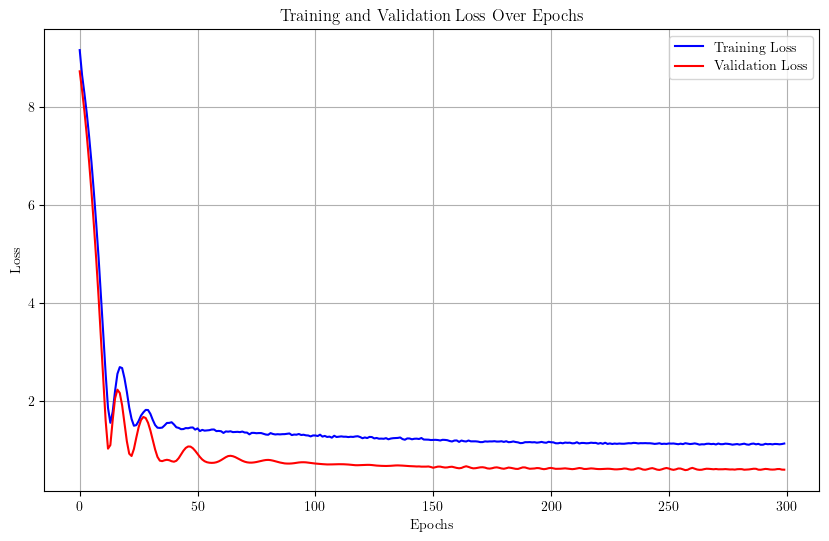

Training run 36/50 for 50% of the data...
Sample size for 50%: 7469


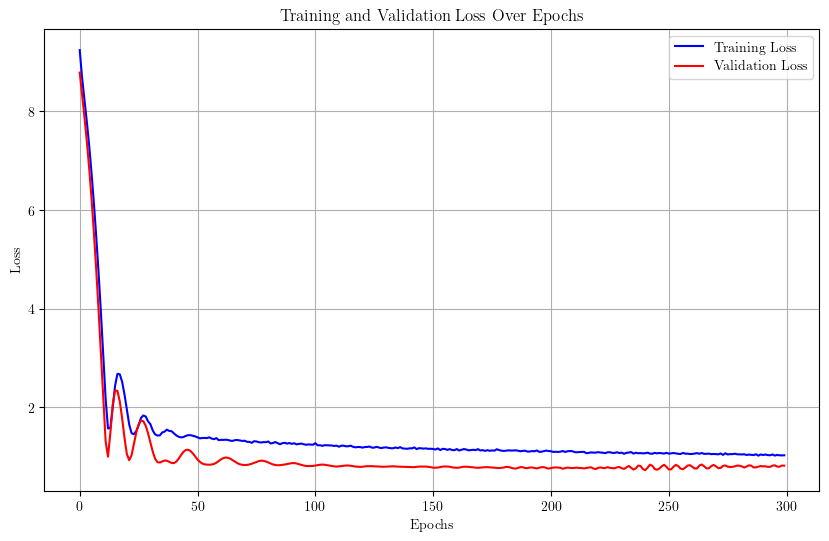

Training run 37/50 for 50% of the data...
Sample size for 50%: 7469


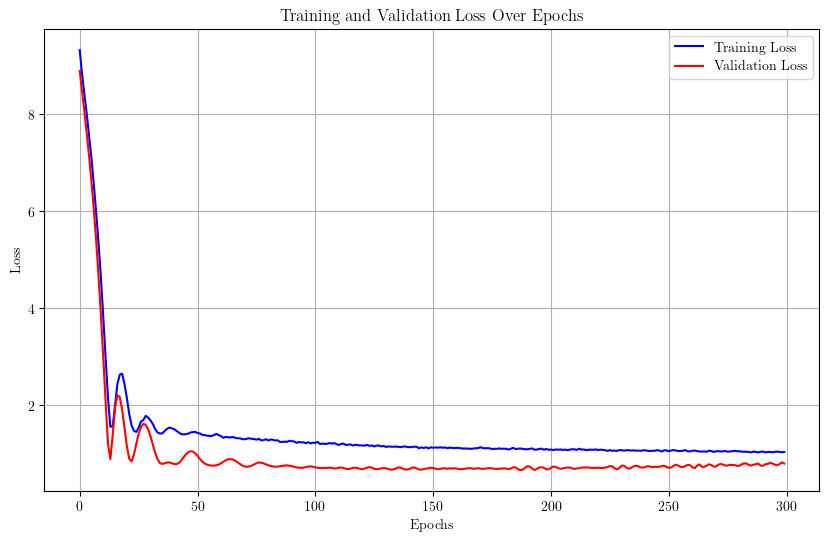

Training run 38/50 for 50% of the data...
Sample size for 50%: 7469


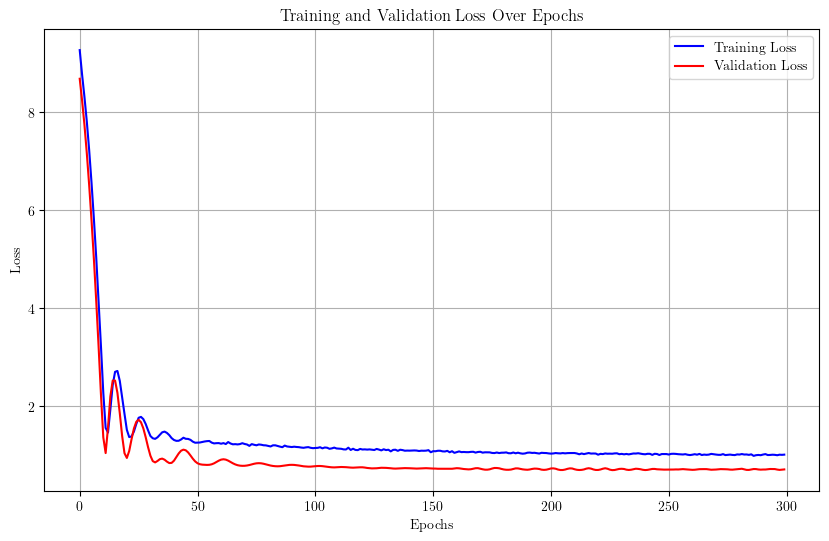

Training run 39/50 for 50% of the data...
Sample size for 50%: 7469


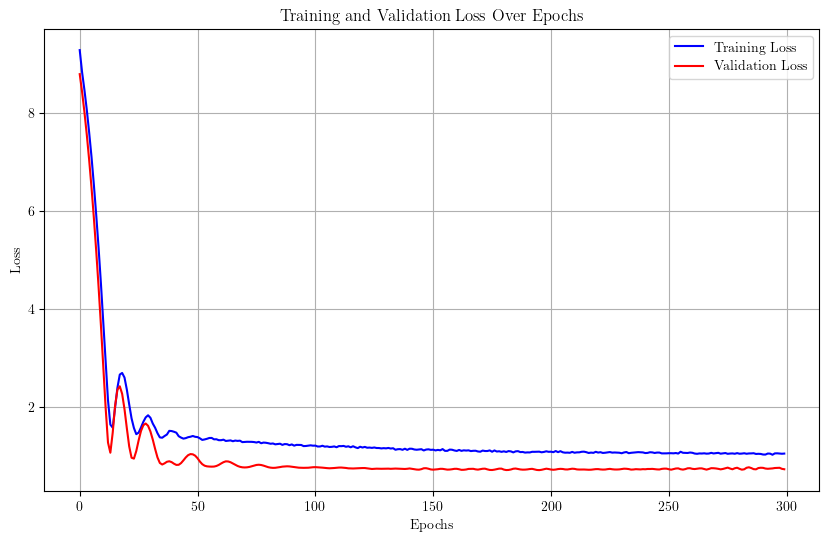

Training run 40/50 for 50% of the data...
Sample size for 50%: 7469


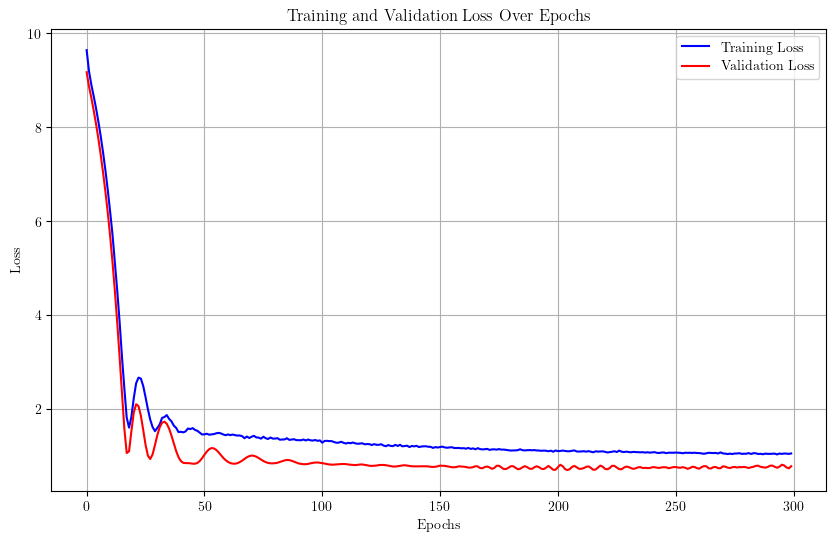

Training run 41/50 for 50% of the data...
Sample size for 50%: 7469


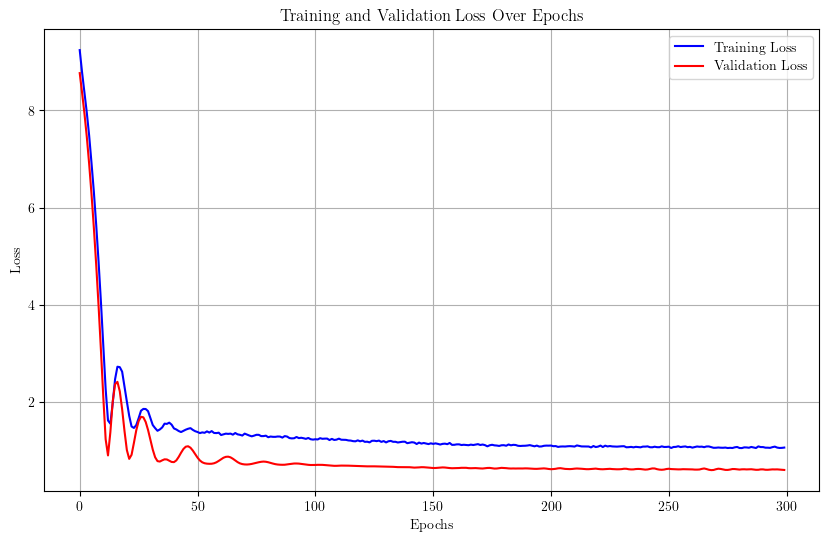

Training run 42/50 for 50% of the data...
Sample size for 50%: 7469


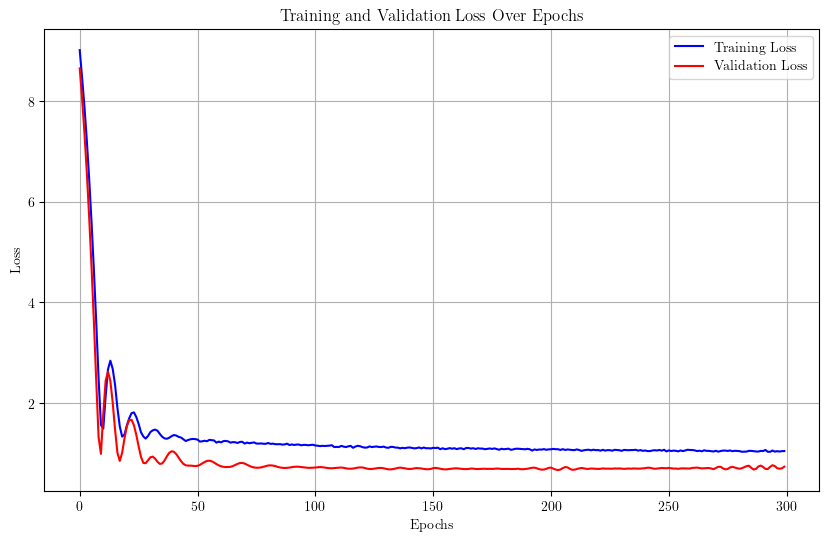

Training run 43/50 for 50% of the data...
Sample size for 50%: 7469


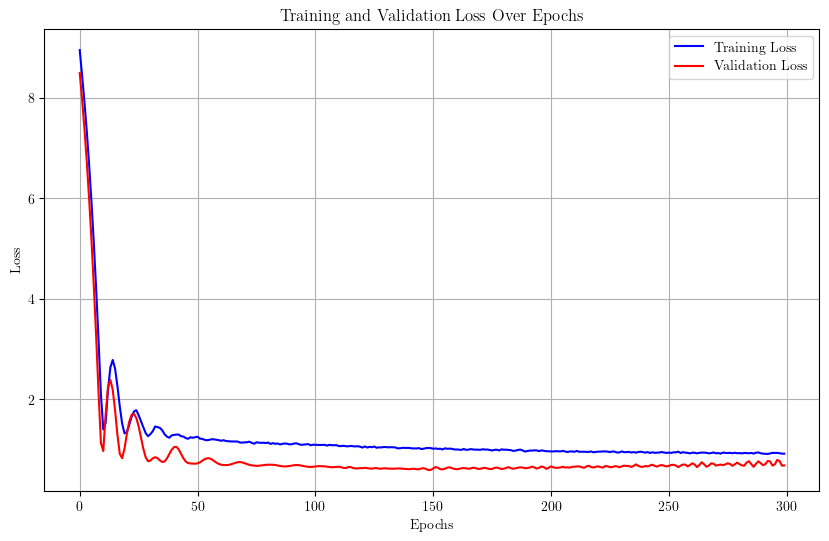

Training run 44/50 for 50% of the data...
Sample size for 50%: 7469


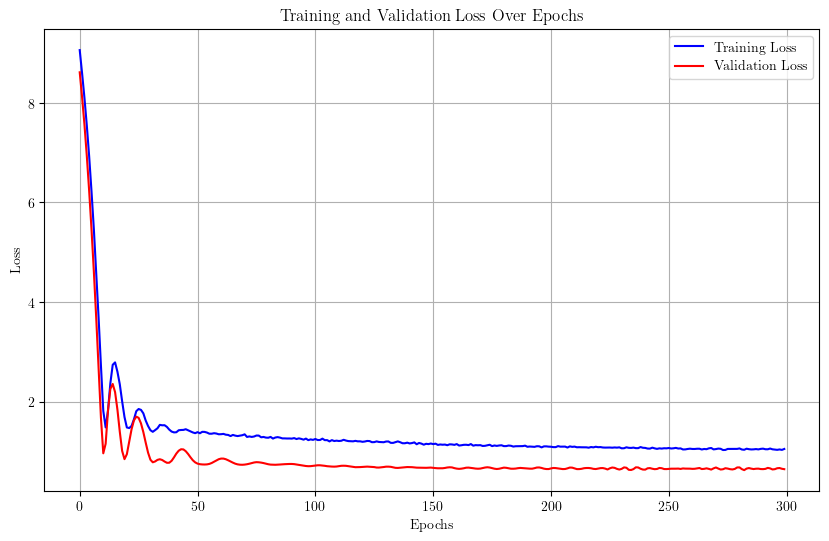

Training run 45/50 for 50% of the data...
Sample size for 50%: 7469


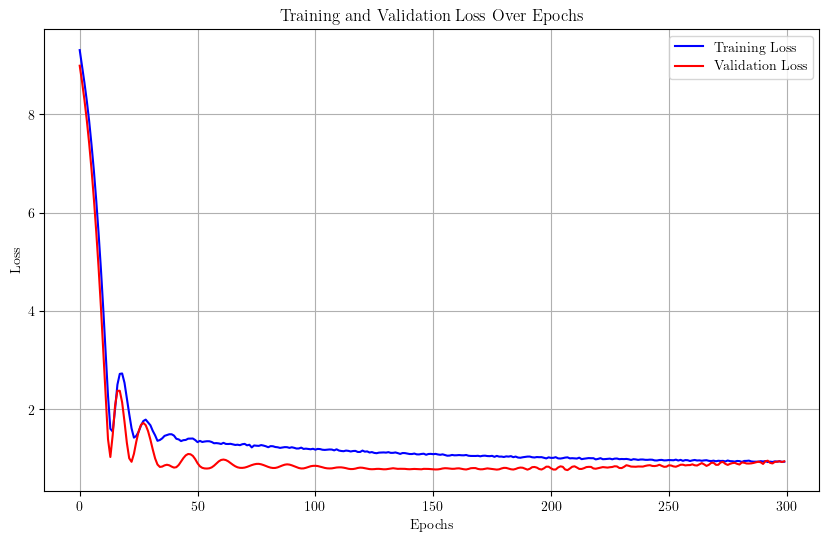

Training run 46/50 for 50% of the data...
Sample size for 50%: 7469


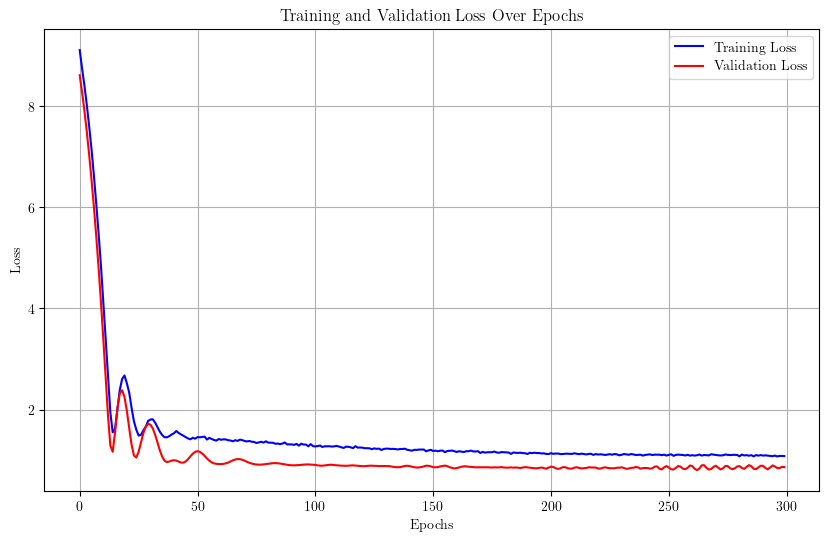

Training run 47/50 for 50% of the data...
Sample size for 50%: 7469


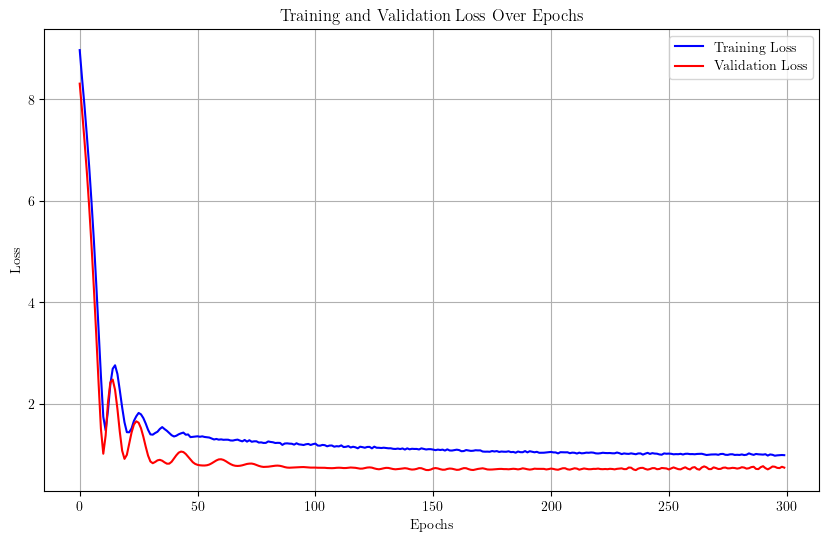

Training run 48/50 for 50% of the data...
Sample size for 50%: 7469


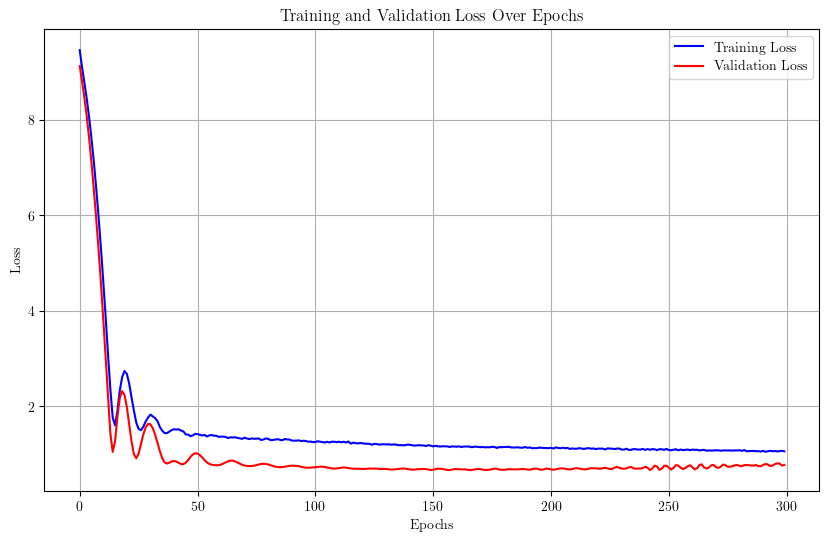

Training run 49/50 for 50% of the data...
Sample size for 50%: 7469


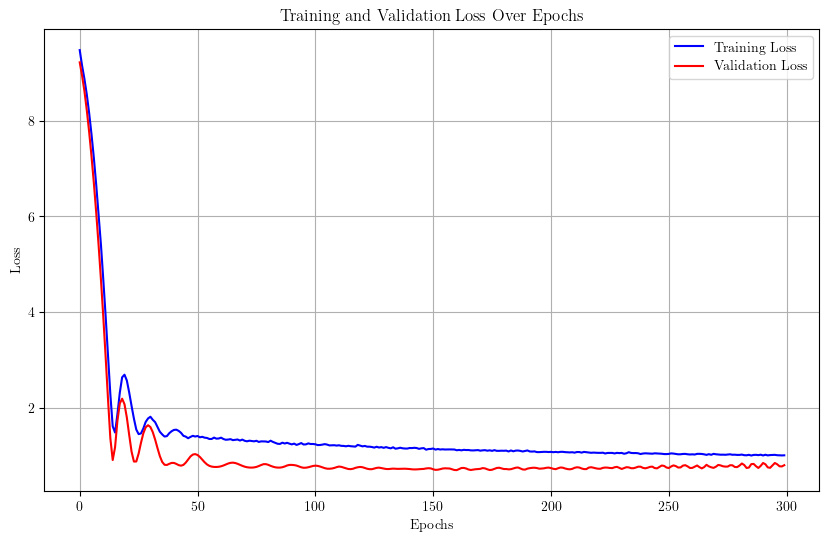

Training run 50/50 for 50% of the data...
Sample size for 50%: 7469


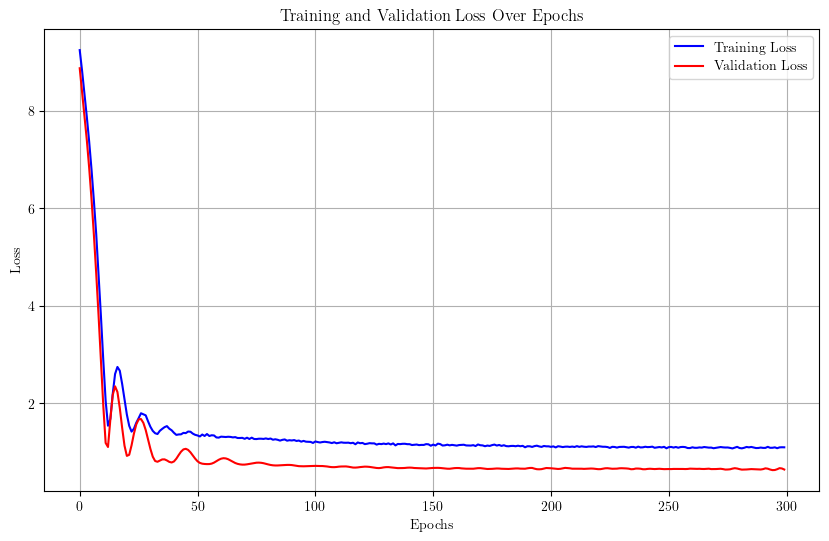

Metrics for 50% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(6.5301685), 'mae': np.float32(1.1259332), 'r2': np.float64(0.012904117107391358), 'bias': np.float32(0.50622946), 'nmad': np.float32(0.03038594), 'sigma_68': np.float32(0.033737954), 'outlier_fraction': np.float64(5.8447121820615795)}
Metrics Across Runs:
mse: 6.5302 ± 1.8151
mae: 1.1259 ± 0.1493
r2: 0.0129 ± 0.0158
bias: 0.5062 ± 0.0573
nmad: 0.0304 ± 0.0014
sigma_68: 0.0337 ± 0.0017
outlier_fraction: 5.8447 ± 0.5504
Training model for 80% of the data...
Training run 1/50 for 80% of the data...
Sample size for 80%: 11950


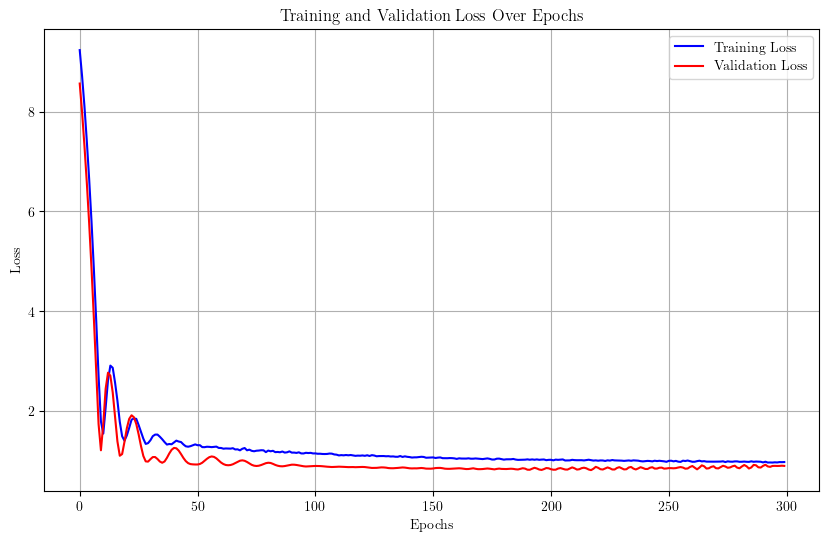

Training run 2/50 for 80% of the data...
Sample size for 80%: 11950


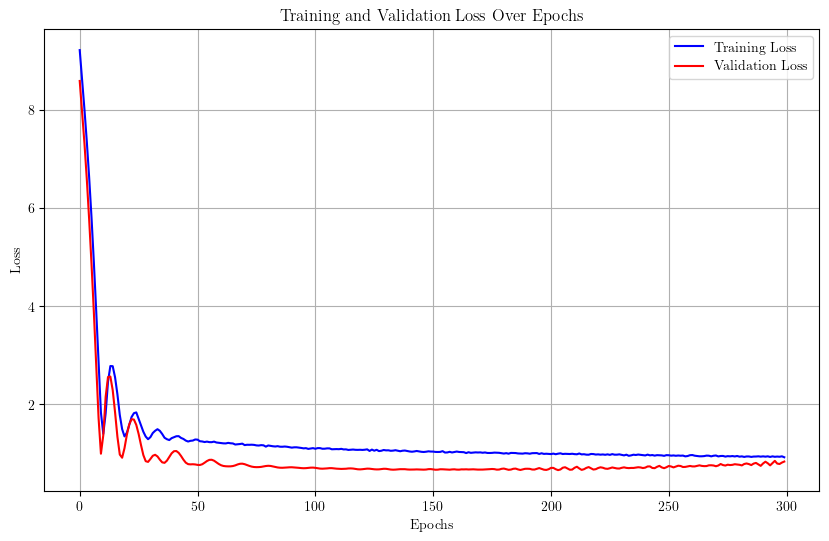

Training run 3/50 for 80% of the data...
Sample size for 80%: 11950


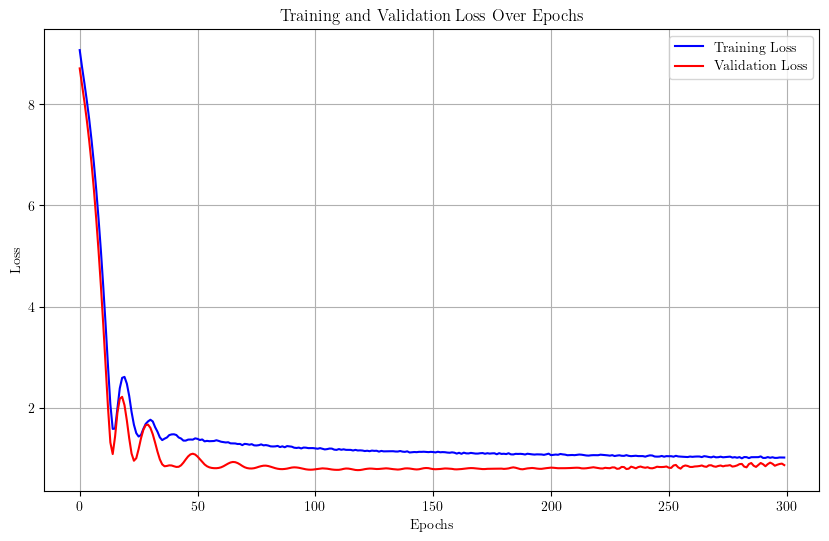

Training run 4/50 for 80% of the data...
Sample size for 80%: 11950


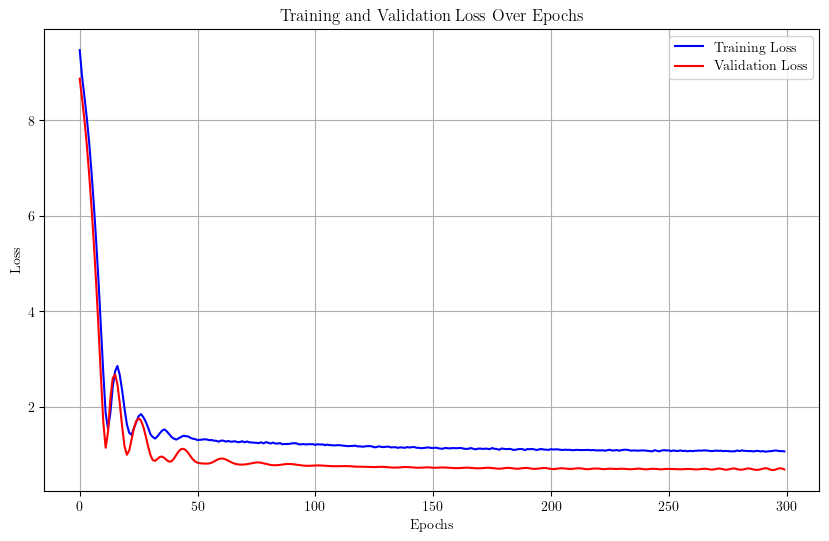

Training run 5/50 for 80% of the data...
Sample size for 80%: 11950


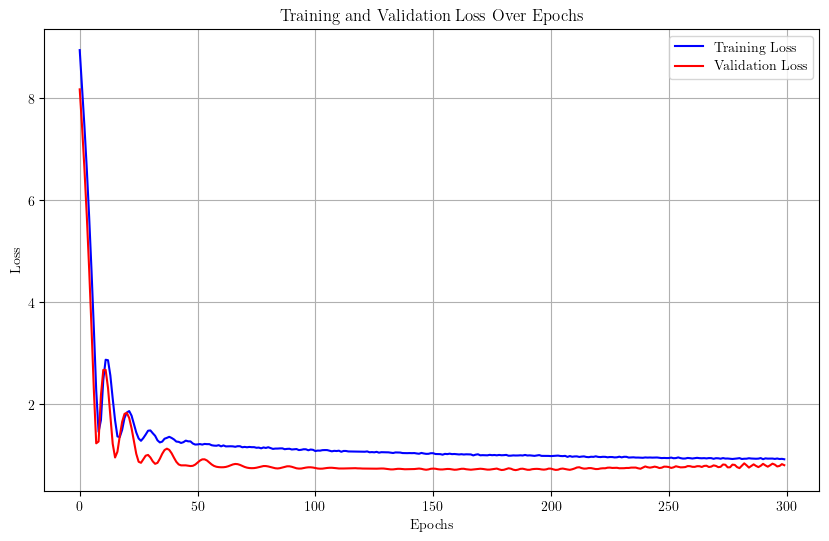

Training run 6/50 for 80% of the data...
Sample size for 80%: 11950


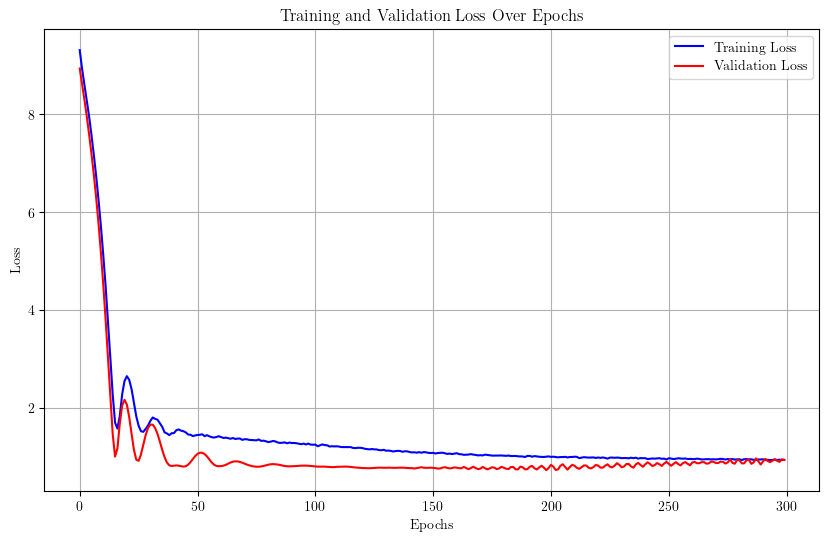

Training run 7/50 for 80% of the data...
Sample size for 80%: 11950


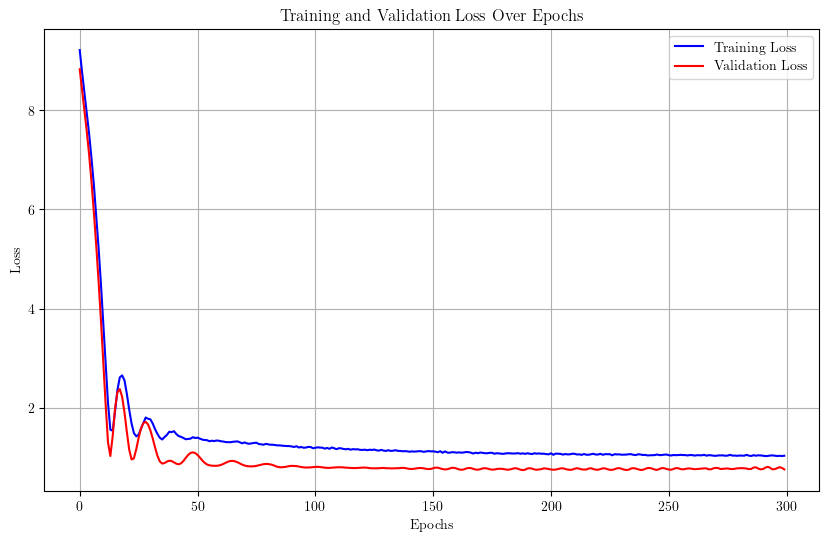

Training run 8/50 for 80% of the data...
Sample size for 80%: 11950


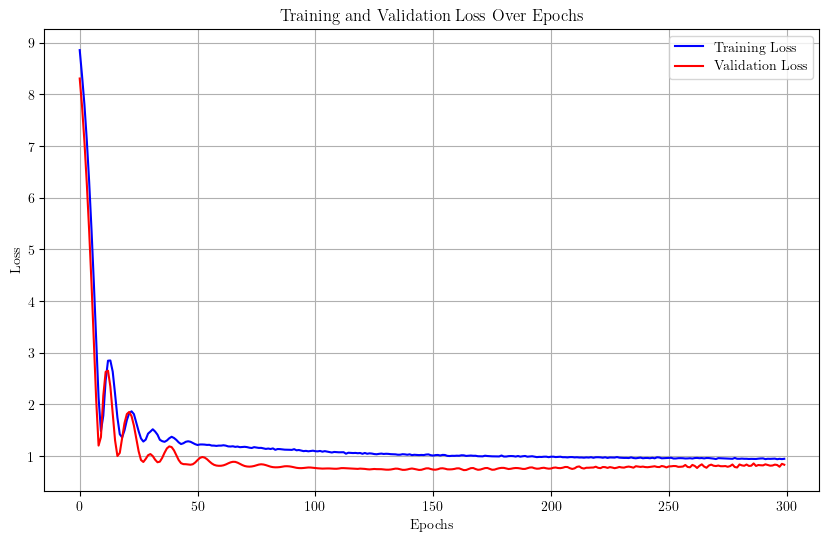

Training run 9/50 for 80% of the data...
Sample size for 80%: 11950


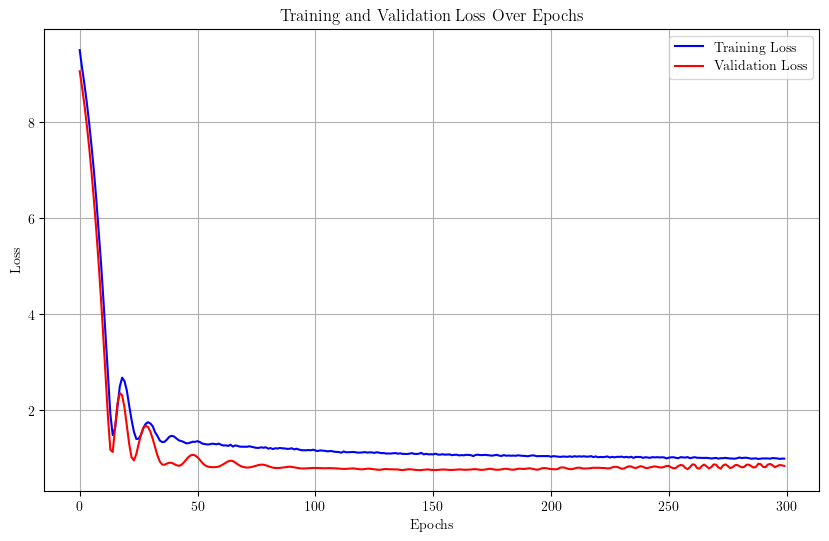

Training run 10/50 for 80% of the data...
Sample size for 80%: 11950


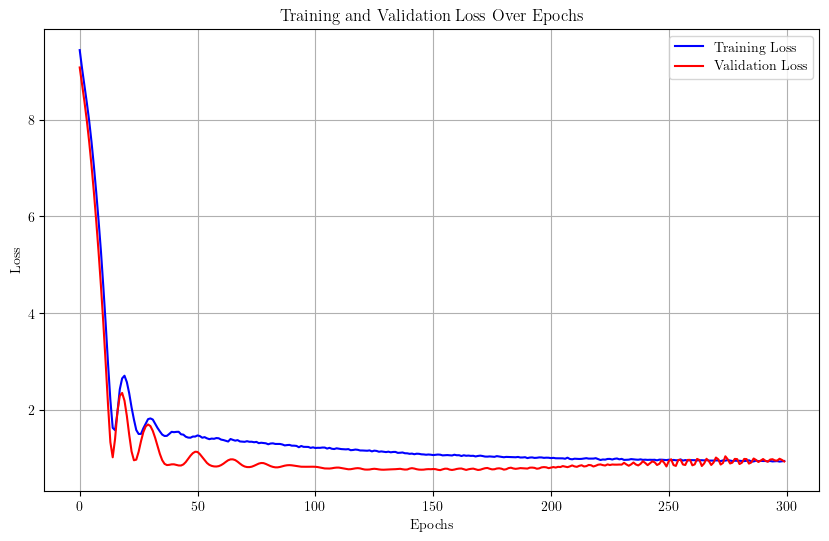

Training run 11/50 for 80% of the data...
Sample size for 80%: 11950


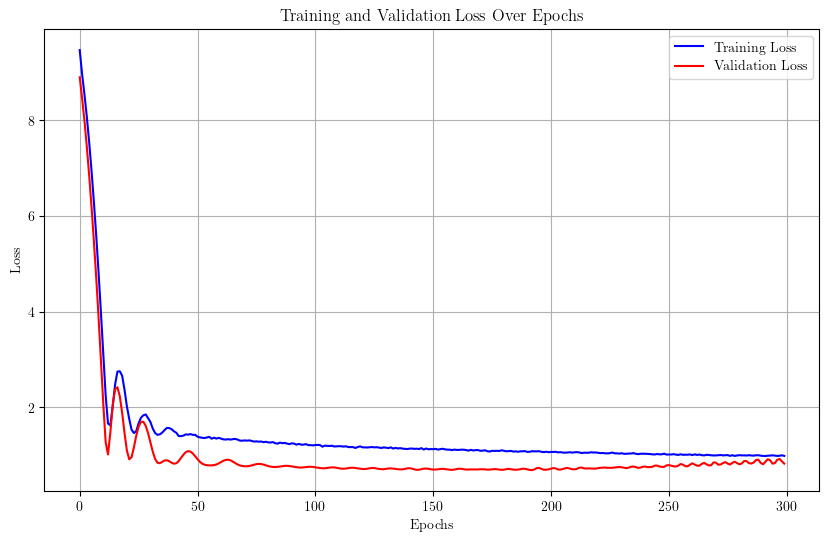

Training run 12/50 for 80% of the data...
Sample size for 80%: 11950


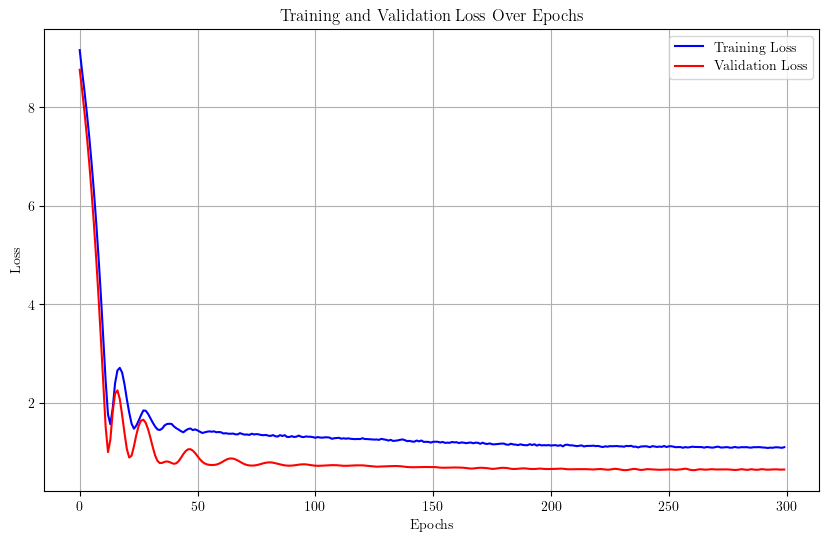

Training run 13/50 for 80% of the data...
Sample size for 80%: 11950


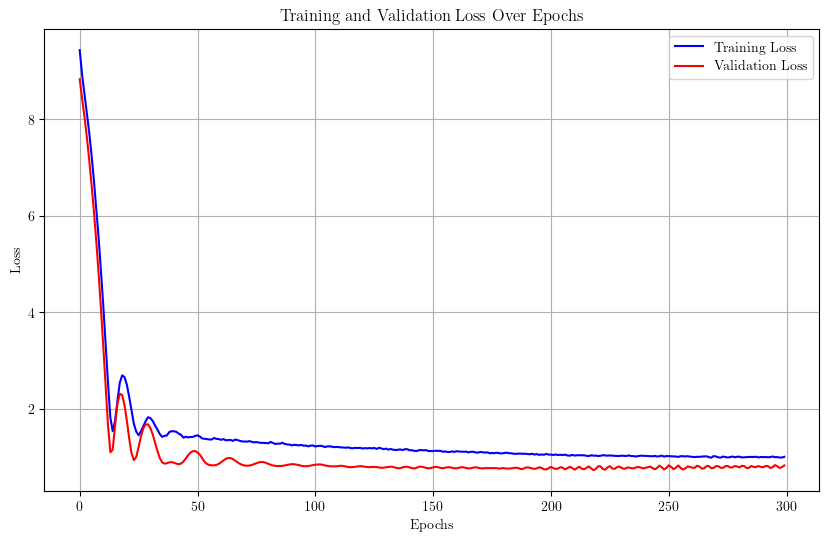

Training run 14/50 for 80% of the data...
Sample size for 80%: 11950


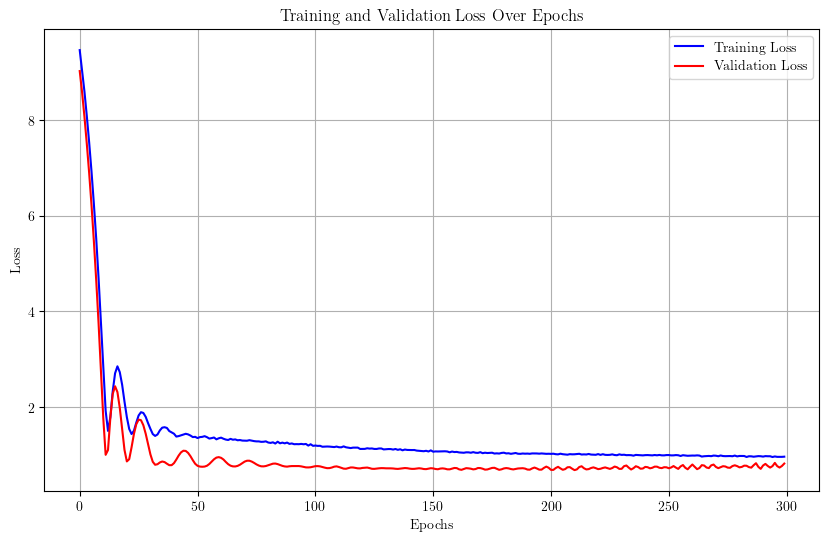

Training run 15/50 for 80% of the data...
Sample size for 80%: 11950


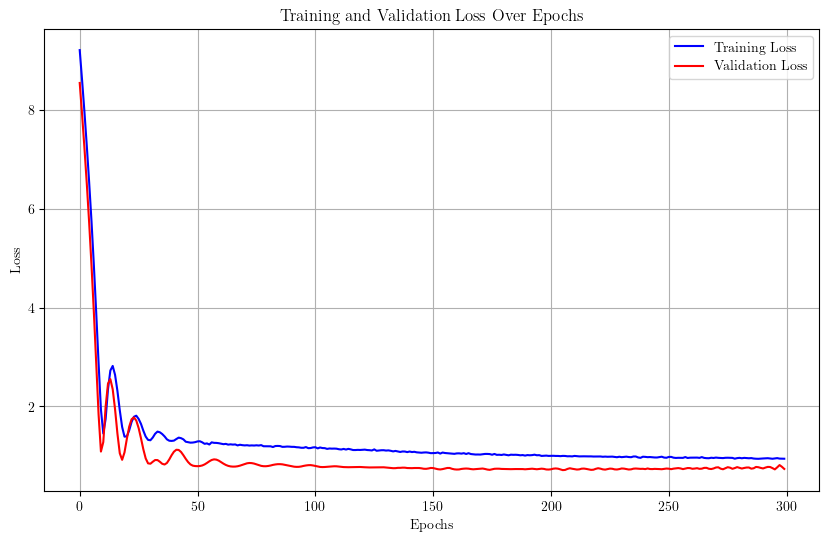

Training run 16/50 for 80% of the data...
Sample size for 80%: 11950


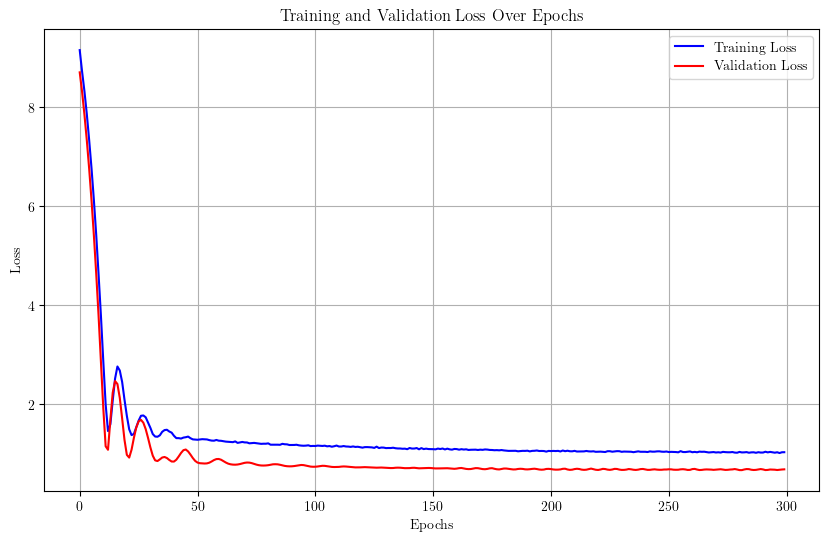

Training run 17/50 for 80% of the data...
Sample size for 80%: 11950


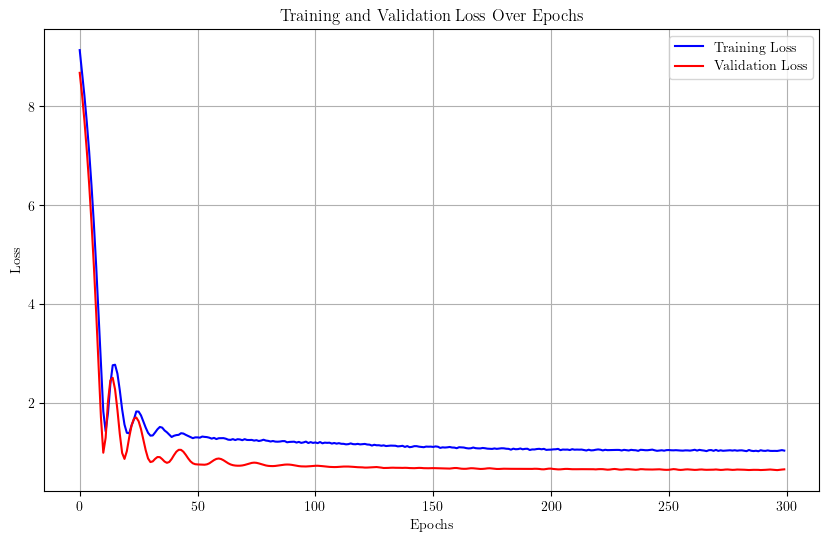

Training run 18/50 for 80% of the data...
Sample size for 80%: 11950


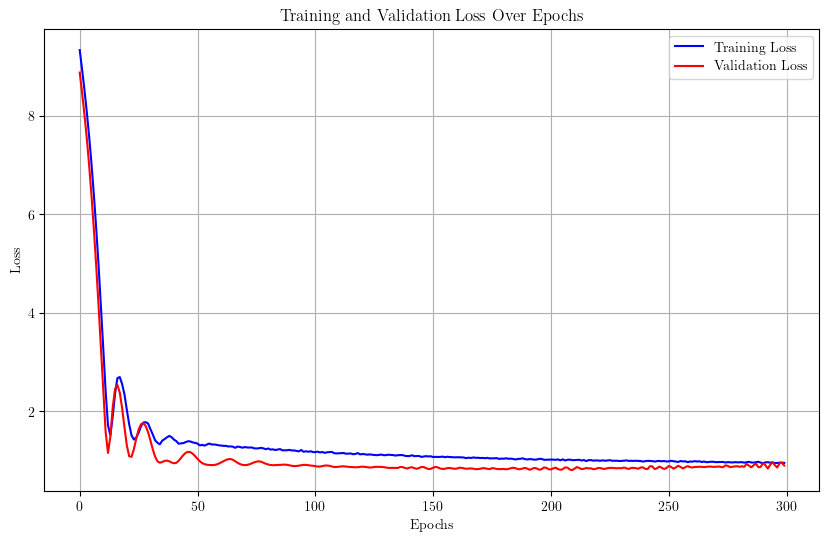

Training run 19/50 for 80% of the data...
Sample size for 80%: 11950


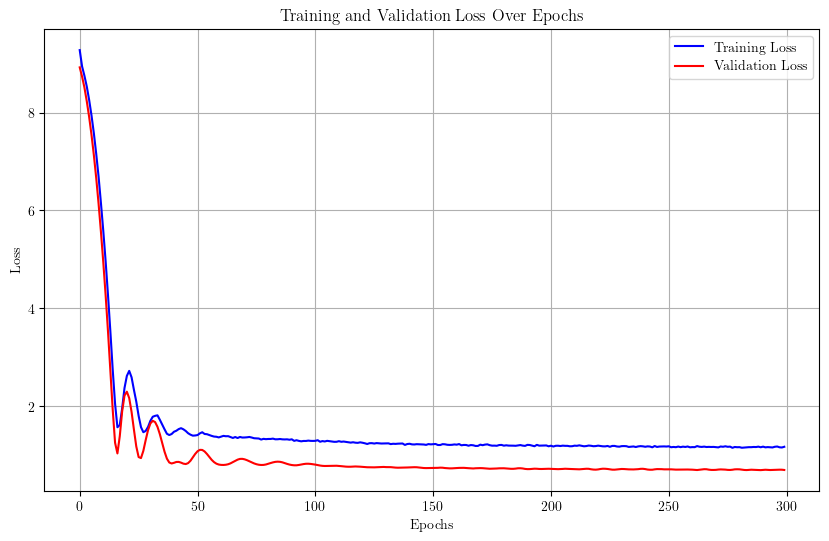

Training run 20/50 for 80% of the data...
Sample size for 80%: 11950


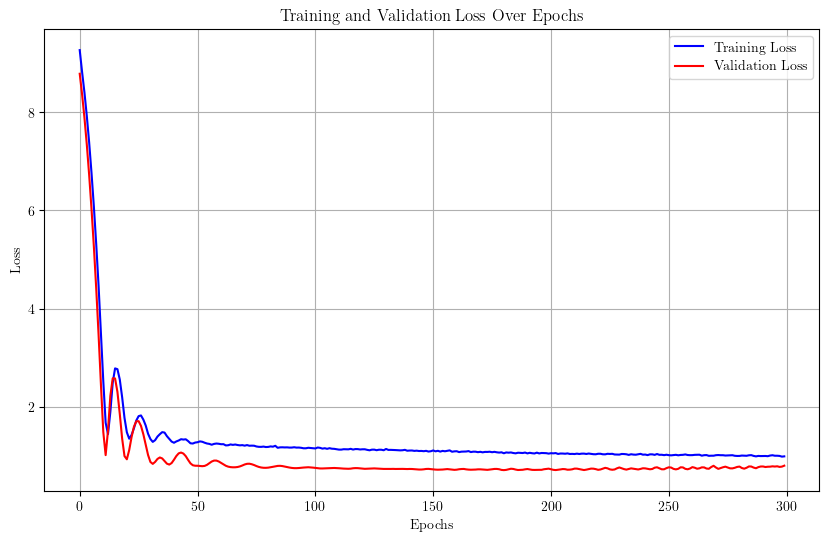

Training run 21/50 for 80% of the data...
Sample size for 80%: 11950


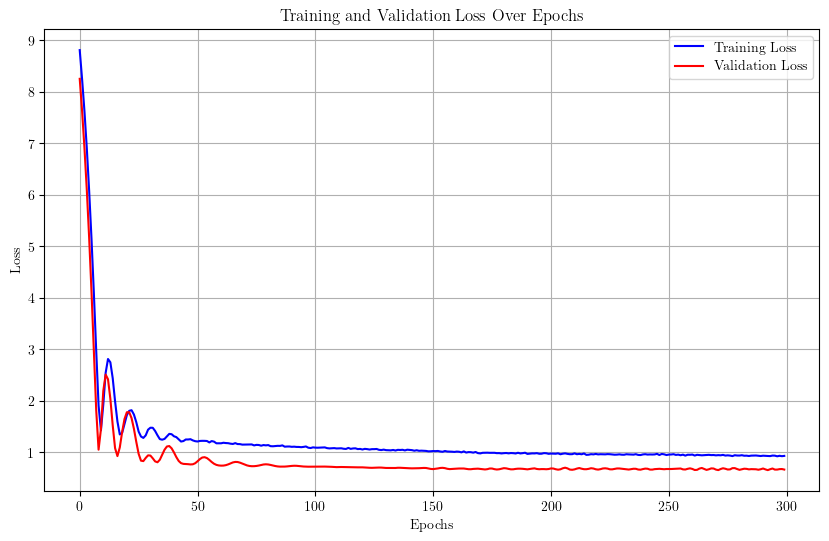

Training run 22/50 for 80% of the data...
Sample size for 80%: 11950


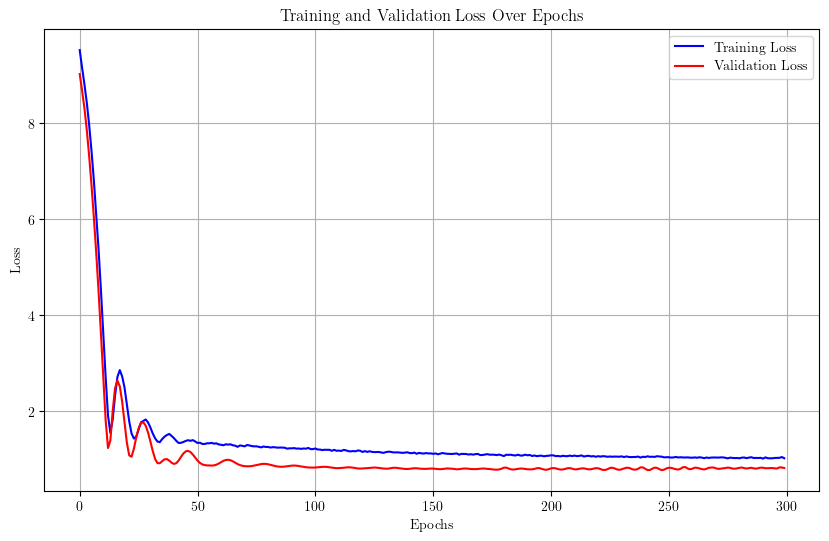

Training run 23/50 for 80% of the data...
Sample size for 80%: 11950


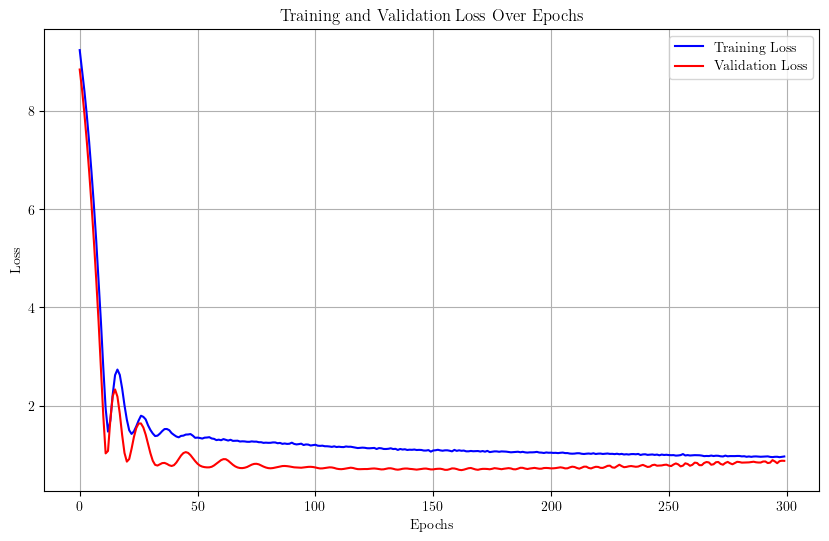

Training run 24/50 for 80% of the data...
Sample size for 80%: 11950


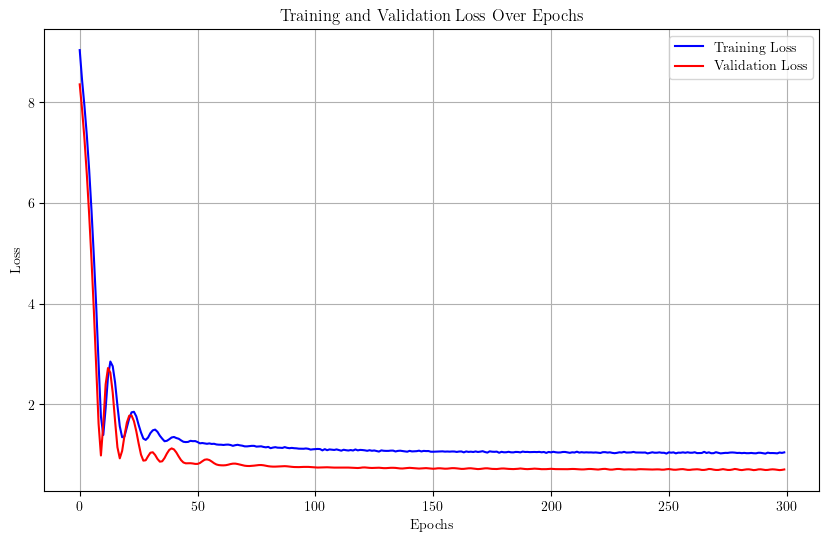

Training run 25/50 for 80% of the data...
Sample size for 80%: 11950


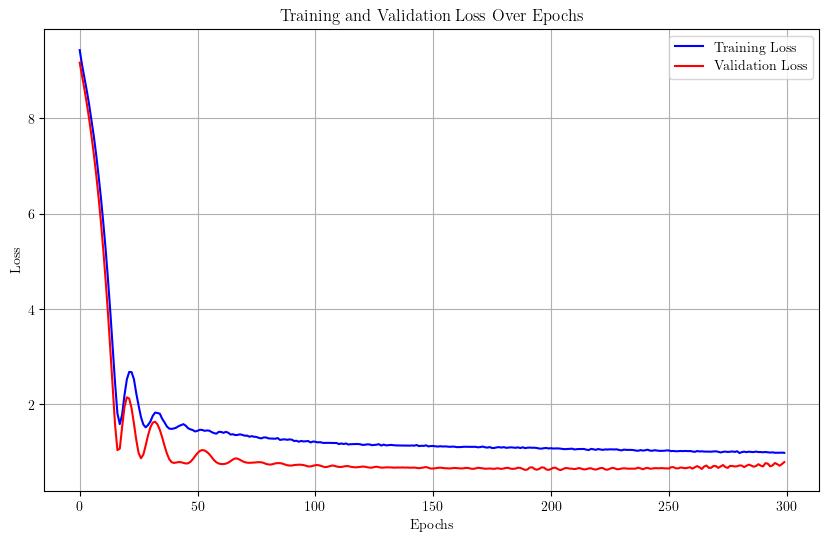

Training run 26/50 for 80% of the data...
Sample size for 80%: 11950


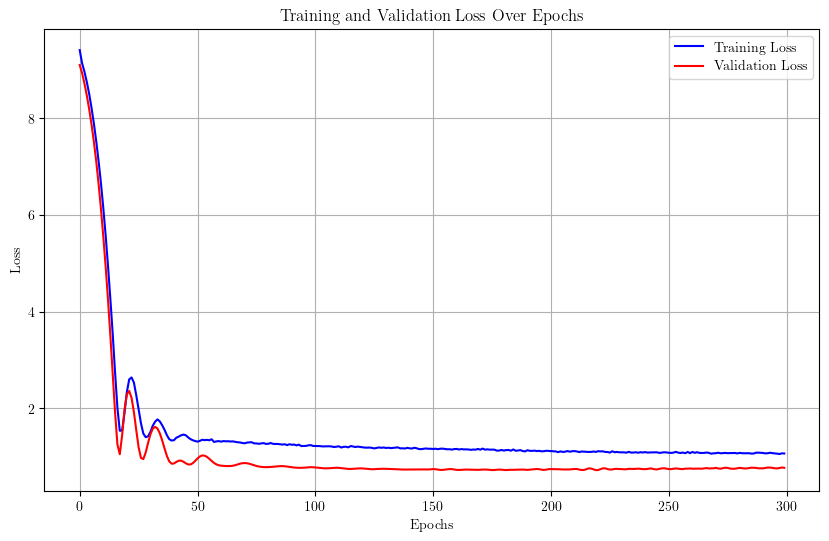

Training run 27/50 for 80% of the data...
Sample size for 80%: 11950


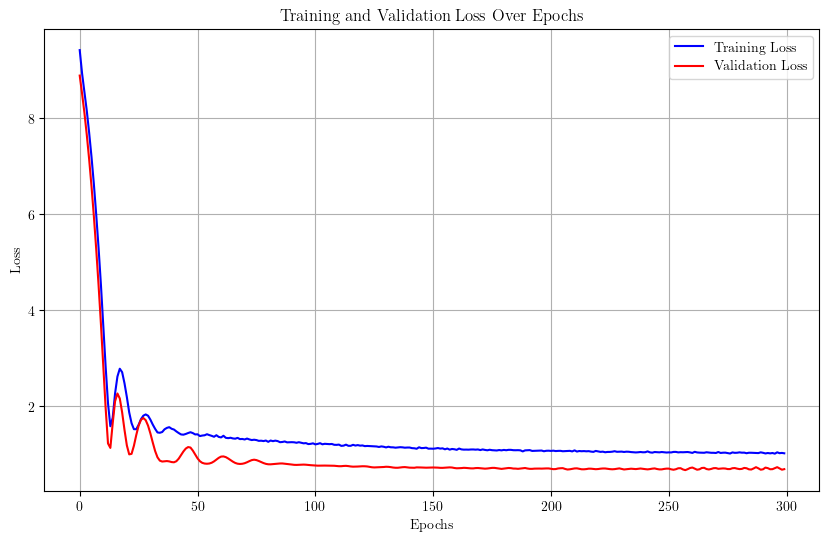

Training run 28/50 for 80% of the data...
Sample size for 80%: 11950


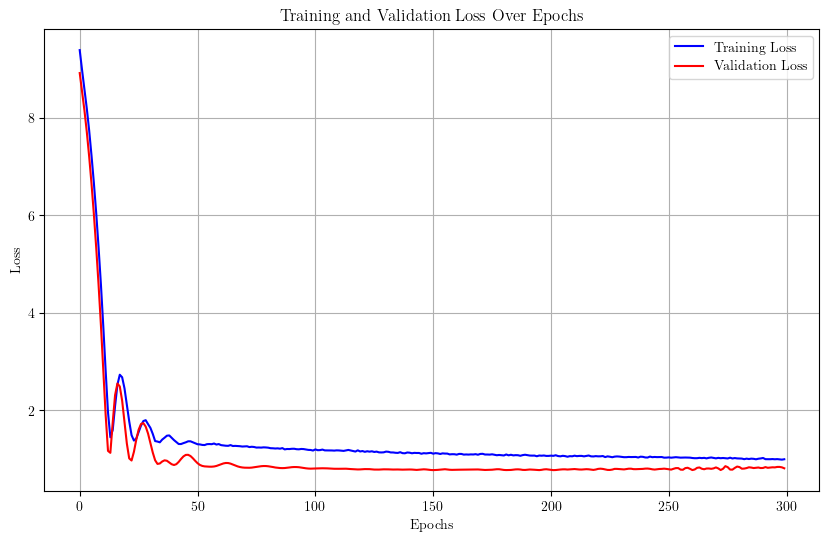

Training run 29/50 for 80% of the data...
Sample size for 80%: 11950


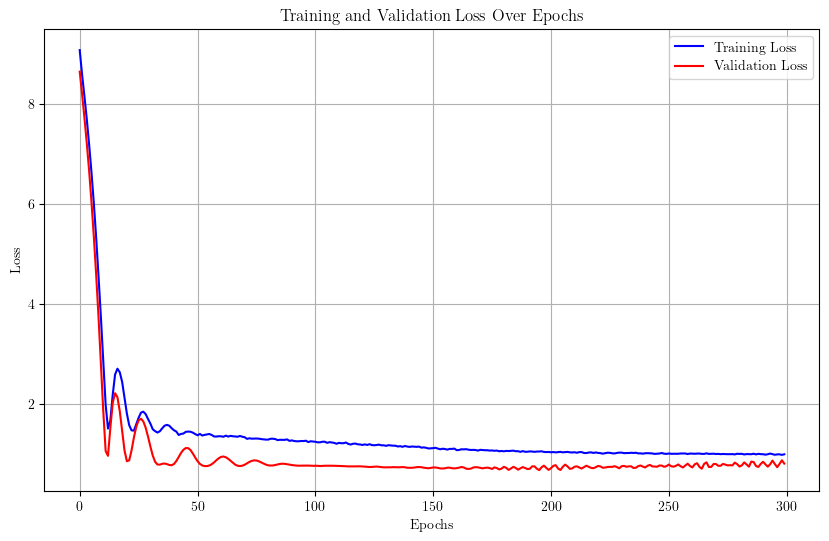

Training run 30/50 for 80% of the data...
Sample size for 80%: 11950


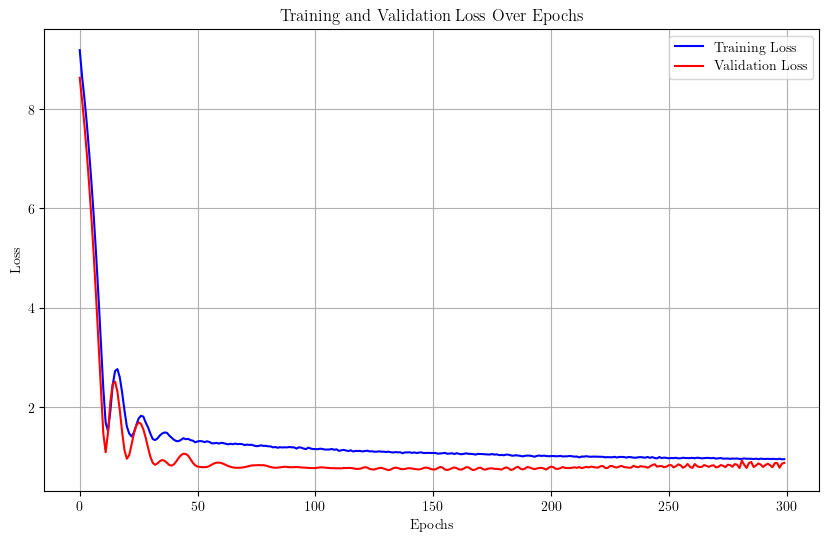

Training run 31/50 for 80% of the data...
Sample size for 80%: 11950


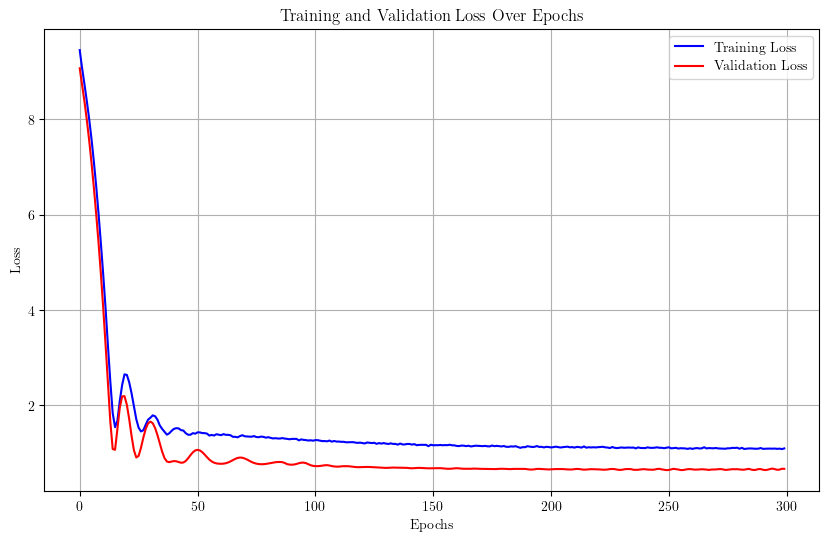

Training run 32/50 for 80% of the data...
Sample size for 80%: 11950


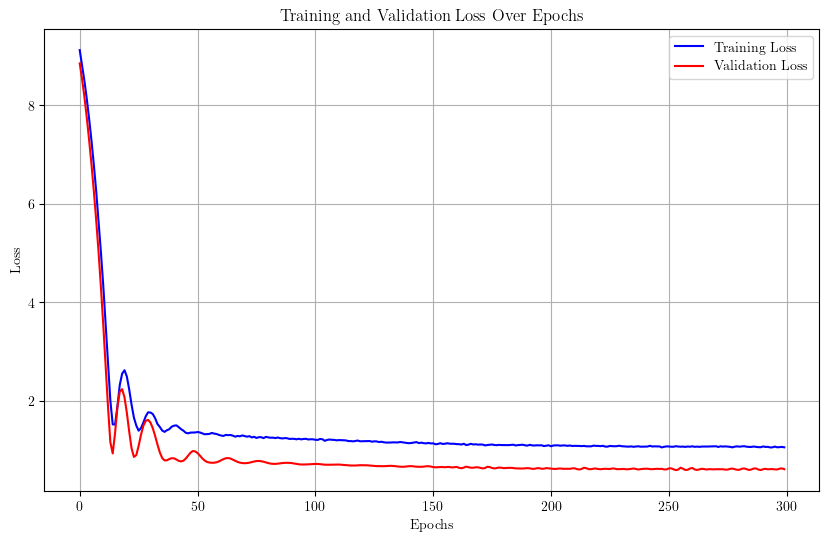

Training run 33/50 for 80% of the data...
Sample size for 80%: 11950


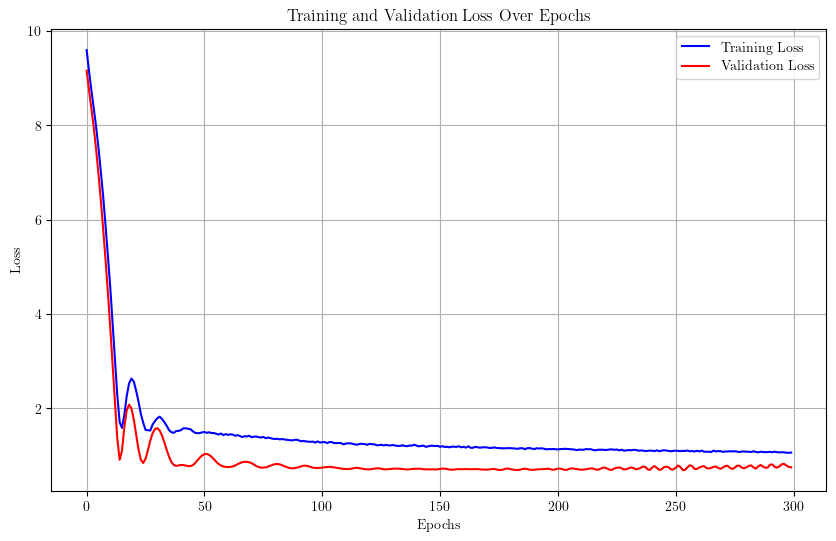

Training run 34/50 for 80% of the data...
Sample size for 80%: 11950


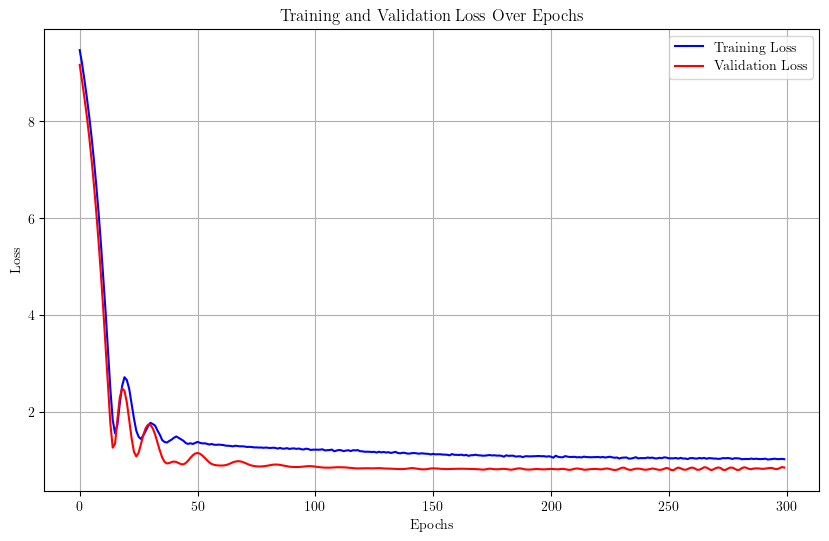

Training run 35/50 for 80% of the data...
Sample size for 80%: 11950


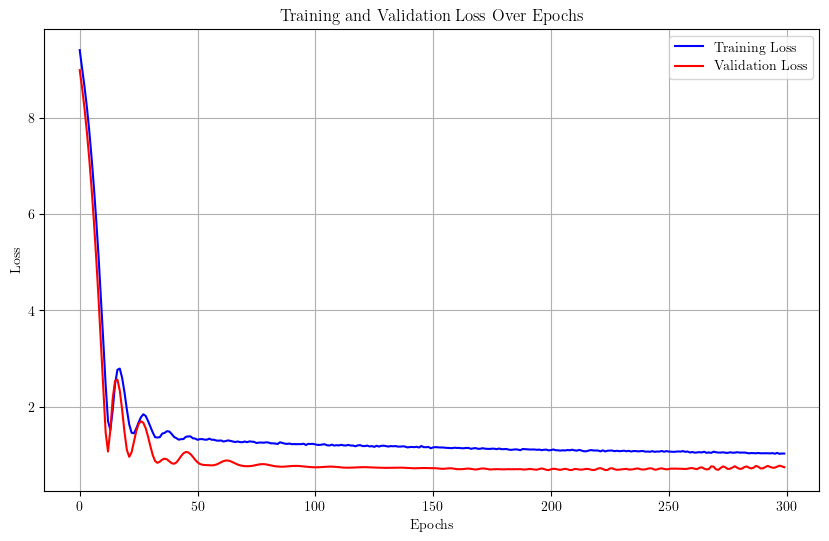

Training run 36/50 for 80% of the data...
Sample size for 80%: 11950


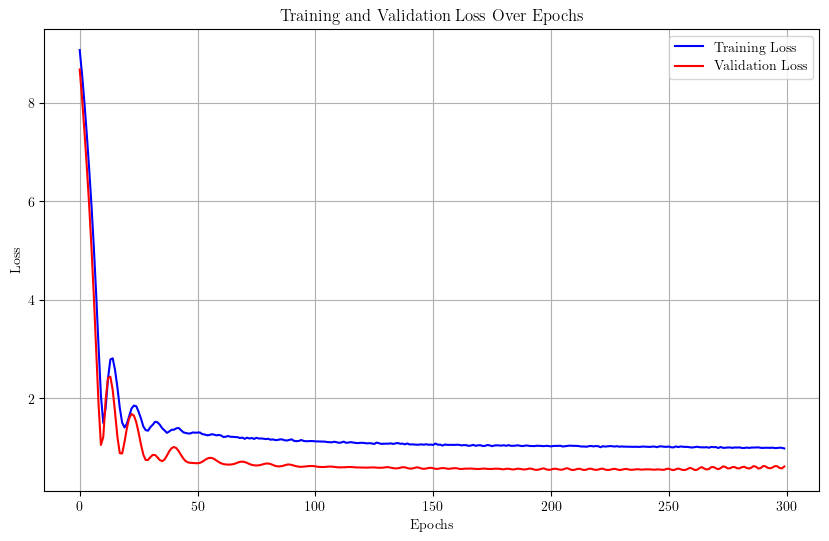

Training run 37/50 for 80% of the data...
Sample size for 80%: 11950


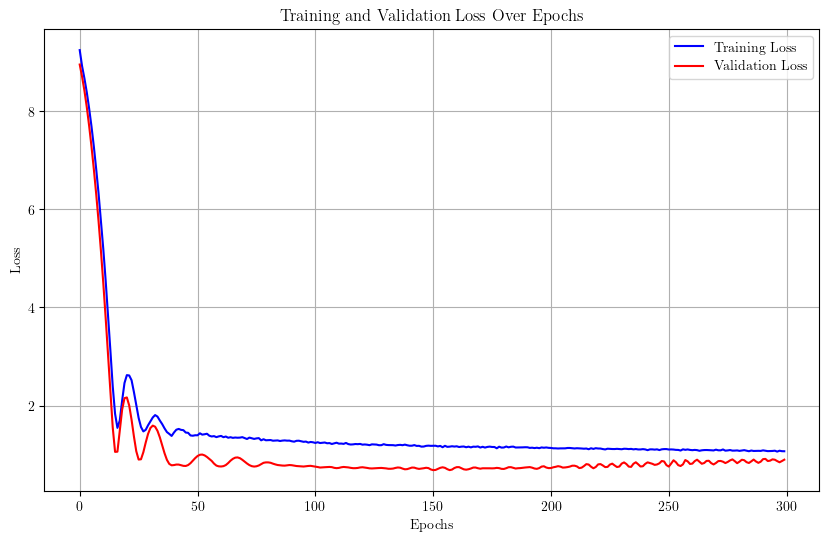

Training run 38/50 for 80% of the data...
Sample size for 80%: 11950


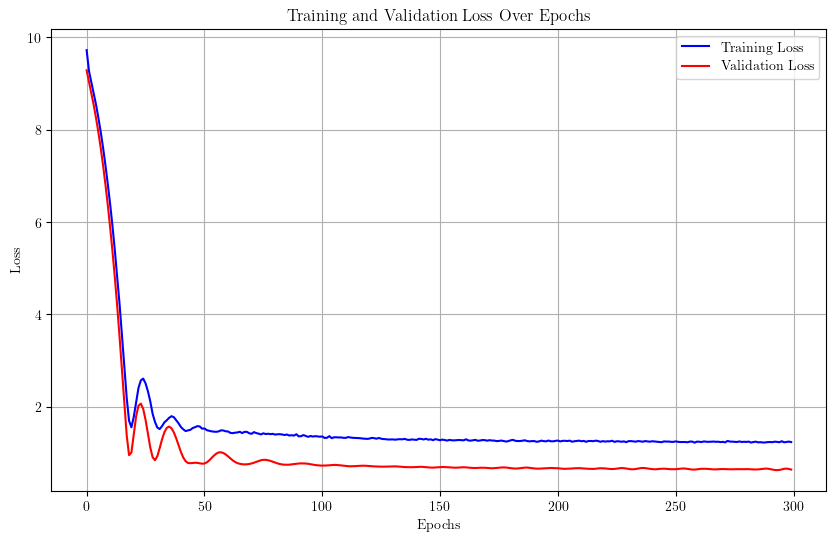

Training run 39/50 for 80% of the data...
Sample size for 80%: 11950


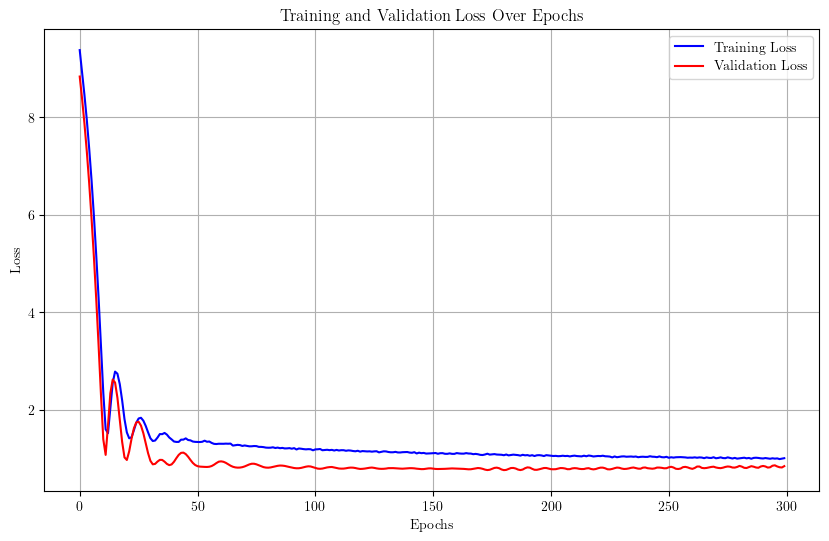

Training run 40/50 for 80% of the data...
Sample size for 80%: 11950


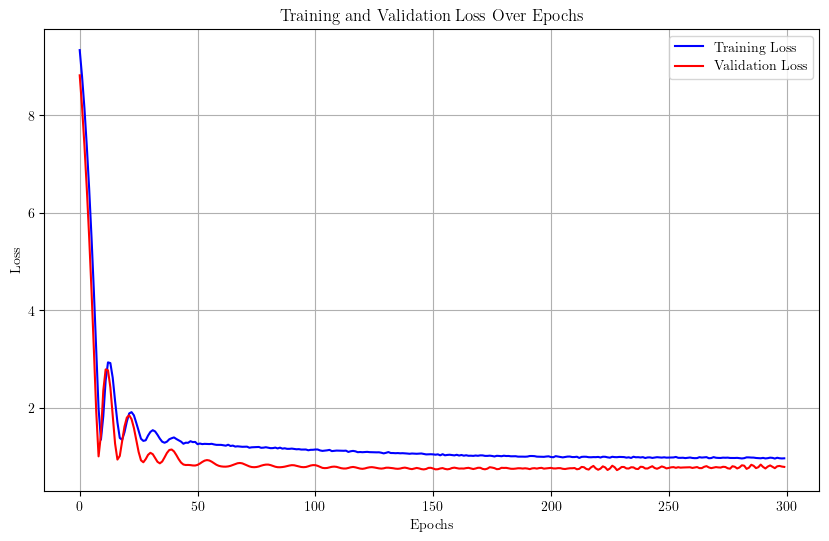

Training run 41/50 for 80% of the data...
Sample size for 80%: 11950


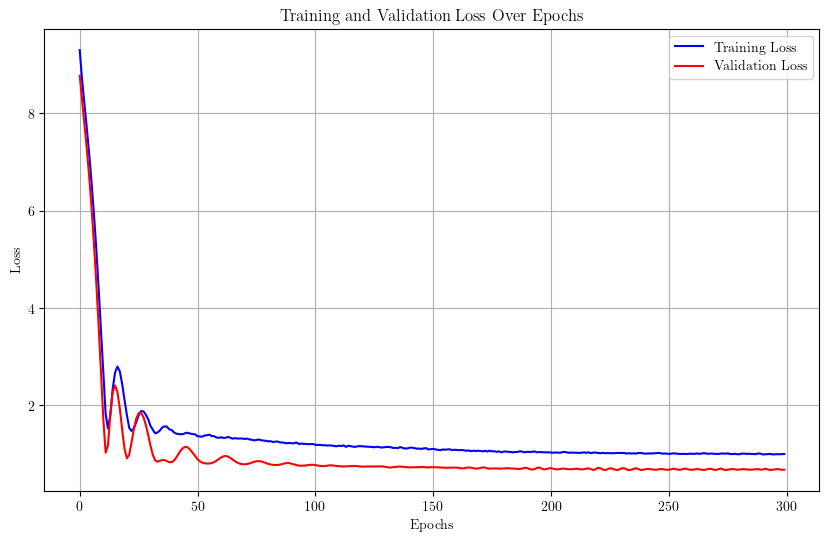

Training run 42/50 for 80% of the data...
Sample size for 80%: 11950


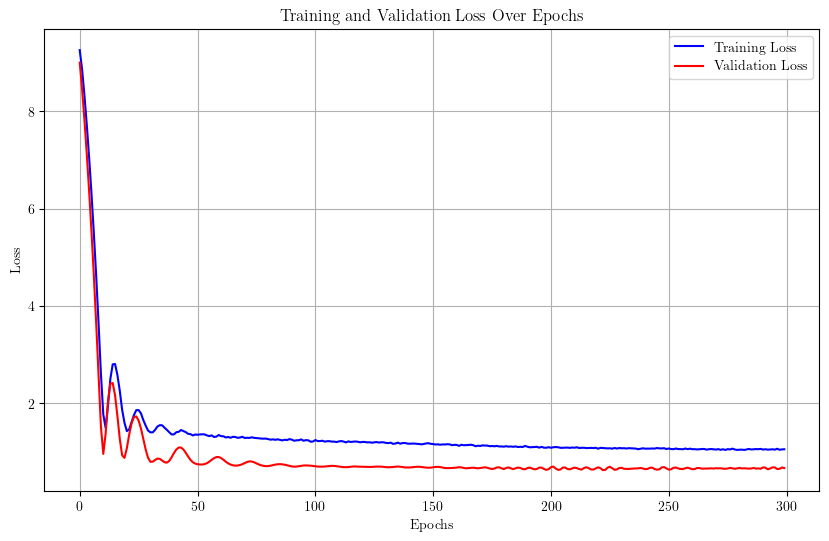

Training run 43/50 for 80% of the data...
Sample size for 80%: 11950


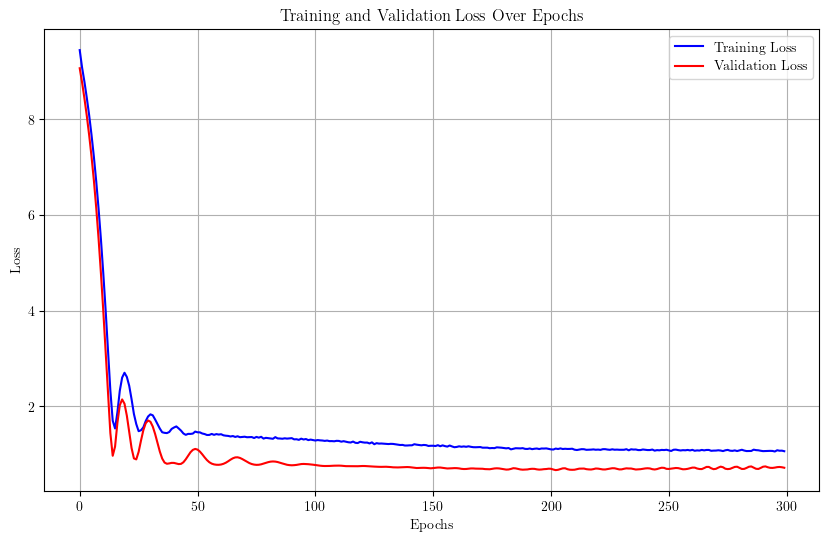

Training run 44/50 for 80% of the data...
Sample size for 80%: 11950


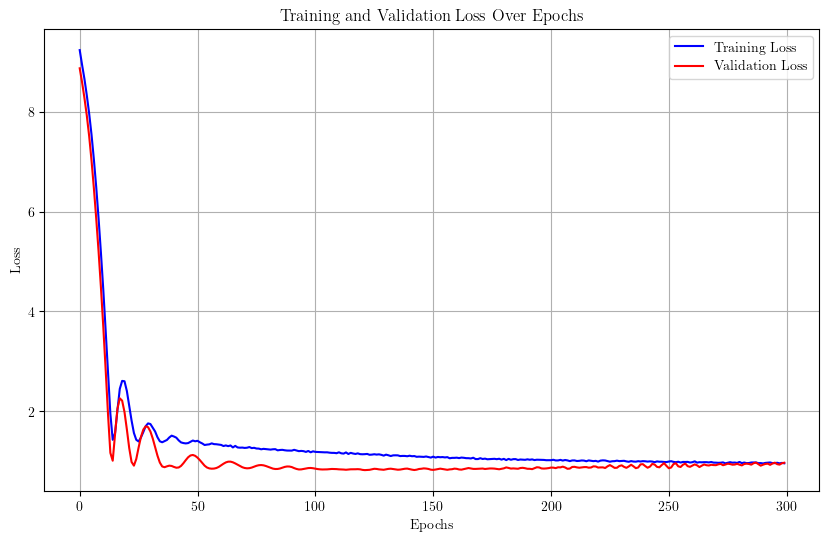

Training run 45/50 for 80% of the data...
Sample size for 80%: 11950


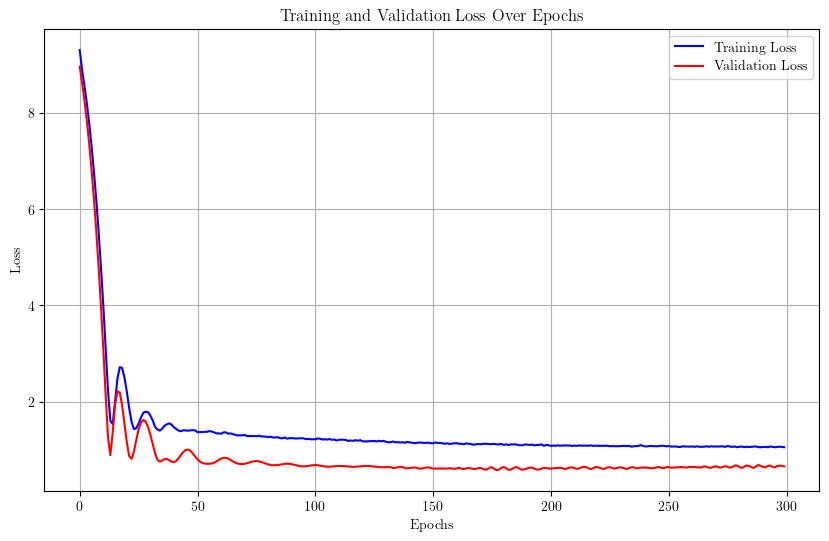

Training run 46/50 for 80% of the data...
Sample size for 80%: 11950


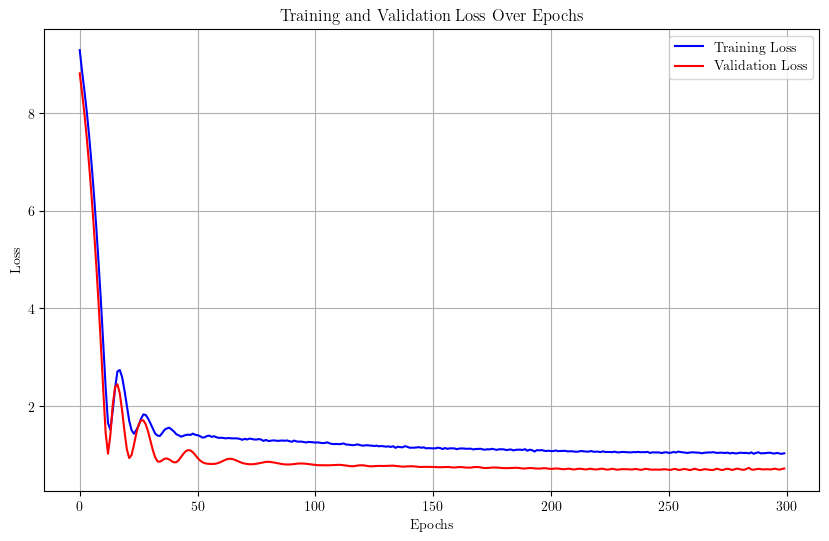

Training run 47/50 for 80% of the data...
Sample size for 80%: 11950


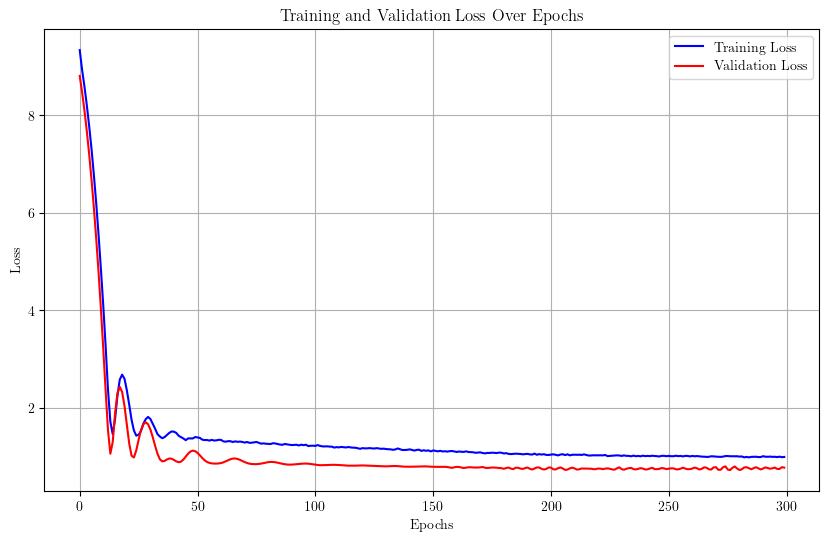

Training run 48/50 for 80% of the data...
Sample size for 80%: 11950


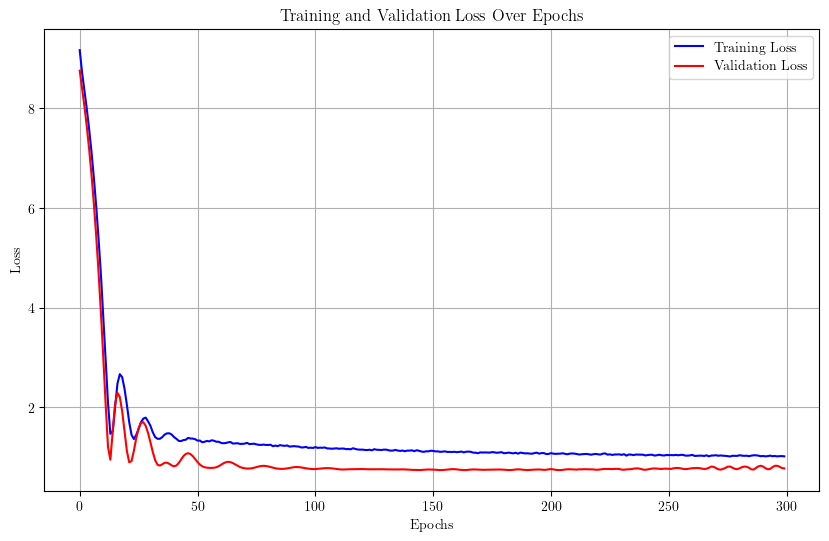

Training run 49/50 for 80% of the data...
Sample size for 80%: 11950


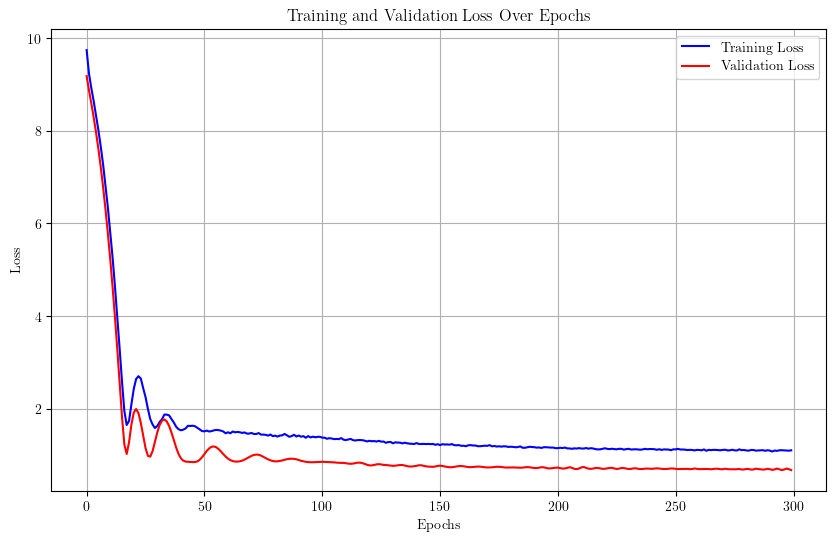

Training run 50/50 for 80% of the data...
Sample size for 80%: 11950


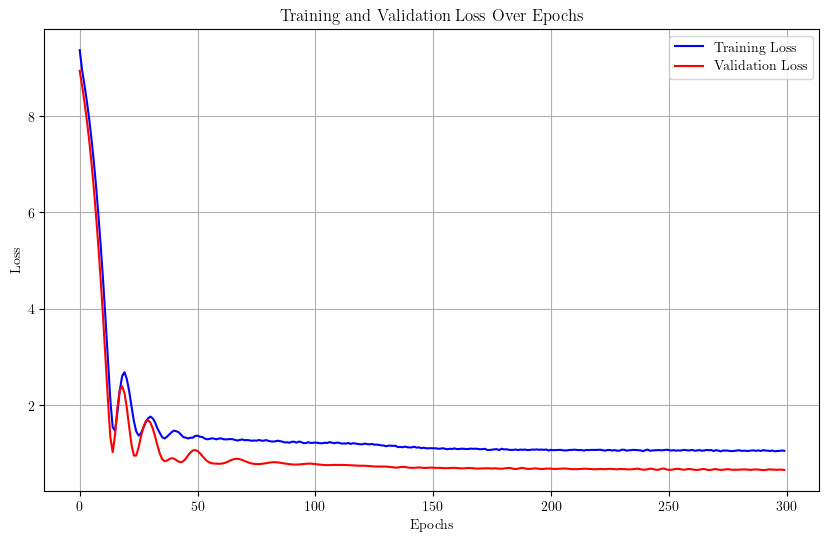

Metrics for 80% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(6.842882), 'mae': np.float32(1.1448013), 'r2': np.float64(0.014594701528549194), 'bias': np.float32(0.51578593), 'nmad': np.float32(0.030391488), 'sigma_68': np.float32(0.033674635), 'outlier_fraction': np.float64(5.901255230125523)}
Metrics Across Runs:
mse: 6.8429 ± 1.7164
mae: 1.1448 ± 0.1366
r2: 0.0146 ± 0.0146
bias: 0.5158 ± 0.0541
nmad: 0.0304 ± 0.0015
sigma_68: 0.0337 ± 0.0018
outlier_fraction: 5.9013 ± 0.5036
Training model for 100% of the data...
Training run 1/50 for 100% of the data...
Sample size for 100%: 14938


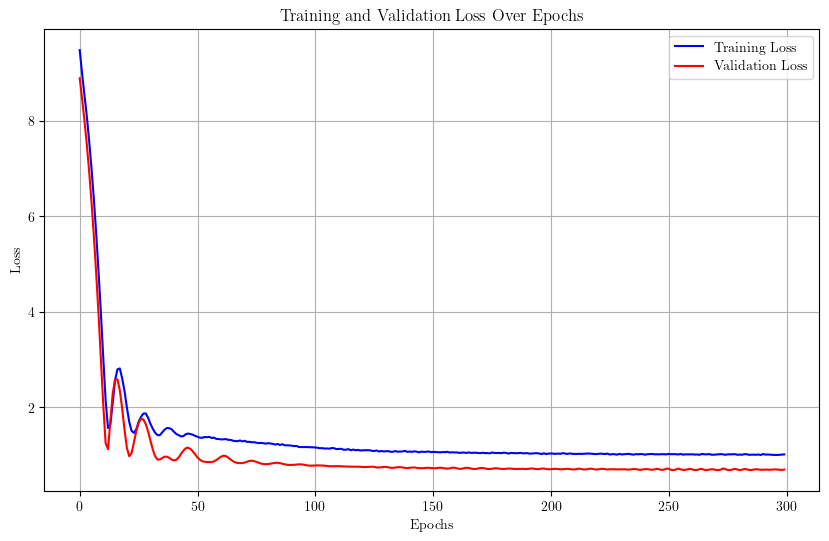

Training run 2/50 for 100% of the data...
Sample size for 100%: 14938


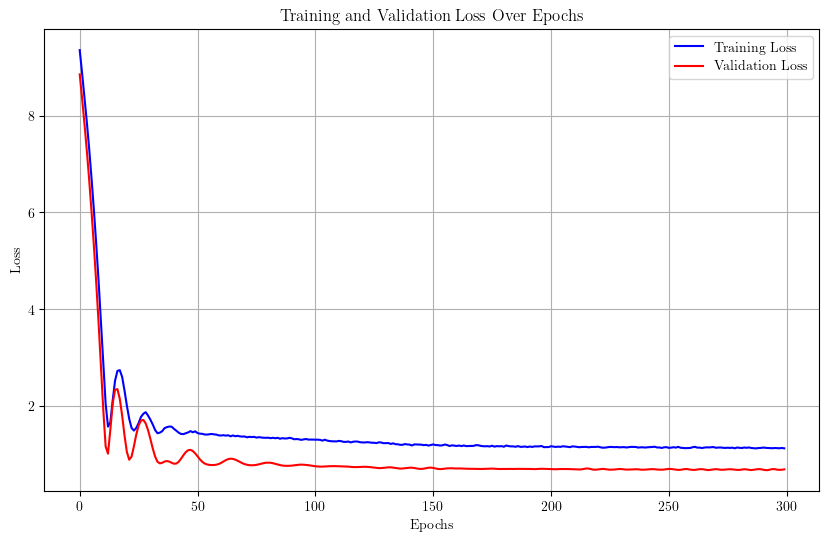

Training run 3/50 for 100% of the data...
Sample size for 100%: 14938


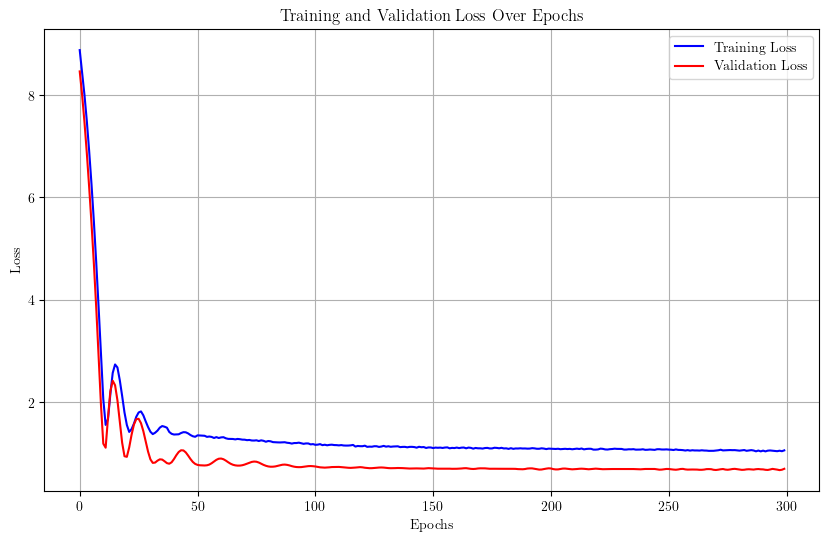

Training run 4/50 for 100% of the data...
Sample size for 100%: 14938


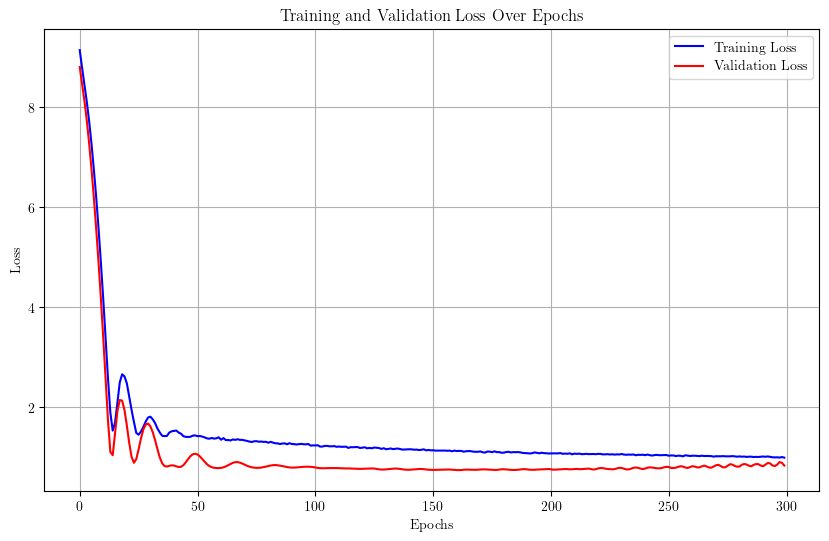

Training run 5/50 for 100% of the data...
Sample size for 100%: 14938


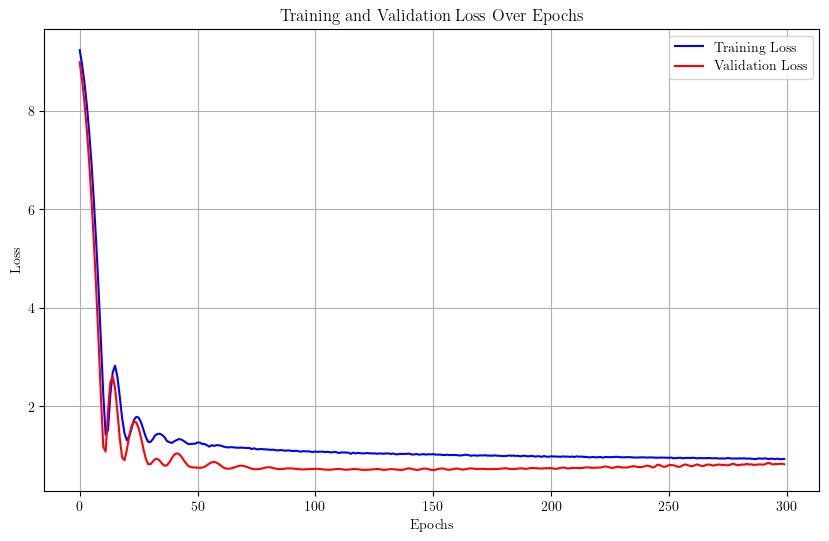

Training run 6/50 for 100% of the data...
Sample size for 100%: 14938


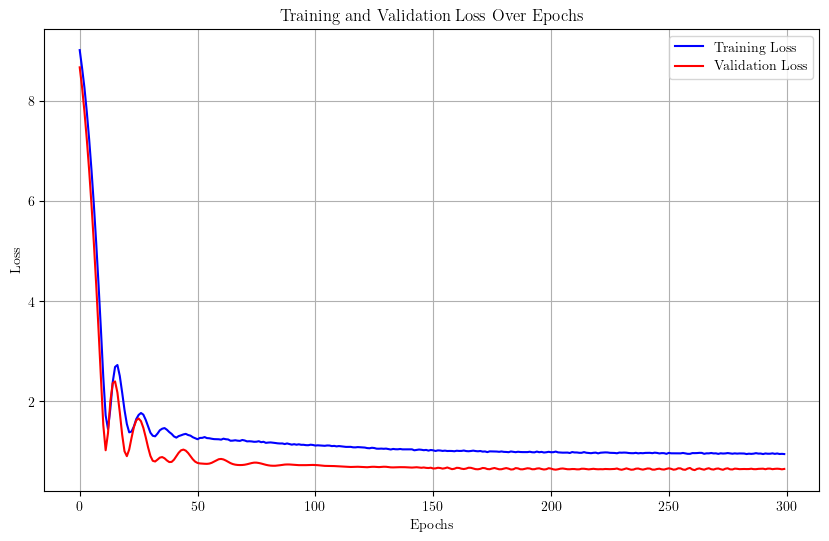

Training run 7/50 for 100% of the data...
Sample size for 100%: 14938


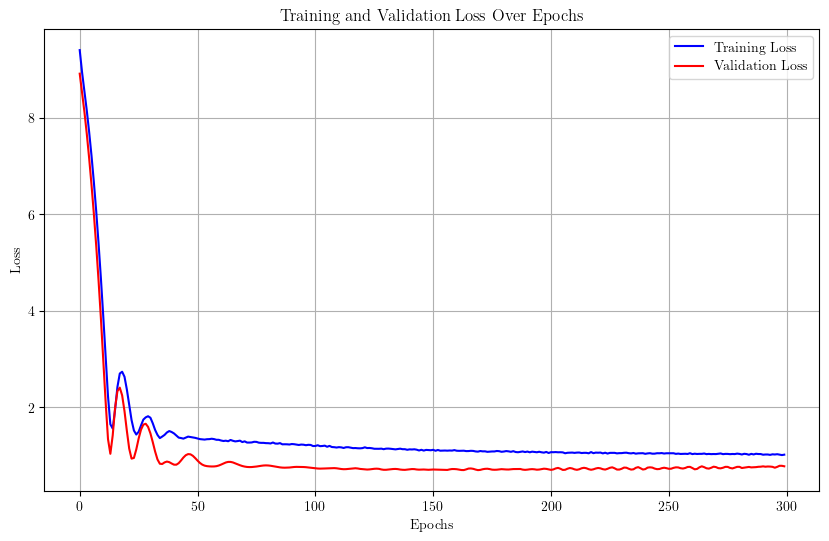

Training run 8/50 for 100% of the data...
Sample size for 100%: 14938


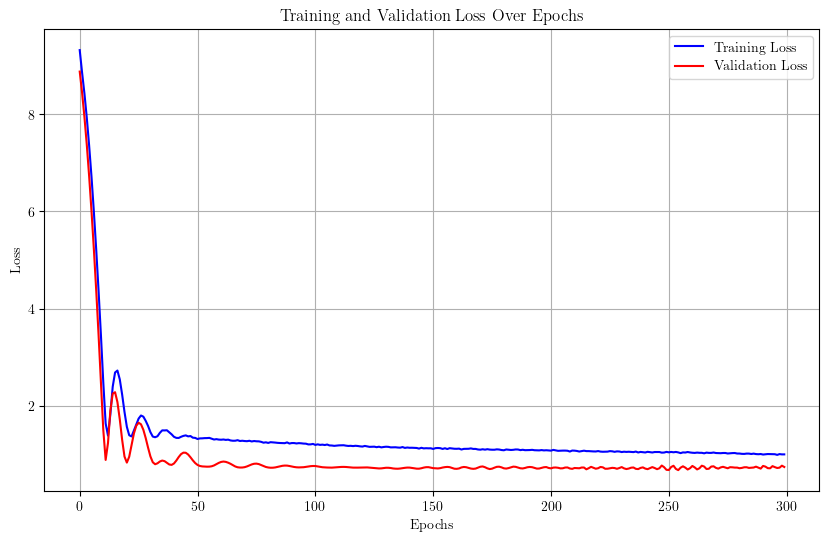

Training run 9/50 for 100% of the data...
Sample size for 100%: 14938


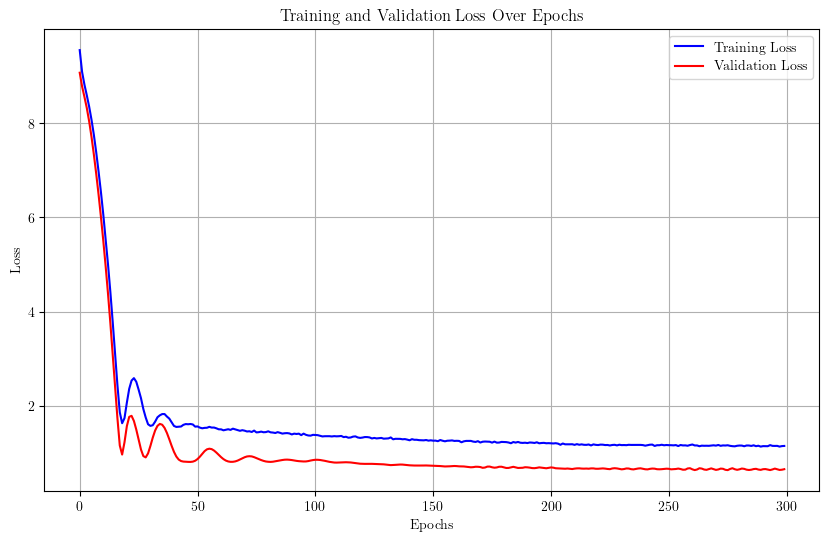

Training run 10/50 for 100% of the data...
Sample size for 100%: 14938


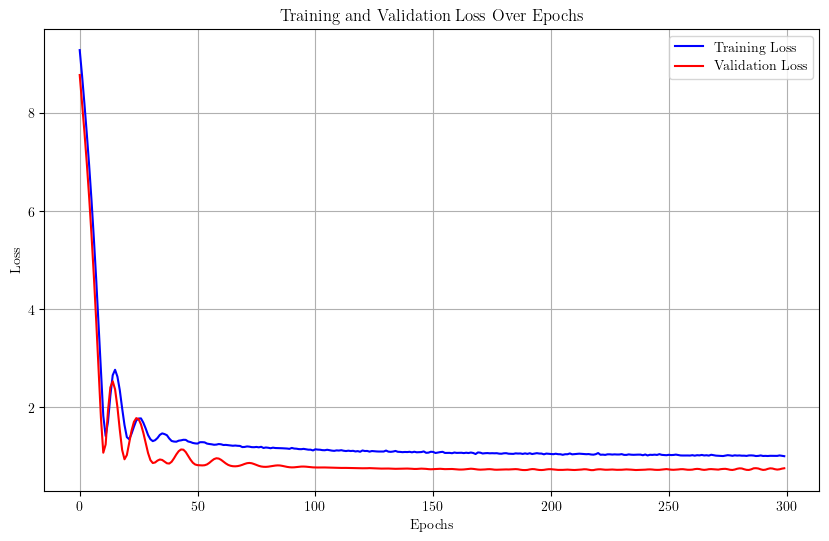

Training run 11/50 for 100% of the data...
Sample size for 100%: 14938


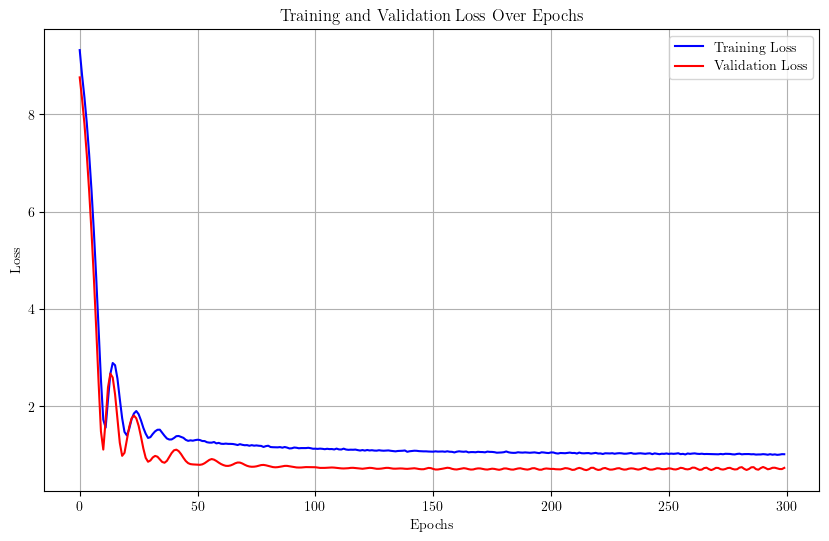

Training run 12/50 for 100% of the data...
Sample size for 100%: 14938


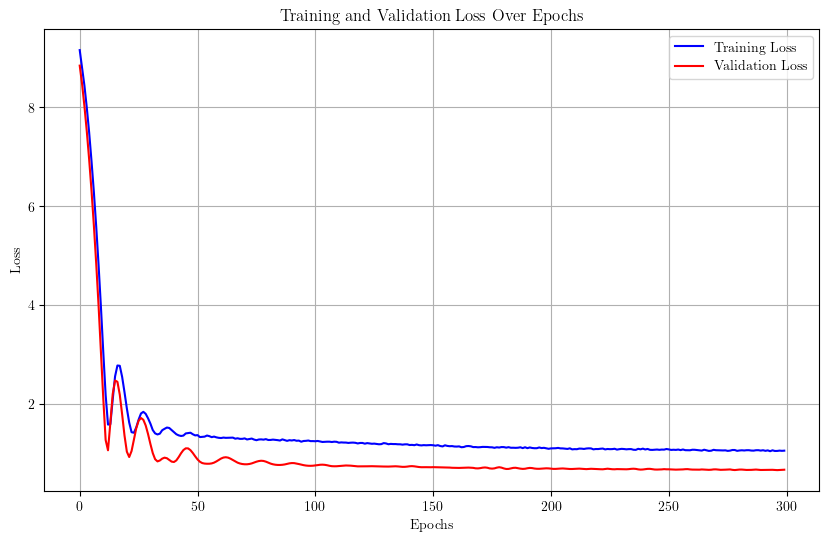

Training run 13/50 for 100% of the data...
Sample size for 100%: 14938


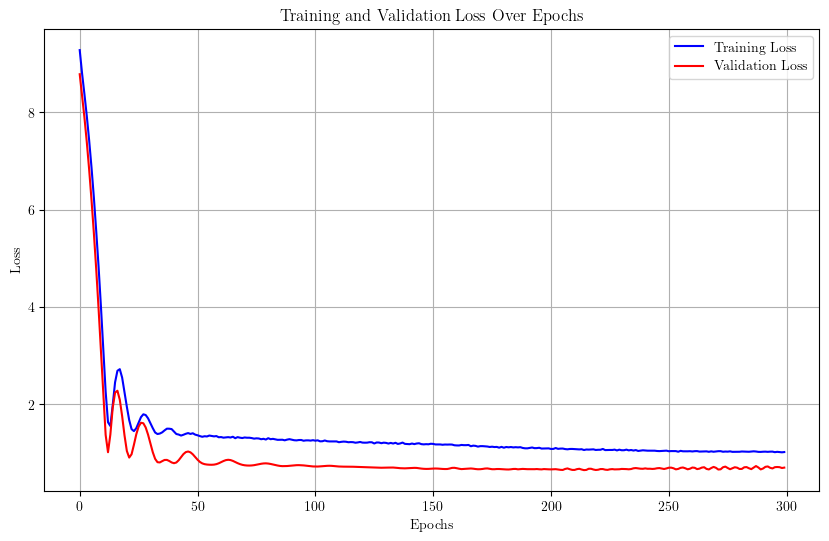

Training run 14/50 for 100% of the data...
Sample size for 100%: 14938


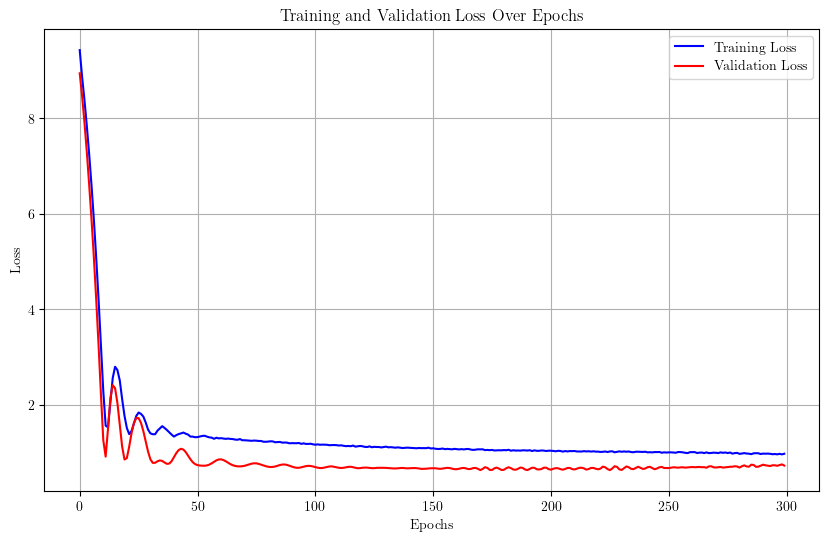

Training run 15/50 for 100% of the data...
Sample size for 100%: 14938


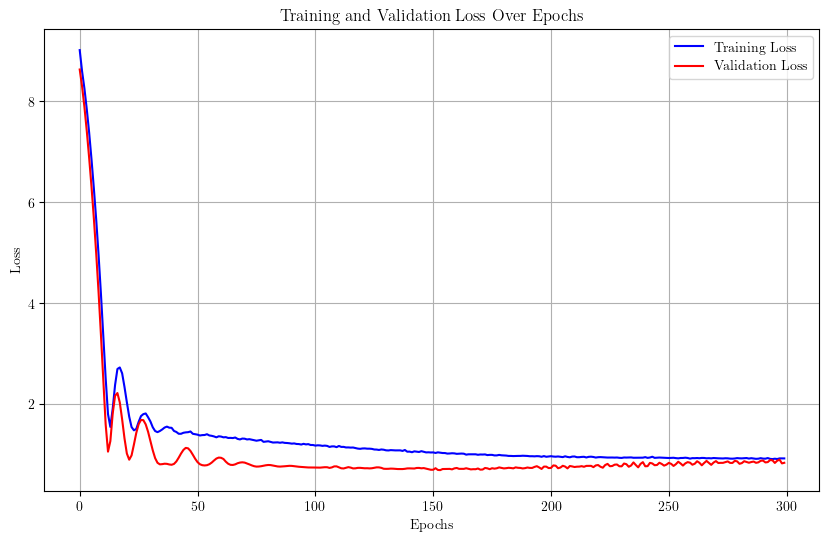

Training run 16/50 for 100% of the data...
Sample size for 100%: 14938


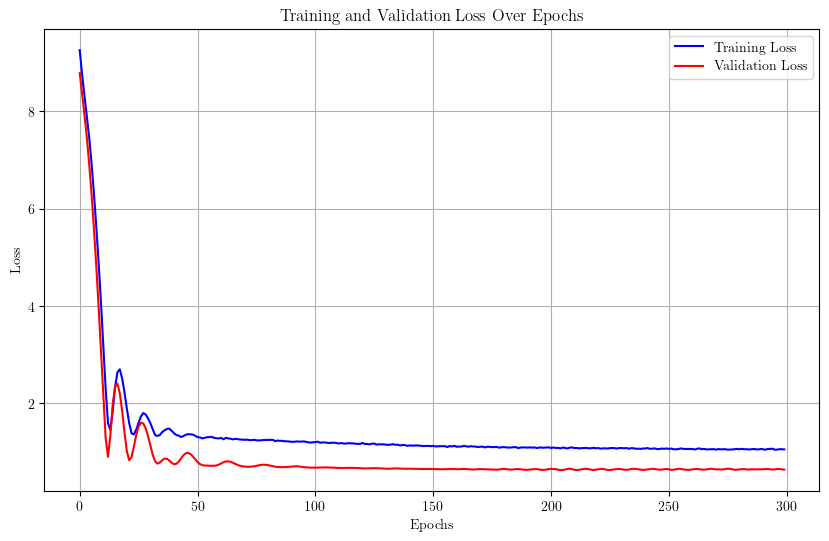

Training run 17/50 for 100% of the data...
Sample size for 100%: 14938


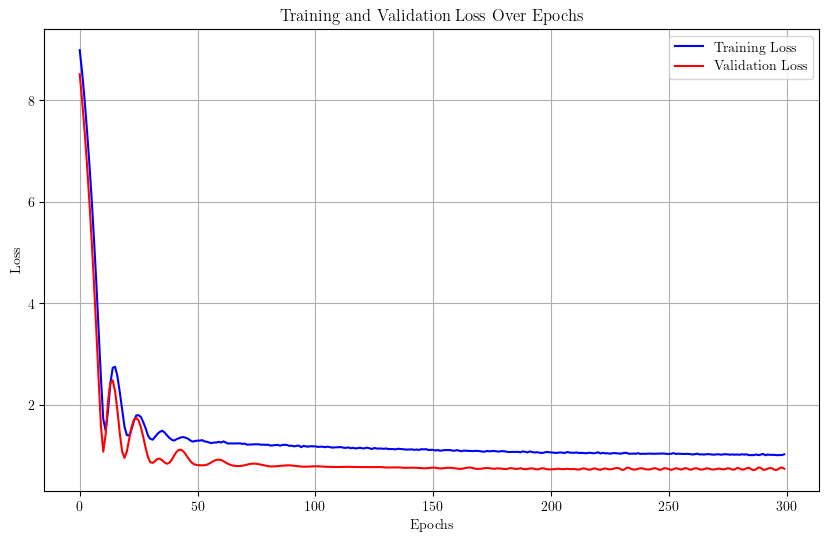

Training run 18/50 for 100% of the data...
Sample size for 100%: 14938


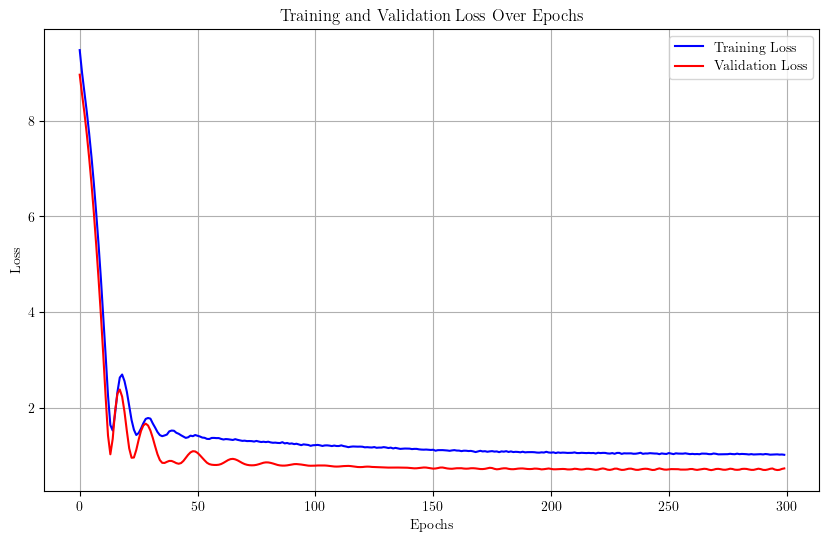

Training run 19/50 for 100% of the data...
Sample size for 100%: 14938


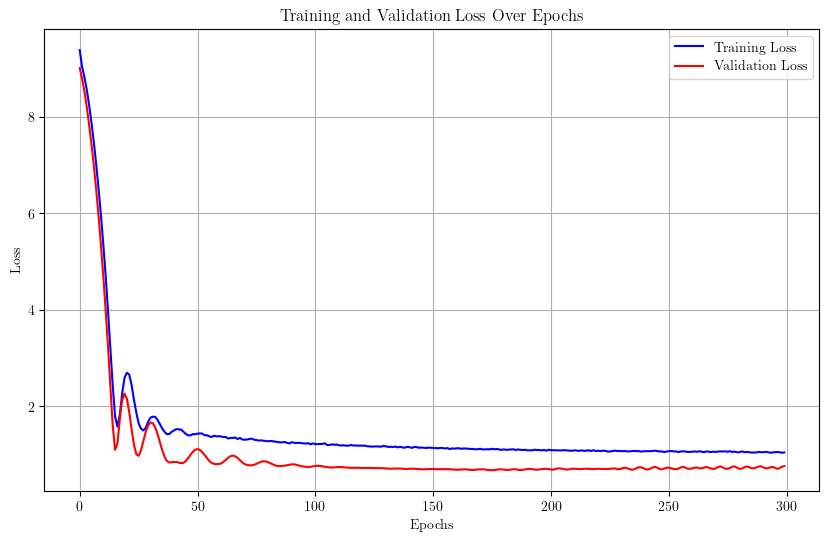

Training run 20/50 for 100% of the data...
Sample size for 100%: 14938


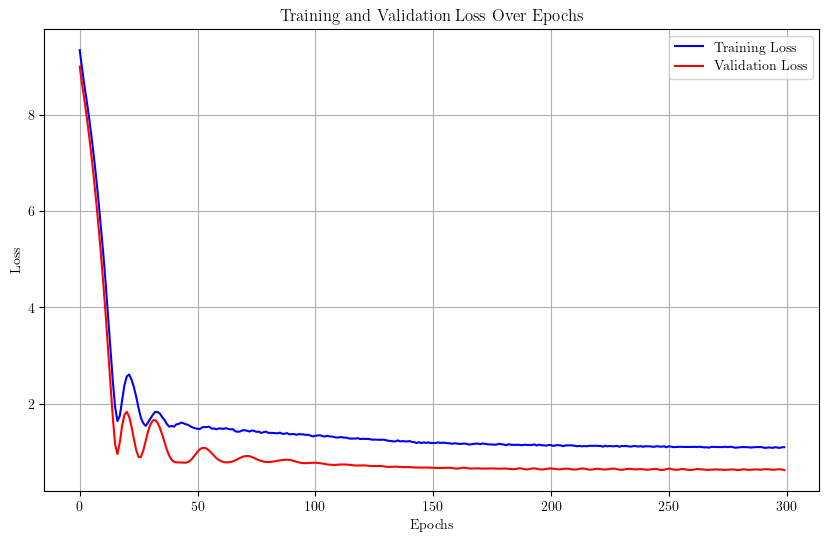

Training run 21/50 for 100% of the data...
Sample size for 100%: 14938


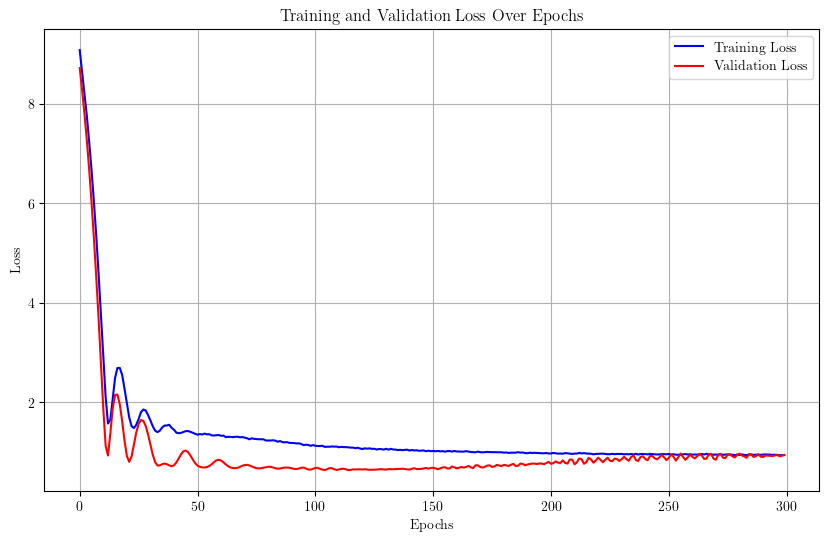

Training run 22/50 for 100% of the data...
Sample size for 100%: 14938


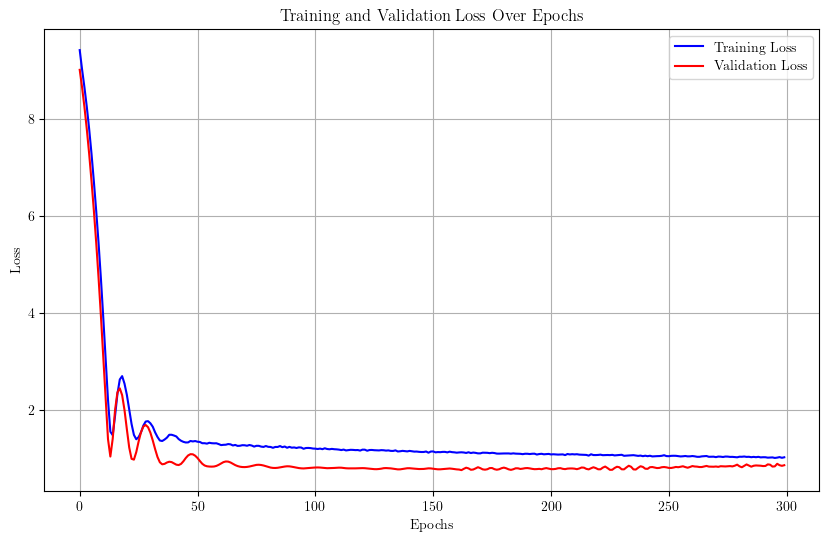

Training run 23/50 for 100% of the data...
Sample size for 100%: 14938


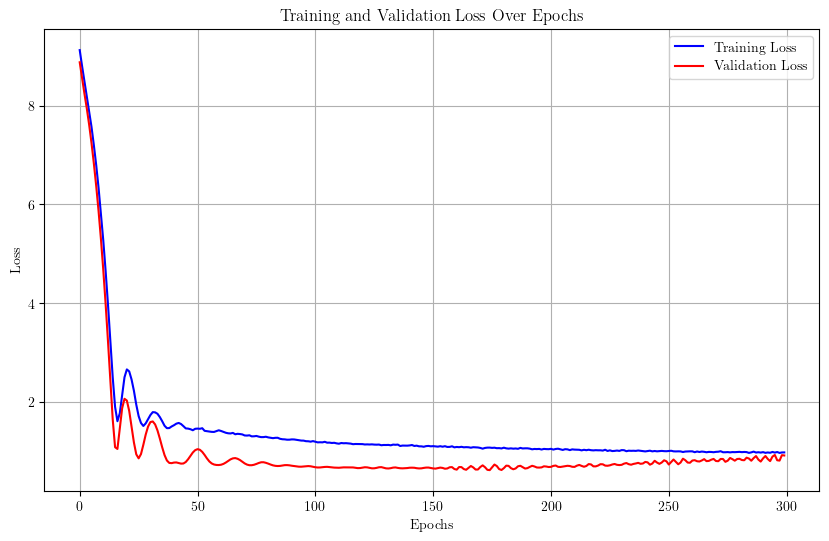

Training run 24/50 for 100% of the data...
Sample size for 100%: 14938


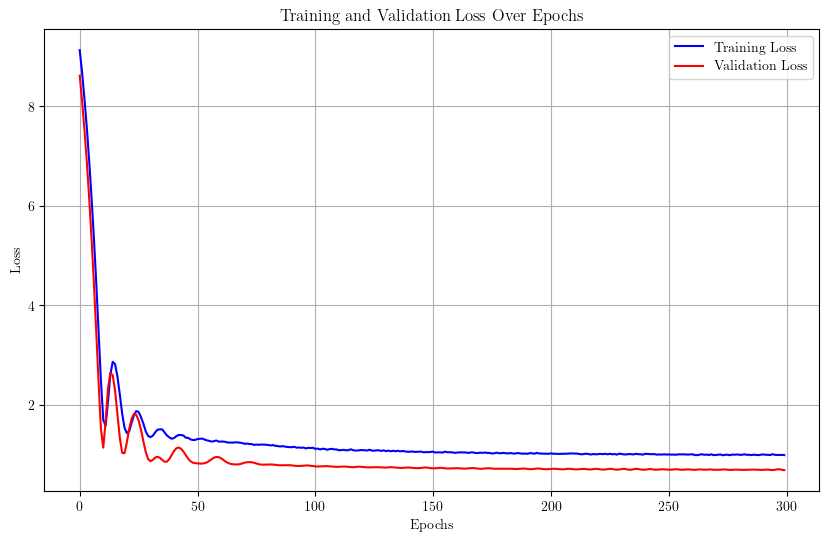

Training run 25/50 for 100% of the data...
Sample size for 100%: 14938


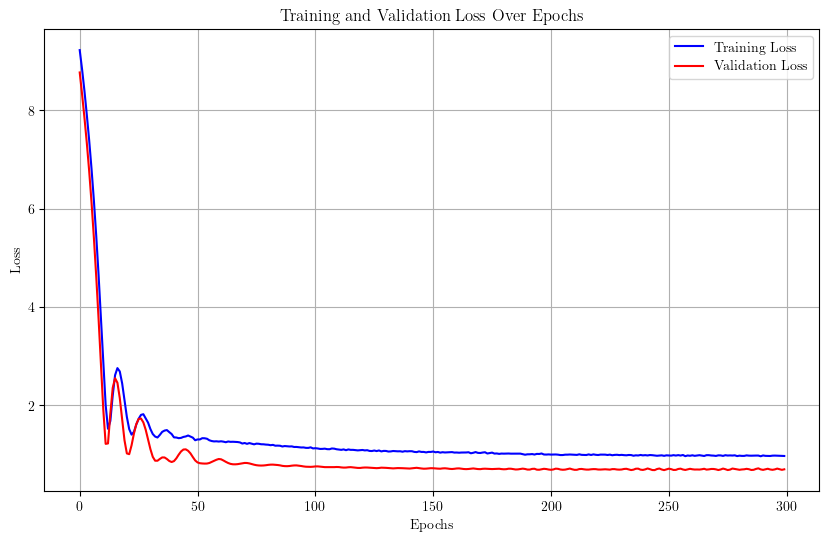

Training run 26/50 for 100% of the data...
Sample size for 100%: 14938


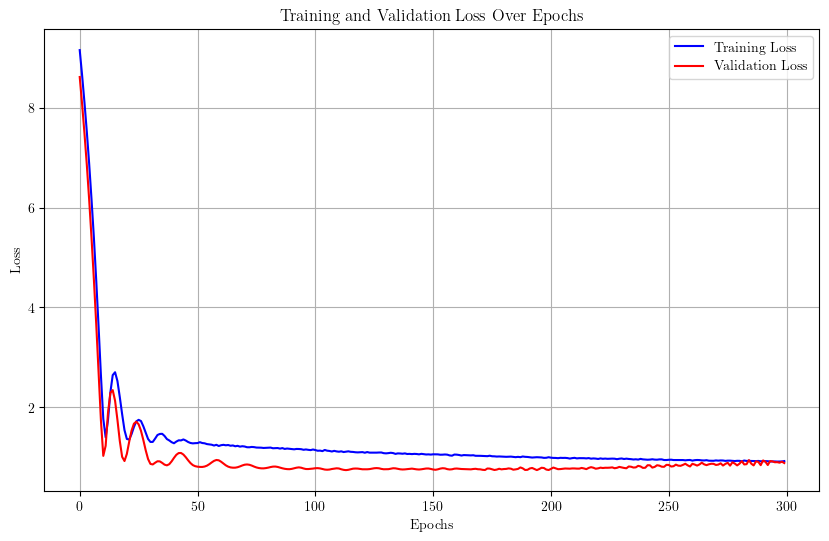

Training run 27/50 for 100% of the data...
Sample size for 100%: 14938


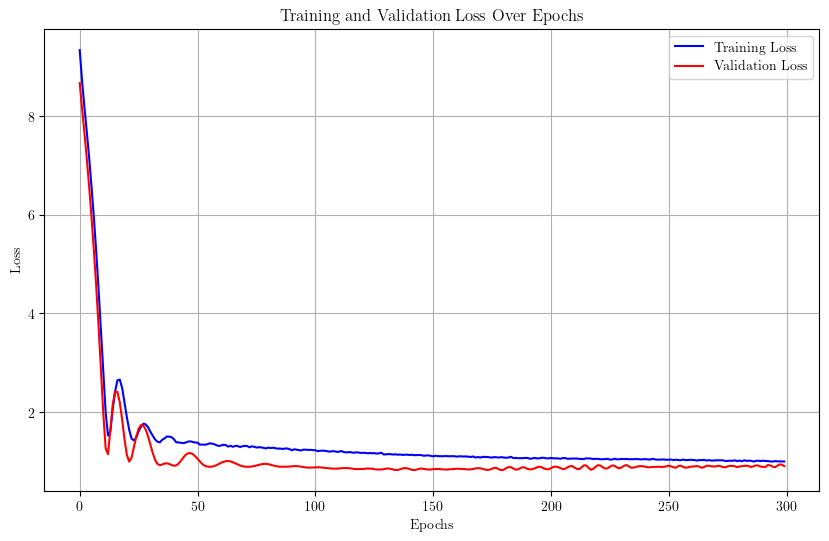

Training run 28/50 for 100% of the data...
Sample size for 100%: 14938


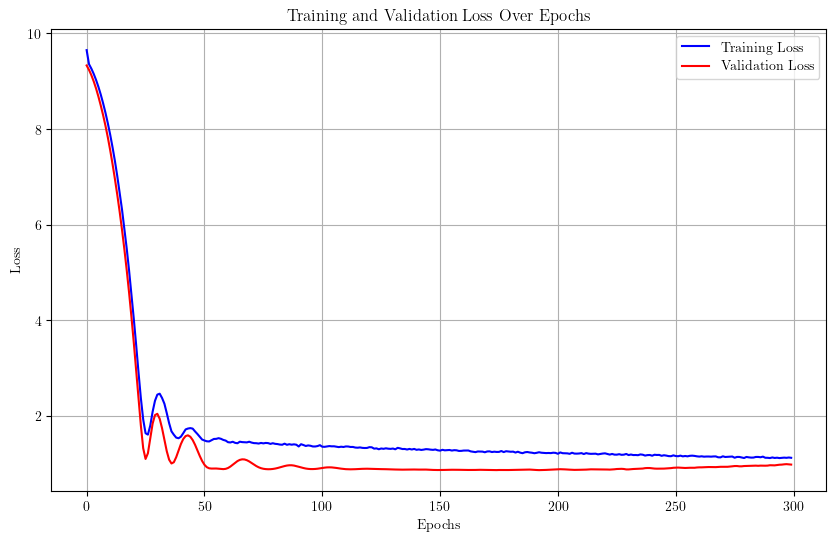

Training run 29/50 for 100% of the data...
Sample size for 100%: 14938


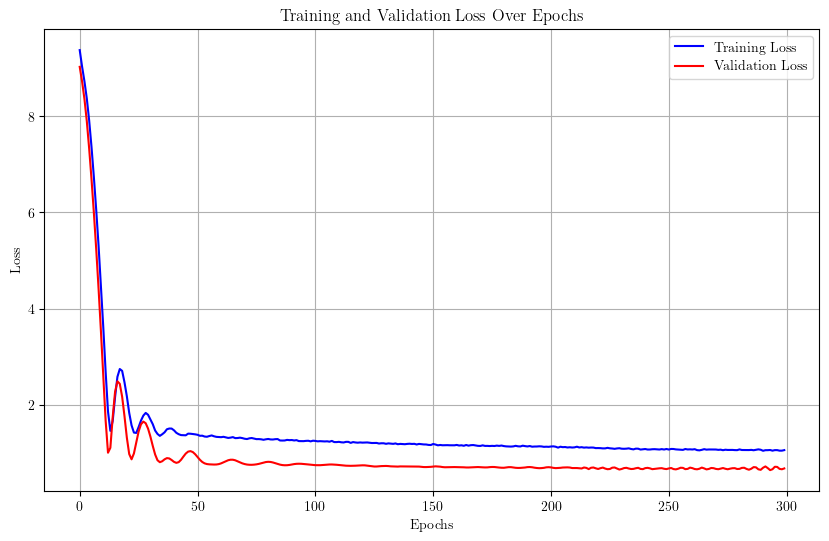

Training run 30/50 for 100% of the data...
Sample size for 100%: 14938


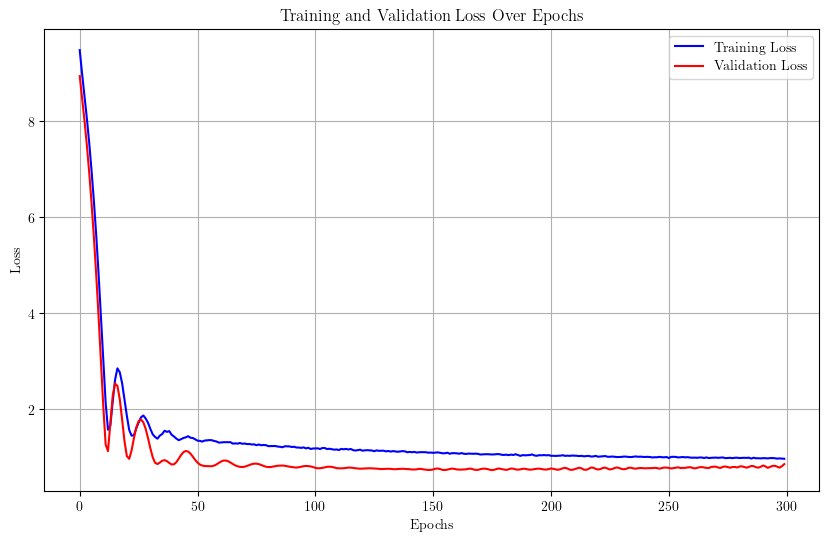

Training run 31/50 for 100% of the data...
Sample size for 100%: 14938


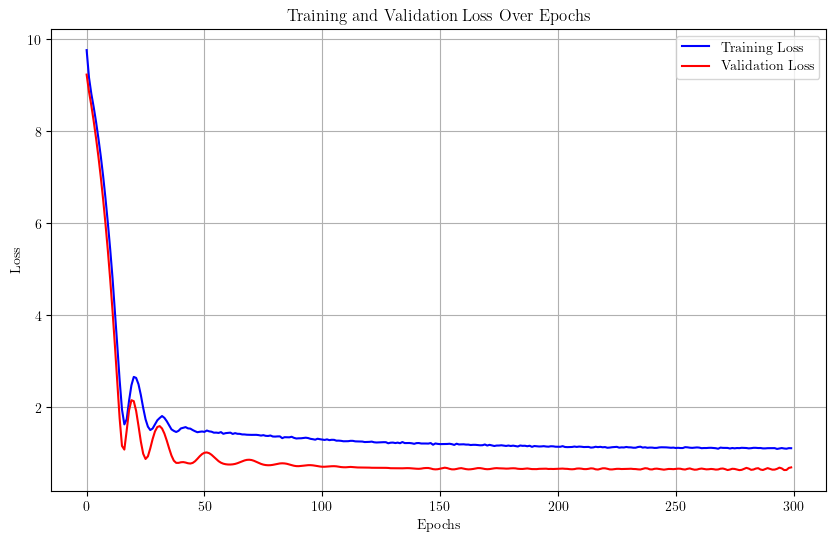

Training run 32/50 for 100% of the data...
Sample size for 100%: 14938


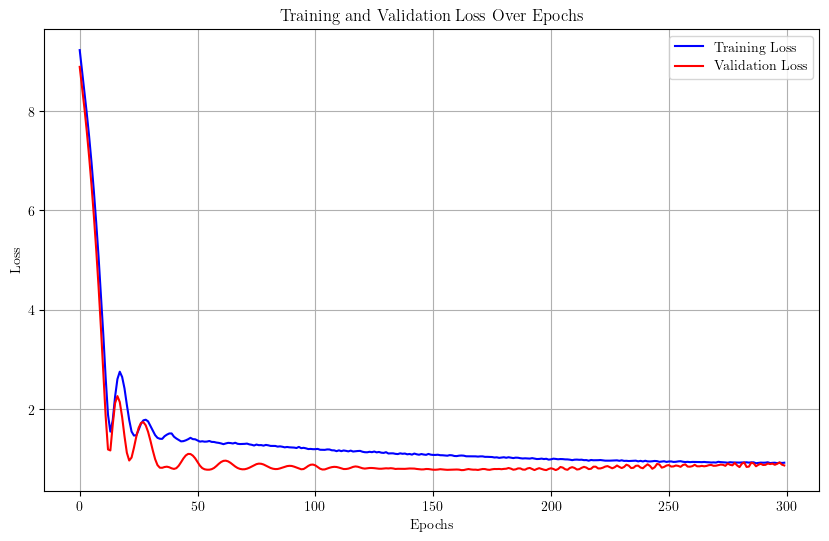

Training run 33/50 for 100% of the data...
Sample size for 100%: 14938


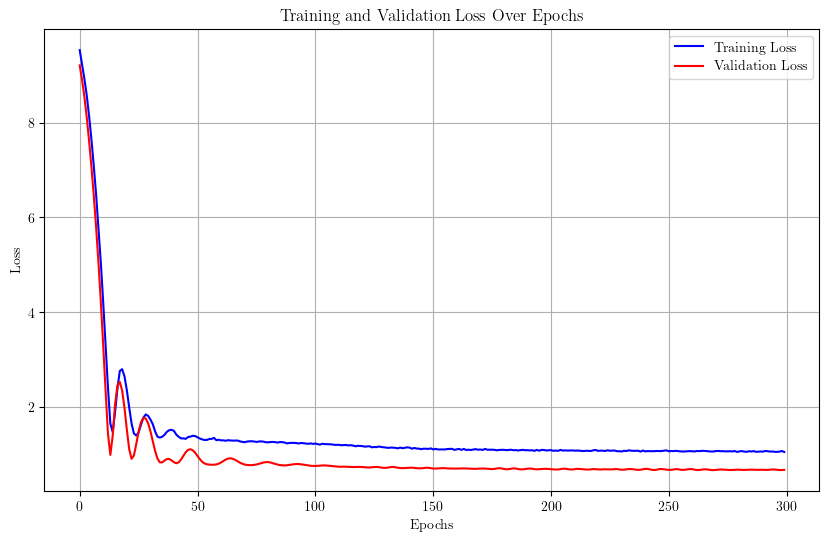

Training run 34/50 for 100% of the data...
Sample size for 100%: 14938


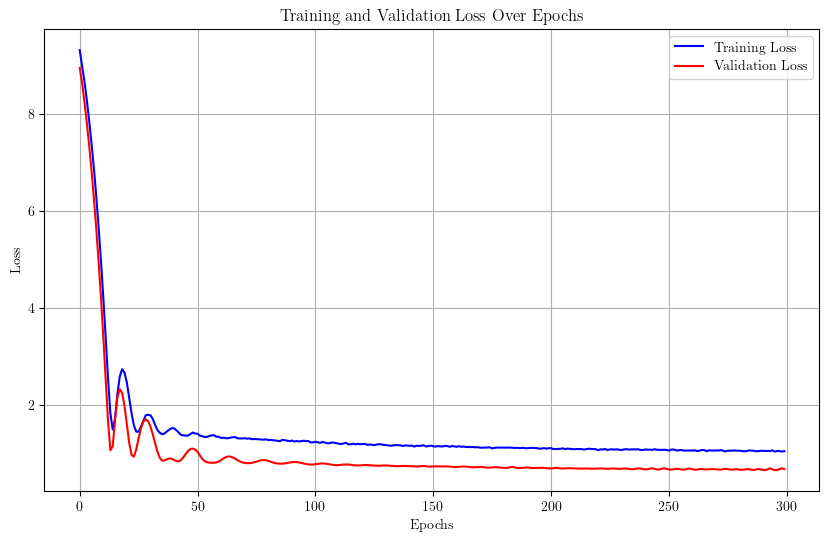

Training run 35/50 for 100% of the data...
Sample size for 100%: 14938


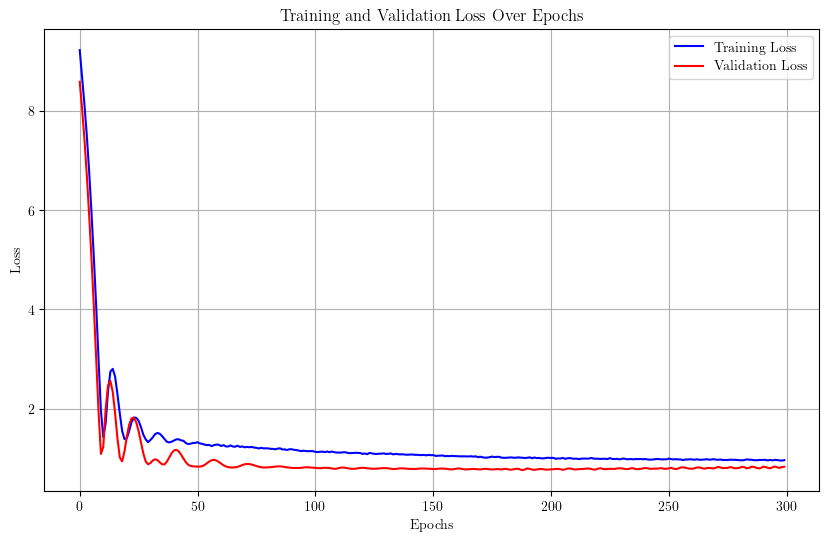

Training run 36/50 for 100% of the data...
Sample size for 100%: 14938


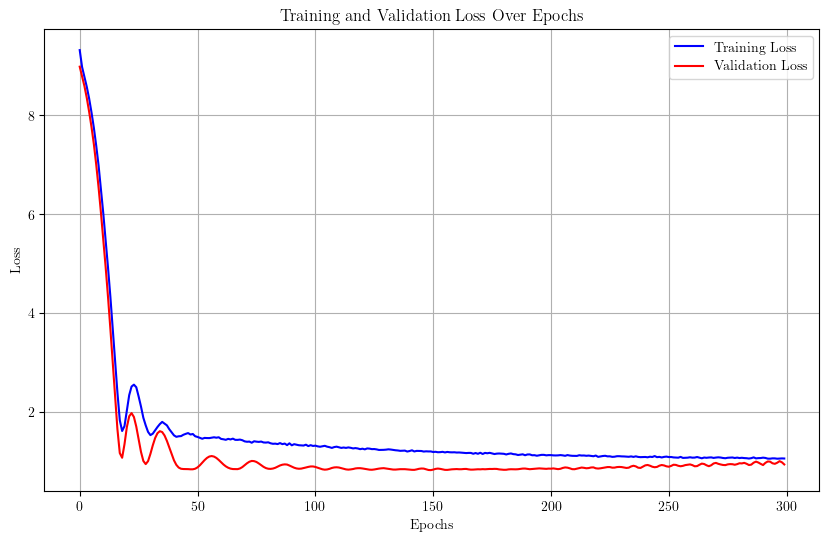

Training run 37/50 for 100% of the data...
Sample size for 100%: 14938


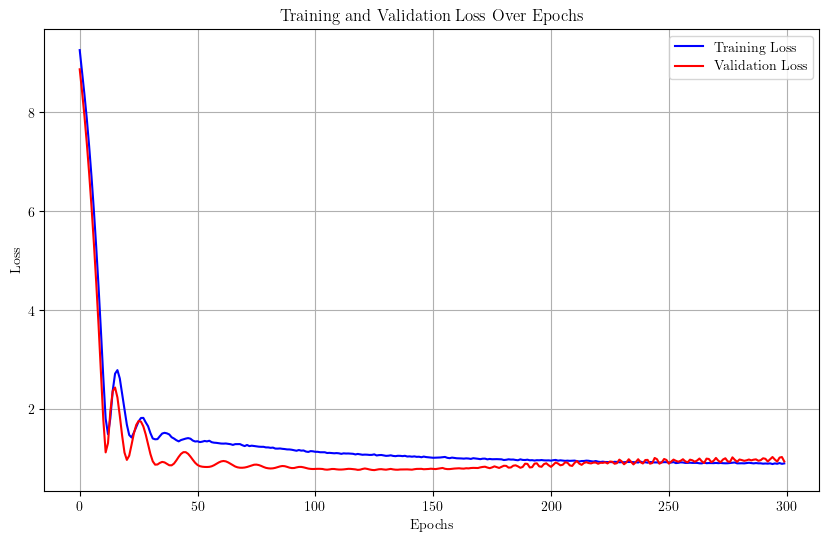

Training run 38/50 for 100% of the data...
Sample size for 100%: 14938


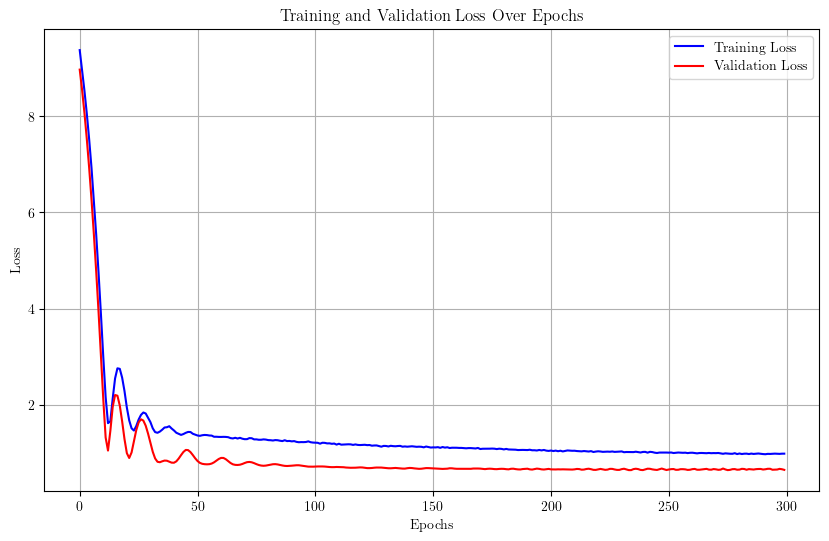

Training run 39/50 for 100% of the data...
Sample size for 100%: 14938


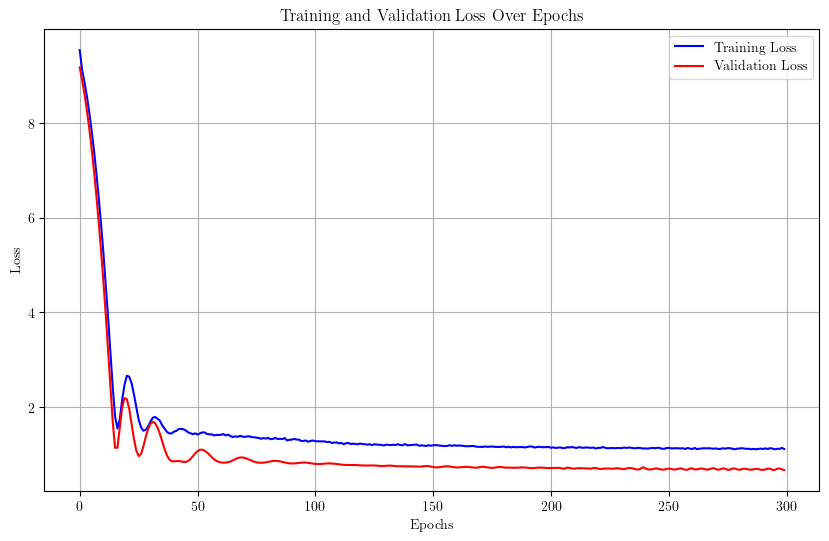

Training run 40/50 for 100% of the data...
Sample size for 100%: 14938


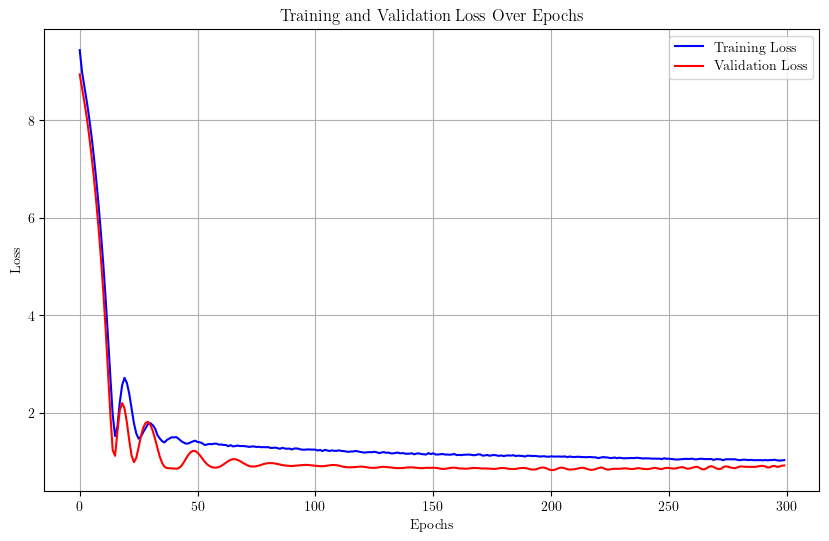

Training run 41/50 for 100% of the data...
Sample size for 100%: 14938


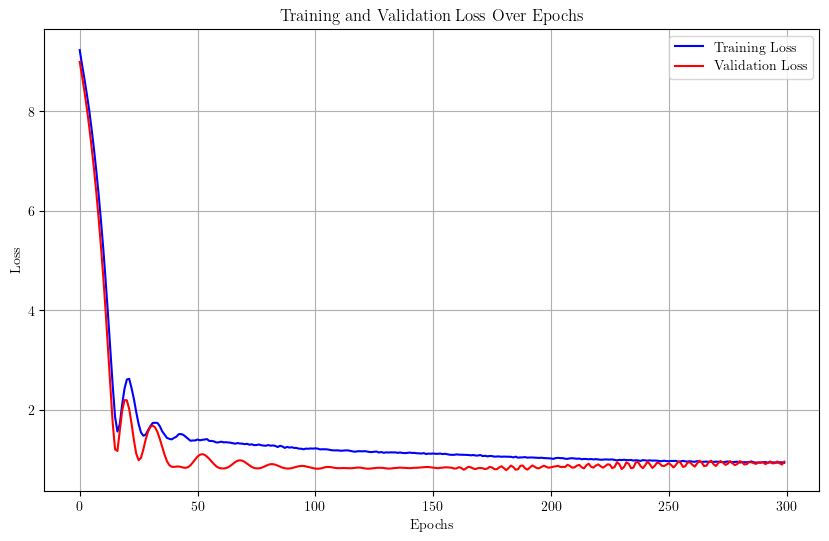

Training run 42/50 for 100% of the data...
Sample size for 100%: 14938


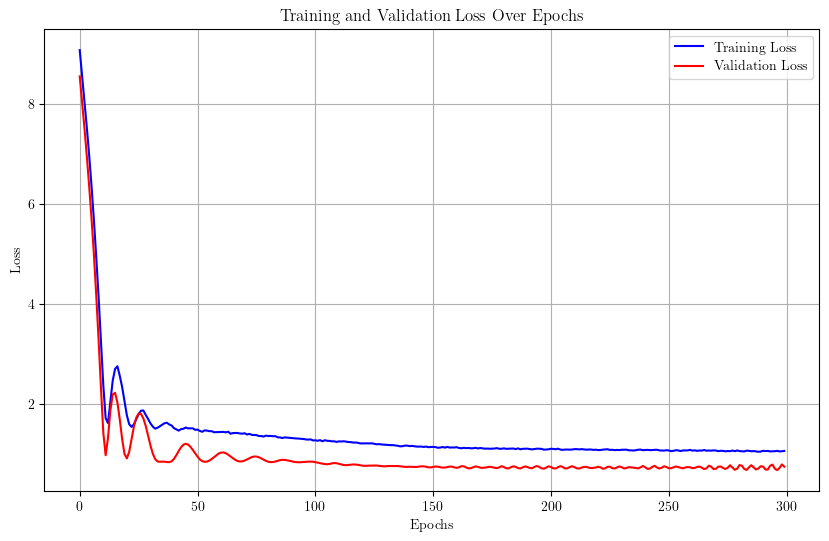

Training run 43/50 for 100% of the data...
Sample size for 100%: 14938


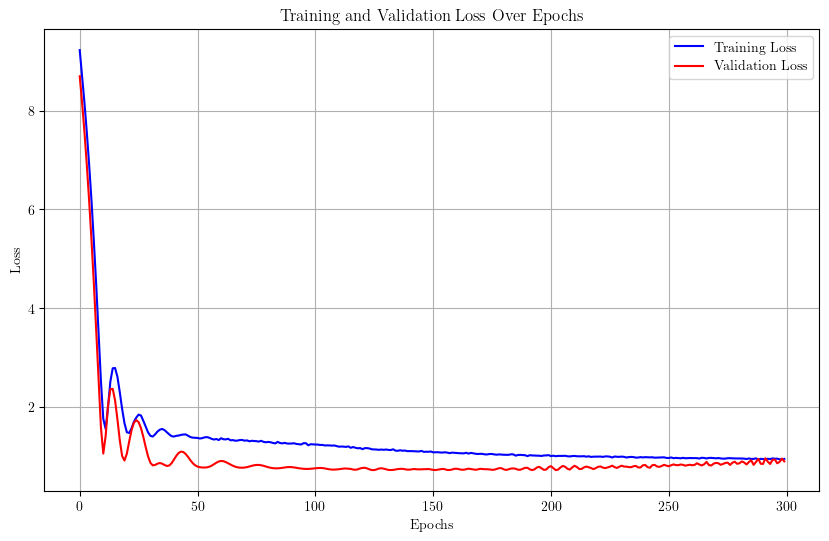

Training run 44/50 for 100% of the data...
Sample size for 100%: 14938


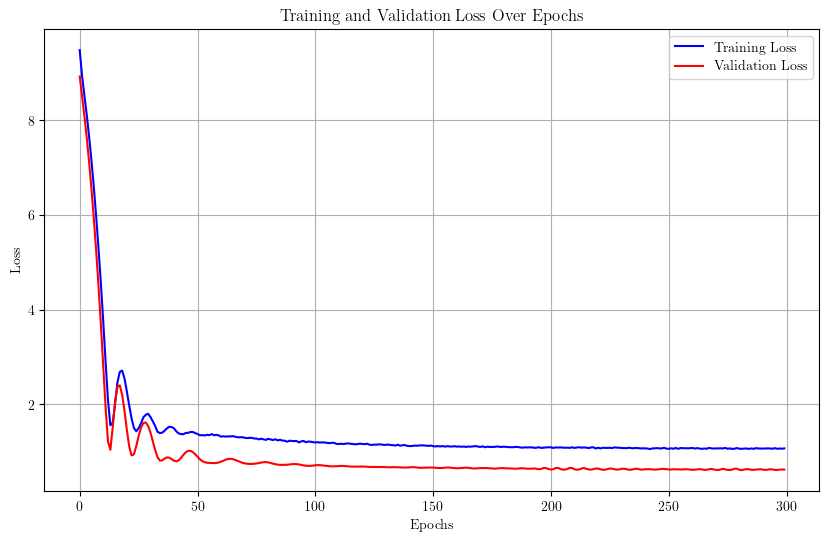

Training run 45/50 for 100% of the data...
Sample size for 100%: 14938


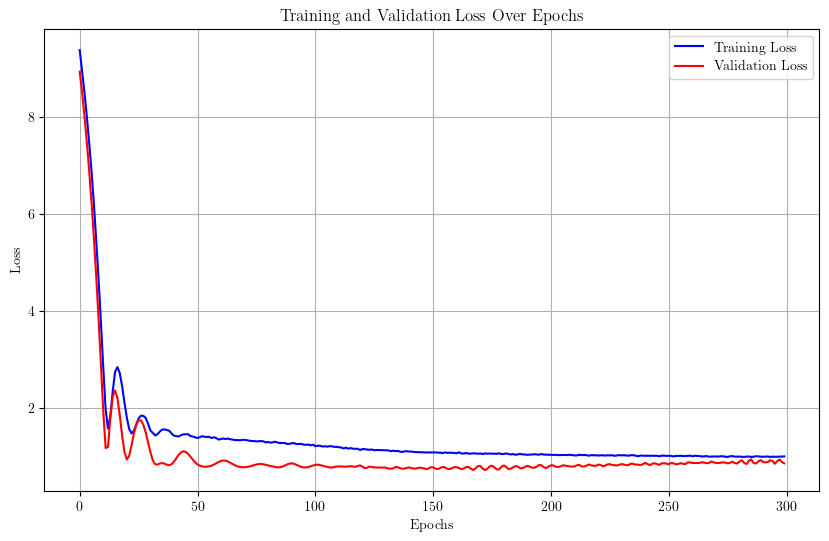

Training run 46/50 for 100% of the data...
Sample size for 100%: 14938


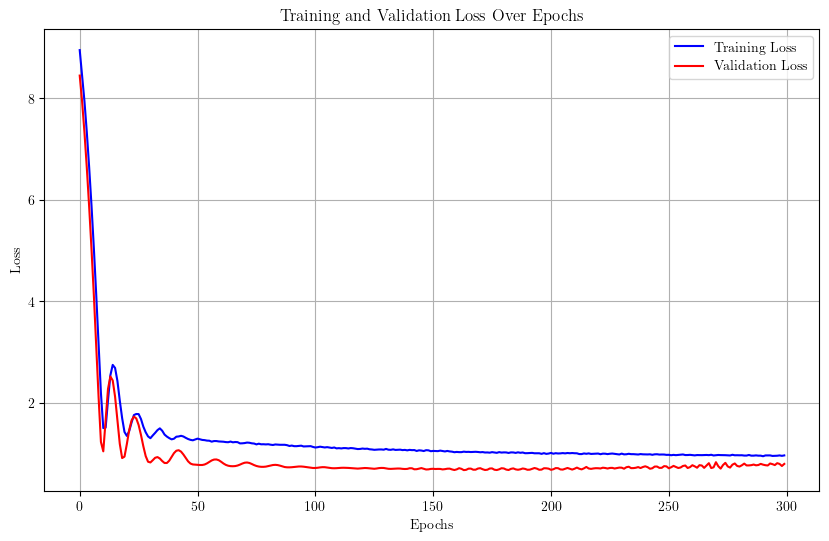

Training run 47/50 for 100% of the data...
Sample size for 100%: 14938


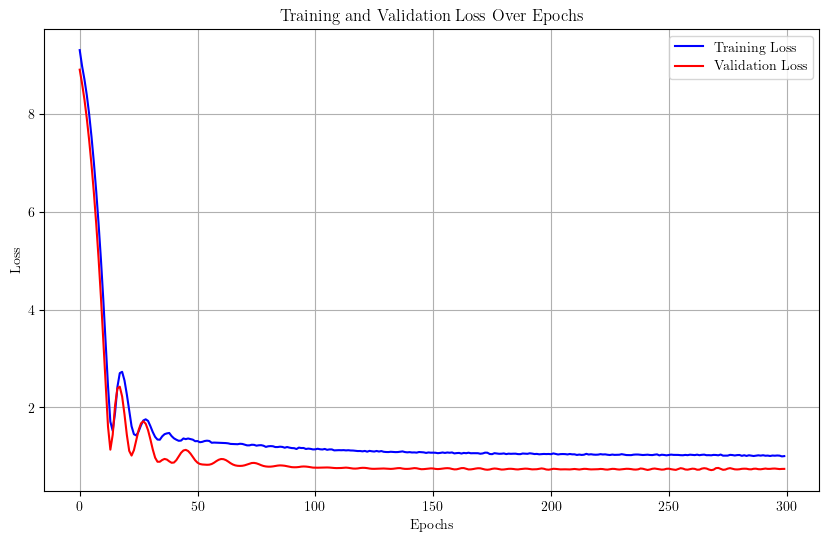

Training run 48/50 for 100% of the data...
Sample size for 100%: 14938


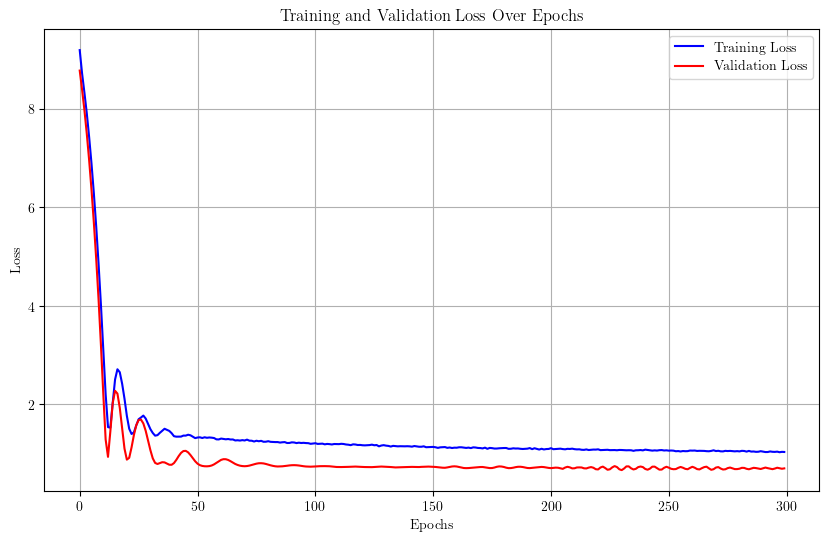

Training run 49/50 for 100% of the data...
Sample size for 100%: 14938


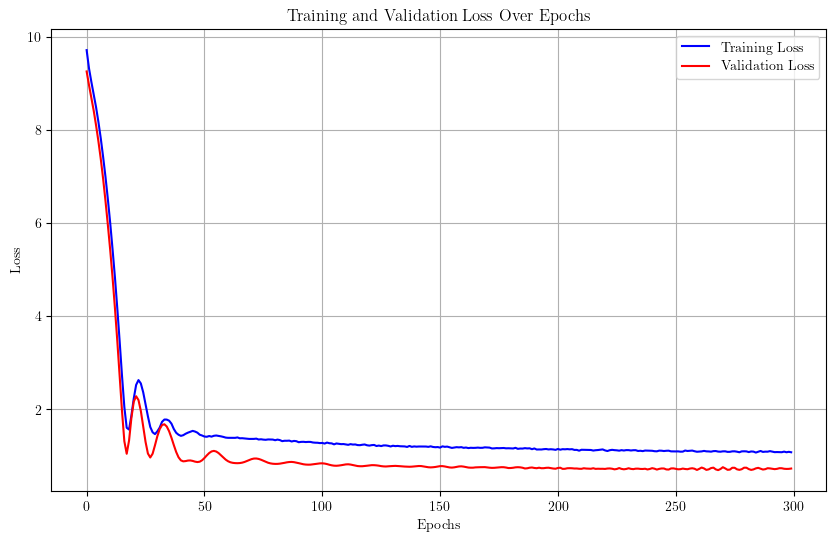

Training run 50/50 for 100% of the data...
Sample size for 100%: 14938


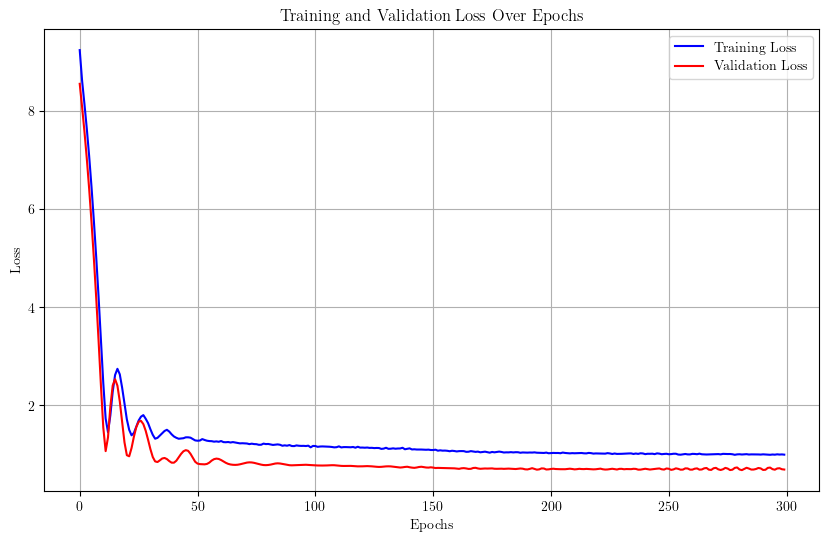

Metrics for 100% of data:
Final Metrics (Aggregated Predictions): {'mse': np.float32(6.963078), 'mae': np.float32(1.1421709), 'r2': np.float64(0.013130511045455933), 'bias': np.float32(0.50912446), 'nmad': np.float32(0.03001295), 'sigma_68': np.float32(0.03320789), 'outlier_fraction': np.float64(5.88152610441767)}
Metrics Across Runs:
mse: 6.9631 ± 1.6511
mae: 1.1422 ± 0.1552
r2: 0.0131 ± 0.0133
bias: 0.5091 ± 0.0497
nmad: 0.0300 ± 0.0014
sigma_68: 0.0332 ± 0.0021
outlier_fraction: 5.8815 ± 0.3654


In [13]:
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)

        # Standardize inputs
        #scaler = StandardScaler()
        #X_train = scaler.fit_transform(X_train)
        #X_val = scaler.transform(X_val)
        
        # Re-initialize the model for each run
        model = NNModel(input_dim=X_train.shape[1], task_type=task_type)
        
        # Train model
        trainer = ModelTrainer(model, lr=lr, epochs=epochs, task_type=task_type)
        train_losses, val_losses = trainer.train(X_train, y_train, X_val, y_val)
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
        
        plot_loss(train_losses, val_losses, epochs=epochs)
        
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        if i == 0:
            # Save and plot the redshifts
            save_and_plot_redshifts(
            true_redshifts=y_val.numpy(),
            predicted_redshifts=predictions,  
            percentage=percentage,
            modality=modality,
            parameter=parameter,
            model_name=model_name
            )
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    
    # Write results to file
    write_results_to_file(model_name,percentage, modality, parameter, final_metrics_aggregated, metrics_mean_aggregated, metrics_std_aggregated)